# Developed CNN Architecture (No Improving CNN Architecture + Bicubic Grayscale PNG + 5-Fold))

### 1.1 Libraries

In [1]:
#!pip install optuna-integration[tfkeras]

In [2]:
#!pip install plotly

In [3]:
# import plotly
# print(plotly.__version__)  # Debería mostrar la versión instalada (ej. 5.18.0)

In [7]:
%%time

import os
import optuna
import pickle
import shutil
#import plotly
import numpy as np
import pandas as pd
from PIL import Image
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Importar librerias de tensorflow
import tensorflow as tf
from tensorflow.keras.models import load_model
#from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.layers import BatchNormalization, Dropout
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

#from optuna.visualization import plot_optimization_history, plot_param_importances
from optuna.visualization.matplotlib import plot_optimization_history, plot_param_importances

#from optuna.integration import TFKerasPruningCallback
#from optuna.samplers import TPESampler
#from optuna.pruners import HyperbandPruner

from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import confusion_matrix, classification_report

CPU times: user 2.94 ms, sys: 0 ns, total: 2.94 ms
Wall time: 2.48 ms


In [8]:
!nvidia-smi

Thu Jun  5 19:18:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.107.02             Driver Version: 550.107.02     CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA RTX A5500               Off |   00000000:1D:00.0 Off |                  Off |
| 30%   45C    P8             24W /  230W |       4MiB /  24564MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [9]:
import tensorflow as tf
print(tf.config.list_physical_devices('GPU'))
print(tf.config.experimental.get_visible_devices())


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


### 1.2. Sound and Source

In [10]:
from IPython.display import Audio
import time

def sound():
    beep_07a_path = '/notebooks/beep-07a.wav'
    beep_08b_path = '/notebooks/beep-08b.wav'

    for _ in range(2):
        sound_beep_07a = Audio(beep_07a_path, autoplay=True)
        display(sound_beep_07a)
        time.sleep(0.3)
        sound_beep_08b = Audio(beep_08b_path, autoplay=True)
        display(sound_beep_08b)
        time.sleep(0.3)
sound()

### 1.3. Create a dictionary to store samples by malware families

In [11]:
source = '/notebooks/train3/'
# Inicializar un diccionario para almacenar la cantidad de muestras por familia
malware_families_train, malware_families_valid, malware_families_test, malware_families = {}, {}, {}, {}
train_data_dir = os.path.join(source, 'centum_1500/train/')
valid_data_dir = os.path.join(source, 'centum_1500/valid/')
test_data_dir = os.path.join(source, 'centum_1500/test/')
# Recorrer los directorios de las familias de malware
for familia in os.listdir(train_data_dir):
    # Comprobar si es un directorio
    if os.path.isdir(os.path.join(train_data_dir, familia)):
        # Contar la cantidad de archivos en el directorio de la familia
        cantidad_muestras_train = len(os.listdir(os.path.join(train_data_dir, familia)))
        cantidad_muestras_valid = len(os.listdir(os.path.join(valid_data_dir, familia)))
        cantidad_muestras_test = len(os.listdir(os.path.join(test_data_dir, familia)))
        # Agregar la cantidad al diccionario con el nombre de la familia como clave
        malware_families_train[familia] = cantidad_muestras_train
        malware_families_valid[familia] = cantidad_muestras_valid
        malware_families_test[familia] = cantidad_muestras_test

for d in (malware_families_train, malware_families_valid, malware_families_test):
    for key, value in d.items():
        if key in malware_families:
            malware_families[key] += value
        else:
            malware_families[key] = value

# Ordenar las familias de mayor a menor según la cantidad de muestras
sorted_families = sorted(malware_families.items(), key=lambda x: x[1], reverse=True)
# Imprimir el diccionario resultante
sorted_families

[('sfone', 1500),
 ('sillyp2p', 1500),
 ('Allaple.A', 1500),
 ('Ramnit', 1500),
 ('wabot', 1500),
 ('mira', 1500),
 ('Kelihos_ver3', 1500),
 ('ganelp', 1500),
 ('Allaple.L', 1500),
 ('wacatac', 1500),
 ('dinwod', 1500),
 ('Lollipop', 1500),
 ('berbew', 1500),
 ('small', 1500),
 ('upatre', 1500)]

### 1.3. Create a dictionary to store samples by malware families

In [12]:
%%time

def copy_malware_families(source, num_experiments, sorted_families):
    
    # Crea el directorio que contendrá el malware
    experiment_dir = os.path.join(source, "all_malware", str(num_experiments))
    os.makedirs(experiment_dir, exist_ok=True)

    # Ordenar las familias de mayor a menor según la cantidad de muestras
    #sorted_families = sorted(malware_families.items(), key=lambda x: x[1], reverse=True)

    # Crear directorios train, test, y valid del experimento
    for data_type in ['train', 'test', 'valid']:
        data_dir = os.path.join(experiment_dir, data_type)
        os.makedirs(data_dir, exist_ok=True)
        
        # Copiar las familias correspondientes
        for j in range(num_experiments):
            family_name, num_samples = sorted_families[j]
            family_dir = os.path.join(data_dir, family_name)
            os.makedirs(family_dir, exist_ok=True)
            source_dir = os.path.join(source, 'centum_1500', data_type, family_name)
            
            # Copiar las num_samples muestras de cada familia
            for filename in os.listdir(source_dir)[:num_samples]:
                source_path = os.path.join(source_dir, filename)
                dest_path = os.path.join(family_dir, filename)
                shutil.copy(source_path, dest_path)
    print("Familias de malware copiadas")
    #sound()

def delete_experiment_dir(source, num_experiments):
    experiment_dir = os.path.join(source, "all_malware", str(num_experiments))
    shutil.rmtree(experiment_dir)
    print(f"La carpeta {str(num_experiments)} fue eliminada.")

CPU times: user 5 µs, sys: 1 µs, total: 6 µs
Wall time: 17.9 µs


## 2. Convolutional Neural Network Decay Evaluation Metrics by Increase in Malware Families

### 2.1. Calculate Weights by Class

In [13]:
%%time

def weights_by_class(train_generator):
    # Calculate class weights using compute_class_weight
    class_weights = compute_class_weight(class_weight = 'balanced',
                         classes = np.unique(train_generator.classes), 
                         y = train_generator.classes)
    # Create a dictionary of class weights
    class_weight_dict = dict(enumerate(class_weights))
    # Print class weights
    print("Class Weights:", class_weight_dict)
    return class_weight_dict

CPU times: user 20 µs, sys: 6 µs, total: 26 µs
Wall time: 33.4 µs


### 2.2. Image generator (Training, validation, and testing)

In [14]:
%%time

def data_gen(source_cnn, train_data_dir, validation_data_dir, test_data_dir):
    # Settings for Data Generator
    train_datagen = ImageDataGenerator(rescale=1./255)
    validation_datagen = ImageDataGenerator(rescale=1./255)
    test_datagen = ImageDataGenerator(rescale=1./255)

    train_generator = train_datagen.flow_from_directory(
            train_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')

    validation_generator = validation_datagen.flow_from_directory(
            validation_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')

    test_generator = test_datagen.flow_from_directory(
            test_data_dir,
            target_size=(img_width, img_height),
            batch_size=batch_size,
            class_mode='categorical')
    return (train_generator, validation_generator, test_generator)

CPU times: user 11 µs, sys: 0 ns, total: 11 µs
Wall time: 15.5 µs


### 2.3. Creation of the Model Based on the Architecture
Descongelamos 5 capas de MobileNet para esta versión, pero para más adelante, version optimizada,podemos desconger 10 capas.

In [15]:
%time

def new_model(num_classes, best_params=None):
    if best_params is None:
        best_params = {
            'learning_rate': 0.001,
            'dropout_rate1': 0.4,
            'dropout_rate2': 0.3,
            'l2_reg': 0.001,
            'units_dense1': 512,
            'units_dense2': 128,
            'batch_size': 32,
            'num_dense_layers': 2,  # Nueva variable
            'units_dense3': 64,    # Nueva variable
            'dropout_rate3': 0.2,    # Nueva variable
            'unfreeze_layers': 5  # Valor por defecto
        }
    
    base_model = MobileNet(weights='imagenet',
                         include_top=False,
                         input_shape=(img_width, img_height, 3))

    # Congelar todas las capas primero
    for layer in base_model.layers:
        layer.trainable = False

    # Descongelar las últimas N capas según best_params
    if 'unfreeze_layers' in best_params:
        num_layers_to_unfreeze = best_params['unfreeze_layers']
        # Asegurarnos de no exceder el número de capas del modelo
        num_layers_to_unfreeze = min(num_layers_to_unfreeze, len(base_model.layers))
        
        for layer in base_model.layers[-num_layers_to_unfreeze:]:
            layer.trainable = True
    else:
        # Valor por defecto si no está en best_params (últimas 5 capas)
        for layer in base_model.layers[-5:]:
            layer.trainable = True

    x = base_model.output
    x = layers.GlobalAveragePooling2D()(x)
    
    # Primera capa densa
    x = layers.Dense(best_params['units_dense1'], activation='relu', 
                    kernel_regularizer=l2(best_params['l2_reg']))(x)
    x = BatchNormalization()(x)
    x = Dropout(best_params['dropout_rate1'])(x)
    
    # Segunda capa densa
    x = layers.Dense(best_params['units_dense2'], activation='relu', 
                    kernel_regularizer=l2(best_params['l2_reg']))(x)
    x = Dropout(best_params['dropout_rate2'])(x)
    
    # Capas adicionales condicionales
    if best_params.get('num_dense_layers', 2) >= 3:
        x = layers.Dense(best_params['units_dense3'], activation='relu',
                        kernel_regularizer=l2(best_params['l2_reg']))(x)
        x = Dropout(best_params['dropout_rate3'])(x)
    
    predictions = layers.Dense(num_classes, activation='softmax')(x)

    model = models.Model(inputs=base_model.input, outputs=predictions)
    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=best_params['learning_rate']),
                loss='categorical_crossentropy',
                metrics=['accuracy'])
    
    # Calculate the total # parameters
    total_params = model.count_params()
    trainable_params = sum([tf.keras.backend.count_params(w) for w in model.trainable_weights])
    non_trainable_params = total_params - trainable_params
    # Print request info paramers
    print("Total params: {}".format(total_params))
    print("Trainable params: {}".format(trainable_params))
    print("Non-trainable params: {}".format(non_trainable_params))
    
    return model

CPU times: user 3 µs, sys: 1 µs, total: 4 µs
Wall time: 7.87 µs


### 2.4. Evaluate the model and graphs

#### 2.4.1. Get the accuracy and log loss of the model (Train, Validation and Test)

In [16]:
%%time

def prediction(model, train_generator, validation_generator, test_generator):
    # Obtener la precisión y la pérdida en el conjunto de datos de entrenamiento
    train_loss, train_acc = model.evaluate(train_generator, verbose=1)
    print('Train Accuracy:', train_acc)
    print('Train Log Loss:', train_loss)

    # Obtener la precisión y la pérdida en el conjunto de datos de validación
    val_loss, val_acc = model.evaluate(validation_generator, verbose=1)
    print('Validation Accuracy:', val_acc)
    print('Validation Log Loss:', val_loss)

    # Obtener la precisión y la pérdida en el conjunto de datos de prueba
    test_loss, test_acc = model.evaluate(test_generator, verbose=1)
    print('Test Accuracy:', test_acc)
    print('Test Log Loss:', test_loss)
    
    # Return test_loss and test_acc
    return(test_acc, test_loss)

CPU times: user 37 µs, sys: 0 ns, total: 37 µs
Wall time: 54.1 µs


#### 2.4.2. Precision, Recall, Confusion Matrix and  AUC

In [17]:
%%time

def confu_matrix(model, test_generator):
# Get the total number of samples in the test builder
    total_samples = len(test_generator)
    print(f"Test labels: {test_generator.class_indices}")

    # Get test builder batch size
    batch_size = test_generator.batch_size

    # Create lists to store the actual and predicted labels
    true_labels = []
    predicted_labels = []

    # Iterate over all batches in the test builder
    for batch_index in range(total_samples):
        # Get a batch of data from the test builder
        batch_images, batch_labels = test_generator[batch_index]

        # Make predictions on the current batch
        batch_predictions = model.predict_on_batch(batch_images)

        # Get the actual labels of the current batch
        true_labels.extend(np.argmax(batch_labels, axis=1))

        # Get the predicted labels of the current batch
        predicted_labels.extend(np.argmax(batch_predictions, axis=1))

    # Convert lists of labels to numpy arrays
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)

    # Calculate the confusion matrix
    confusion_mtx = confusion_matrix(true_labels, predicted_labels)

    print("\nMatriz de Confusión:")
    print(confusion_mtx)
    print(f"True labels: {len(true_labels)}")
    print(f"Predicted labels: len(predicted_labels)")

    # Get the classification report
    class_report = classification_report(true_labels, predicted_labels)

    # Print the classification report
    print('\nClassification report:')
    print(class_report)

    # Get the predictions for the test dataset
    y_test_pred = model.predict(test_generator)

    # Get the AUC
    #test_auc = roc_auc_score(true_labels, y_test_pred, multi_class='ovr')
    #print('AUC:', test_auc)
    
    # Normalize the confusion matrix
    cm_norm = confusion_mtx.astype('float') / confusion_mtx.sum(axis=1)[:, np.newaxis]

    # Set up plot with 12x12 inch figure
    plt.figure(figsize=(12, 12))
    sns.heatmap(cm_norm, annot=True, cmap='Blues', fmt='.2f')
    plt.show()
    
    crd = classification_report(true_labels, predicted_labels, output_dict=True)
    
    return crd['macro avg']['precision'], crd['macro avg']['recall'], crd['macro avg']['f1-score']
    

CPU times: user 4 µs, sys: 1 µs, total: 5 µs
Wall time: 8.58 µs


## 3. Decay Evaluation Metrics by Increase in Malware Families

### 3.1. Settings (Configurar)

In [18]:
%%time

# Experiment dir 
source = '/notebooks/train3/'

# Cambiar el nombre del modelo, empieza con ´fusion_'
nombre_modelo = 'fusion_'+'MobileNet_tf_optunav2'
save_model = source + 'layer_contribution/MobileNet_tf_optuna/'
os.makedirs(save_model, exist_ok=True)

# Resize all images to 224x224
img_width, img_height = 224, 224

# Configuring the hyperparameters
batch_size = 32
#num_epochs = 50
learning_rate = 0.0001
num_folds = 5

test_acc_list_all = []
test_loss_list_all = []
precision_list_all = []
recall_list_all = []
f1_score_list_all = []

sound()

CPU times: user 18.6 ms, sys: 0 ns, total: 18.6 ms
Wall time: 1.22 s


In [30]:
%time

def objective(trial, num_classes, source):
    # Hiperparámetros a optimizar
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 1e-5, 1e-2, log=True),
        'dropout_rate1': trial.suggest_float('dropout_rate1', 0.2, 0.6),
        'dropout_rate2': trial.suggest_float('dropout_rate2', 0.1, 0.5),
        'l2_reg': trial.suggest_float('l2_reg', 1e-5, 1e-2, log=True),
        'units_dense1': trial.suggest_categorical('units_dense1', [256, 512, 1024]),
        'units_dense2': trial.suggest_categorical('units_dense2', [64, 128, 256]),
        'batch_size': trial.suggest_categorical('batch_size', [16, 32, 64]),
        'epochs': trial.suggest_int('epochs', 25, 50),
        'num_dense_layers': trial.suggest_int('num_dense_layers', 2, 3),
        'unfreeze_layers': trial.suggest_int('unfreeze_layers', 5, 15),
        'early_stopping_patience': trial.suggest_int('early_stopping_patience', 10, 20),
        'reduce_lr_patience': trial.suggest_int('reduce_lr_patience', 8, 15)
    }
    
    # Añadir parámetros condicionales para la tercera capa
    if params['num_dense_layers'] >= 3:
        params['units_dense3'] = trial.suggest_categorical('units_dense3', [32, 64, 128])
        params['dropout_rate3'] = trial.suggest_float('dropout_rate3', 0.1, 0.4)
    
    # Configurar generadores de datos (ajusta según tu implementación)
    source2 = os.path.join(source, 'all_malware', str(num_classes))
    train_data_dir = source2 + '/train/'
    validation_data_dir = source2 + '/valid/'
    test_data_dir = source2 + '/test/'
    
    train_generator, validation_generator, _ = data_gen(source2, train_data_dir, validation_data_dir, test_data_dir)
    
    # Construir modelo
    model = new_model(num_classes, params)
    
    # Callbacks
    callbacks = [
        EarlyStopping(
            monitor='val_loss',
            patience=params['early_stopping_patience'],
            restore_best_weights=True
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.2,
            patience=params['reduce_lr_patience'],
            min_lr=1e-6
        ),
        #optuna.integration.TFKerasPruningCallback(trial, 'val_accuracy')
    ]
    
    # Entrenamiento
    history = model.fit(
        train_generator,
        steps_per_epoch=train_generator.samples // params['batch_size'],
        epochs=params['epochs'],
        validation_data=validation_generator,
        validation_steps=validation_generator.samples // params['batch_size'],
        callbacks=callbacks,
        verbose=0
    )
    
    # Retornar ambos objetivos: maximizar accuracy y minimizar loss
    return max(history.history['val_accuracy']), min(history.history['val_loss'])

def optimize_hyperparameters(num_classes, source, n_trials=50):
    # Crear estudio multi-objetivo
    study = optuna.create_study(
        directions=['maximize', 'minimize'],  # Primero accuracy, luego loss
        #sampler=TPESampler(),
        #pruner=HyperbandPruner()
    )
    
    # Ejecutar optimización
    study.optimize(
        lambda trial: objective(trial, num_classes, source),
        n_trials=n_trials,
        #timeout=3600 * 6  # 6 horas de timeout opcional
    )
    
    # Visualizaciones
    print("Mejores trials para cada objetivo:")
    for i, best_trial in enumerate(study.best_trials):
        print(f"  Trial {best_trial.number}:")
        print(f"    val_accuracy: {best_trial.values[0]:.4f}")
        print(f"    val_loss: {best_trial.values[1]:.4f}")
        print("    Parámetros:", best_trial.params)
    
    # Crear figura unificada
    plt.figure(figsize=(21, 6))
    
    # Gráfico 1: Optimization History (Accuracy)
    plt.subplot(1, 3, 1)
    plot_optimization_history(
        study,
        target=lambda trial: trial.values[0],
        target_name="val_accuracy"
    )
    plt.title("Optimization History (Accuracy)")
    plt.tight_layout()
    
    # Gráfico 2: Optimization History (Loss)
    plt.subplot(1, 3, 2)
    plot_optimization_history(
        study,
        target=lambda trial: trial.values[1],
        target_name="val_loss"
    )
    plt.title("Optimization History (Loss)")
    plt.tight_layout()
    
    # Gráfico 3: Parameter Importances (solo si hay suficientes trials)
    plt.subplot(1, 3, 3)
    if len(study.trials) > 1:
        try:
            plot_param_importances(
                study,
                target=lambda trial: trial.values[0],
                target_name="val_accuracy"
            )
            plt.title("Parameter Importances (Accuracy)")
        except ValueError as e:
            plt.text(0.5, 0.5, "Not enough trials\nfor importance analysis", 
                    ha='center', va='center')
            plt.title("Parameter Importances\n(Not available)")
    else:
        plt.text(0.5, 0.5, "Need at least 2 trials\nfor importance analysis", 
                ha='center', va='center')
        plt.title("Parameter Importances\n(Not available)")
    
    plt.tight_layout()
    plt.show()
    
    best_trial = study.best_trials[0]
    
    return best_trial.params

CPU times: user 57 µs, sys: 7 µs, total: 64 µs
Wall time: 134 µs


In [31]:
%%time

def exp(num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all):
    # Copiar las familias a ser clasificadas
    copy_malware_families(source, num_classes, sorted_families)

    # Optimize hyperparams with optina
    best_params = optimize_hyperparameters(num_classes, source, n_trials=10)
    
    ### SETTINGS ###
    source2 = os.path.join(source, 'all_malware',str(num_classes))
    print(f"source2: {source2}")
    name_save_model = nombre_modelo + str(num_classes)
    print(f"name_save_model: {name_save_model}")
    
    train_data_dir = source2 + '/train/'
    validation_data_dir = source2 + '/valid/'
    test_data_dir = source2 + '/test/'

    # Settings for Data Generator
    train_generator, validation_generator, test_generator = data_gen(source2, train_data_dir, 
                                                                     validation_data_dir, test_data_dir)

    # Print the familias to be classified
    print("Lista de clases de malware a ser analizadas:")
    source_dir = os.path.join(source2, 'train/')
    for  dir in os.listdir(source_dir):
        print("- "+dir)

    # Get the number of epochs and batch_size from best_params
    num_epochs = best_params['epochs']
    batch_size = best_params['batch_size'] 

    # Calculate class weights using compute_class_weight
    #class_weight_dict = weights_by_class(train_generator)

    # Configurar callbacks con los mejores parámetros
    early_stopping = EarlyStopping(
        monitor='val_accuracy', 
        patience=best_params.get('early_stopping_patience', 15),
        restore_best_weights=True
    )

    # Calculate the callback ReduceLROnPlateau with Optuna Best Params
    reduce_lr = ReduceLROnPlateau(
        factor=0.2,
        patience=best_params.get('reduce_lr_patience', 10),
        min_lr=1e-6
    )

    # Defines the number of folds for cross validation
    num_folds = 5

    # Split the data set into folds
    skf = StratifiedKFold(n_splits=num_folds, shuffle=True, random_state=42)

    # Lists to store the metrics of each fold
    fold_train_histories, fold_val_histories = [], []
    test_loss_list, test_acc_list = [], []
    precision_list, recall_list, f1_score_list = [], [], []

    for fold_idx, (train_index, val_index) in enumerate(skf.split(train_generator.filenames, train_generator.classes)):
        print('')
        print('=' * 100)
        print(f'TRAINING AND EVALUATING FOLD {fold_idx + 1}/{num_folds}...\n')

        # Create and Compile MobileNet model with an Optuna: optimizer and learning rate
        model = new_model(num_classes, best_params)

        # Training the malware classification layer with the ReduceLROnPlateau callback
        history_model = model.fit(
            train_generator,
            steps_per_epoch=train_generator.samples // batch_size,
            epochs=num_epochs,
            validation_data=validation_generator,
            validation_steps=validation_generator.samples // batch_size,
            #class_weight=class_weight_dict,
            #verbose=0,
            callbacks=[early_stopping, reduce_lr],
        )

        sound()

        ##### SAVE MODEL, HISTORY AND METRICS #####
        #model.save(save_model+name_save_model+'_'+str(fold_idx + 1)+'.h5')
        # Save history
        with open(save_model+'history_'+name_save_model+'_'+str(fold_idx + 1)+'.pkl', 'wb') as file:
            pickle.dump(history_model.history, file)
        print("Model and History saved...")

        # Store training and validation metrics for this fold
        fold_train_histories.append(history_model.history['accuracy'])
        fold_val_histories.append(history_model.history['val_accuracy'])

        # Store Metrics
        test_acc, test_loss = prediction(model, train_generator, validation_generator, test_generator)
        test_acc_list.append(test_acc)
        test_loss_list.append(test_loss)
        precision, recall, f1_score = confu_matrix(model, test_generator)
        precision_list.append(precision)
        recall_list.append(recall)
        f1_score_list.append(f1_score)

    # Calcula el promedio de las métricas de todos los pliegues
    avg_train_accuracy = sum([max(hist) for hist in fold_train_histories]) / num_folds
    avg_val_accuracy = sum([max(hist) for hist in fold_val_histories]) / num_folds
    # Imprime el promedio de las métricas de entrenamiento y validación
    print(f'Average training accuracy in {num_folds}-fold: {avg_train_accuracy}')
    print(f'Average validation precision in {num_folds}-fold: {avg_val_accuracy}')

    print("\nTest Metrics")
    print(f"test_acc_list: {test_acc_list}")
    print(f'Average Test Accuracy with {num_folds}-fold: {sum(test_acc_list)/len(test_acc_list)}')
    print(f"test_loss_list: {test_loss_list}")
    print(f'Average Test Log Loss with {num_folds}-fold: {sum(test_loss_list)/len(test_loss_list)}')
    print(f'Precision List: {precision_list}')
    print(f'Average Precision List with {num_folds}-fold: {sum(precision_list)/len(precision_list)}')
    print(f'Recall List: {recall_list}')
    print(f'Average Recall List with {num_folds}-fold: {sum(recall_list)/len(recall_list)}')
    print(f'F1 Score List: {f1_score_list}')
    print(f'Average F1 Score List with {num_folds}-fold: {sum(f1_score_list)/len(f1_score_list)}')

    print("\nMetrics List Store")
    test_acc_list_all.append(sum(test_acc_list)/len(test_acc_list))
    print(f'\ntest_acc_list_all = {test_acc_list_all}')
    test_loss_list_all.append(sum(test_loss_list)/len(test_loss_list))
    print(f'test_loss_list_all = {test_loss_list_all}')
    precission_list_all.append(sum(precision_list)/len(precision_list))
    print(f'precision_list_all = {precission_list_all}')
    recall_list_all.append(sum(recall_list)/len(recall_list))
    print(f'recall_list_all = {recall_list_all}')
    f1_score_list_all.append(sum(f1_score_list)/len(f1_score_list))
    print(f'f1_score_list_all = {f1_score_list_all}')

    # Eliminamos el directorio del experimento
    delete_experiment_dir(source, num_classes)

    return test_acc_list_all, test_loss_list_all, precission_list_all, recall_list_all, f1_score_list_all


CPU times: user 19 µs, sys: 2 µs, total: 21 µs
Wall time: 38.4 µs


## 4. Experiments

[I 2025-06-05 19:35:25,853] A new study created in memory with name: no-name-351176c1-c004-41a5-9427-c36905993d25


Familias de malware copiadas
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3525442
Trainable params: 1357954
Non-trainable params: 2167488


[I 2025-06-05 19:45:06,551] Trial 0 finished with values: [1.0, 0.0009259795187972486] and parameters: {'learning_rate': 0.001066611702974631, 'dropout_rate1': 0.42304386514266823, 'dropout_rate2': 0.27493371700671865, 'l2_reg': 0.005738779266830652, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 20, 'reduce_lr_patience': 9}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 4356738
Trainable params: 2719682
Non-trainable params: 1637056


[I 2025-06-05 19:53:29,676] Trial 1 finished with values: [1.0, 0.0067670815624296665] and parameters: {'learning_rate': 0.006094300401866298, 'dropout_rate1': 0.2135141808393363, 'dropout_rate2': 0.22137594812013048, 'l2_reg': 1.1564347784372271e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 32, 'epochs': 50, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 14, 'reduce_lr_patience': 11, 'units_dense3': 128, 'dropout_rate3': 0.1904898596063454}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3821634
Trainable params: 2179970
Non-trainable params: 1641664


[I 2025-06-05 20:00:53,515] Trial 2 finished with values: [1.0, 0.04360772296786308] and parameters: {'learning_rate': 0.00015076256122453956, 'dropout_rate1': 0.5647611715147756, 'dropout_rate2': 0.32996146399804, 'l2_reg': 5.699195579438984e-05, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 32, 'epochs': 32, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 19, 'reduce_lr_patience': 14}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 4545474
Trainable params: 2376450
Non-trainable params: 2169024


[I 2025-06-05 20:07:56,449] Trial 3 finished with values: [1.0, 0.6857473254203796] and parameters: {'learning_rate': 0.00010872996130166901, 'dropout_rate1': 0.4424175281189221, 'dropout_rate2': 0.4920997644635784, 'l2_reg': 0.0012717010873152924, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 28, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 13}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 4414018
Trainable params: 2244994
Non-trainable params: 2169024


[I 2025-06-05 20:08:25,656] Trial 4 finished with values: [0.995555579662323, 0.9462552070617676] and parameters: {'learning_rate': 0.006572415157873933, 'dropout_rate1': 0.46760885303081684, 'dropout_rate2': 0.39447333616638436, 'l2_reg': 0.0002567308448486957, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 26, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 15}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3903618
Trainable params: 1726402
Non-trainable params: 2177216


[I 2025-06-05 20:18:37,478] Trial 5 finished with values: [1.0, 3.171165943145752] and parameters: {'learning_rate': 2.2092341368973302e-05, 'dropout_rate1': 0.5227629178128481, 'dropout_rate2': 0.11028368237286697, 'l2_reg': 0.007525831217579613, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 14, 'reduce_lr_patience': 9, 'units_dense3': 64, 'dropout_rate3': 0.29661898100033557}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3558594
Trainable params: 1381890
Non-trainable params: 2176704


[I 2025-06-05 20:19:02,173] Trial 6 finished with values: [1.0, 0.4512490928173065] and parameters: {'learning_rate': 0.00017559867471619988, 'dropout_rate1': 0.5955367513963722, 'dropout_rate2': 0.405075613654004, 'l2_reg': 0.0005414701940463961, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 15, 'reduce_lr_patience': 15}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3887554
Trainable params: 2245890
Non-trainable params: 1641664


[I 2025-06-05 20:19:27,736] Trial 7 finished with values: [0.5377777814865112, 8.321114540100098] and parameters: {'learning_rate': 0.0067706868848220235, 'dropout_rate1': 0.3301167477462171, 'dropout_rate2': 0.48861039445954, 'l2_reg': 0.006782931930718239, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 35, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 13}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3558594
Trainable params: 1917442
Non-trainable params: 1641152


[I 2025-06-05 20:29:10,474] Trial 8 finished with values: [1.0, 0.9758772253990173] and parameters: {'learning_rate': 2.2182844362990895e-05, 'dropout_rate1': 0.4143323907355982, 'dropout_rate2': 0.2827069662718562, 'l2_reg': 0.005736776342552045, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 32, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 17, 'reduce_lr_patience': 13}.


Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Total params: 3895330
Trainable params: 2254690
Non-trainable params: 1640640


[I 2025-06-05 20:29:40,443] Trial 9 finished with values: [0.9933333396911621, 2.614084243774414] and parameters: {'learning_rate': 0.0003310230654808639, 'dropout_rate1': 0.4529642111854055, 'dropout_rate2': 0.11991247639975411, 'l2_reg': 0.002711028406578588, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 48, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 10, 'reduce_lr_patience': 13, 'units_dense3': 32, 'dropout_rate3': 0.1456856714603782}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 1.0000
    val_loss: 0.0009
    Parámetros: {'learning_rate': 0.001066611702974631, 'dropout_rate1': 0.42304386514266823, 'dropout_rate2': 0.27493371700671865, 'l2_reg': 0.005738779266830652, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 20, 'reduce_lr_patience': 9}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


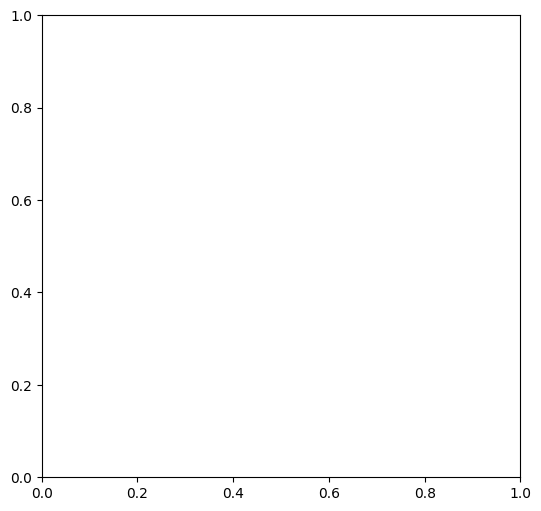

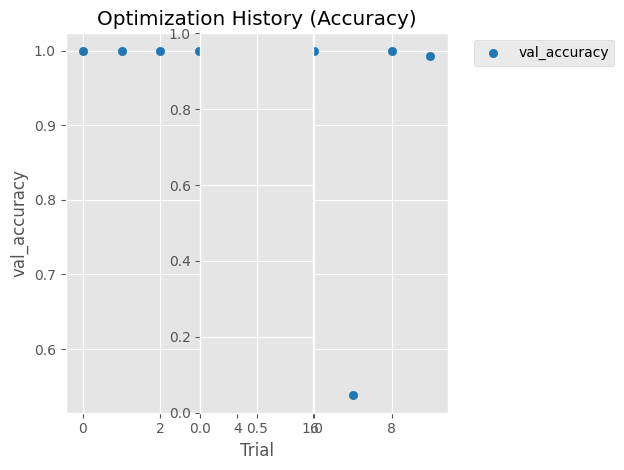

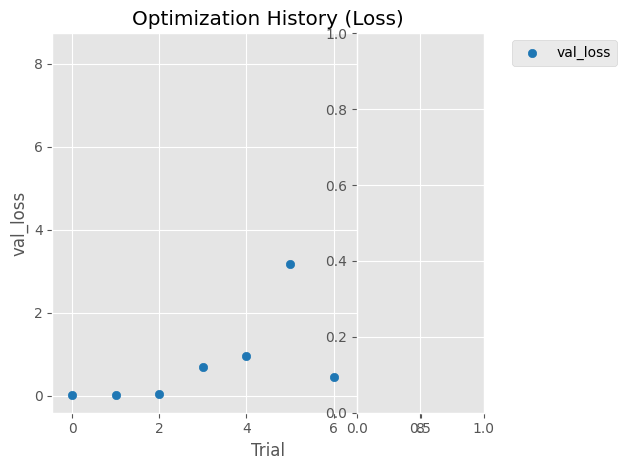

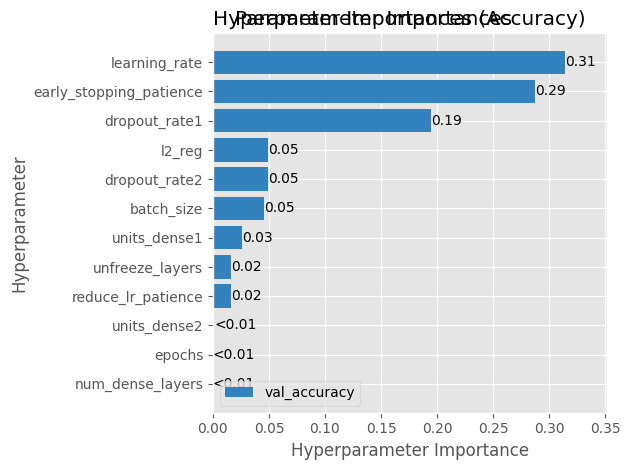

source2: /notebooks/train3/all_malware/2
name_save_model: fusion_MobileNet_tf_optunav22
Found 2100 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Found 450 images belonging to 2 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3525442
Trainable params: 1357954
Non-trainable params: 2167488
Epoch 1/48
65/65 [==============================] - 27s 227ms/step - loss: 2.3661 - accuracy: 0.9884 - val_loss: 1.4899 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 2/48
65/65 [==============================] - 12s 183ms/step - loss: 1.0608 - accuracy: 0.9976 - val_loss: 0.7342 - val_accuracy: 0.9955 - lr: 0.0011
Epoch 3/48
65/65 [==============================] - 12s 180ms/step - loss: 0.5316 - accuracy: 0.9995 - val_loss: 0.3900 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 4/48
65/65 [==============================] - 12s 179ms/step - loss: 0.2945 - accuracy: 1.0000 - val_loss: 0.2580 - val_accuracy: 0.98

Model and History saved...
66/66 [==============================] - 10s 137ms/step - loss: 0.1329 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.13288146257400513
15/15 [==============================] - 3s 130ms/step - loss: 0.1351 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.13505949079990387
15/15 [==============================] - 3s 133ms/step - loss: 0.1330 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.13302147388458252
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450

15/15 [============================

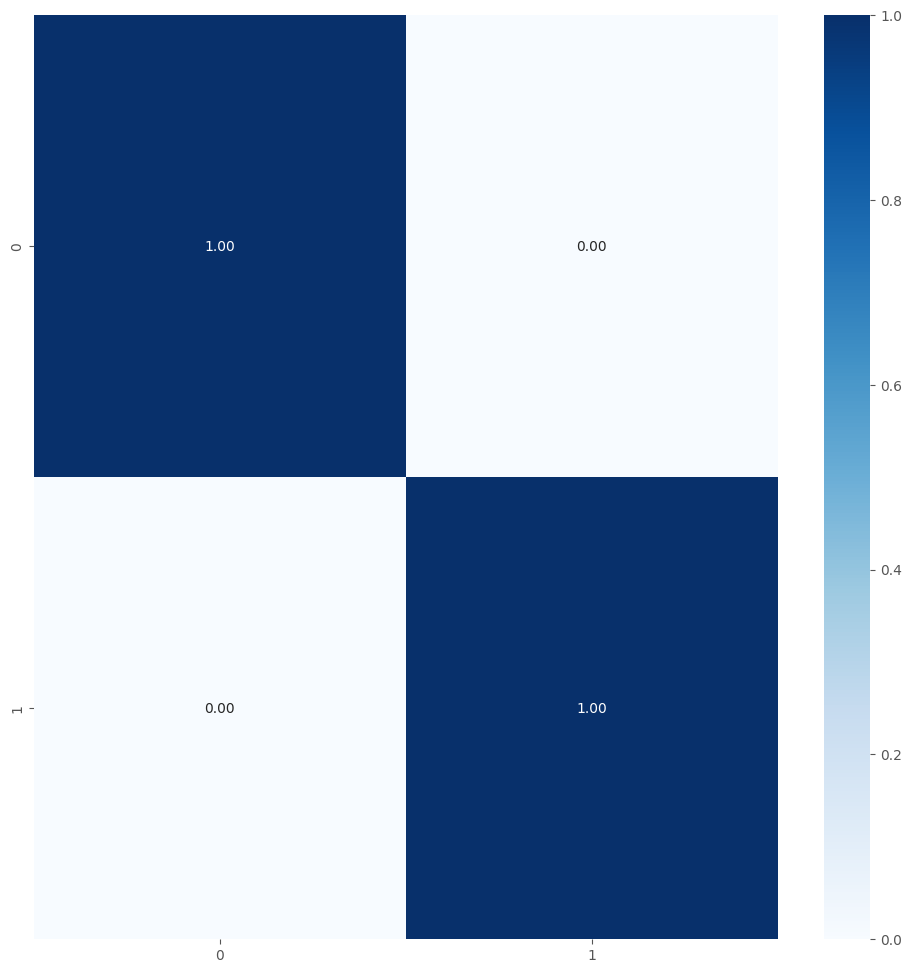


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3525442
Trainable params: 1357954
Non-trainable params: 2167488
Epoch 1/48
65/65 [==============================] - 26s 217ms/step - loss: 2.4369 - accuracy: 0.9869 - val_loss: 1.5994 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 2/48
65/65 [==============================] - 12s 178ms/step - loss: 1.1521 - accuracy: 0.9981 - val_loss: 0.8027 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 3/48
65/65 [==============================] - 11s 164ms/step - loss: 0.5922 - accuracy: 0.9990 - val_loss: 0.4278 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 4/48
65/65 [==============================] - 12s 179ms/step - loss: 0.3244 - accuracy: 0.9995 - val_loss: 0.2449 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 5/48
65/65 [==============================] - 11s 173ms/step - loss: 0.1822 - accuracy: 1.0000 - val_loss: 0.1497 - val_accuracy: 0.9955 - lr: 0.0011
Epoch 6/48
65/65 [==============================] - 13s 194ms/step - loss: 0.1051 - accuracy: 1.0000 - v

Model and History saved...
66/66 [==============================] - 10s 138ms/step - loss: 0.8011 - accuracy: 0.9995
Train Accuracy: 0.9995238184928894
Train Log Loss: 0.8011143803596497
15/15 [==============================] - 2s 135ms/step - loss: 0.8026 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.802641749382019
15/15 [==============================] - 2s 134ms/step - loss: 0.8033 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.8032533526420593
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[224   1]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450

15/15 [==

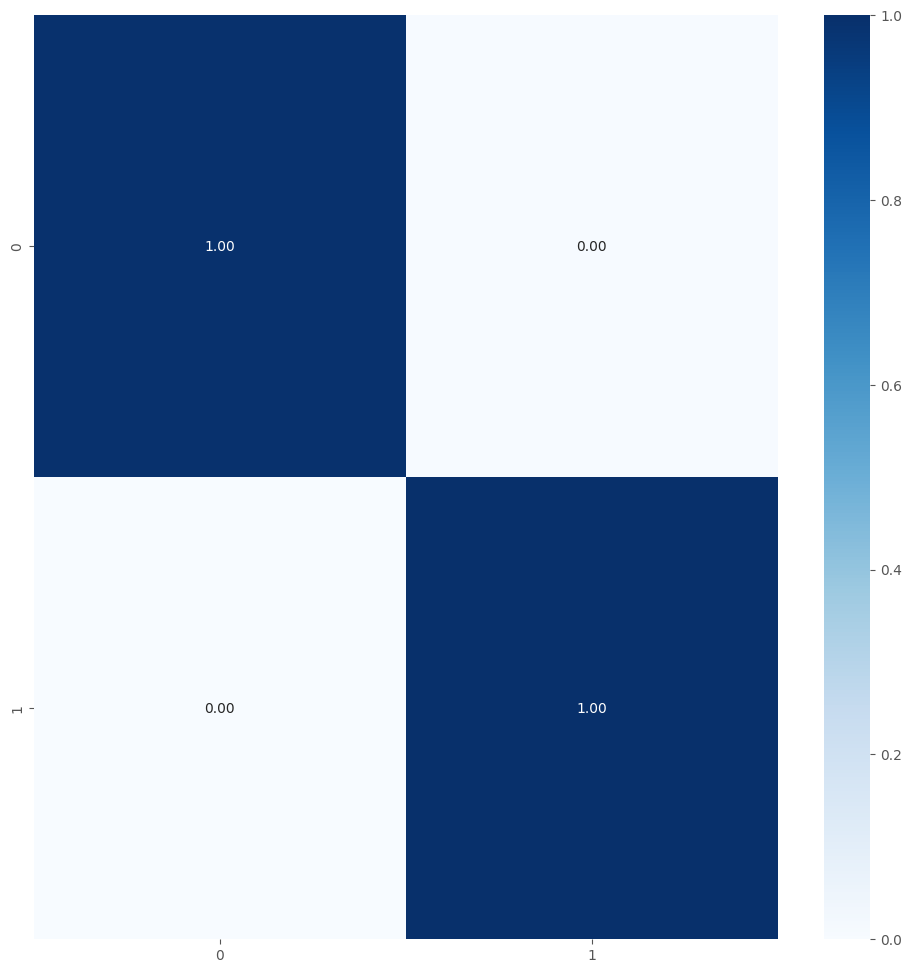


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3525442
Trainable params: 1357954
Non-trainable params: 2167488
Epoch 1/48
65/65 [==============================] - 28s 219ms/step - loss: 2.5093 - accuracy: 0.9879 - val_loss: 1.6974 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 2/48
65/65 [==============================] - 12s 184ms/step - loss: 1.2320 - accuracy: 0.9985 - val_loss: 0.8632 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 3/48
65/65 [==============================] - 12s 185ms/step - loss: 0.6411 - accuracy: 1.0000 - val_loss: 0.4662 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 4/48
65/65 [==============================] - 12s 185ms/step - loss: 0.3528 - accuracy: 1.0000 - val_loss: 0.2753 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 5/48
65/65 [==============================] - 13s 197ms/step - loss: 0.2138 - accuracy: 1.0000 - val_loss: 0.1653 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 6/48
65/65 [==============================] - 12s 187ms/step - loss: 0.1390 - accuracy: 0.9995 - v

Model and History saved...
66/66 [==============================] - 10s 132ms/step - loss: 0.4643 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.4643057584762573
15/15 [==============================] - 2s 118ms/step - loss: 0.4662 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.466151624917984
15/15 [==============================] - 3s 137ms/step - loss: 0.4640 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.46404391527175903
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450

15/15 [==============================]

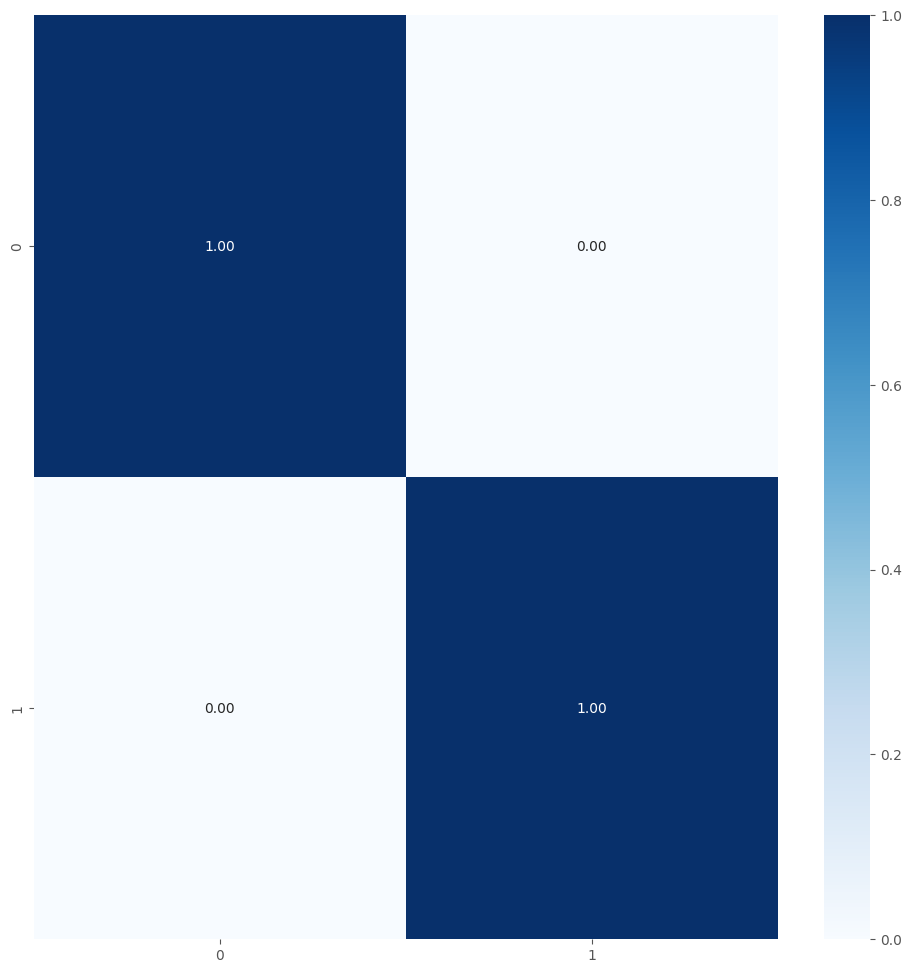


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3525442
Trainable params: 1357954
Non-trainable params: 2167488
Epoch 1/48
65/65 [==============================] - 25s 220ms/step - loss: 2.4250 - accuracy: 0.9923 - val_loss: 1.5962 - val_accuracy: 0.9955 - lr: 0.0011
Epoch 2/48
65/65 [==============================] - 11s 169ms/step - loss: 1.0891 - accuracy: 0.9995 - val_loss: 0.7260 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 3/48
65/65 [==============================] - 11s 169ms/step - loss: 0.5326 - accuracy: 0.9990 - val_loss: 0.3783 - val_accuracy: 0.9955 - lr: 0.0011
Epoch 4/48
65/65 [==============================] - 12s 185ms/step - loss: 0.2943 - accuracy: 0.9995 - val_loss: 0.2154 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 5/48
65/65 [==============================] - 12s 175ms/step - loss: 0.1611 - accuracy: 1.0000 - val_loss: 0.1223 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 6/48
65/65 [==============================] - 12s 181ms/step - loss: 0.0902 - accuracy: 1.0000 - v

Model and History saved...
66/66 [==============================] - 9s 135ms/step - loss: 0.2149 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.21494928002357483
15/15 [==============================] - 2s 131ms/step - loss: 0.2154 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.21536056697368622
15/15 [==============================] - 2s 125ms/step - loss: 0.2152 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.2151821106672287
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450

15/15 [==============================

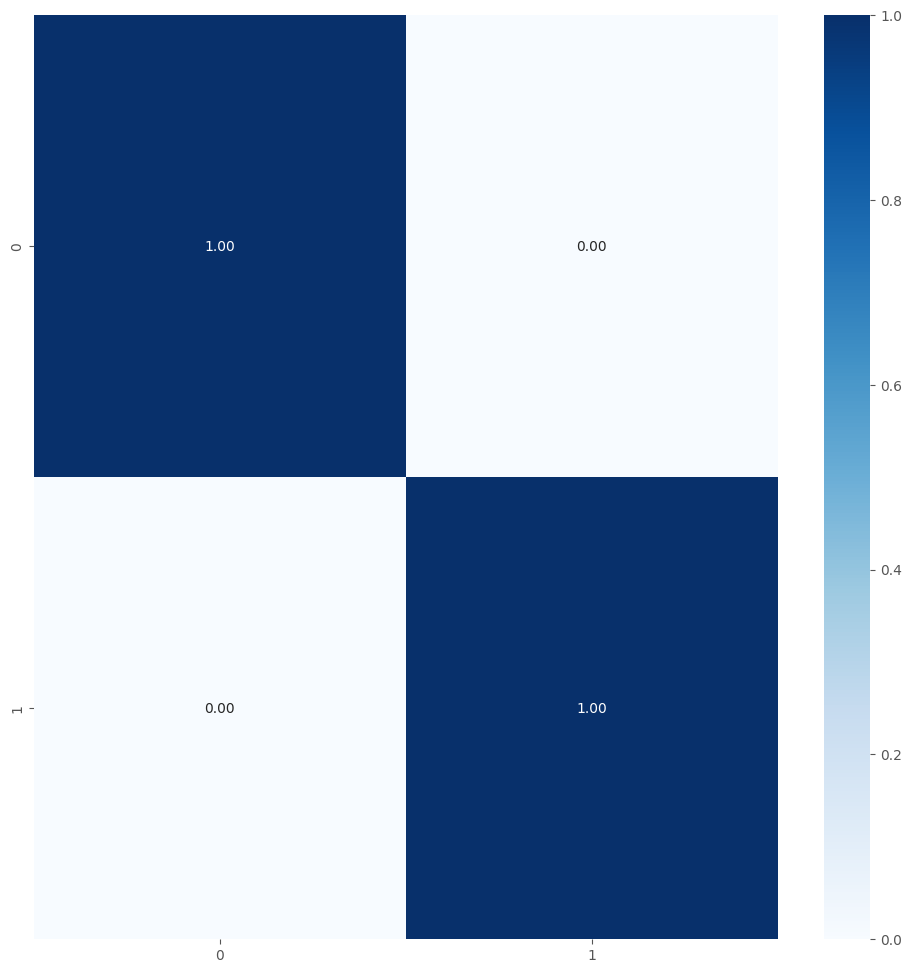


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3525442
Trainable params: 1357954
Non-trainable params: 2167488
Epoch 1/48
65/65 [==============================] - 21s 159ms/step - loss: 2.3504 - accuracy: 0.9840 - val_loss: 1.4827 - val_accuracy: 0.9978 - lr: 0.0011
Epoch 2/48
65/65 [==============================] - 9s 134ms/step - loss: 1.0484 - accuracy: 0.9990 - val_loss: 0.7431 - val_accuracy: 0.9933 - lr: 0.0011
Epoch 3/48
65/65 [==============================] - 9s 134ms/step - loss: 0.5299 - accuracy: 1.0000 - val_loss: 0.3917 - val_accuracy: 0.9955 - lr: 0.0011
Epoch 4/48
65/65 [==============================] - 10s 151ms/step - loss: 0.2819 - accuracy: 1.0000 - val_loss: 0.2176 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 5/48
65/65 [==============================] - 11s 165ms/step - loss: 0.1722 - accuracy: 0.9985 - val_loss: 0.1619 - val_accuracy: 1.0000 - lr: 0.0011
Epoch 6/48
65/65 [==============================] - 6s 88ms/step - loss: 0.1365 - accuracy: 0.9995 - val_l

Model and History saved...
66/66 [==============================] - 8s 126ms/step - loss: 0.2151 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.21507708728313446
15/15 [==============================] - 2s 114ms/step - loss: 0.2176 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.21755021810531616
15/15 [==============================] - 2s 120ms/step - loss: 0.2153 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.21531355381011963
Test labels: {'sfone': 0, 'sillyp2p': 1}

Matriz de Confusión:
[[225   0]
 [  0 225]]
True labels: 450
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225

    accuracy                           1.00       450
   macro avg       1.00      1.00      1.00       450
weighted avg       1.00      1.00      1.00       450

15/15 [=============================

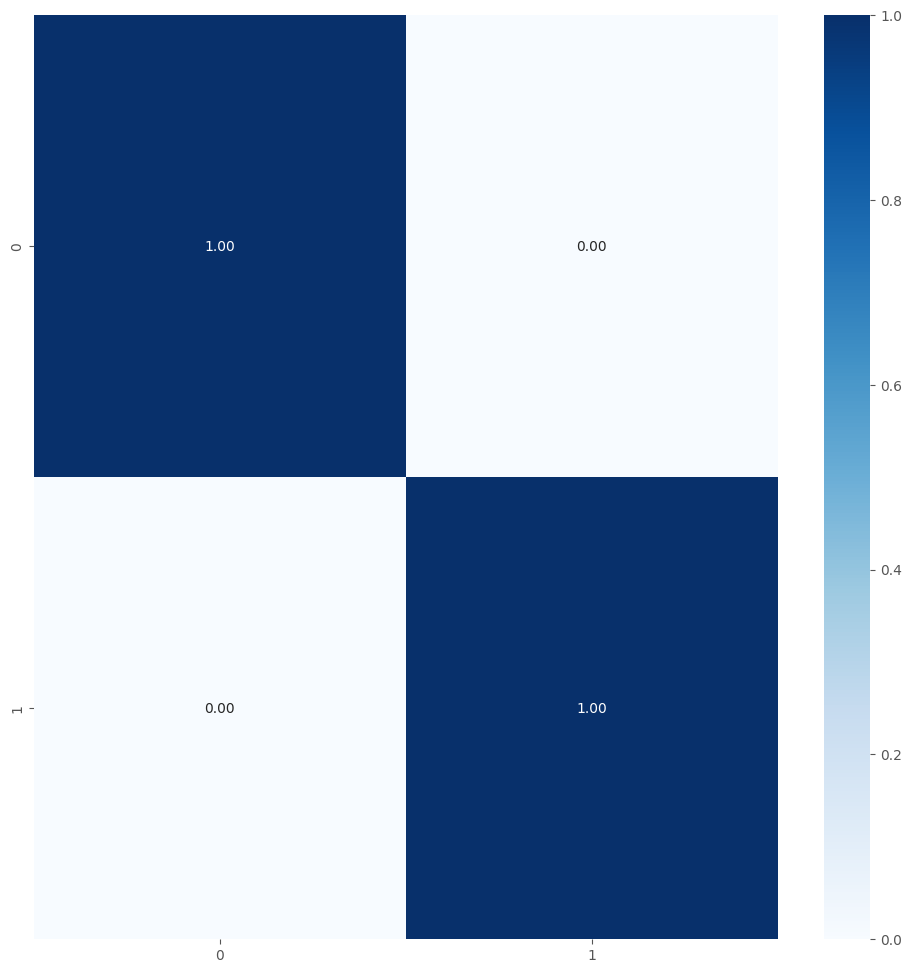

Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 1.0

Test Metrics
test_acc_list: [1.0, 0.9977777600288391, 1.0, 1.0, 1.0]
Average Test Accuracy with 5-fold: 0.9995555520057678
test_loss_list: [0.13302147388458252, 0.8032533526420593, 0.46404391527175903, 0.2151821106672287, 0.21531355381011963]
Average Test Log Loss with 5-fold: 0.36616288125514984
Precision List: [1.0, 0.997787610619469, 1.0, 1.0, 1.0]
Average Precision List with 5-fold: 0.9995575221238937
Recall List: [1.0, 0.9977777777777778, 1.0, 1.0, 1.0]
Average Recall List with 5-fold: 0.9995555555555555
F1 Score List: [1.0, 0.9977777668037867, 1.0, 1.0, 1.0]
Average F1 Score List with 5-fold: 0.9995555533607574

Metrics List Store

test_acc_list_all = [0.9986666679382324, 0.9997037053108215, 0.9995555520057678]
test_loss_list_all = [1.019002091884613, 0.5523107767105102, 0.36616288125514984]
precision_list_all = [0.9986686156763589, 0.9997050147492625, 0.9995575221238937]
recall_list_all = [0.99

In [32]:
%%time

num_classes = 2
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

[I 2025-06-05 20:58:19,490] A new study created in memory with name: no-name-098de027-6f79-4ae8-8e75-9f65a5762f00


Familias de malware copiadas
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 4356867
Trainable params: 2719811
Non-trainable params: 1637056


[I 2025-06-05 21:01:53,924] Trial 0 finished with values: [1.0, 0.05298665165901184] and parameters: {'learning_rate': 3.48413958658835e-05, 'dropout_rate1': 0.2383203715874429, 'dropout_rate2': 0.49957083491402776, 'l2_reg': 4.316542959053576e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 26, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 10, 'reduce_lr_patience': 8, 'units_dense3': 128, 'dropout_rate3': 0.169736532559093}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 4545731
Trainable params: 2903043
Non-trainable params: 1642688


[I 2025-06-05 21:12:12,671] Trial 1 finished with values: [1.0, 0.05889051780104637] and parameters: {'learning_rate': 1.2646098017068915e-05, 'dropout_rate1': 0.27935978193350547, 'dropout_rate2': 0.305967828206843, 'l2_reg': 4.116678619405513e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 33, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 17, 'reduce_lr_patience': 14}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 3887811
Trainable params: 2251779
Non-trainable params: 1636032


[I 2025-06-05 21:19:42,602] Trial 2 finished with values: [1.0, 0.011754220351576805] and parameters: {'learning_rate': 0.006177229605695097, 'dropout_rate1': 0.328105272906439, 'dropout_rate2': 0.1885404652394136, 'l2_reg': 5.704204584449043e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 64, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 15, 'reduce_lr_patience': 12}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 3829827
Trainable params: 1661827
Non-trainable params: 2168000


[I 2025-06-05 21:20:23,016] Trial 3 finished with values: [0.9614814519882202, 0.4832136929035187] and parameters: {'learning_rate': 4.2361434114207746e-05, 'dropout_rate1': 0.20425313110044532, 'dropout_rate2': 0.13005975745061749, 'l2_reg': 0.00011893546685226156, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 16, 'epochs': 32, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 11, 'reduce_lr_patience': 9, 'units_dense3': 64, 'dropout_rate3': 0.3187815514581129}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 3558851
Trainable params: 1923331
Non-trainable params: 1635520


[I 2025-06-05 21:31:12,804] Trial 4 finished with values: [0.9985119104385376, 0.07924056053161621] and parameters: {'learning_rate': 3.184024952590838e-05, 'dropout_rate1': 0.4388156077626002, 'dropout_rate2': 0.162433250212077, 'l2_reg': 0.0001241536680587756, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 32, 'epochs': 35, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 18, 'reduce_lr_patience': 8}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 3895363
Trainable params: 2253699
Non-trainable params: 1641664


[I 2025-06-05 21:36:34,591] Trial 5 finished with values: [1.0, 0.13909398019313812] and parameters: {'learning_rate': 0.00034230696706161315, 'dropout_rate1': 0.39836604842275136, 'dropout_rate2': 0.3615014431362039, 'l2_reg': 0.00021608709967833826, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 64, 'epochs': 32, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 20, 'reduce_lr_patience': 14, 'units_dense3': 32, 'dropout_rate3': 0.2447913988983171}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 3558851
Trainable params: 1393411
Non-trainable params: 2165440


[I 2025-06-05 21:50:03,138] Trial 6 finished with values: [0.9985119104385376, 0.04209671542048454] and parameters: {'learning_rate': 0.00016914766194031647, 'dropout_rate1': 0.5763350836176453, 'dropout_rate2': 0.1867688472895538, 'l2_reg': 0.0001384867284588977, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 32, 'epochs': 46, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 18, 'reduce_lr_patience': 13}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 4348355
Trainable params: 2179331
Non-trainable params: 2169024


[I 2025-06-05 22:04:17,653] Trial 7 finished with values: [1.0, 0.004705393221229315] and parameters: {'learning_rate': 0.0001190749531239796, 'dropout_rate1': 0.3571826003749444, 'dropout_rate2': 0.15229715203219205, 'l2_reg': 0.009270567993742365, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 32, 'epochs': 49, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 14, 'reduce_lr_patience': 9}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 4430659
Trainable params: 2787971
Non-trainable params: 1642688


2025-06-05 22:04:43.521746: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5317560074501004269
2025-06-05 22:04:43.521854: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 11700268694426258467
2025-06-05 22:04:43.521905: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182
[I 2025-06-05 22:04:43,854] Trial 8 finished with values: [0.6637036800384521, 13.841436386108398] and parameters: {'learning_rate': 0.005942058751532044, 'dropout_rate1': 0.35036440572394756, 'dropout_rate2': 0.31436847478850855, 'l2_reg': 0.0016157760928219326, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 44, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 14, 'reduce_lr_patience': 14, 'units_dense3': 128, 'dropout_rate3': 0.3972090662433083}.


Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Total params: 3838275
Trainable params: 2196611
Non-trainable params: 1641664


[I 2025-06-05 22:09:25,296] Trial 9 finished with values: [0.996874988079071, 0.18233954906463623] and parameters: {'learning_rate': 0.00982321698367933, 'dropout_rate1': 0.512914439353856, 'dropout_rate2': 0.21289237247649928, 'l2_reg': 0.00029183802073694823, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 30, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 14, 'reduce_lr_patience': 11, 'units_dense3': 128, 'dropout_rate3': 0.33593833582817156}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 7:
    val_accuracy: 1.0000
    val_loss: 0.0047
    Parámetros: {'learning_rate': 0.0001190749531239796, 'dropout_rate1': 0.3571826003749444, 'dropout_rate2': 0.15229715203219205, 'l2_reg': 0.009270567993742365, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 32, 'epochs': 49, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 14, 'reduce_lr_patience': 9}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


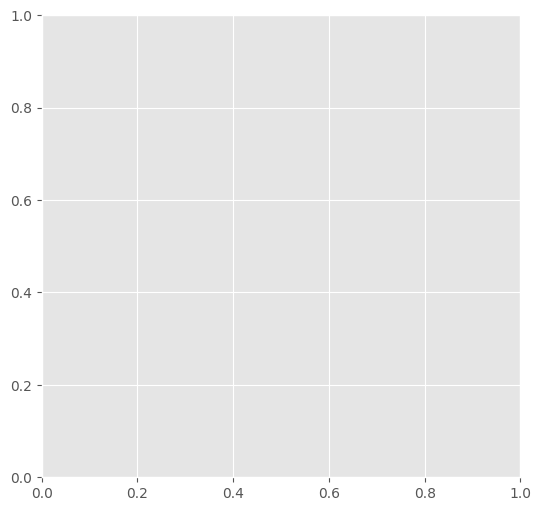

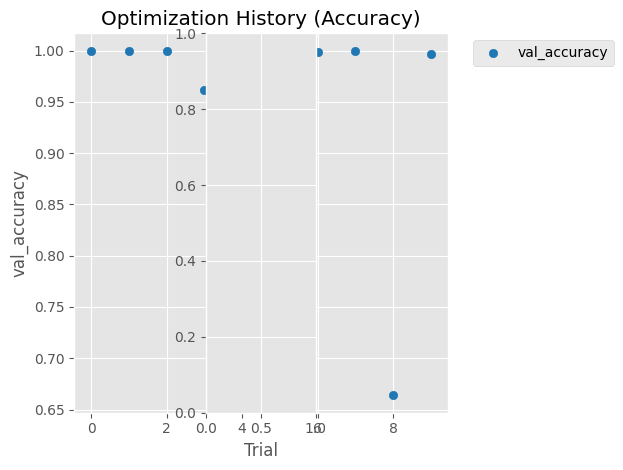

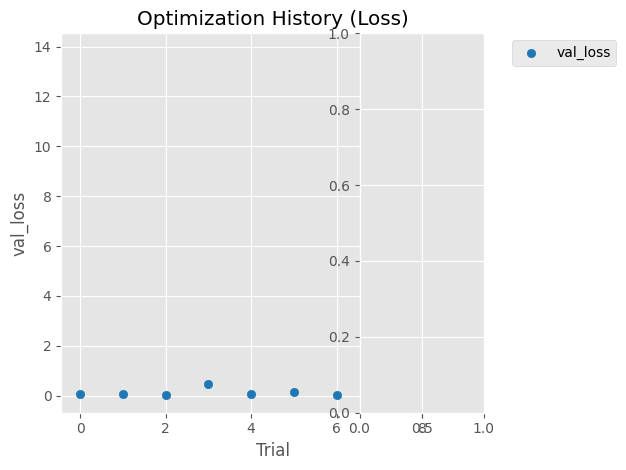

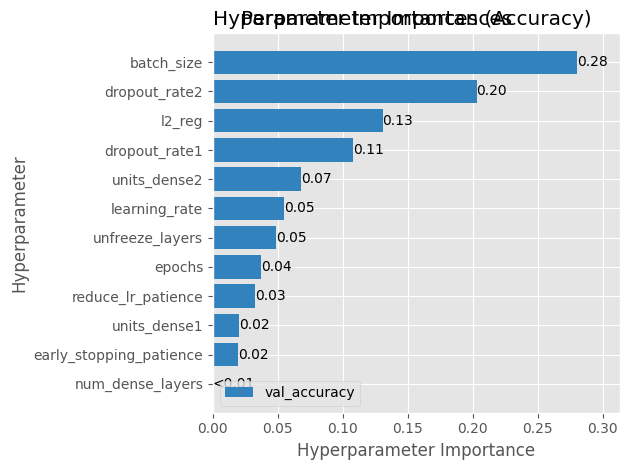

source2: /notebooks/train3/all_malware/3
name_save_model: fusion_MobileNet_tf_optunav23
Found 3150 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Found 675 images belonging to 3 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A

TRAINING AND EVALUATING FOLD 1/5...

Total params: 4348355
Trainable params: 2179331
Non-trainable params: 2169024
Epoch 1/49
98/98 [==============================] - 30s 197ms/step - loss: 9.8317 - accuracy: 0.9827 - val_loss: 8.9115 - val_accuracy: 0.9970 - lr: 1.1907e-04
Epoch 2/49
98/98 [==============================] - 16s 162ms/step - loss: 7.8041 - accuracy: 0.9990 - val_loss: 6.8397 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 3/49
98/98 [==============================] - 18s 185ms/step - loss: 5.9487 - accuracy: 0.9997 - val_loss: 5.1214 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 4/49
98/98 [==============================] - 15s 155ms/step - loss: 4.4133 - accuracy: 1.0000 - val_loss: 3.7

Model and History saved...
99/99 [==============================] - 14s 134ms/step - loss: 1.4524 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 1.4524024724960327
22/22 [==============================] - 3s 129ms/step - loss: 1.4536 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 1.4536203145980835
22/22 [==============================] - 3s 123ms/step - loss: 1.4525 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 1.452452301979065
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00       675
   macro avg       1.00      1.00      1.00       675
w

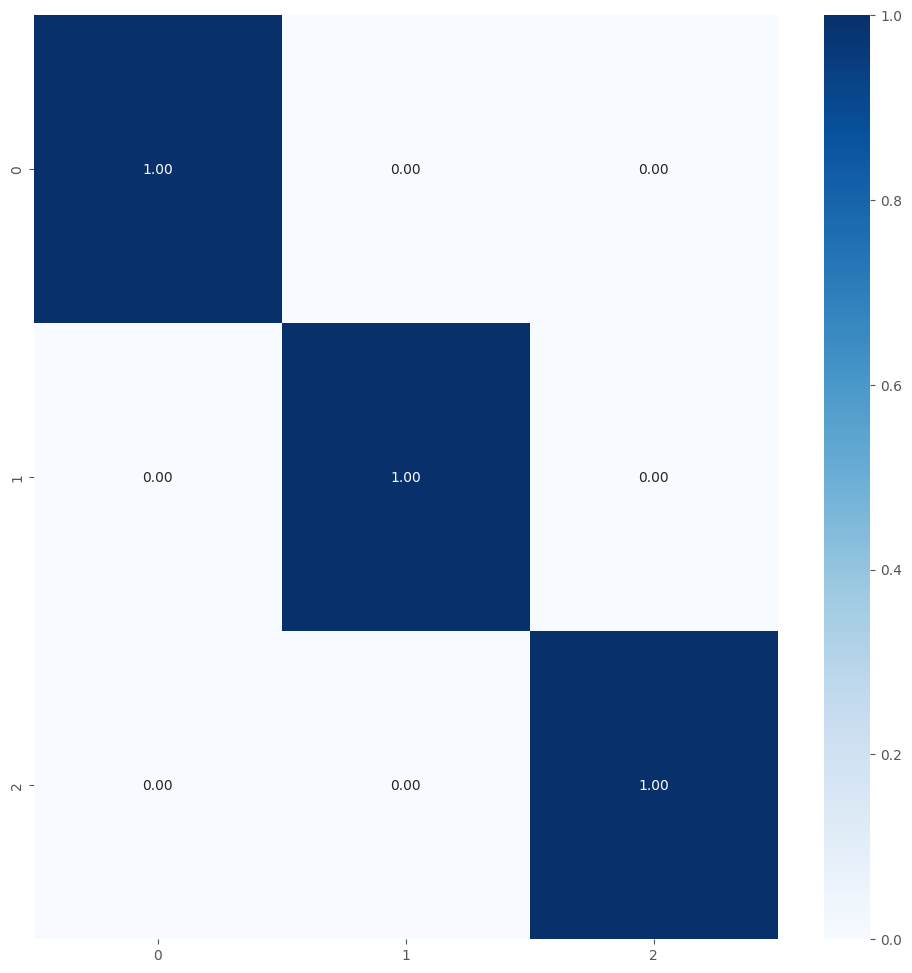


TRAINING AND EVALUATING FOLD 2/5...

Total params: 4348355
Trainable params: 2179331
Non-trainable params: 2169024
Epoch 1/49
98/98 [==============================] - 30s 189ms/step - loss: 10.1295 - accuracy: 0.9682 - val_loss: 9.3846 - val_accuracy: 0.9955 - lr: 1.1907e-04
Epoch 2/49
98/98 [==============================] - 17s 168ms/step - loss: 8.4494 - accuracy: 0.9987 - val_loss: 7.6135 - val_accuracy: 0.9970 - lr: 1.1907e-04
Epoch 3/49
98/98 [==============================] - 17s 165ms/step - loss: 6.8093 - accuracy: 0.9997 - val_loss: 6.0297 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 4/49
98/98 [==============================] - 16s 167ms/step - loss: 5.3294 - accuracy: 1.0000 - val_loss: 4.6641 - val_accuracy: 1.0000 - lr: 1.1907e-04
Epoch 5/49
98/98 [==============================] - 18s 185ms/step - loss: 4.0918 - accuracy: 1.0000 - val_loss: 3.5491 - val_accuracy: 1.0000 - lr: 1.1907e-04
Epoch 6/49
98/98 [==============================] - 16s 165ms/step - loss: 3.1052 -

Model and History saved...
99/99 [==============================] - 14s 124ms/step - loss: 4.6634 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 4.663400650024414
22/22 [==============================] - 3s 118ms/step - loss: 4.6641 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 4.664124965667725
22/22 [==============================] - 4s 117ms/step - loss: 4.6634 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 4.663412094116211
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00       675
   macro avg       1.00      1.00      1.00       675
wei

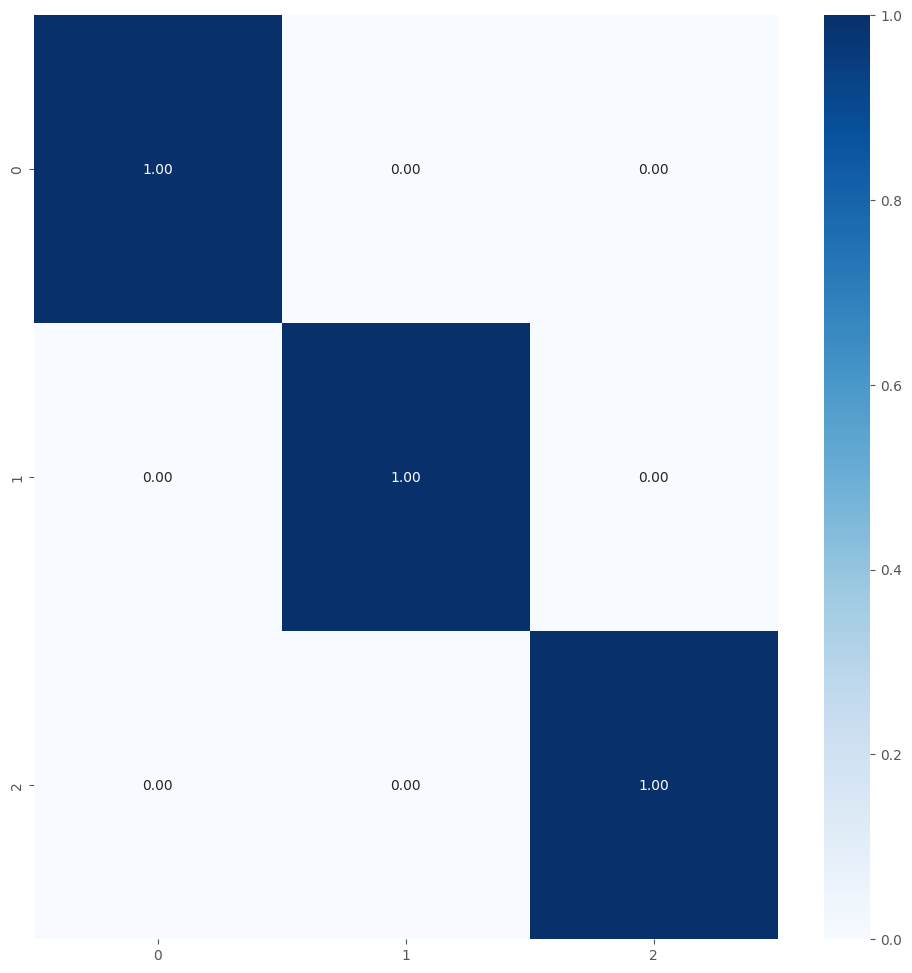


TRAINING AND EVALUATING FOLD 3/5...

Total params: 4348355
Trainable params: 2179331
Non-trainable params: 2169024
Epoch 1/49
98/98 [==============================] - 28s 177ms/step - loss: 9.9869 - accuracy: 0.9792 - val_loss: 9.1596 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 2/49
98/98 [==============================] - 17s 167ms/step - loss: 8.1608 - accuracy: 0.9994 - val_loss: 7.2554 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 3/49
98/98 [==============================] - 20s 202ms/step - loss: 6.4033 - accuracy: 0.9997 - val_loss: 5.6008 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 4/49
98/98 [==============================] - 17s 177ms/step - loss: 4.8989 - accuracy: 1.0000 - val_loss: 4.2448 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 5/49
98/98 [==============================] - 17s 167ms/step - loss: 3.6875 - accuracy: 0.9997 - val_loss: 3.1770 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 6/49
98/98 [==============================] - 17s 170ms/step - loss: 2.7607 - 

Model and History saved...
99/99 [==============================] - 12s 120ms/step - loss: 2.3720 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 2.3720147609710693
22/22 [==============================] - 4s 125ms/step - loss: 2.3725 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 2.3725273609161377
22/22 [==============================] - 3s 128ms/step - loss: 2.3720 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 2.372014284133911
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00       675
   macro avg       1.00      1.00      1.00       675
w

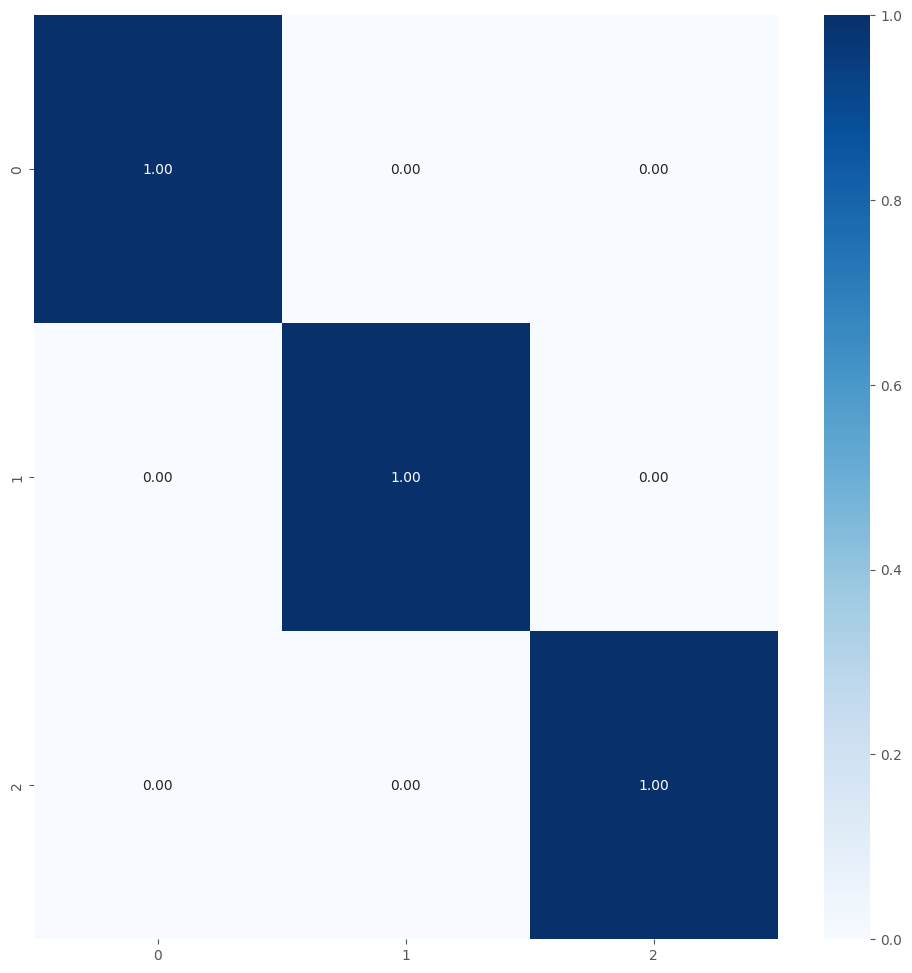


TRAINING AND EVALUATING FOLD 4/5...

Total params: 4348355
Trainable params: 2179331
Non-trainable params: 2169024
Epoch 1/49
98/98 [==============================] - 29s 189ms/step - loss: 10.0593 - accuracy: 0.9734 - val_loss: 9.2944 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 2/49
98/98 [==============================] - 15s 157ms/step - loss: 8.3433 - accuracy: 1.0000 - val_loss: 7.4919 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 3/49
98/98 [==============================] - 16s 166ms/step - loss: 6.6734 - accuracy: 0.9994 - val_loss: 5.8935 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 4/49
98/98 [==============================] - 17s 157ms/step - loss: 5.2063 - accuracy: 1.0000 - val_loss: 4.5568 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 5/49
98/98 [==============================] - 16s 164ms/step - loss: 3.9969 - accuracy: 1.0000 - val_loss: 3.4711 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 6/49
98/98 [==============================] - 17s 169ms/step - loss: 3.0259 -

Model and History saved...
99/99 [==============================] - 14s 132ms/step - loss: 1.4652 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 1.465209722518921
22/22 [==============================] - 3s 135ms/step - loss: 1.4659 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 1.4659045934677124
22/22 [==============================] - 3s 128ms/step - loss: 1.4653 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 1.4652808904647827
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00       675
   macro avg       1.00      1.00      1.00       675
w

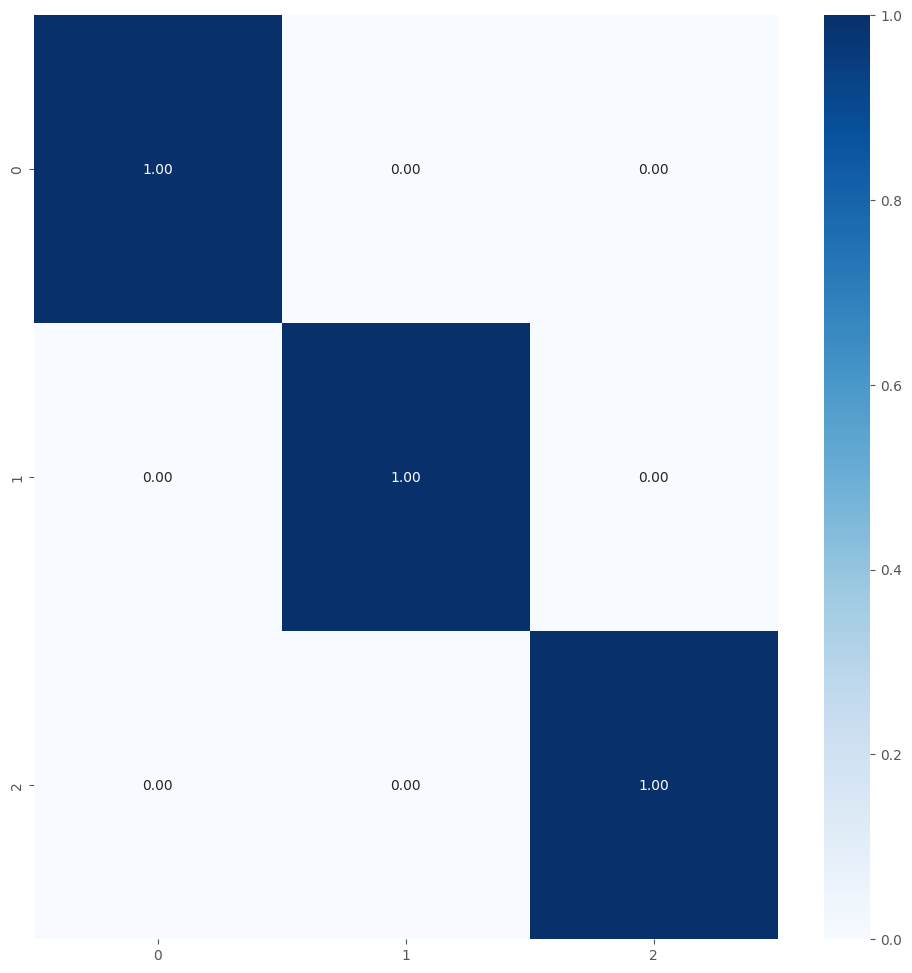


TRAINING AND EVALUATING FOLD 5/5...

Total params: 4348355
Trainable params: 2179331
Non-trainable params: 2169024
Epoch 1/49
98/98 [==============================] - 32s 202ms/step - loss: 10.0753 - accuracy: 0.9743 - val_loss: 9.3004 - val_accuracy: 0.9970 - lr: 1.1907e-04
Epoch 2/49
98/98 [==============================] - 17s 166ms/step - loss: 8.3172 - accuracy: 0.9997 - val_loss: 7.4361 - val_accuracy: 0.9970 - lr: 1.1907e-04
Epoch 3/49
98/98 [==============================] - 17s 168ms/step - loss: 6.5985 - accuracy: 0.9997 - val_loss: 5.8024 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 4/49
98/98 [==============================] - 18s 174ms/step - loss: 5.1097 - accuracy: 0.9997 - val_loss: 4.4582 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 5/49
98/98 [==============================] - 18s 182ms/step - loss: 3.9082 - accuracy: 1.0000 - val_loss: 3.4002 - val_accuracy: 0.9985 - lr: 1.1907e-04
Epoch 6/49
98/98 [==============================] - 16s 163ms/step - loss: 2.9608 -

Model and History saved...
99/99 [==============================] - 14s 135ms/step - loss: 0.5932 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.5932022333145142
22/22 [==============================] - 3s 131ms/step - loss: 0.5941 - accuracy: 1.0000
Validation Accuracy: 1.0
Validation Log Loss: 0.5940812826156616
22/22 [==============================] - 3s 130ms/step - loss: 0.5932 - accuracy: 1.0000
Test Accuracy: 1.0
Test Log Loss: 0.593197762966156
Test labels: {'Allaple.A': 0, 'sfone': 1, 'sillyp2p': 2}

Matriz de Confusión:
[[225   0   0]
 [  0 225   0]
 [  0   0 225]]
True labels: 675
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       1.00      1.00      1.00       225
           2       1.00      1.00      1.00       225

    accuracy                           1.00       675
   macro avg       1.00      1.00      1.00       675
w

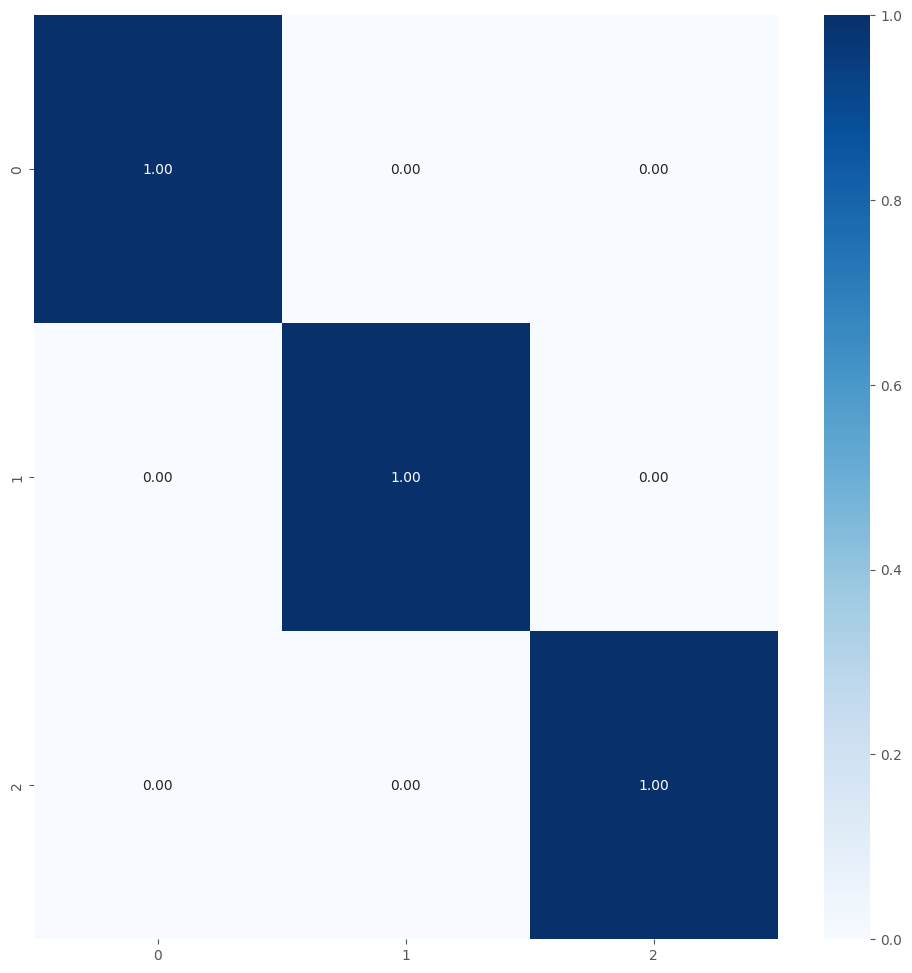

Average training accuracy in 5-fold: 1.0
Average validation precision in 5-fold: 1.0

Test Metrics
test_acc_list: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Test Accuracy with 5-fold: 1.0
test_loss_list: [1.452452301979065, 4.663412094116211, 2.372014284133911, 1.4652808904647827, 0.593197762966156]
Average Test Log Loss with 5-fold: 2.109271466732025
Precision List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Precision List with 5-fold: 1.0
Recall List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average Recall List with 5-fold: 1.0
F1 Score List: [1.0, 1.0, 1.0, 1.0, 1.0]
Average F1 Score List with 5-fold: 1.0

Metrics List Store

test_acc_list_all = [0.9986666679382324, 0.9997037053108215, 0.9995555520057678, 1.0]
test_loss_list_all = [1.019002091884613, 0.5523107767105102, 0.36616288125514984, 2.109271466732025]
precision_list_all = [0.9986686156763589, 0.9997050147492625, 0.9995575221238937, 1.0]
recall_list_all = [0.9986666666666666, 0.9997037037037038, 0.9995555555555555, 1.0]
f1_score_list_all = [0.998666660082271

In [33]:
%%time

num_classes = 3
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

In [25]:
# test_acc_list_all = [0.9986666679382324, 0.9997037053108215]
# test_loss_list_all = [1.019002091884613, 0.5523107767105102]
# precision_list_all = [0.9986686156763589, 0.9997050147492625]
# recall_list_all = [0.9986666666666666, 0.9997037037037038]
# f1_score_list_all = [0.9986666600822719, 0.9997037022405049]
#### Quitar los 2 primeros ####

[I 2025-06-05 22:46:41,910] A new study created in memory with name: no-name-bc530b65-1ba5-4b40-b2d3-ca638297d09f


Familias de malware copiadas
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3797380
Trainable params: 2162372
Non-trainable params: 1635008


[I 2025-06-05 22:47:28,534] Trial 0 finished with values: [0.9755555391311646, 0.5855028033256531] and parameters: {'learning_rate': 5.8244806572985024e-05, 'dropout_rate1': 0.23206571171001755, 'dropout_rate2': 0.331564773762769, 'l2_reg': 0.0004314948445492963, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 16, 'epochs': 39, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 12, 'reduce_lr_patience': 15, 'units_dense3': 128, 'dropout_rate3': 0.18907818600160367}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3829892
Trainable params: 2193860
Non-trainable params: 1636032


[I 2025-06-05 22:57:59,711] Trial 1 finished with values: [1.0, 0.04244018718600273] and parameters: {'learning_rate': 0.008123934549812558, 'dropout_rate1': 0.5832479882690993, 'dropout_rate2': 0.22076584747086356, 'l2_reg': 0.00863489900116981, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 45, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 13, 'units_dense3': 64, 'dropout_rate3': 0.321226559589466}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3888068
Trainable params: 2246404
Non-trainable params: 1641664


[I 2025-06-05 22:58:49,229] Trial 2 finished with values: [0.4977777898311615, 8.002970695495605] and parameters: {'learning_rate': 0.0027605124630829202, 'dropout_rate1': 0.49874595412355244, 'dropout_rate2': 0.21534776391025168, 'l2_reg': 1.4164842058555203e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 50, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 17, 'reduce_lr_patience': 11}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3566436
Trainable params: 1931940
Non-trainable params: 1634496


[I 2025-06-05 23:11:16,219] Trial 3 finished with values: [0.9977678656578064, 0.04444102197885513] and parameters: {'learning_rate': 0.0035673793955845424, 'dropout_rate1': 0.23185832457053557, 'dropout_rate2': 0.38006651076065123, 'l2_reg': 6.018262044094756e-05, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 32, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 12, 'units_dense3': 32, 'dropout_rate3': 0.3209393748068953}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 4545988
Trainable params: 2367748
Non-trainable params: 2178240


[I 2025-06-05 23:16:04,621] Trial 4 finished with values: [0.9977678656578064, 0.11435569077730179] and parameters: {'learning_rate': 0.008126249063840928, 'dropout_rate1': 0.5761897473936575, 'dropout_rate2': 0.41777737052653774, 'l2_reg': 1.9120430441678455e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 49, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 12, 'reduce_lr_patience': 10}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3525700
Trainable params: 1890180
Non-trainable params: 1635520


2025-06-05 23:16:30.674569: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5317560074501004269
2025-06-05 23:16:30.674673: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-05 23:16:30.674713: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182


2025-06-05 23:16:33.170395: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
[I 2025-06-05 23:16:33,338] Trial 5 finished with values: [0.9766666889190674, 1.191249132156372] and parameters: {'learning_rate': 0.0006535868474976184, 'dropout_rate1': 0.4926849419859923, 'dropout_rate2': 0.32386403126795704, 'l2_reg': 0.0023284701118372183, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 16, 'epochs': 29, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 10, 'reduce_lr_patience': 11}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3542212
Trainable params: 1907716
Non-trainable params: 1634496


[I 2025-06-05 23:36:23,758] Trial 6 finished with values: [0.9966517686843872, 0.10221192985773087] and parameters: {'learning_rate': 1.6341062318223127e-05, 'dropout_rate1': 0.37269979635718575, 'dropout_rate2': 0.441882108754012, 'l2_reg': 0.00011691918503276164, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 43, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 14, 'units_dense3': 128, 'dropout_rate3': 0.3346211616119503}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 4422276
Trainable params: 2253252
Non-trainable params: 2169024


[I 2025-06-05 23:37:03,165] Trial 7 finished with values: [0.9855555295944214, 8.070834159851074] and parameters: {'learning_rate': 8.769005095725917e-05, 'dropout_rate1': 0.3895202512162975, 'dropout_rate2': 0.4502576508451196, 'l2_reg': 0.006204244593747107, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 16, 'reduce_lr_patience': 15, 'units_dense3': 64, 'dropout_rate3': 0.2620959848589751}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3788804
Trainable params: 2153796
Non-trainable params: 1635008


[I 2025-06-05 23:37:49,981] Trial 8 finished with values: [0.898888885974884, 0.5997064709663391] and parameters: {'learning_rate': 0.000346652480404454, 'dropout_rate1': 0.4561596193426243, 'dropout_rate2': 0.10247689588958031, 'l2_reg': 0.00042543823418083986, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 16, 'epochs': 49, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 11, 'reduce_lr_patience': 8}.


Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Total params: 3517572
Trainable params: 1876420
Non-trainable params: 1641152


[I 2025-06-05 23:38:32,484] Trial 9 finished with values: [0.9855555295944214, 0.14093224704265594] and parameters: {'learning_rate': 0.0032047118286383834, 'dropout_rate1': 0.3076064598481441, 'dropout_rate2': 0.3731277940851837, 'l2_reg': 9.836833301677352e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 16, 'epochs': 34, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 19, 'reduce_lr_patience': 10, 'units_dense3': 128, 'dropout_rate3': 0.3534009117003223}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 1.0000
    val_loss: 0.0424
    Parámetros: {'learning_rate': 0.008123934549812558, 'dropout_rate1': 0.5832479882690993, 'dropout_rate2': 0.22076584747086356, 'l2_reg': 0.00863489900116981, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 45, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 13, 'units_dense3': 64, 'dropout_rate3': 0.321226559589466}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


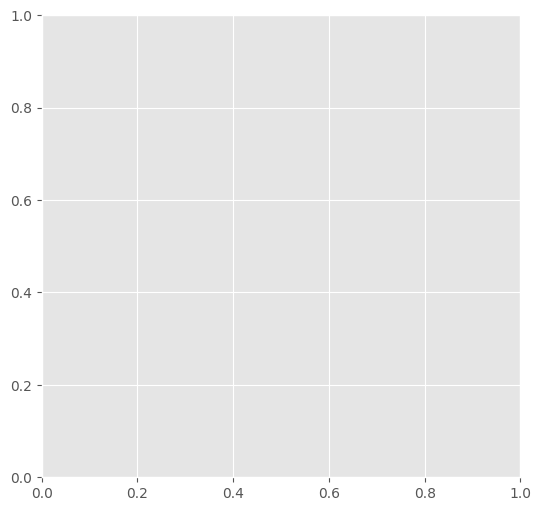

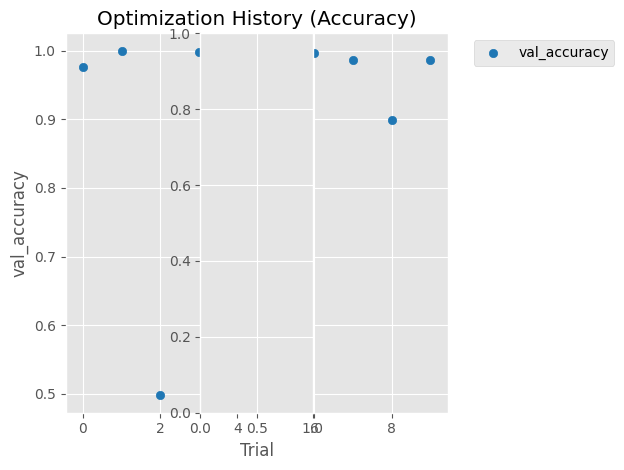

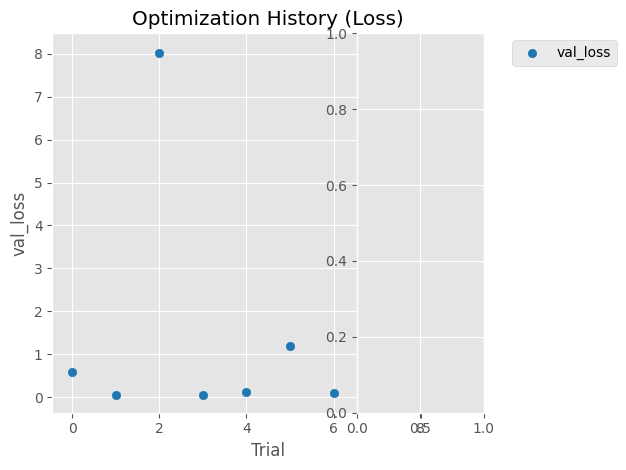

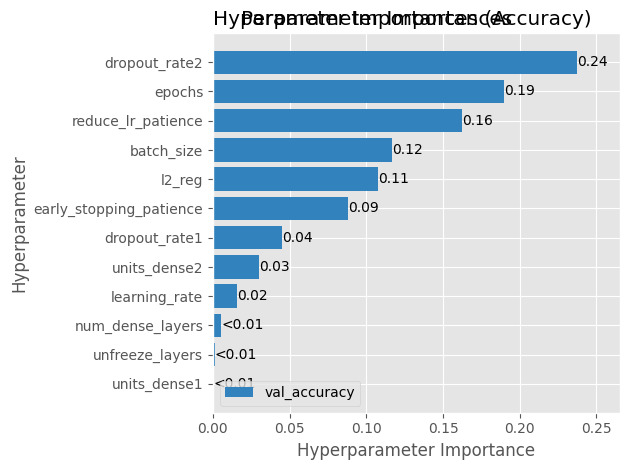

source2: /notebooks/train3/all_malware/4
name_save_model: fusion_MobileNet_tf_optunav24
Found 4200 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Found 900 images belonging to 4 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3829892
Trainable params: 2193860
Non-trainable params: 1636032
Epoch 1/45
65/65 [==============================] - 28s 218ms/step - loss: 5.1074 - accuracy: 0.9553 - val_loss: 4.7978 - val_accuracy: 0.4219 - lr: 0.0081
Epoch 2/45
65/65 [==============================] - 12s 175ms/step - loss: 0.8506 - accuracy: 0.9875 - val_loss: 2.2376 - val_accuracy: 0.7411 - lr: 0.0081
Epoch 3/45
65/65 [==============================] - 12s 175ms/step - loss: 0.9230 - accuracy: 0.9837 - val_loss: 0.6797 - val_accuracy: 0.9286 - lr: 0.0081
Epoch 4/45
65/65 [==============================] - 11s 171ms/step - loss: 0.5893 - accuracy: 0.9869 - val_loss: 2.1810

Model and History saved...
132/132 [==============================] - 18s 135ms/step - loss: 0.0295 - accuracy: 0.9998
Train Accuracy: 0.9997618794441223
Train Log Loss: 0.02946344204246998
29/29 [==============================] - 5s 128ms/step - loss: 0.0407 - accuracy: 0.9967
Validation Accuracy: 0.996666669845581
Validation Log Loss: 0.04072969779372215
29/29 [==============================] - 4s 136ms/step - loss: 0.0418 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.041839875280857086
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00      1.00      1.00       225
           3   

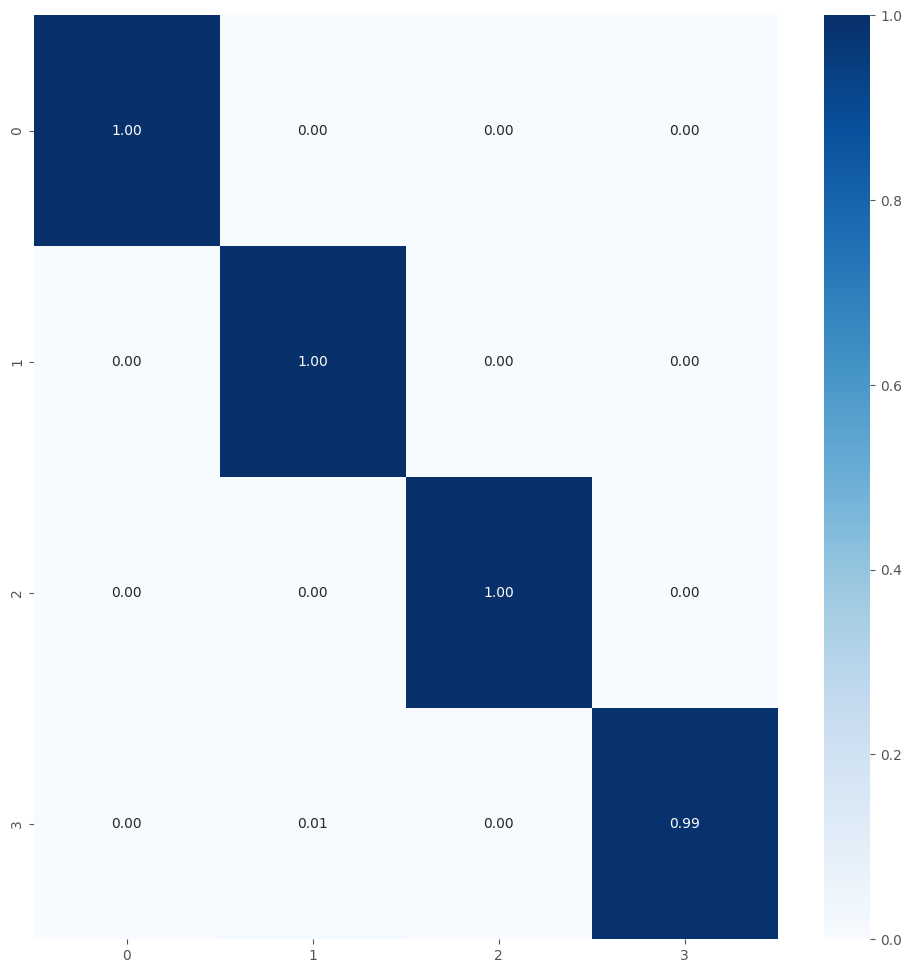


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3829892
Trainable params: 2193860
Non-trainable params: 1636032
Epoch 1/45
65/65 [==============================] - 28s 231ms/step - loss: 4.8090 - accuracy: 0.9447 - val_loss: 2.3038 - val_accuracy: 0.7344 - lr: 0.0081
Epoch 2/45
65/65 [==============================] - 12s 180ms/step - loss: 0.8157 - accuracy: 0.9837 - val_loss: 4.1151 - val_accuracy: 0.2634 - lr: 0.0081
Epoch 3/45
65/65 [==============================] - 11s 171ms/step - loss: 0.6329 - accuracy: 0.9875 - val_loss: 1.7673 - val_accuracy: 0.7344 - lr: 0.0081
Epoch 4/45
65/65 [==============================] - 11s 173ms/step - loss: 1.1770 - accuracy: 0.9808 - val_loss: 3.8916 - val_accuracy: 0.4531 - lr: 0.0081
Epoch 5/45
65/65 [==============================] - 12s 182ms/step - loss: 0.6377 - accuracy: 0.9913 - val_loss: 0.9263 - val_accuracy: 0.9062 - lr: 0.0081
Epoch 6/45
65/65 [==============================] - 12s 171ms/step - loss: 0.5467 - accuracy: 0.9917 - v

Model and History saved...
132/132 [==============================] - 18s 135ms/step - loss: 0.0482 - accuracy: 0.9995
Train Accuracy: 0.9995238184928894
Train Log Loss: 0.04821115359663963
29/29 [==============================] - 5s 131ms/step - loss: 0.0576 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.05755683407187462
29/29 [==============================] - 4s 134ms/step - loss: 0.0599 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.059902336448431015
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00      1.00      1.00       225
           3  

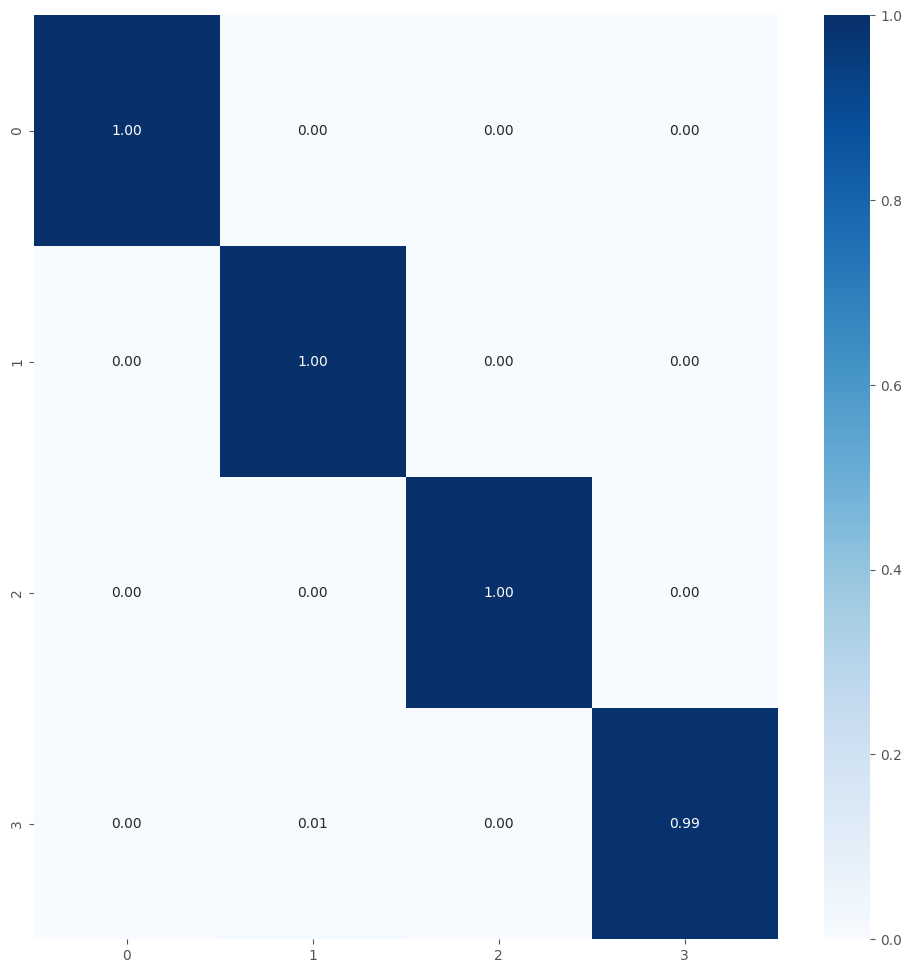


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3829892
Trainable params: 2193860
Non-trainable params: 1636032
Epoch 1/45
65/65 [==============================] - 27s 225ms/step - loss: 4.9373 - accuracy: 0.9582 - val_loss: 3.8573 - val_accuracy: 0.4688 - lr: 0.0081
Epoch 2/45
65/65 [==============================] - 11s 169ms/step - loss: 0.8619 - accuracy: 0.9827 - val_loss: 3.0933 - val_accuracy: 0.4754 - lr: 0.0081
Epoch 3/45
65/65 [==============================] - 11s 174ms/step - loss: 0.6884 - accuracy: 0.9880 - val_loss: 2.2939 - val_accuracy: 0.5603 - lr: 0.0081
Epoch 4/45
65/65 [==============================] - 15s 227ms/step - loss: 0.8168 - accuracy: 0.9808 - val_loss: 6.6380 - val_accuracy: 0.5134 - lr: 0.0081
Epoch 5/45
65/65 [==============================] - 11s 169ms/step - loss: 0.9577 - accuracy: 0.9878 - val_loss: 0.9190 - val_accuracy: 0.8527 - lr: 0.0081
Epoch 6/45
65/65 [==============================] - 11s 168ms/step - loss: 0.5754 - accuracy: 0.9922 - v

Model and History saved...
132/132 [==============================] - 19s 142ms/step - loss: 0.1178 - accuracy: 0.9998
Train Accuracy: 0.9997618794441223
Train Log Loss: 0.11777409166097641
29/29 [==============================] - 5s 142ms/step - loss: 0.1458 - accuracy: 0.9967
Validation Accuracy: 0.996666669845581
Validation Log Loss: 0.14578276872634888
29/29 [==============================] - 4s 140ms/step - loss: 0.1429 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.14292743802070618
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00      1.00      1.00       225
           3    

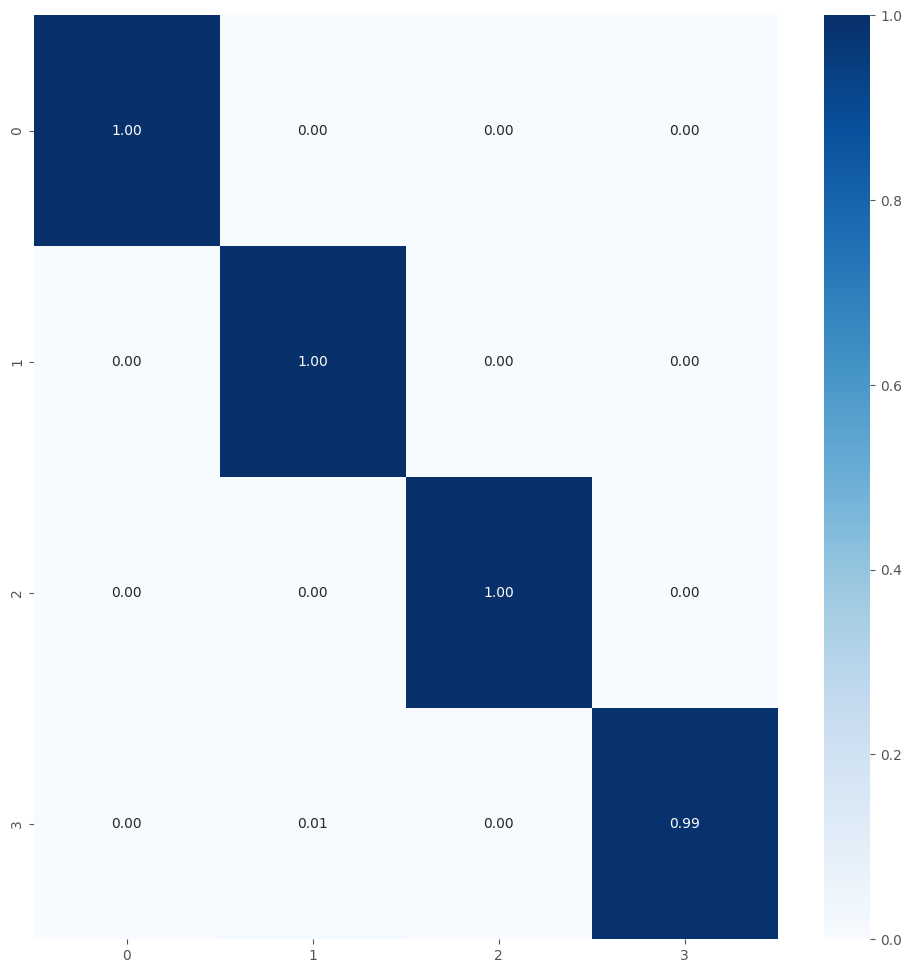


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3829892
Trainable params: 2193860
Non-trainable params: 1636032
Epoch 1/45
65/65 [==============================] - 29s 225ms/step - loss: 4.7609 - accuracy: 0.9495 - val_loss: 8.4694 - val_accuracy: 0.3996 - lr: 0.0081
Epoch 2/45
65/65 [==============================] - 11s 174ms/step - loss: 1.0309 - accuracy: 0.9796 - val_loss: 3.2920 - val_accuracy: 0.4665 - lr: 0.0081
Epoch 3/45
65/65 [==============================] - 11s 171ms/step - loss: 0.6277 - accuracy: 0.9903 - val_loss: 1.0558 - val_accuracy: 0.7321 - lr: 0.0081
Epoch 4/45
65/65 [==============================] - 12s 181ms/step - loss: 0.4979 - accuracy: 0.9942 - val_loss: 0.8188 - val_accuracy: 0.7567 - lr: 0.0081
Epoch 5/45
65/65 [==============================] - 12s 176ms/step - loss: 0.5766 - accuracy: 0.9927 - val_loss: 2.0353 - val_accuracy: 0.7455 - lr: 0.0081
Epoch 6/45
65/65 [==============================] - 12s 176ms/step - loss: 0.7559 - accuracy: 0.9869 - v

Model and History saved...
132/132 [==============================] - 19s 137ms/step - loss: 1.0371 - accuracy: 0.9967
Train Accuracy: 0.996666669845581
Train Log Loss: 1.037095546722412
29/29 [==============================] - 5s 139ms/step - loss: 1.0458 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 1.045847773551941
29/29 [==============================] - 5s 139ms/step - loss: 1.0448 - accuracy: 0.9967
Test Accuracy: 0.996666669845581
Test Log Loss: 1.044830083847046
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 224   0   1]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2       1.00      1.00      1.00       225
           3       1.00 

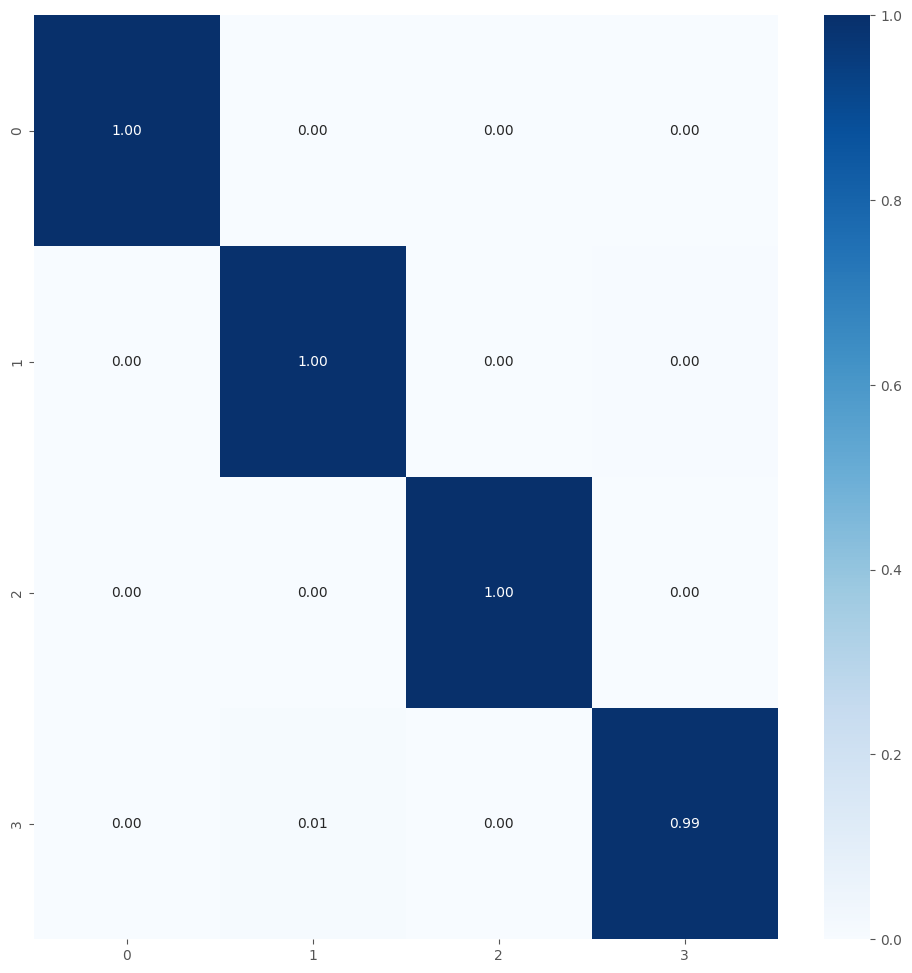


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3829892
Trainable params: 2193860
Non-trainable params: 1636032
Epoch 1/45
65/65 [==============================] - 35s 311ms/step - loss: 5.1270 - accuracy: 0.9490 - val_loss: 11.4128 - val_accuracy: 0.2812 - lr: 0.0081
Epoch 2/45
65/65 [==============================] - 13s 203ms/step - loss: 0.9275 - accuracy: 0.9861 - val_loss: 1.2523 - val_accuracy: 0.7634 - lr: 0.0081
Epoch 3/45
65/65 [==============================] - 10s 147ms/step - loss: 0.6771 - accuracy: 0.9844 - val_loss: 6.9932 - val_accuracy: 0.2522 - lr: 0.0081
Epoch 4/45
65/65 [==============================] - 11s 173ms/step - loss: 0.7931 - accuracy: 0.9904 - val_loss: 2.7132 - val_accuracy: 0.5000 - lr: 0.0081
Epoch 5/45
65/65 [==============================] - 13s 180ms/step - loss: 0.4026 - accuracy: 0.9966 - val_loss: 0.9721 - val_accuracy: 0.7478 - lr: 0.0081
Epoch 6/45
65/65 [==============================] - 12s 185ms/step - loss: 0.3998 - accuracy: 0.9961 - 

Model and History saved...
132/132 [==============================] - 19s 138ms/step - loss: 0.0312 - accuracy: 0.9990
Train Accuracy: 0.9990476369857788
Train Log Loss: 0.031238991767168045
29/29 [==============================] - 5s 129ms/step - loss: 0.0394 - accuracy: 0.9978
Validation Accuracy: 0.9977777600288391
Validation Log Loss: 0.03943726792931557
29/29 [==============================] - 4s 132ms/step - loss: 0.0425 - accuracy: 0.9978
Test Accuracy: 0.9977777600288391
Test Log Loss: 0.04247869551181793
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3}

Matriz de Confusión:
[[225   0   0   0]
 [  0 225   0   0]
 [  0   0 225   0]
 [  0   2   0 223]]
True labels: 900
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       225
           2       1.00      1.00      1.00       225
           3  

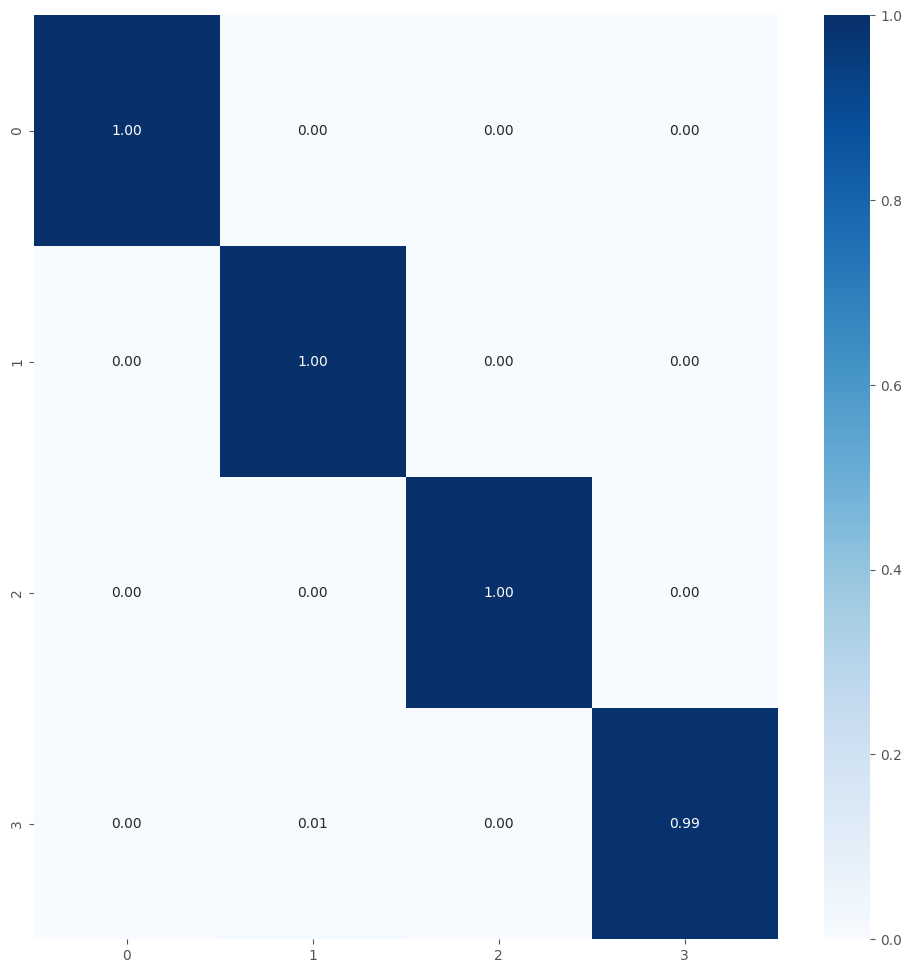

Average training accuracy in 5-fold: 0.9998076915740967
Average validation precision in 5-fold: 1.0

Test Metrics
test_acc_list: [0.9977777600288391, 0.9977777600288391, 0.9977777600288391, 0.996666669845581, 0.9977777600288391]
Average Test Accuracy with 5-fold: 0.9975555419921875
test_loss_list: [0.041839875280857086, 0.059902336448431015, 0.14292743802070618, 1.044830083847046, 0.04247869551181793]
Average Test Log Loss with 5-fold: 0.26639568582177164
Precision List: [0.9977973568281938, 0.9977973568281938, 0.9977973568281938, 0.9966715391908976, 0.9977973568281938]
Average Precision List with 5-fold: 0.9975721933007347
Recall List: [0.9977777777777778, 0.9977777777777778, 0.9977777777777778, 0.9966666666666667, 0.9977777777777778]
Average Recall List with 5-fold: 0.9975555555555555
F1 Score List: [0.9977777338811631, 0.9977777338811631, 0.9977777338811631, 0.99666665020568, 0.9977777338811631]
Average F1 Score List with 5-fold: 0.9975555171460664

Metrics List Store

test_acc_list

In [34]:
%%time

num_classes = 4
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

[I 2025-06-06 00:34:20,445] A new study created in memory with name: no-name-7f12db1b-bf26-4295-a538-bad1a2ec491a


Familias de malware copiadas
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 4546245
Trainable params: 2377221
Non-trainable params: 2169024


[I 2025-06-06 00:39:17,430] Trial 0 finished with values: [0.998161792755127, 0.2737724184989929] and parameters: {'learning_rate': 0.003387233545864525, 'dropout_rate1': 0.5181754520249771, 'dropout_rate2': 0.13069832722952693, 'l2_reg': 0.0036113770965652096, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 46, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 9}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 4414405
Trainable params: 2236165
Non-trainable params: 2178240


[I 2025-06-06 00:40:01,815] Trial 1 finished with values: [0.6968888640403748, 3.8443515300750732] and parameters: {'learning_rate': 0.0020201279605651387, 'dropout_rate1': 0.5715617745294468, 'dropout_rate2': 0.3041908003888113, 'l2_reg': 0.0008768544745403069, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 14, 'reduce_lr_patience': 10}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 4414405
Trainable params: 2777349
Non-trainable params: 1637056


[I 2025-06-06 00:40:46,805] Trial 2 finished with values: [0.648888885974884, 2.4068028926849365] and parameters: {'learning_rate': 0.0021156634468706293, 'dropout_rate1': 0.5706241136674974, 'dropout_rate2': 0.25266282522752936, 'l2_reg': 0.0005325809891183517, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 14}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 3838533
Trainable params: 1661317
Non-trainable params: 2177216


[I 2025-06-06 01:00:46,524] Trial 3 finished with values: [0.9946428537368774, 0.14637577533721924] and parameters: {'learning_rate': 1.6908895983853952e-05, 'dropout_rate1': 0.4037283281664351, 'dropout_rate2': 0.22791669011787608, 'l2_reg': 0.0001260864494541355, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 32, 'epochs': 36, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 18, 'reduce_lr_patience': 9, 'units_dense3': 128, 'dropout_rate3': 0.29609609982266716}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 4348485
Trainable params: 2712453
Non-trainable params: 1636032


[I 2025-06-06 01:01:38,125] Trial 4 finished with values: [0.8826666474342346, 0.3860456645488739] and parameters: {'learning_rate': 2.2623804314004562e-05, 'dropout_rate1': 0.24846893413250967, 'dropout_rate2': 0.2746973762644779, 'l2_reg': 4.5066008478804734e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 39, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 16, 'reduce_lr_patience': 9}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 4422341
Trainable params: 2780677
Non-trainable params: 1641664


2025-06-06 01:02:17.195285: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 12231607302277479599
2025-06-06 01:02:17.195546: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 3312531830037131155
2025-06-06 01:02:17.195577: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182


2025-06-06 01:02:25.058323: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5317560074501004269
[I 2025-06-06 01:02:26,187] Trial 5 finished with values: [0.8408889174461365, 0.5436908006668091] and parameters: {'learning_rate': 0.0005333451725898534, 'dropout_rate1': 0.36558145761842586, 'dropout_rate2': 0.2704642232395007, 'l2_reg': 0.00016182134460684288, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 41, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'units_dense3': 64, 'dropout_rate3': 0.1153569136087672}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 3793029
Trainable params: 1625029
Non-trainable params: 2168000


[I 2025-06-06 01:17:50,262] Trial 6 finished with values: [0.9955357313156128, 0.03584456443786621] and parameters: {'learning_rate': 0.0006770879280886545, 'dropout_rate1': 0.23445290887330672, 'dropout_rate2': 0.3442798826368424, 'l2_reg': 1.7734928198340285e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 44, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 17, 'reduce_lr_patience': 15, 'units_dense3': 64, 'dropout_rate3': 0.25659140251622603}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 3574853
Trainable params: 1934725
Non-trainable params: 1640128


[I 2025-06-06 01:26:30,131] Trial 7 finished with values: [0.9963235259056091, 0.37281447649002075] and parameters: {'learning_rate': 1.2911952522595476e-05, 'dropout_rate1': 0.33188902596723363, 'dropout_rate2': 0.2144701879478116, 'l2_reg': 0.00046485635875024873, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 34, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 8, 'units_dense3': 64, 'dropout_rate3': 0.2336718666753724}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 4546245
Trainable params: 2377221
Non-trainable params: 2169024


[I 2025-06-06 01:41:24,853] Trial 8 finished with values: [0.9964285492897034, 0.09929736703634262] and parameters: {'learning_rate': 1.7567396202634895e-05, 'dropout_rate1': 0.4105525729750684, 'dropout_rate2': 0.3054217689395863, 'l2_reg': 5.307717267943804e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 33, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 16, 'reduce_lr_patience': 12}.


Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Total params: 3797509
Trainable params: 2161477
Non-trainable params: 1636032


[I 2025-06-06 01:46:17,263] Trial 9 finished with values: [0.998161792755127, 0.0524820052087307] and parameters: {'learning_rate': 0.0009942367407367251, 'dropout_rate1': 0.5926089668313166, 'dropout_rate2': 0.14492898309004346, 'l2_reg': 5.738966333648816e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 64, 'epochs': 46, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'units_dense3': 128, 'dropout_rate3': 0.29247179605634027}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2

Mejores trials para cada objetivo:
  Trial 6:
    val_accuracy: 0.9955
    val_loss: 0.0358
    Parámetros: {'learning_rate': 0.0006770879280886545, 'dropout_rate1': 0.23445290887330672, 'dropout_rate2': 0.3442798826368424, 'l2_reg': 1.7734928198340285e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 44, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 17, 'reduce_lr_patience': 15, 'units_dense3': 64, 'dropout_rate3': 0.25659140251622603}
  Trial 9:
    val_accuracy: 0.9982
    val_loss: 0.0525
    Parámetros: {'learning_rate': 0.0009942367407367251, 'dropout_rate1': 0.5926089668313166, 'dropout_rate2': 0.14492898309004346, 'l2_reg': 5.738966333648816e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 64, 'epochs': 46, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'units_dense3': 128, 'dropout_rate3': 0.29247179605634027}


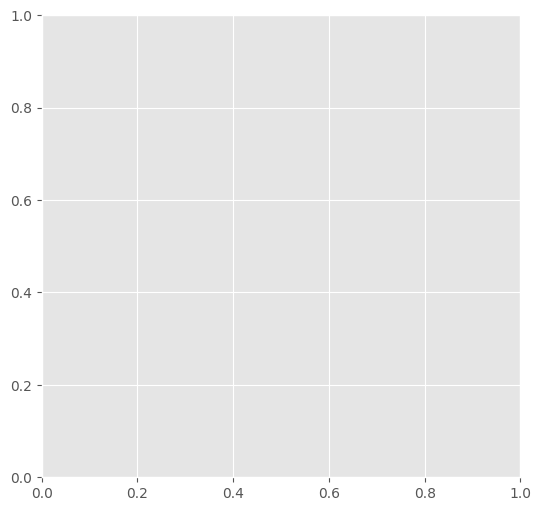

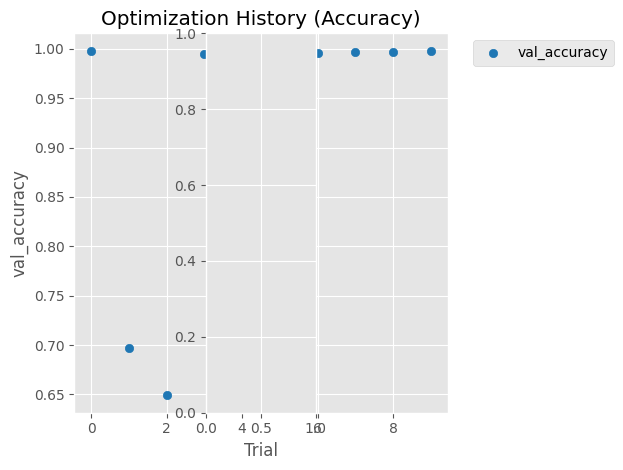

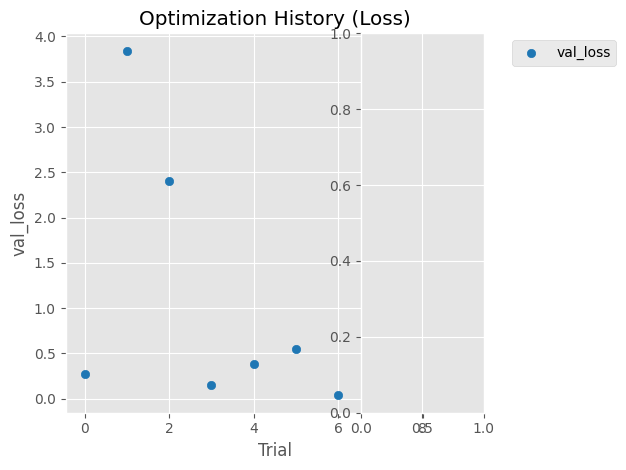

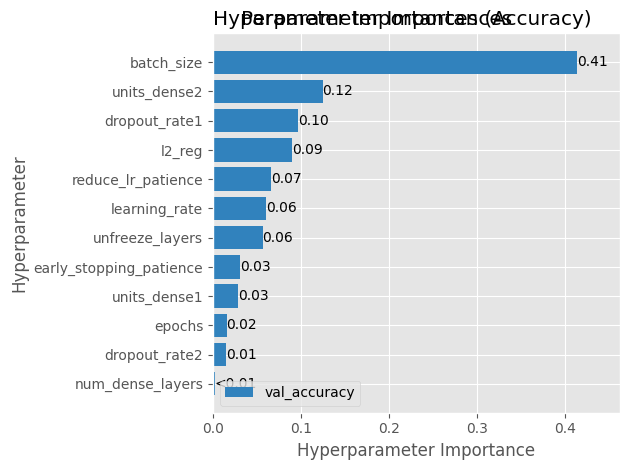

source2: /notebooks/train3/all_malware/5
name_save_model: fusion_MobileNet_tf_optunav25
Found 5250 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Found 1125 images belonging to 5 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3793029
Trainable params: 1625029
Non-trainable params: 2168000
Epoch 1/44
164/164 [==============================] - 17s 78ms/step - loss: 0.2599 - accuracy: 0.9163 - val_loss: 0.0985 - val_accuracy: 0.9714 - lr: 6.7709e-04
Epoch 2/44
164/164 [==============================] - 12s 76ms/step - loss: 0.0945 - accuracy: 0.9755 - val_loss: 0.0834 - val_accuracy: 0.9821 - lr: 6.7709e-04
Epoch 3/44
164/164 [==============================] - 13s 78ms/step - loss: 0.0695 - accuracy: 0.9845 - val_loss: 0.0788 - val_accuracy: 0.9795 - lr: 6.7709e-04
Epoch 4/44
164/164 [==============================] - 12s 74ms/step - loss: 0.0394 - accuracy:

Model and History saved...
165/165 [==============================] - 11s 65ms/step - loss: 0.0184 - accuracy: 0.9994
Train Accuracy: 0.9994285702705383
Train Log Loss: 0.018419794738292694
36/36 [==============================] - 2s 63ms/step - loss: 0.0423 - accuracy: 0.9973
Validation Accuracy: 0.9973333477973938
Validation Log Loss: 0.042280636727809906
36/36 [==============================] - 2s 64ms/step - loss: 0.0476 - accuracy: 0.9938
Test Accuracy: 0.9937777519226074
Test Log Loss: 0.04764223471283913
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 225   0   0   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   3   0 221]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2      

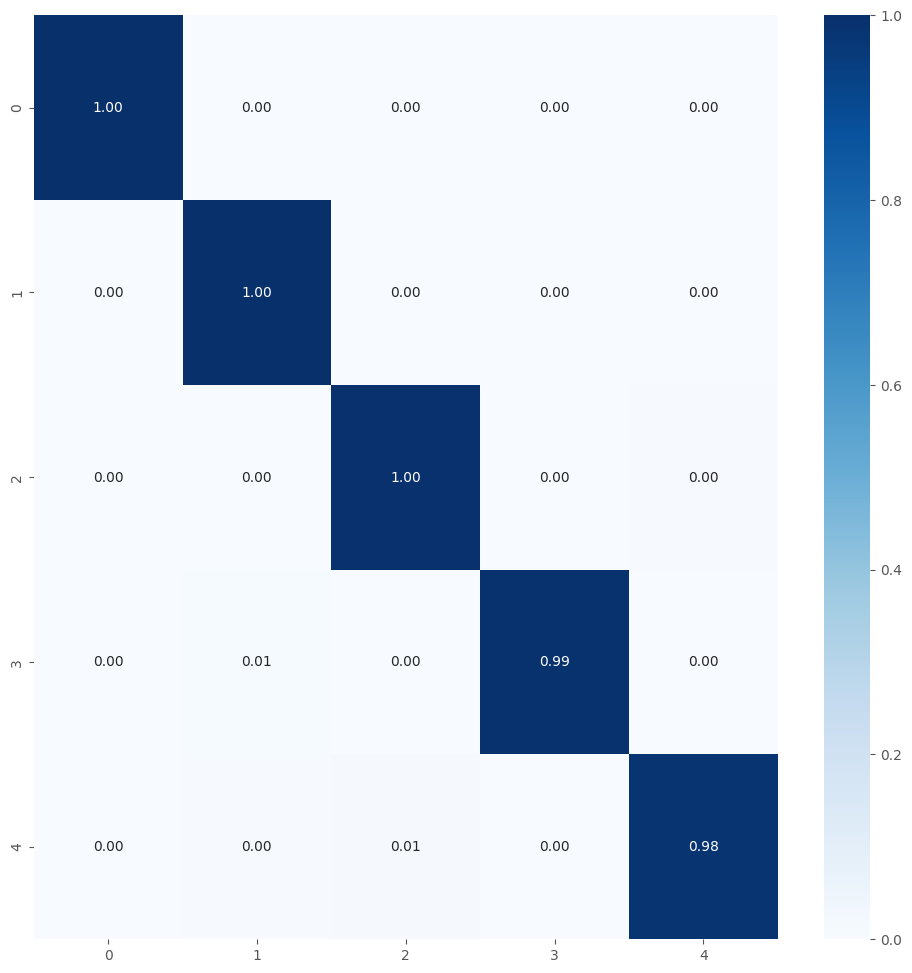


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3793029
Trainable params: 1625029
Non-trainable params: 2168000
Epoch 1/44
164/164 [==============================] - 18s 84ms/step - loss: 0.2622 - accuracy: 0.9166 - val_loss: 0.3040 - val_accuracy: 0.8875 - lr: 6.7709e-04
Epoch 2/44
164/164 [==============================] - 12s 75ms/step - loss: 0.0810 - accuracy: 0.9814 - val_loss: 0.0545 - val_accuracy: 0.9875 - lr: 6.7709e-04
Epoch 3/44
164/164 [==============================] - 13s 77ms/step - loss: 0.0667 - accuracy: 0.9852 - val_loss: 1.1535 - val_accuracy: 0.8446 - lr: 6.7709e-04
Epoch 4/44
164/164 [==============================] - 13s 77ms/step - loss: 0.0544 - accuracy: 0.9879 - val_loss: 0.0944 - val_accuracy: 0.9839 - lr: 6.7709e-04
Epoch 5/44
164/164 [==============================] - 12s 75ms/step - loss: 0.0532 - accuracy: 0.9883 - val_loss: 0.0483 - val_accuracy: 0.9920 - lr: 6.7709e-04
Epoch 6/44
164/164 [==============================] - 12s 76ms/step - loss: 0.0

Model and History saved...
165/165 [==============================] - 10s 62ms/step - loss: 0.0180 - accuracy: 0.9998
Train Accuracy: 0.9998095035552979
Train Log Loss: 0.01797720044851303
36/36 [==============================] - 2s 59ms/step - loss: 0.0398 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.03982967510819435
36/36 [==============================] - 2s 63ms/step - loss: 0.0579 - accuracy: 0.9929
Test Accuracy: 0.992888867855072
Test Log Loss: 0.05793578922748566
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 225   0   0]
 [  0   2   0 223   0]
 [  0   1   4   0 220]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2       0.9

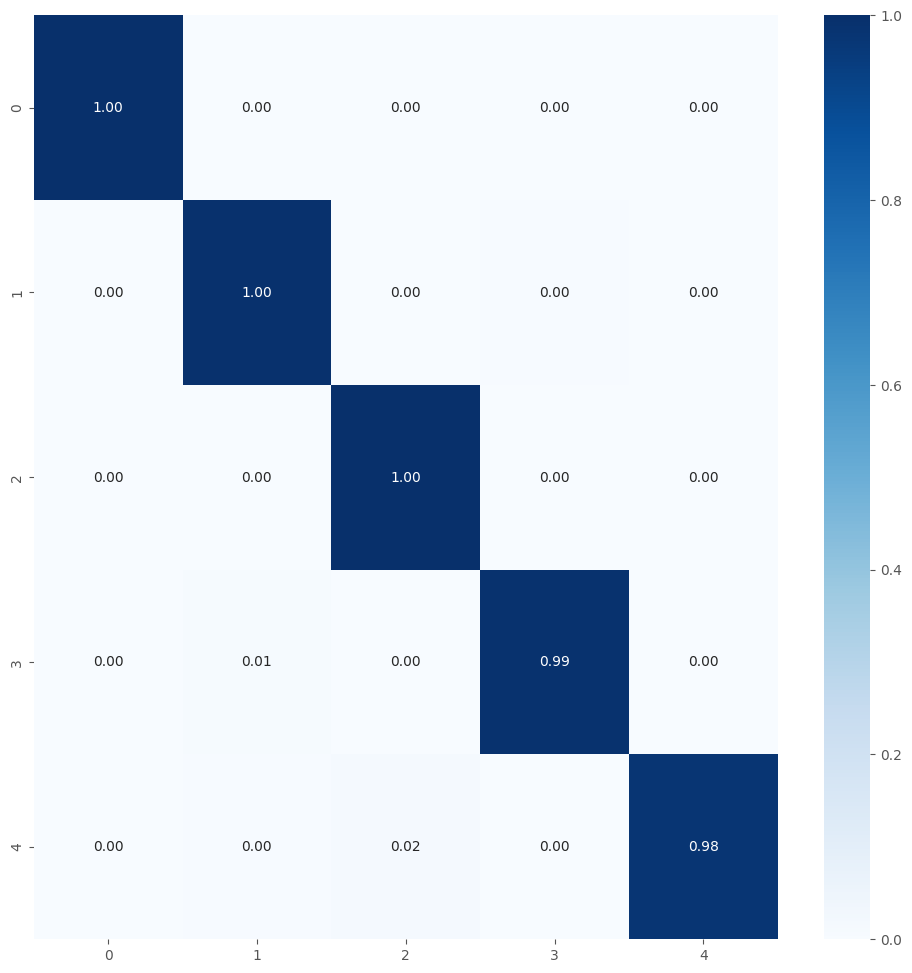


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3793029
Trainable params: 1625029
Non-trainable params: 2168000
Epoch 1/44
164/164 [==============================] - 17s 81ms/step - loss: 0.2766 - accuracy: 0.9076 - val_loss: 0.3760 - val_accuracy: 0.9018 - lr: 6.7709e-04
Epoch 2/44
164/164 [==============================] - 13s 77ms/step - loss: 0.0882 - accuracy: 0.9812 - val_loss: 0.3036 - val_accuracy: 0.9161 - lr: 6.7709e-04
Epoch 3/44
164/164 [==============================] - 13s 77ms/step - loss: 0.0573 - accuracy: 0.9868 - val_loss: 0.0546 - val_accuracy: 0.9857 - lr: 6.7709e-04
Epoch 4/44
164/164 [==============================] - 12s 74ms/step - loss: 0.0455 - accuracy: 0.9939 - val_loss: 0.0457 - val_accuracy: 0.9929 - lr: 6.7709e-04
Epoch 5/44
164/164 [==============================] - 16s 96ms/step - loss: 0.0597 - accuracy: 0.9887 - val_loss: 0.1542 - val_accuracy: 0.9580 - lr: 6.7709e-04
Epoch 6/44
164/164 [==============================] - 13s 77ms/step - loss: 0.0

Model and History saved...
165/165 [==============================] - 10s 62ms/step - loss: 0.0177 - accuracy: 0.9996
Train Accuracy: 0.9996190667152405
Train Log Loss: 0.017651105299592018
36/36 [==============================] - 2s 62ms/step - loss: 0.0375 - accuracy: 0.9964
Validation Accuracy: 0.9964444637298584
Validation Log Loss: 0.03752638027071953
36/36 [==============================] - 3s 60ms/step - loss: 0.0471 - accuracy: 0.9947
Test Accuracy: 0.9946666955947876
Test Log Loss: 0.04714119806885719
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 225   0   0   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   2   0 222]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2       

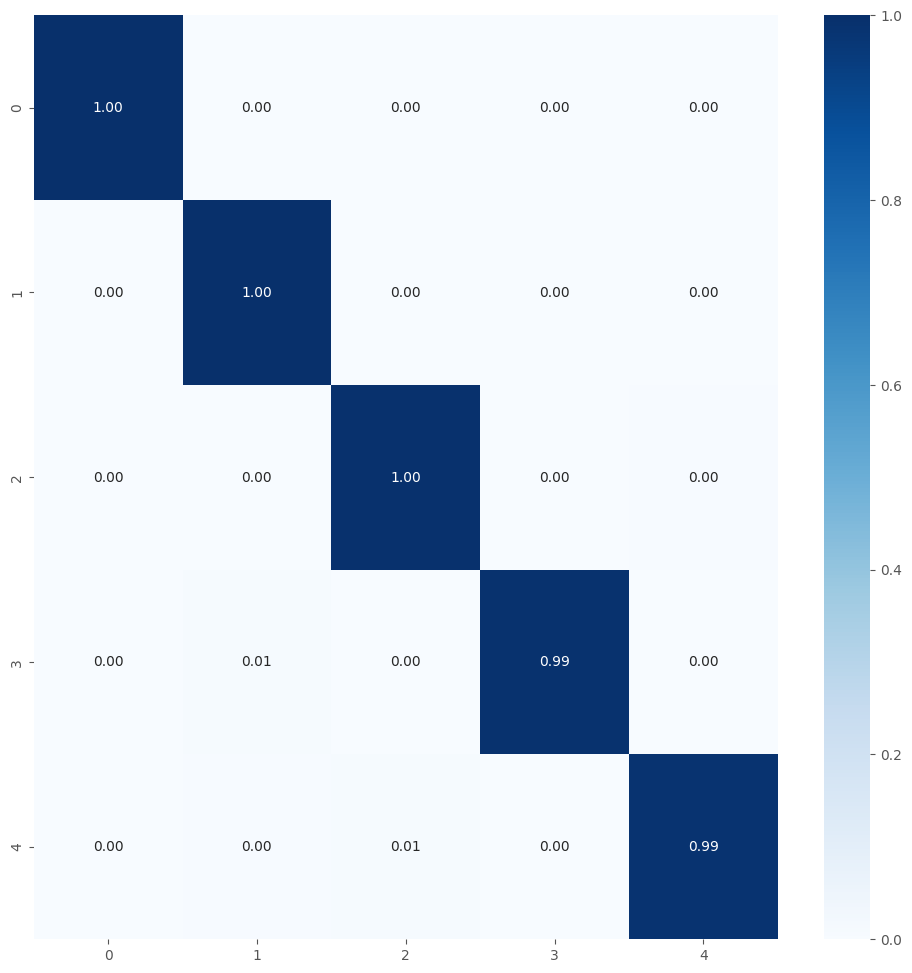


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3793029
Trainable params: 1625029
Non-trainable params: 2168000
Epoch 1/44
164/164 [==============================] - 17s 82ms/step - loss: 0.2843 - accuracy: 0.9082 - val_loss: 0.1104 - val_accuracy: 0.9616 - lr: 6.7709e-04
Epoch 2/44
164/164 [==============================] - 12s 74ms/step - loss: 0.1014 - accuracy: 0.9745 - val_loss: 0.1219 - val_accuracy: 0.9696 - lr: 6.7709e-04
Epoch 3/44
164/164 [==============================] - 13s 78ms/step - loss: 0.0610 - accuracy: 0.9877 - val_loss: 0.0898 - val_accuracy: 0.9741 - lr: 6.7709e-04
Epoch 4/44
164/164 [==============================] - 24s 145ms/step - loss: 0.0454 - accuracy: 0.9921 - val_loss: 0.1153 - val_accuracy: 0.9679 - lr: 6.7709e-04
Epoch 5/44
164/164 [==============================] - 12s 73ms/step - loss: 0.0373 - accuracy: 0.9933 - val_loss: 0.0435 - val_accuracy: 0.9920 - lr: 6.7709e-04
Epoch 6/44
164/164 [==============================] - 12s 76ms/step - loss: 0.

Model and History saved...
165/165 [==============================] - 10s 62ms/step - loss: 0.0189 - accuracy: 0.9996
Train Accuracy: 0.9996190667152405
Train Log Loss: 0.01891718991100788
36/36 [==============================] - 2s 60ms/step - loss: 0.0519 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.05193459615111351
36/36 [==============================] - 2s 63ms/step - loss: 0.0757 - accuracy: 0.9902
Test Accuracy: 0.9902222156524658
Test Log Loss: 0.0756666362285614
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 224   0   1]
 [  0   2   0 223   0]
 [  0   1   6   0 218]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2       0.9

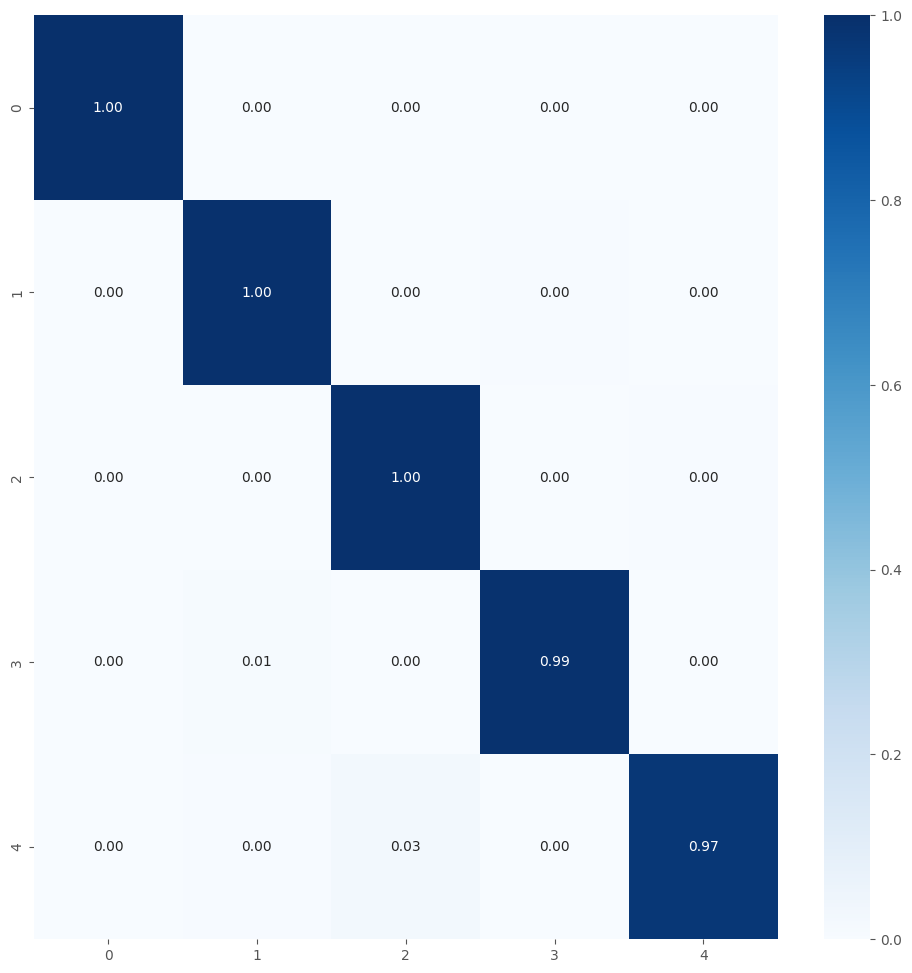


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3793029
Trainable params: 1625029
Non-trainable params: 2168000
Epoch 1/44
164/164 [==============================] - 17s 79ms/step - loss: 0.2602 - accuracy: 0.9166 - val_loss: 2.8369 - val_accuracy: 0.5027 - lr: 6.7709e-04
Epoch 2/44
164/164 [==============================] - 13s 78ms/step - loss: 0.0790 - accuracy: 0.9808 - val_loss: 0.0434 - val_accuracy: 0.9911 - lr: 6.7709e-04
Epoch 3/44
164/164 [==============================] - 15s 92ms/step - loss: 0.0653 - accuracy: 0.9862 - val_loss: 0.6544 - val_accuracy: 0.8518 - lr: 6.7709e-04
Epoch 4/44
164/164 [==============================] - 13s 77ms/step - loss: 0.0513 - accuracy: 0.9879 - val_loss: 0.5826 - val_accuracy: 0.8929 - lr: 6.7709e-04
Epoch 5/44
164/164 [==============================] - 11s 67ms/step - loss: 0.0461 - accuracy: 0.9910 - val_loss: 0.0412 - val_accuracy: 0.9937 - lr: 6.7709e-04
Epoch 6/44
164/164 [==============================] - 12s 73ms/step - loss: 0.0

Model and History saved...
165/165 [==============================] - 10s 61ms/step - loss: 0.0166 - accuracy: 0.9998
Train Accuracy: 0.9998095035552979
Train Log Loss: 0.01661839708685875
36/36 [==============================] - 2s 62ms/step - loss: 0.0423 - accuracy: 0.9964
Validation Accuracy: 0.9964444637298584
Validation Log Loss: 0.042302172631025314
36/36 [==============================] - 3s 60ms/step - loss: 0.0508 - accuracy: 0.9947
Test Accuracy: 0.9946666955947876
Test Log Loss: 0.05082908645272255
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'sfone': 2, 'sillyp2p': 3, 'wabot': 4}

Matriz de Confusión:
[[225   0   0   0   0]
 [  0 224   0   1   0]
 [  0   0 223   0   2]
 [  0   1   0 224   0]
 [  0   1   1   0 223]]
True labels: 1125
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      0.99       225
           2       

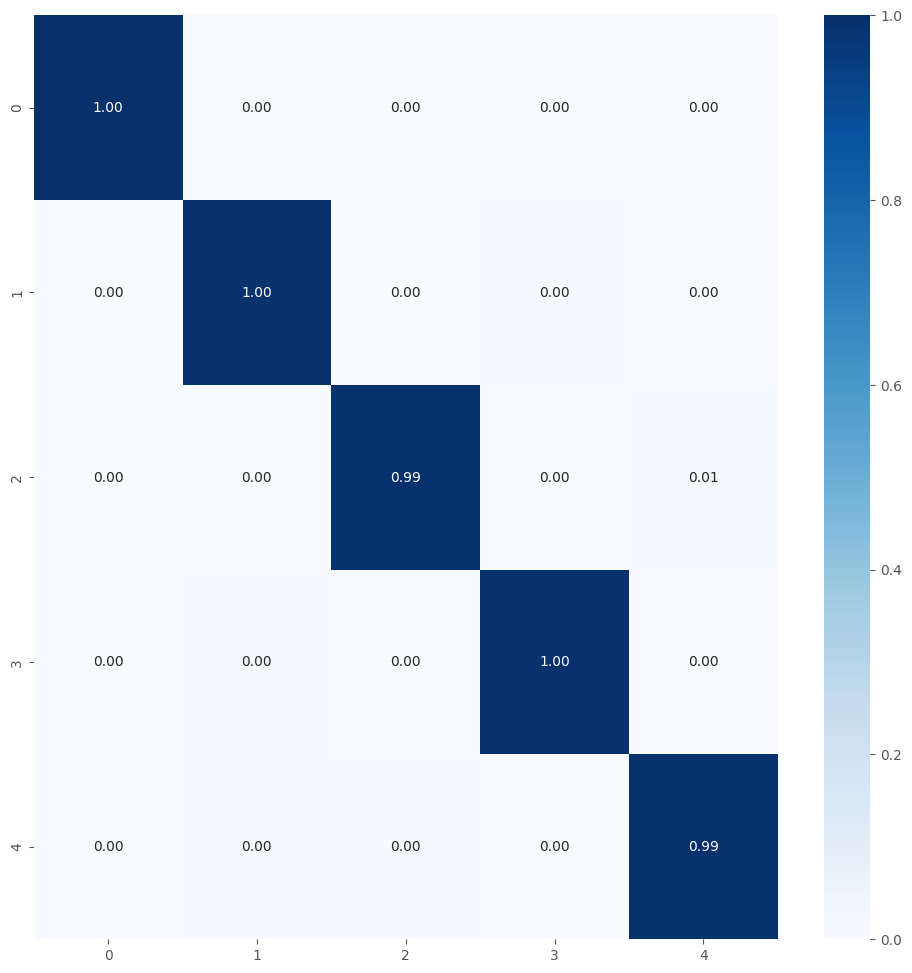

Average training accuracy in 5-fold: 0.9994250655174255
Average validation precision in 5-fold: 0.9964285612106323

Test Metrics
test_acc_list: [0.9937777519226074, 0.992888867855072, 0.9946666955947876, 0.9902222156524658, 0.9946666955947876]
Average Test Accuracy with 5-fold: 0.9932444453239441
test_loss_list: [0.04764223471283913, 0.05793578922748566, 0.04714119806885719, 0.0756666362285614, 0.05082908645272255]
Average Test Log Loss with 5-fold: 0.05584298893809318
Precision List: [0.9938243483455633, 0.9929705212693161, 0.9947016485616598, 0.9903333377374952, 0.9946705646860515]
Average Precision List with 5-fold: 0.9933000841200172
Recall List: [0.9937777777777779, 0.9928888888888888, 0.9946666666666667, 0.9902222222222221, 0.9946666666666667]
Average Recall List with 5-fold: 0.9932444444444444
F1 Score List: [0.9937755915761354, 0.9928844800515714, 0.9946665483200373, 0.9902132589197257, 0.9946666534978774]
Average F1 Score List with 5-fold: 0.9932413064730694

Metrics List Stor

In [35]:
%%time

num_classes = 5
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 02:25:45,106] A new study created in memory with name: no-name-87d1f89d-f45c-415d-a7c8-7bb05acdfaab


Familias de malware copiadas
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3559622
Trainable params: 1392134
Non-trainable params: 2167488


[I 2025-06-06 02:32:10,176] Trial 0 finished with values: [0.9985119104385376, 0.16146990656852722] and parameters: {'learning_rate': 7.948253423219597e-05, 'dropout_rate1': 0.266317407012449, 'dropout_rate2': 0.18328644595369403, 'l2_reg': 0.0004614142179502601, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 50, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 9}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3888582
Trainable params: 2252550
Non-trainable params: 1636032


2025-06-06 02:32:31.135438: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-06 02:32:31.135540: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 10796977728135408850
2025-06-06 02:32:31.135564: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6223181869973454430
[I 2025-06-06 02:32:31,292] Trial 1 finished with values: [0.965925931930542, 0.2759068012237549] and parameters: {'learning_rate': 0.0001614575676466719, 'dropout_rate1': 0.4958543228846369, 'dropout_rate2': 0.12303757768284687, 'l2_reg': 0.00010510324041325514, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 29, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 15, 'reduce_lr_patience': 12}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 4357254
Trainable params: 2179014
Non-trainable params: 2178240


[I 2025-06-06 02:32:51,145] Trial 2 finished with values: [0.970370352268219, 0.33125150203704834] and parameters: {'learning_rate': 0.00034461974648286115, 'dropout_rate1': 0.39715656559125534, 'dropout_rate2': 0.18599279784106526, 'l2_reg': 0.00020424968902347965, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'units_dense3': 128, 'dropout_rate3': 0.17257048777346196}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3830022
Trainable params: 2193990
Non-trainable params: 1636032


[I 2025-06-06 02:38:44,311] Trial 3 finished with values: [0.9985119104385376, 0.08556550741195679] and parameters: {'learning_rate': 0.0007186841385654256, 'dropout_rate1': 0.30095819882091557, 'dropout_rate2': 0.15186323429516438, 'l2_reg': 0.0001226674001777529, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 46, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 20, 'reduce_lr_patience': 11, 'units_dense3': 64, 'dropout_rate3': 0.20796153928826028}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3511014
Trainable params: 1876518
Non-trainable params: 1634496


[I 2025-06-06 02:48:57,542] Trial 4 finished with values: [0.996279776096344, 0.12022942304611206] and parameters: {'learning_rate': 0.00011627289931920502, 'dropout_rate1': 0.20567775631348978, 'dropout_rate2': 0.2604909179310504, 'l2_reg': 0.00019192184442365733, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 32, 'epochs': 47, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 16, 'reduce_lr_patience': 8, 'units_dense3': 32, 'dropout_rate3': 0.2642026615462259}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3788934
Trainable params: 1622982
Non-trainable params: 2165952


[I 2025-06-06 02:52:56,787] Trial 5 finished with values: [0.9955357313156128, 0.15761253237724304] and parameters: {'learning_rate': 0.007066783074123002, 'dropout_rate1': 0.47248993627334435, 'dropout_rate2': 0.4090617828370593, 'l2_reg': 0.0003539465994371323, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 64, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 20, 'reduce_lr_patience': 11}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3542470
Trainable params: 1906950
Non-trainable params: 1635520


[I 2025-06-06 02:58:45,531] Trial 6 finished with values: [1.0, 0.07101624459028244] and parameters: {'learning_rate': 0.00017041261331121547, 'dropout_rate1': 0.3069917274768361, 'dropout_rate2': 0.49777368045729853, 'l2_reg': 0.008532537566321857, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 45, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 14, 'reduce_lr_patience': 14, 'units_dense3': 128, 'dropout_rate3': 0.21110872347622642}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3559622
Trainable params: 1382918
Non-trainable params: 2176704


[I 2025-06-06 03:03:57,067] Trial 7 finished with values: [1.0, 0.03827343136072159] and parameters: {'learning_rate': 0.0008295771574268965, 'dropout_rate1': 0.29365291271112504, 'dropout_rate2': 0.4649049434526661, 'l2_reg': 0.00010386154752808209, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 40, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 13, 'reduce_lr_patience': 14}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 3529510
Trainable params: 1893990
Non-trainable params: 1635520


[I 2025-06-06 03:09:51,631] Trial 8 finished with values: [0.9985119104385376, 0.0883854553103447] and parameters: {'learning_rate': 0.0005100420684712033, 'dropout_rate1': 0.40604710181109216, 'dropout_rate2': 0.33699367411306436, 'l2_reg': 0.00021389114526317084, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 48, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 16, 'reduce_lr_patience': 14, 'units_dense3': 32, 'dropout_rate3': 0.3759048542891371}.


Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Total params: 4350438
Trainable params: 2181414
Non-trainable params: 2169024


[I 2025-06-06 03:10:12,471] Trial 9 finished with values: [0.8918518424034119, 1.0936548709869385] and parameters: {'learning_rate': 3.399410878468404e-05, 'dropout_rate1': 0.30813487850977966, 'dropout_rate2': 0.3121569577993542, 'l2_reg': 0.0005614105012362406, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 48, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 13, 'reduce_lr_patience': 9, 'units_dense3': 32, 'dropout_rate3': 0.20382752032947654}.


Mejores trials para cada objetivo:
  Trial 7:
    val_accuracy: 1.0000
    val_loss: 0.0383
    Parámetros: {'learning_rate': 0.0008295771574268965, 'dropout_rate1': 0.29365291271112504, 'dropout_rate2': 0.4649049434526661, 'l2_reg': 0.00010386154752808209, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 40, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 13, 'reduce_lr_patience': 14}


/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


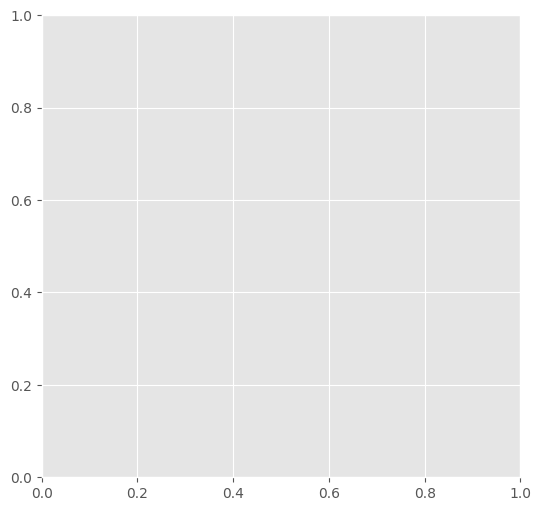

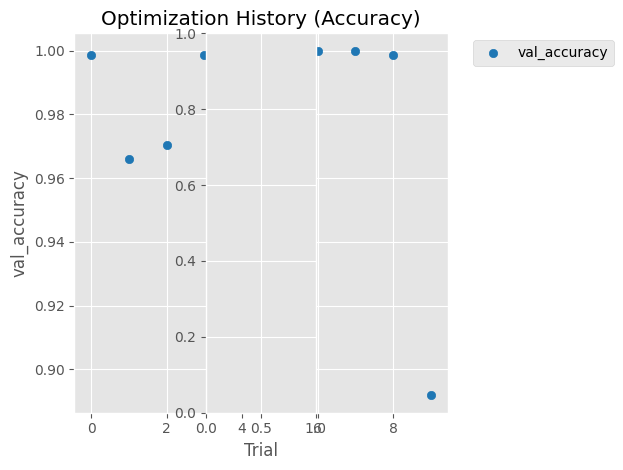

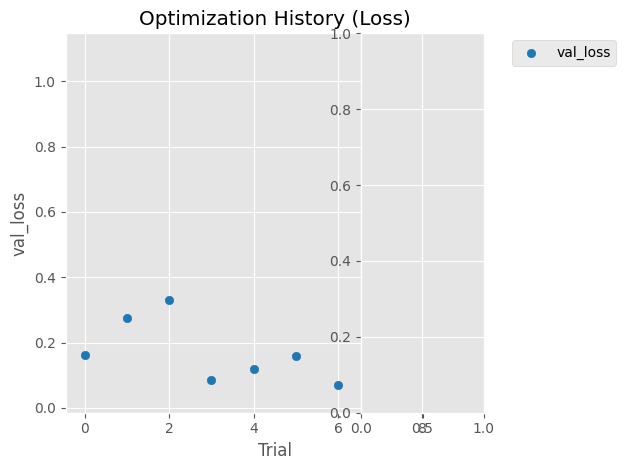

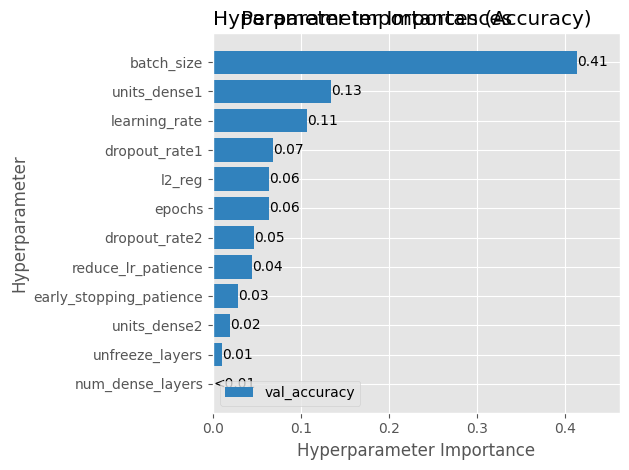

source2: /notebooks/train3/all_malware/6
name_save_model: fusion_MobileNet_tf_optunav26
Found 6300 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Found 1350 images belonging to 6 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3559622
Trainable params: 1382918
Non-trainable params: 2176704
Epoch 1/40
98/98 [==============================] - 11s 82ms/step - loss: 0.3586 - accuracy: 0.8969 - val_loss: 2.3786 - val_accuracy: 0.6176 - lr: 8.2958e-04
Epoch 2/40
98/98 [==============================] - 8s 77ms/step - loss: 0.1385 - accuracy: 0.9757 - val_loss: 0.4688 - val_accuracy: 0.9018 - lr: 8.2958e-04
Epoch 3/40
98/98 [==============================] - 8s 83ms/step - loss: 0.1320 - accuracy: 0.9802 - val_loss: 0.4938 - val_accuracy: 0.8854 - lr: 8.2958e-04
Epoch 4/40
98/98 [==============================] - 8s 76ms/step - loss: 0.1170 - accuracy: 0.9

Model and History saved...
197/197 [==============================] - 12s 58ms/step - loss: 0.0713 - accuracy: 0.9987
Train Accuracy: 0.9987301826477051
Train Log Loss: 0.07130549103021622
43/43 [==============================] - 3s 56ms/step - loss: 0.1003 - accuracy: 0.9941
Validation Accuracy: 0.9940740466117859
Validation Log Loss: 0.10034005343914032
43/43 [==============================] - 3s 65ms/step - loss: 0.1096 - accuracy: 0.9933
Test Accuracy: 0.9933333396911621
Test Log Loss: 0.10964006185531616
Test labels: {'Allaple.A': 0, 'Ramnit': 1, 'mira': 2, 'sfone': 3, 'sillyp2p': 4, 'wabot': 5}

Matriz de Confusión:
[[225   0   0   0   0   0]
 [  0 224   1   0   0   0]
 [  0   0 225   0   0   0]
 [  0   0   0 223   0   2]
 [  0   2   0   0 223   0]
 [  1   1   0   2   0 221]]
True labels: 1350
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1    

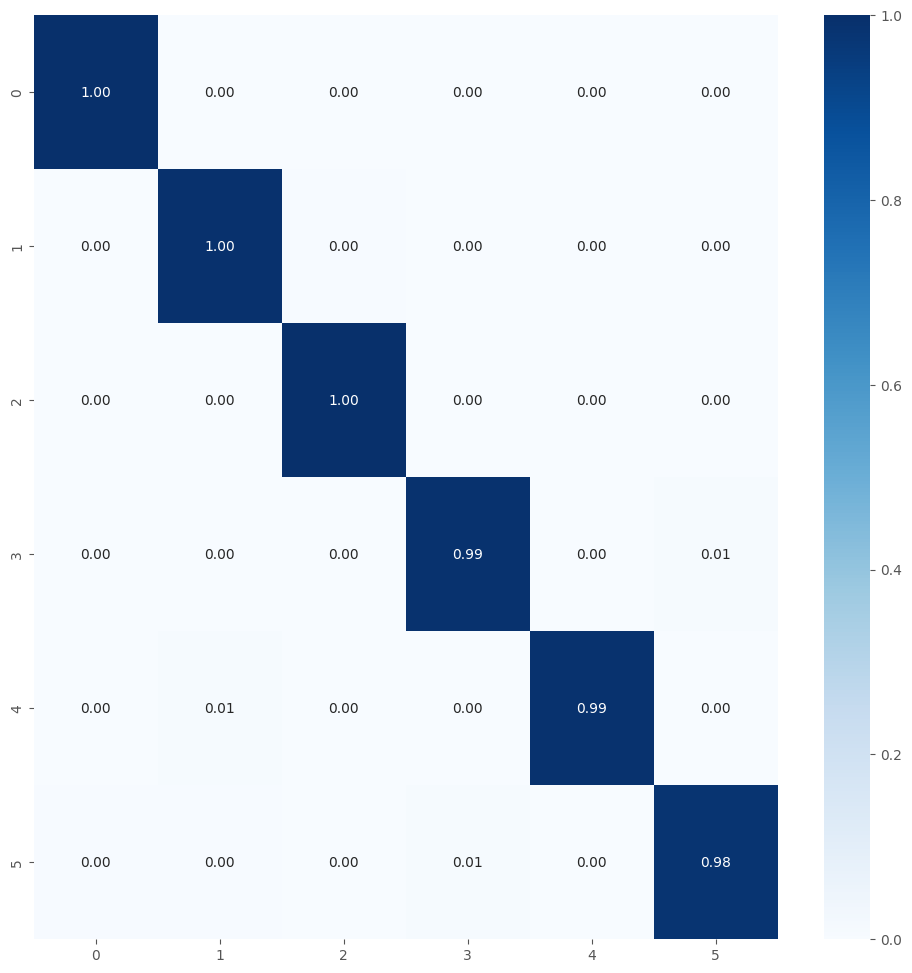


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3559622
Trainable params: 1382918
Non-trainable params: 2176704
Epoch 1/40
98/98 [==============================] - 12s 87ms/step - loss: 0.3348 - accuracy: 0.9045 - val_loss: 3.3291 - val_accuracy: 0.4702 - lr: 8.2958e-04
Epoch 2/40
98/98 [==============================] - 8s 78ms/step - loss: 0.1590 - accuracy: 0.9783 - val_loss: 0.8369 - val_accuracy: 0.8214 - lr: 8.2958e-04
Epoch 3/40
98/98 [==============================] - 7s 74ms/step - loss: 0.1112 - accuracy: 0.9863 - val_loss: 0.2541 - val_accuracy: 0.9390 - lr: 8.2958e-04
Epoch 4/40
98/98 [==============================] - 8s 80ms/step - loss: 0.1042 - accuracy: 0.9898 - val_loss: 0.1041 - val_accuracy: 0.9911 - lr: 8.2958e-04
Epoch 5/40
98/98 [==============================] - 8s 79ms/step - loss: 0.1078 - accuracy: 0.9863 - val_loss: 0.3570 - val_accuracy: 0.9182 - lr: 8.2958e-04
Epoch 6/40
54/98 [===============>..............] - ETA: 2s - loss: 0.0917 - accuracy: 0.9925

IOPub message rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_msg_rate_limit`.

Current values:
ServerApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [36]:
%%time

num_classes = 6
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 03:29:48,098] A new study created in memory with name: no-name-59fee2bf-de22-4dc8-9353-9606a1e65b0c


Familias de malware copiadas
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 4357383
Trainable params: 2721351
Non-trainable params: 1636032


[I 2025-06-06 03:34:59,449] Trial 0 finished with values: [0.9934895634651184, 0.2603145241737366] and parameters: {'learning_rate': 0.009057889534688328, 'dropout_rate1': 0.3898227070161959, 'dropout_rate2': 0.12069567960225105, 'l2_reg': 0.00018926423768301357, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 17, 'reduce_lr_patience': 10, 'units_dense3': 128, 'dropout_rate3': 0.2033152420966565}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3526087
Trainable params: 1358599
Non-trainable params: 2167488


2025-06-06 03:35:21.593245: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 10796977728135408850
2025-06-06 03:35:21.593349: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6223181869973454430
[I 2025-06-06 03:35:21,749] Trial 1 finished with values: [0.957460343837738, 0.2005964070558548] and parameters: {'learning_rate': 0.005777461515835705, 'dropout_rate1': 0.599868477345332, 'dropout_rate2': 0.4036407493776567, 'l2_reg': 3.7115002867706885e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 16, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 13, 'reduce_lr_patience': 8}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3559879
Trainable params: 1918727
Non-trainable params: 1641152


[I 2025-06-06 03:41:49,848] Trial 2 finished with values: [0.9973958134651184, 0.137419193983078] and parameters: {'learning_rate': 0.000147549939519297, 'dropout_rate1': 0.5485988226260334, 'dropout_rate2': 0.2747423047119988, 'l2_reg': 0.00023746719386632525, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 11, 'reduce_lr_patience': 9}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3526087
Trainable params: 1890567
Non-trainable params: 1635520


[I 2025-06-06 03:48:29,055] Trial 3 finished with values: [1.0, 0.1942121535539627] and parameters: {'learning_rate': 8.234638672156128e-05, 'dropout_rate1': 0.2473608214855761, 'dropout_rate2': 0.42335655021714536, 'l2_reg': 0.0004961330494792607, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 12, 'reduce_lr_patience': 10}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3903943
Trainable params: 1735943
Non-trainable params: 2168000


[I 2025-06-06 03:59:13,362] Trial 4 finished with values: [0.9955357313156128, 0.12114226073026657] and parameters: {'learning_rate': 2.1900713438865277e-05, 'dropout_rate1': 0.432991008514755, 'dropout_rate2': 0.3544266605186809, 'l2_reg': 8.61272912249089e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 38, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 17, 'reduce_lr_patience': 10, 'units_dense3': 64, 'dropout_rate3': 0.1307887982089423}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3888839
Trainable params: 2252807
Non-trainable params: 1636032


2025-06-06 03:59:32.343144: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-06 03:59:32.343246: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182


2025-06-06 03:59:36.194455: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6223181869973454430
[I 2025-06-06 03:59:36,361] Trial 5 finished with values: [0.6253968477249146, 1.892038345336914] and parameters: {'learning_rate': 0.0020546360155895118, 'dropout_rate1': 0.23928250855641228, 'dropout_rate2': 0.2544017649491158, 'l2_reg': 0.0008796549183582239, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 8}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3559879
Trainable params: 1924359
Non-trainable params: 1635520


[I 2025-06-06 04:04:13,551] Trial 6 finished with values: [0.99609375, 0.05400985851883888] and parameters: {'learning_rate': 0.00018324182295043168, 'dropout_rate1': 0.33056012369455806, 'dropout_rate2': 0.22268163122716023, 'l2_reg': 5.483751162939831e-05, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 46, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 18, 'reduce_lr_patience': 9}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3509191
Trainable params: 1332487
Non-trainable params: 2176704


[I 2025-06-06 04:08:20,688] Trial 7 finished with values: [0.99609375, 0.03463994711637497] and parameters: {'learning_rate': 0.00010175610480890458, 'dropout_rate1': 0.5223490268156187, 'dropout_rate2': 0.14714025621320023, 'l2_reg': 4.046211618111662e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 32, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 12, 'reduce_lr_patience': 8}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 4414663
Trainable params: 2777607
Non-trainable params: 1637056


[I 2025-06-06 04:13:53,233] Trial 8 finished with values: [0.9973958134651184, 0.035935867577791214] and parameters: {'learning_rate': 0.005149476809385369, 'dropout_rate1': 0.2773949059080839, 'dropout_rate2': 0.26805071725732543, 'l2_reg': 0.008440903159552631, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 64, 'epochs': 38, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 14, 'reduce_lr_patience': 8}.


Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Total params: 3566535
Trainable params: 1389831
Non-trainable params: 2176704


[I 2025-06-06 04:14:16,358] Trial 9 finished with values: [0.9580952525138855, 0.45282185077667236] and parameters: {'learning_rate': 0.0018937034333570812, 'dropout_rate1': 0.40330339977539603, 'dropout_rate2': 0.42225362527885724, 'l2_reg': 0.0005021061098578615, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 50, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 19, 'reduce_lr_patience': 11, 'units_dense3': 32, 'dropout_rate3': 0.1745176356805428}.


Mejores trials para cada objetivo:
  Trial 3:
    val_accuracy: 1.0000
    val_loss: 0.1942
    Parámetros: {'learning_rate': 8.234638672156128e-05, 'dropout_rate1': 0.2473608214855761, 'dropout_rate2': 0.42335655021714536, 'l2_reg': 0.0004961330494792607, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 12, 'reduce_lr_patience': 10}
  Trial 7:
    val_accuracy: 0.9961
    val_loss: 0.0346
    Parámetros: {'learning_rate': 0.00010175610480890458, 'dropout_rate1': 0.5223490268156187, 'dropout_rate2': 0.14714025621320023, 'l2_reg': 4.046211618111662e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 32, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 12, 'reduce_lr_patience': 8}
  Trial 8:
    val_accuracy: 0.9974
    val_loss: 0.0359
    Parámetros: {'learning_rate': 0.005149476809385369, 'dropout_rate1': 0.2773949059080839, 'dropout_rate2': 0.

/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


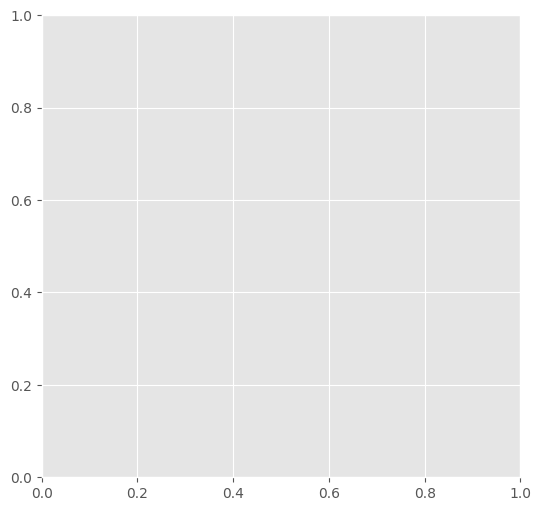

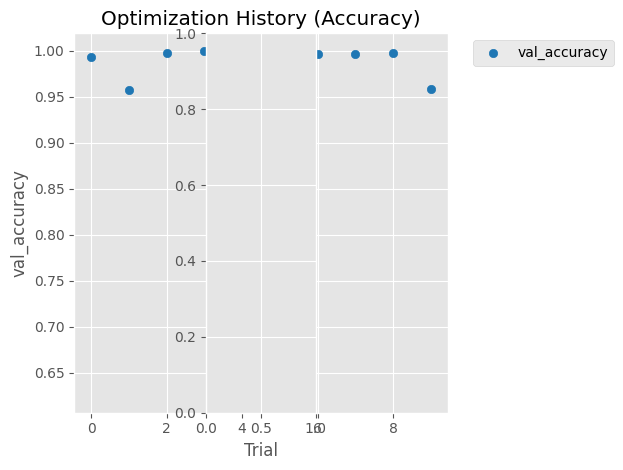

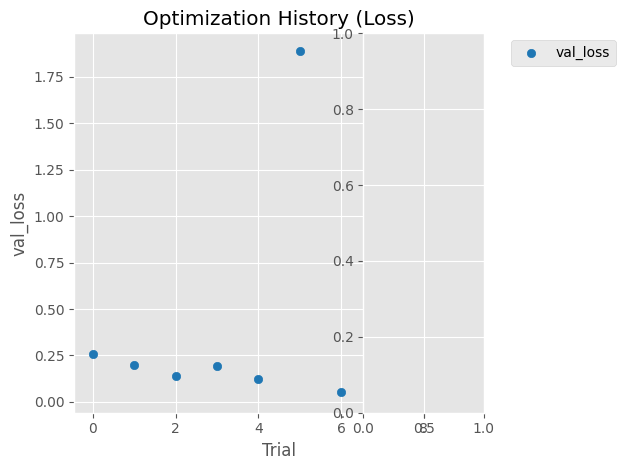

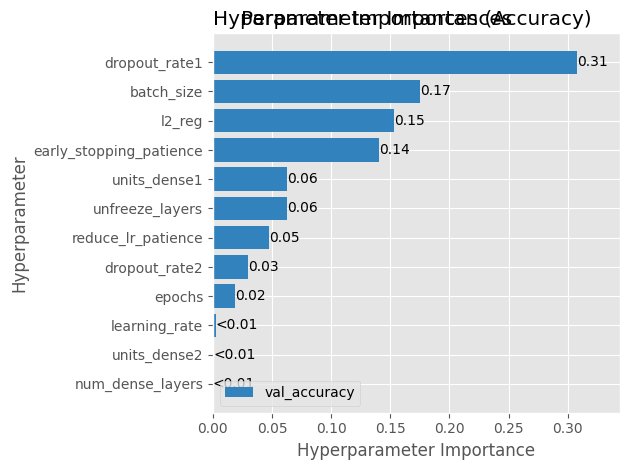

source2: /notebooks/train3/all_malware/7
name_save_model: fusion_MobileNet_tf_optunav27
Found 7350 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Found 1575 images belonging to 7 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3526087
Trainable params: 1890567
Non-trainable params: 1635520
Epoch 1/45
114/114 [==============================] - 14s 85ms/step - loss: 0.8745 - accuracy: 0.8114 - val_loss: 0.6945 - val_accuracy: 0.9089 - lr: 8.2346e-05
Epoch 2/45
114/114 [==============================] - 9s 76ms/step - loss: 0.4860 - accuracy: 0.9397 - val_loss: 0.4133 - val_accuracy: 0.9727 - lr: 8.2346e-05
Epoch 3/45
114/114 [==============================] - 9s 77ms/step - loss: 0.4072 - accuracy: 0.9654 - val_loss: 0.3594 - val_accuracy: 0.9766 - lr: 8.2346e-05
Epoch 4/45
114/114 [==============================] - 9s 76ms/step - loss:

Model and History saved...
230/230 [==============================] - 14s 61ms/step - loss: 0.2957 - accuracy: 0.9952
Train Accuracy: 0.9952380657196045
Train Log Loss: 0.29574304819107056
50/50 [==============================] - 3s 63ms/step - loss: 0.3200 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.3199627101421356
50/50 [==============================] - 3s 60ms/step - loss: 0.3230 - accuracy: 0.9892
Test Accuracy: 0.9892063736915588
Test Log Loss: 0.3230031132698059
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 223   2   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 216   0   9]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

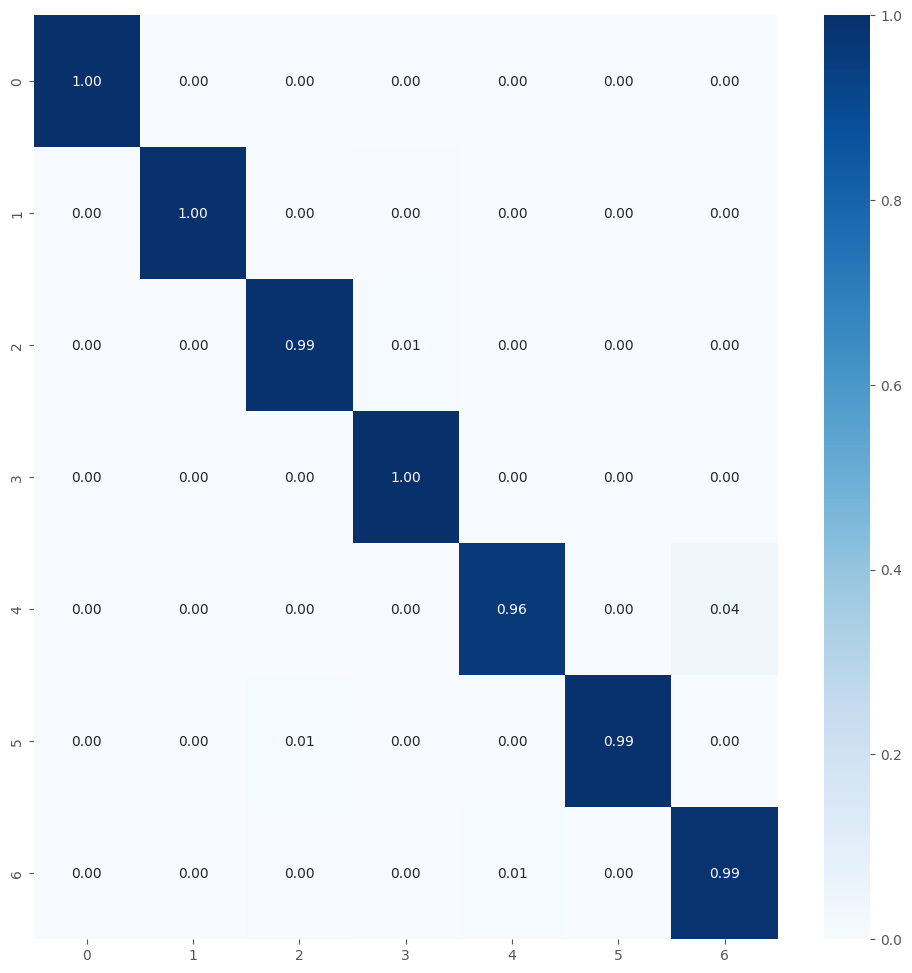


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3526087
Trainable params: 1890567
Non-trainable params: 1635520
Epoch 1/45
114/114 [==============================] - 14s 84ms/step - loss: 0.8186 - accuracy: 0.8200 - val_loss: 0.7982 - val_accuracy: 0.8190 - lr: 8.2346e-05
Epoch 2/45
114/114 [==============================] - 8s 74ms/step - loss: 0.4626 - accuracy: 0.9430 - val_loss: 0.3951 - val_accuracy: 0.9792 - lr: 8.2346e-05
Epoch 3/45
114/114 [==============================] - 9s 77ms/step - loss: 0.3965 - accuracy: 0.9641 - val_loss: 0.3556 - val_accuracy: 0.9870 - lr: 8.2346e-05
Epoch 4/45
114/114 [==============================] - 9s 78ms/step - loss: 0.3622 - accuracy: 0.9792 - val_loss: 0.3587 - val_accuracy: 0.9779 - lr: 8.2346e-05
Epoch 5/45
114/114 [==============================] - 11s 95ms/step - loss: 0.3373 - accuracy: 0.9855 - val_loss: 0.3338 - val_accuracy: 0.9935 - lr: 8.2346e-05
Epoch 6/45
114/114 [==============================] - 9s 78ms/step - loss: 0.3371 

Model and History saved...
230/230 [==============================] - 15s 65ms/step - loss: 0.2518 - accuracy: 0.9999
Train Accuracy: 0.9998639225959778
Train Log Loss: 0.2518250048160553
50/50 [==============================] - 3s 61ms/step - loss: 0.2866 - accuracy: 0.9937
Validation Accuracy: 0.9936507940292358
Validation Log Loss: 0.28657248616218567
50/50 [==============================] - 3s 61ms/step - loss: 0.2839 - accuracy: 0.9949
Test Accuracy: 0.9949206113815308
Test Log Loss: 0.2838726043701172
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 223   0   2]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support

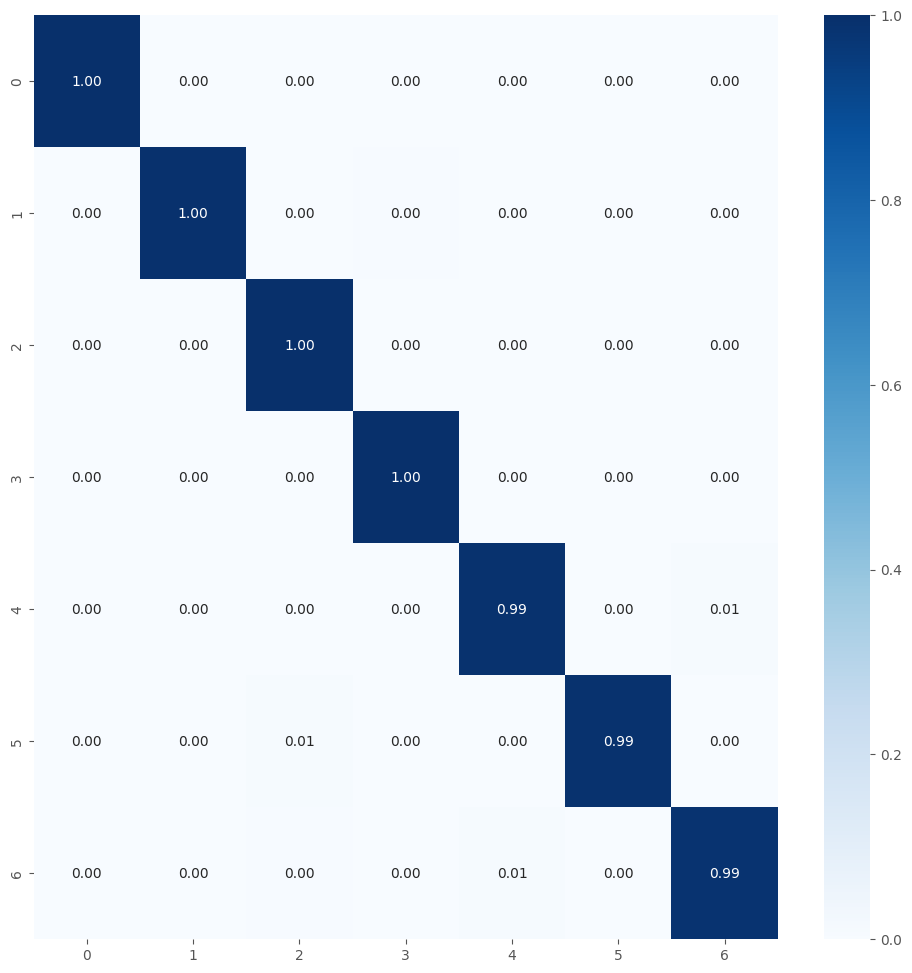


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3526087
Trainable params: 1890567
Non-trainable params: 1635520
Epoch 1/45
114/114 [==============================] - 13s 82ms/step - loss: 0.8958 - accuracy: 0.8128 - val_loss: 0.9311 - val_accuracy: 0.8411 - lr: 8.2346e-05
Epoch 2/45
114/114 [==============================] - 9s 77ms/step - loss: 0.4994 - accuracy: 0.9348 - val_loss: 0.4292 - val_accuracy: 0.9753 - lr: 8.2346e-05
Epoch 3/45
114/114 [==============================] - 9s 80ms/step - loss: 0.4111 - accuracy: 0.9660 - val_loss: 0.4290 - val_accuracy: 0.9479 - lr: 8.2346e-05
Epoch 4/45
114/114 [==============================] - 9s 77ms/step - loss: 0.3757 - accuracy: 0.9772 - val_loss: 0.3600 - val_accuracy: 0.9857 - lr: 8.2346e-05
Epoch 5/45
114/114 [==============================] - 9s 78ms/step - loss: 0.3551 - accuracy: 0.9799 - val_loss: 0.3398 - val_accuracy: 0.9883 - lr: 8.2346e-05
Epoch 6/45
114/114 [==============================] - 9s 80ms/step - loss: 0.3307 -

Model and History saved...
230/230 [==============================] - 14s 59ms/step - loss: 0.2718 - accuracy: 0.9989
Train Accuracy: 0.9989115595817566
Train Log Loss: 0.27180537581443787
50/50 [==============================] - 3s 60ms/step - loss: 0.2933 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.2933354079723358
50/50 [==============================] - 3s 62ms/step - loss: 0.2996 - accuracy: 0.9930
Test Accuracy: 0.9930158853530884
Test Log Loss: 0.2996487617492676
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 222   0   3]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   4   0 220]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support


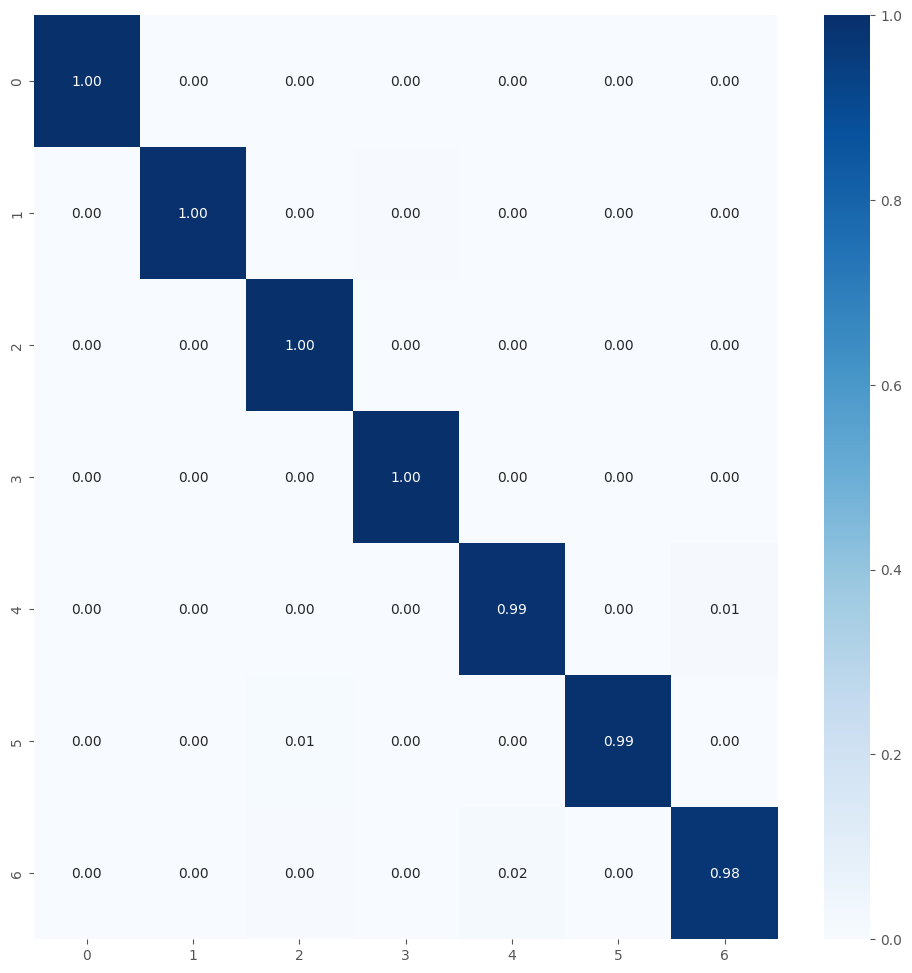


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3526087
Trainable params: 1890567
Non-trainable params: 1635520
Epoch 1/45
114/114 [==============================] - 13s 80ms/step - loss: 0.8057 - accuracy: 0.8266 - val_loss: 0.7469 - val_accuracy: 0.8802 - lr: 8.2346e-05
Epoch 2/45
114/114 [==============================] - 9s 76ms/step - loss: 0.4541 - accuracy: 0.9474 - val_loss: 0.4683 - val_accuracy: 0.9245 - lr: 8.2346e-05
Epoch 3/45
114/114 [==============================] - 9s 76ms/step - loss: 0.3939 - accuracy: 0.9677 - val_loss: 0.3636 - val_accuracy: 0.9792 - lr: 8.2346e-05
Epoch 4/45
114/114 [==============================] - 11s 96ms/step - loss: 0.3699 - accuracy: 0.9770 - val_loss: 0.3544 - val_accuracy: 0.9870 - lr: 8.2346e-05
Epoch 5/45
114/114 [==============================] - 9s 76ms/step - loss: 0.3470 - accuracy: 0.9822 - val_loss: 0.3449 - val_accuracy: 0.9831 - lr: 8.2346e-05
Epoch 6/45
114/114 [==============================] - 9s 76ms/step - loss: 0.3349 

Model and History saved...
230/230 [==============================] - 13s 58ms/step - loss: 0.2819 - accuracy: 0.9971
Train Accuracy: 0.9971428513526917
Train Log Loss: 0.28188493847846985
50/50 [==============================] - 3s 58ms/step - loss: 0.3070 - accuracy: 0.9930
Validation Accuracy: 0.9930158853530884
Validation Log Loss: 0.30698880553245544
50/50 [==============================] - 3s 59ms/step - loss: 0.3048 - accuracy: 0.9924
Test Accuracy: 0.9923809766769409
Test Log Loss: 0.3047656714916229
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 225   0   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 224   0   1]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   7   0 217]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   suppor

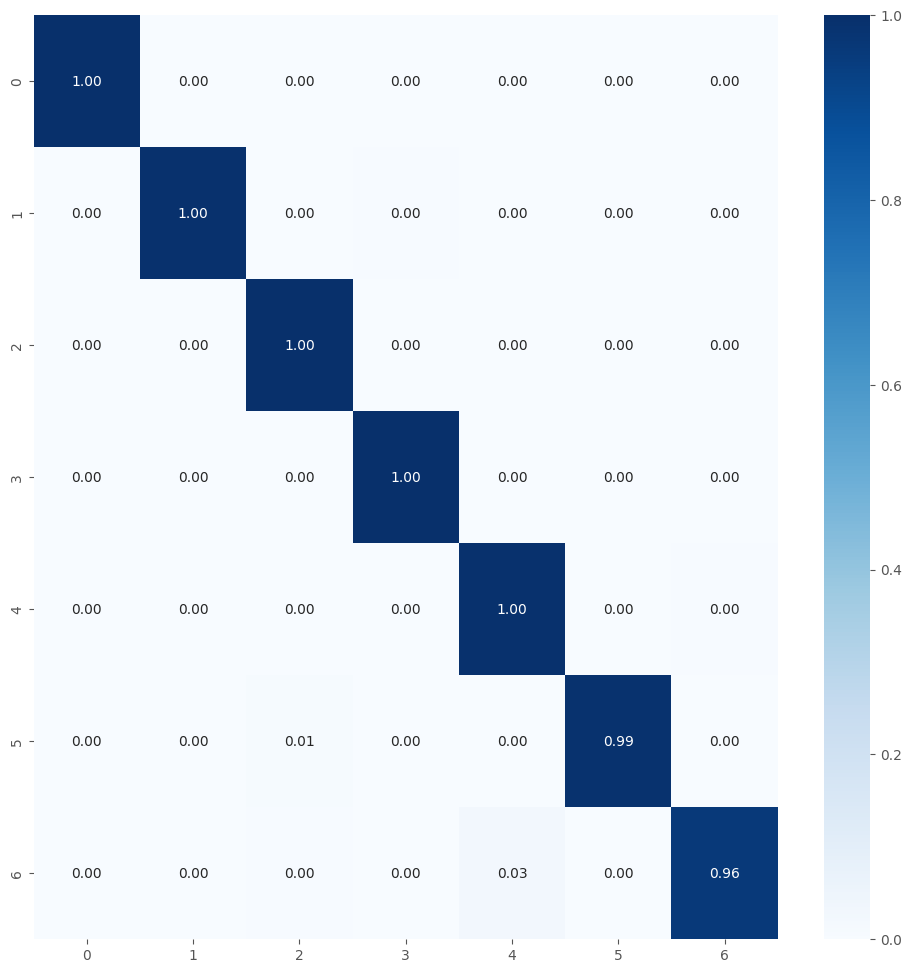


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3526087
Trainable params: 1890567
Non-trainable params: 1635520
Epoch 1/45
114/114 [==============================] - 14s 81ms/step - loss: 0.9058 - accuracy: 0.7971 - val_loss: 0.9368 - val_accuracy: 0.7760 - lr: 8.2346e-05
Epoch 2/45
114/114 [==============================] - 9s 75ms/step - loss: 0.4779 - accuracy: 0.9405 - val_loss: 0.5516 - val_accuracy: 0.9062 - lr: 8.2346e-05
Epoch 3/45
114/114 [==============================] - 8s 74ms/step - loss: 0.4105 - accuracy: 0.9634 - val_loss: 0.4051 - val_accuracy: 0.9753 - lr: 8.2346e-05
Epoch 4/45
114/114 [==============================] - 8s 74ms/step - loss: 0.3630 - accuracy: 0.9783 - val_loss: 0.3925 - val_accuracy: 0.9674 - lr: 8.2346e-05
Epoch 5/45
114/114 [==============================] - 8s 73ms/step - loss: 0.3551 - accuracy: 0.9843 - val_loss: 0.3563 - val_accuracy: 0.9844 - lr: 8.2346e-05
Epoch 6/45
114/114 [==============================] - 8s 74ms/step - loss: 0.3505 -

Model and History saved...
230/230 [==============================] - 14s 59ms/step - loss: 0.2628 - accuracy: 0.9997
Train Accuracy: 0.9997279047966003
Train Log Loss: 0.2628386318683624
50/50 [==============================] - 3s 61ms/step - loss: 0.2876 - accuracy: 0.9949
Validation Accuracy: 0.9949206113815308
Validation Log Loss: 0.2875843346118927
50/50 [==============================] - 3s 59ms/step - loss: 0.2874 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.2874373197555542
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'mira': 3, 'sfone': 4, 'sillyp2p': 5, 'wabot': 6}

Matriz de Confusión:
[[225   0   0   0   0   0   0]
 [  0 224   0   1   0   0   0]
 [  0   0 224   1   0   0   0]
 [  0   0   0 225   0   0   0]
 [  0   0   0   0 225   0   0]
 [  0   0   2   0   0 223   0]
 [  0   0   1   0   2   0 222]]
True labels: 1575
Predicted labels: len(predicted_labels)

Classification report:
              precision    recall  f1-score   support



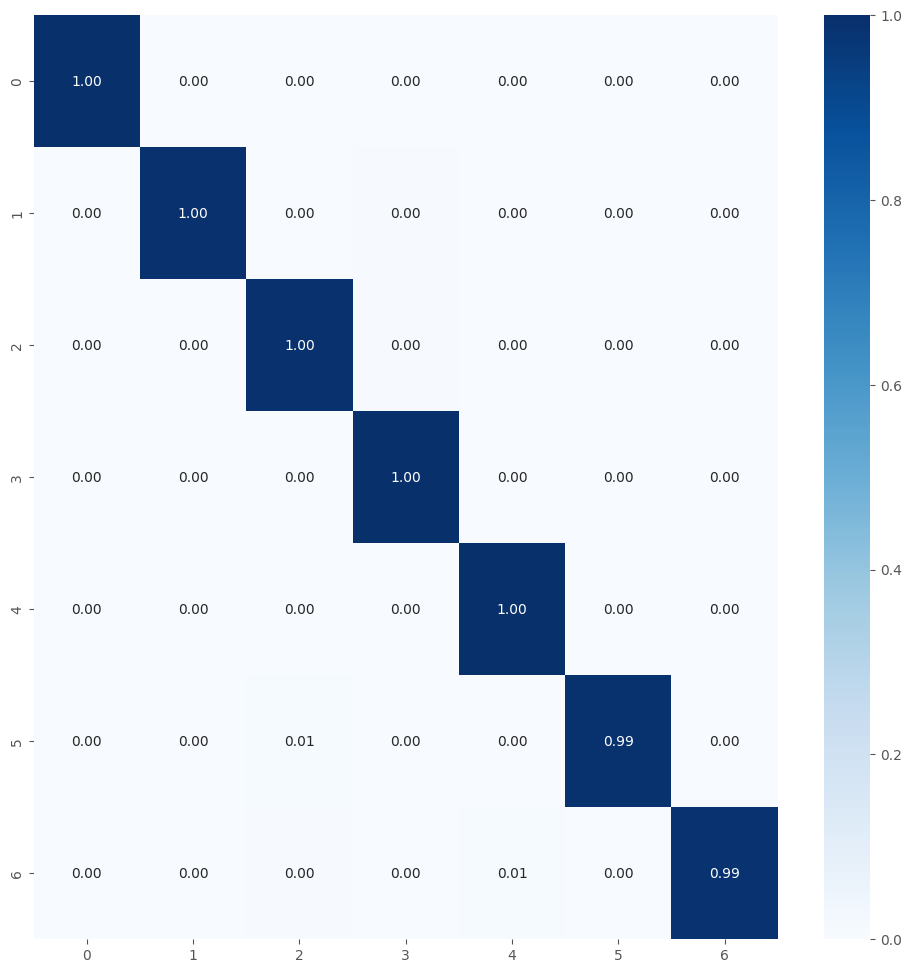

Average training accuracy in 5-fold: 0.9991758346557618
Average validation precision in 5-fold: 0.9979166746139526

Test Metrics
test_acc_list: [0.9892063736915588, 0.9949206113815308, 0.9930158853530884, 0.9923809766769409, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9930158853530884
test_loss_list: [0.3230031132698059, 0.2838726043701172, 0.2996487617492676, 0.3047656714916229, 0.2874373197555542]
Average Test Log Loss with 5-fold: 0.2997454941272736
Precision List: [0.989347488298904, 0.9949428380263765, 0.993037899522806, 0.9925038771765375, 0.9955947136563877]
Average Precision List with 5-fold: 0.9930853633362023
Recall List: [0.9892063492063493, 0.994920634920635, 0.993015873015873, 0.9923809523809525, 0.9955555555555556]
Average Recall List with 5-fold: 0.993015873015873
F1 Score List: [0.9892075803554512, 0.9949205692838692, 0.9930129320254716, 0.9923726920856911, 0.9955568597647554]
Average F1 Score List with 5-fold: 0.9930141267030477

Metrics List Store

test_ac

In [37]:
%%time

num_classes = 7
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 04:37:26,365] A new study created in memory with name: no-name-72b1259d-b872-4a9f-b6ce-e129d97e6ad2


Familias de malware copiadas
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3513416
Trainable params: 1336712
Non-trainable params: 2176704


[I 2025-06-06 04:37:51,315] Trial 0 finished with values: [0.9666666388511658, 0.6368314027786255] and parameters: {'learning_rate': 0.0014544712771207544, 'dropout_rate1': 0.542917624671811, 'dropout_rate2': 0.42052571807984274, 'l2_reg': 0.0010870472100769607, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 16, 'epochs': 33, 'num_dense_layers': 3, 'unfreeze_layers': 5, 'early_stopping_patience': 19, 'reduce_lr_patience': 14, 'units_dense3': 64, 'dropout_rate3': 0.35860502650381776}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3830152
Trainable params: 2189512
Non-trainable params: 1640640


[I 2025-06-06 04:43:24,902] Trial 1 finished with values: [0.9933035969734192, 0.13472560048103333] and parameters: {'learning_rate': 0.0007455992301141262, 'dropout_rate1': 0.3414409662708869, 'dropout_rate2': 0.3954530078976849, 'l2_reg': 0.003643727455501071, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 34, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'units_dense3': 64, 'dropout_rate3': 0.3057828838480443}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3509256
Trainable params: 1874760
Non-trainable params: 1634496


[I 2025-06-06 04:55:50,769] Trial 2 finished with values: [0.9938616156578064, 0.13804315030574799] and parameters: {'learning_rate': 0.009945096447445474, 'dropout_rate1': 0.49173505783465876, 'dropout_rate2': 0.37006684325482386, 'l2_reg': 0.00024209497050977459, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 32, 'epochs': 34, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 12}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032


[I 2025-06-06 05:21:03,894] Trial 3 finished with values: [0.99609375, 0.06327850371599197] and parameters: {'learning_rate': 0.0014732078987803891, 'dropout_rate1': 0.27576512342425263, 'dropout_rate2': 0.4564511775170249, 'l2_reg': 0.0013953053317418674, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 32, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 20, 'reduce_lr_patience': 15, 'units_dense3': 32, 'dropout_rate3': 0.15037284725602817}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4414792
Trainable params: 2777736
Non-trainable params: 1637056


[I 2025-06-06 05:41:59,505] Trial 4 finished with values: [0.9933035969734192, 0.059521596878767014] and parameters: {'learning_rate': 0.0002581366897940907, 'dropout_rate1': 0.24155354144854876, 'dropout_rate2': 0.3122368322845127, 'l2_reg': 0.005033399210442342, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 32, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 14, 'reduce_lr_patience': 11}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3889096
Trainable params: 2253064
Non-trainable params: 1636032


[I 2025-06-06 06:16:16,315] Trial 5 finished with values: [0.9955357313156128, 0.045979373157024384] and parameters: {'learning_rate': 8.356137127835495e-05, 'dropout_rate1': 0.22468435927290265, 'dropout_rate2': 0.39334085261690654, 'l2_reg': 0.0005579756758065621, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 19, 'reduce_lr_patience': 10}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3560136
Trainable params: 1925640
Non-trainable params: 1634496


[I 2025-06-06 06:27:15,852] Trial 6 finished with values: [0.9910714030265808, 0.10330605506896973] and parameters: {'learning_rate': 0.008011563421779054, 'dropout_rate1': 0.526963509092778, 'dropout_rate2': 0.3684878702152429, 'l2_reg': 1.8707850975847594e-05, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 14}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3889096
Trainable params: 1721096
Non-trainable params: 2168000


[I 2025-06-06 06:54:49,189] Trial 7 finished with values: [0.99609375, 0.0819346085190773] and parameters: {'learning_rate': 1.9563296484782545e-05, 'dropout_rate1': 0.3962386525070333, 'dropout_rate2': 0.35926951040493627, 'l2_reg': 5.951076453193914e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 11, 'reduce_lr_patience': 8}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3509256
Trainable params: 1341768
Non-trainable params: 2167488


[I 2025-06-06 07:21:58,106] Trial 8 finished with values: [0.9955357313156128, 0.04335079342126846] and parameters: {'learning_rate': 0.00024791039834337625, 'dropout_rate1': 0.2687430220509607, 'dropout_rate2': 0.14804488495957183, 'l2_reg': 0.0004865962582549721, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 32, 'epochs': 37, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 14}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4350504
Trainable params: 2714472
Non-trainable params: 1636032


[I 2025-06-06 07:22:59,269] Trial 9 finished with values: [0.9611111283302307, 3.131136655807495] and parameters: {'learning_rate': 0.0002952557634423445, 'dropout_rate1': 0.2101500408654105, 'dropout_rate2': 0.3477733956181888, 'l2_reg': 0.00305175398719953, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 26, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 12, 'reduce_lr_patience': 9, 'units_dense3': 32, 'dropout_rate3': 0.2991092104697241}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 3:
    val_accuracy: 0.9961
    val_loss: 0.0633
    Parámetros: {'learning_rate': 0.0014732078987803891, 'dropout_rate1': 0.27576512342425263, 'dropout_rate2': 0.4564511775170249, 'l2_reg': 0.0013953053317418674, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 32, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 20, 'reduce_lr_patience': 15, 'units_dense3': 32, 'dropout_rate3': 0.15037284725602817}
  Trial 8:
    val_accuracy: 0.9955
    val_loss: 0.0434
    Parámetros: {'learning_rate': 0.00024791039834337625, 'dropout_rate1': 0.2687430220509607, 'dropout_rate2': 0.14804488495957183, 'l2_reg': 0.0004865962582549721, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 32, 'epochs': 37, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 14}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


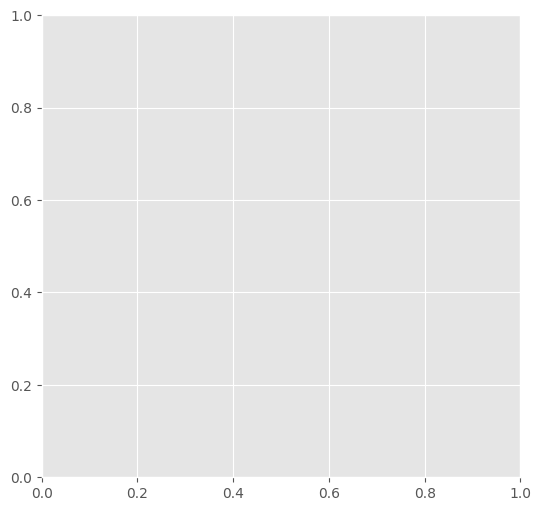

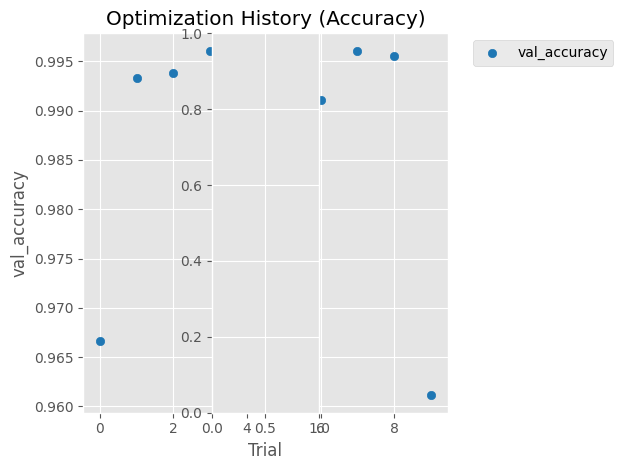

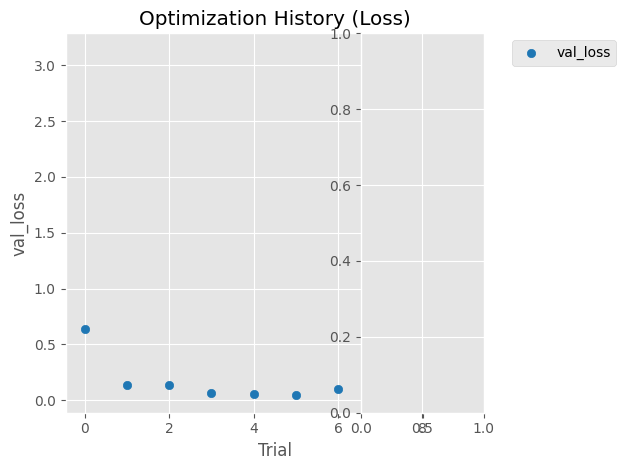

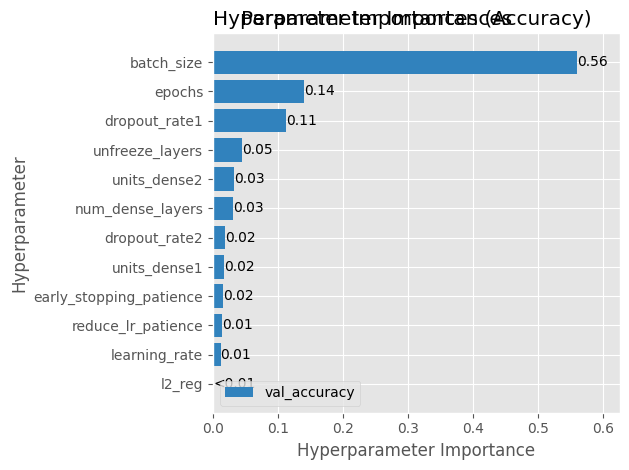

source2: /notebooks/train3/all_malware/8
name_save_model: fusion_MobileNet_tf_optunav28
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032
Epoch 1/35
262/262 [==============================] - 45s 133ms/step - loss: 1.3334 - accuracy: 0.9120 - val_loss: 5.5930 - val_accuracy: 0.3398 - lr: 0.0015
Epoch 2/35
262/262 [==============================] - 40s 152ms/step - loss: 0.6574 - accuracy: 0.9716 - val_loss: 2.5272 - val_accuracy: 0.4922 - lr: 0.0015
Epoch 3/35
262/262 [==============================] - 46s 170ms/step - loss: 0.3915 - accuracy: 0.9802 - val_loss: 1.0837 - val_accuracy: 0.7282 - lr: 0.0015
Epoch 4/35
262/262 [==============================] - 43s 165ms/step - l

Model and History saved...
263/263 [==============================] - 38s 140ms/step - loss: 0.0665 - accuracy: 0.9986
Train Accuracy: 0.9985714554786682
Train Log Loss: 0.06649445742368698
57/57 [==============================] - 9s 138ms/step - loss: 0.0837 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.083675816655159
57/57 [==============================] - 8s 137ms/step - loss: 0.0818 - accuracy: 0.9967
Test Accuracy: 0.996666669845581
Test Log Loss: 0.08176350593566895
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   0   0   0   2   0 223]]
True labels: 1800
Predicted labels: len(predicted_labels)

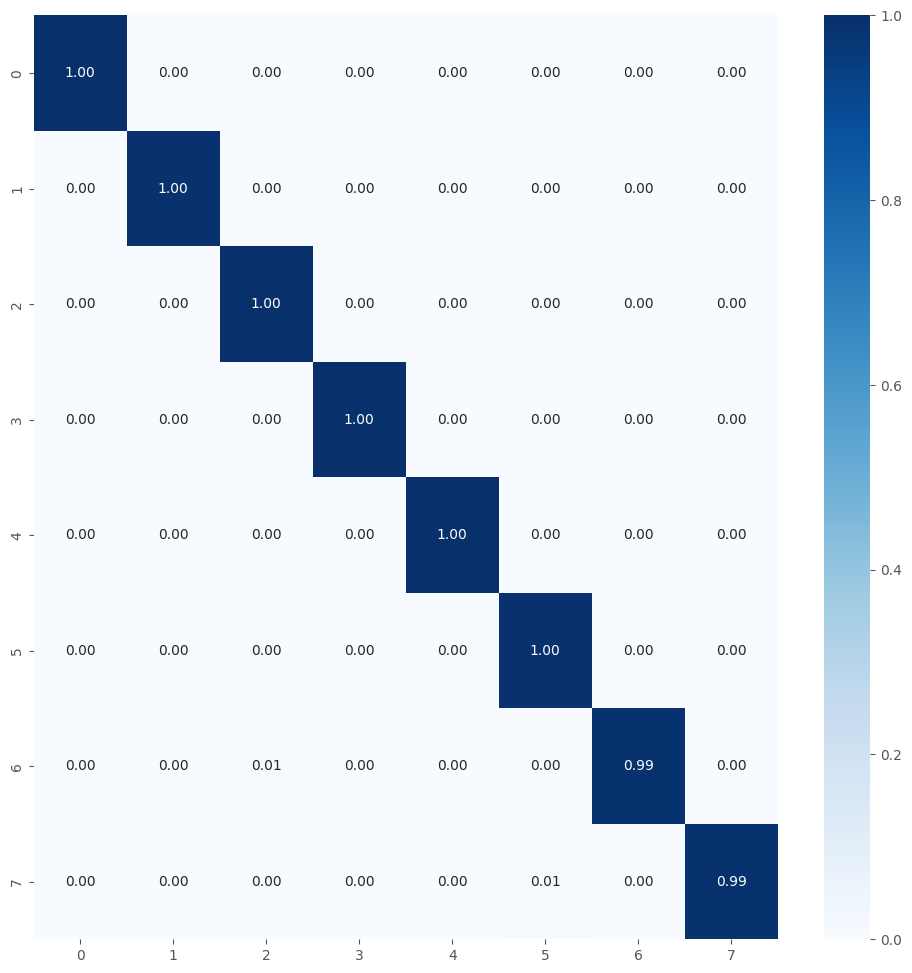


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032
Epoch 1/35
262/262 [==============================] - 65s 192ms/step - loss: 1.3637 - accuracy: 0.9051 - val_loss: 5.7798 - val_accuracy: 0.2489 - lr: 0.0015
Epoch 2/35
262/262 [==============================] - 46s 173ms/step - loss: 0.6691 - accuracy: 0.9743 - val_loss: 4.7795 - val_accuracy: 0.3895 - lr: 0.0015
Epoch 3/35
262/262 [==============================] - 45s 173ms/step - loss: 0.3926 - accuracy: 0.9806 - val_loss: 1.6747 - val_accuracy: 0.6166 - lr: 0.0015
Epoch 4/35
262/262 [==============================] - 47s 178ms/step - loss: 0.2573 - accuracy: 0.9855 - val_loss: 0.9227 - val_accuracy: 0.6853 - lr: 0.0015
Epoch 5/35
262/262 [==============================] - 49s 183ms/step - loss: 0.2166 - accuracy: 0.9845 - val_loss: 1.0389 - val_accuracy: 0.6936 - lr: 0.0015
Epoch 6/35
262/262 [==============================] - 45s 170ms/step - loss: 0.1944 - accuracy

Model and History saved...
263/263 [==============================] - 35s 132ms/step - loss: 0.0871 - accuracy: 0.9964
Train Accuracy: 0.9964285492897034
Train Log Loss: 0.08707672357559204
57/57 [==============================] - 8s 130ms/step - loss: 0.1043 - accuracy: 0.9944
Validation Accuracy: 0.9944444298744202
Validation Log Loss: 0.10429757833480835
57/57 [==============================] - 8s 127ms/step - loss: 0.1050 - accuracy: 0.9939
Test Accuracy: 0.9938889145851135
Test Log Loss: 0.10496173799037933
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 224   0   0   0   0   1]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 222   0   3]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   1   2   0 221]]
True labels: 1800
Predicted labels: len(predicted_labe

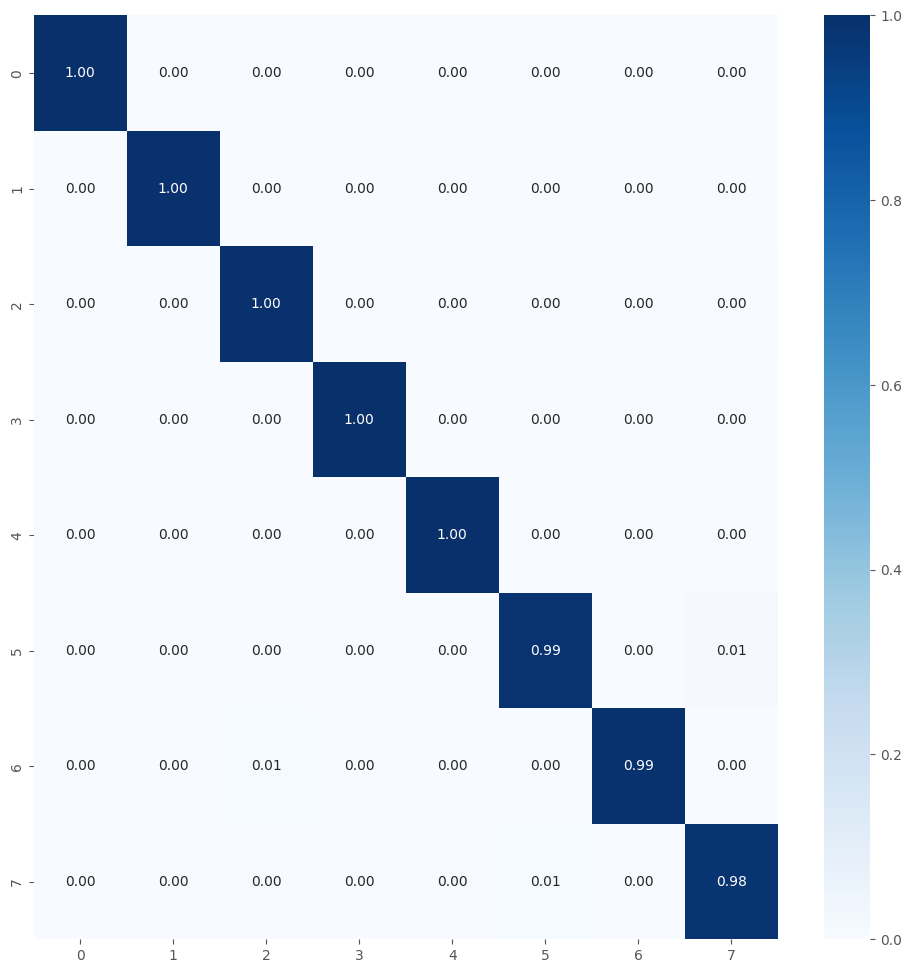


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032
Epoch 1/35
262/262 [==============================] - 60s 177ms/step - loss: 1.3797 - accuracy: 0.9062 - val_loss: 16.2520 - val_accuracy: 0.1250 - lr: 0.0015
Epoch 2/35
262/262 [==============================] - 44s 167ms/step - loss: 0.7282 - accuracy: 0.9701 - val_loss: 1.8377 - val_accuracy: 0.6942 - lr: 0.0015
Epoch 3/35
262/262 [==============================] - 44s 166ms/step - loss: 0.4056 - accuracy: 0.9816 - val_loss: 3.0638 - val_accuracy: 0.3990 - lr: 0.0015
Epoch 4/35
262/262 [==============================] - 43s 165ms/step - loss: 0.2828 - accuracy: 0.9836 - val_loss: 6.8837 - val_accuracy: 0.2718 - lr: 0.0015
Epoch 5/35
262/262 [==============================] - 47s 180ms/step - loss: 0.2070 - accuracy: 0.9879 - val_loss: 0.2924 - val_accuracy: 0.9604 - lr: 0.0015
Epoch 6/35
262/262 [==============================] - 44s 163ms/step - loss: 0.1477 - accurac

Model and History saved...
263/263 [==============================] - 33s 125ms/step - loss: 0.5273 - accuracy: 0.8639
Train Accuracy: 0.8639285564422607
Train Log Loss: 0.527334988117218
57/57 [==============================] - 6s 93ms/step - loss: 0.5554 - accuracy: 0.8578
Validation Accuracy: 0.8577777743339539
Validation Log Loss: 0.5554198026657104
57/57 [==============================] - 5s 91ms/step - loss: 0.5845 - accuracy: 0.8594
Test Accuracy: 0.8594444394111633
Test Log Loss: 0.5844836235046387
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[209   0   0   0   0   0   0  16]
 [  0 224   0   0   0   0   0   1]
 [  0   0 156   0   0   0   0  69]
 [  0   0   0 219   0   0   2   4]
 [  0   0   0   0 168   0   1  56]
 [  0   0   0   0   0 123   0 102]
 [  0   0   1   0   0   0 223   1]
 [  0   0   0   0   0   0   0 225]]
True labels: 1800
Predicted labels: len(predicted_labels)

C

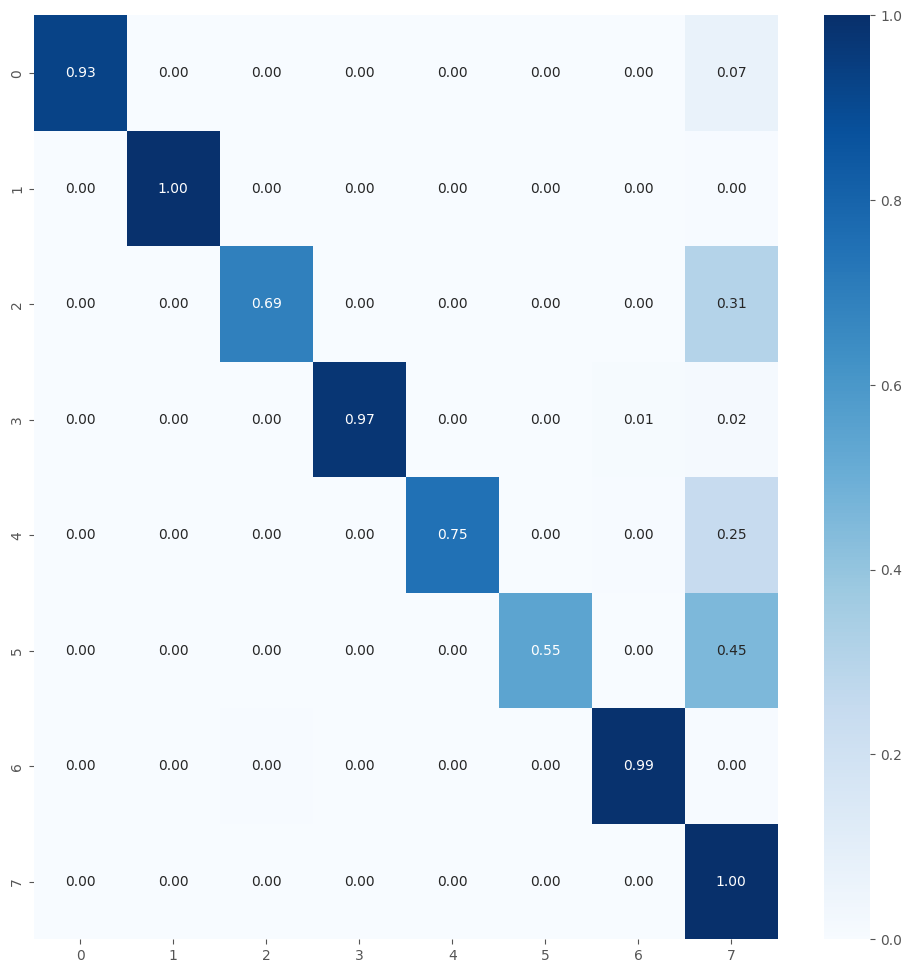


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032
Epoch 1/35
262/262 [==============================] - 56s 163ms/step - loss: 1.3721 - accuracy: 0.9052 - val_loss: 4.3454 - val_accuracy: 0.3627 - lr: 0.0015
Epoch 2/35
262/262 [==============================] - 42s 160ms/step - loss: 0.6899 - accuracy: 0.9698 - val_loss: 1.7285 - val_accuracy: 0.6217 - lr: 0.0015
Epoch 3/35
262/262 [==============================] - 43s 165ms/step - loss: 0.4046 - accuracy: 0.9828 - val_loss: 2.0749 - val_accuracy: 0.5921 - lr: 0.0015
Epoch 4/35
262/262 [==============================] - 44s 167ms/step - loss: 0.2689 - accuracy: 0.9840 - val_loss: 3.2277 - val_accuracy: 0.4821 - lr: 0.0015
Epoch 5/35
262/262 [==============================] - 44s 167ms/step - loss: 0.1920 - accuracy: 0.9888 - val_loss: 0.5676 - val_accuracy: 0.8521 - lr: 0.0015
Epoch 6/35
262/262 [==============================] - 44s 166ms/step - loss: 0.1861 - accuracy

Model and History saved...
263/263 [==============================] - 36s 136ms/step - loss: 0.0262 - accuracy: 0.9999
Train Accuracy: 0.9998809695243835
Train Log Loss: 0.026160497218370438
57/57 [==============================] - 9s 141ms/step - loss: 0.0537 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.053717367351055145
57/57 [==============================] - 8s 136ms/step - loss: 0.0481 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.04809952154755592
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 223   0   2]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   2   0 222]]
True labels: 1800
Predicted labels: len(predicted_lab

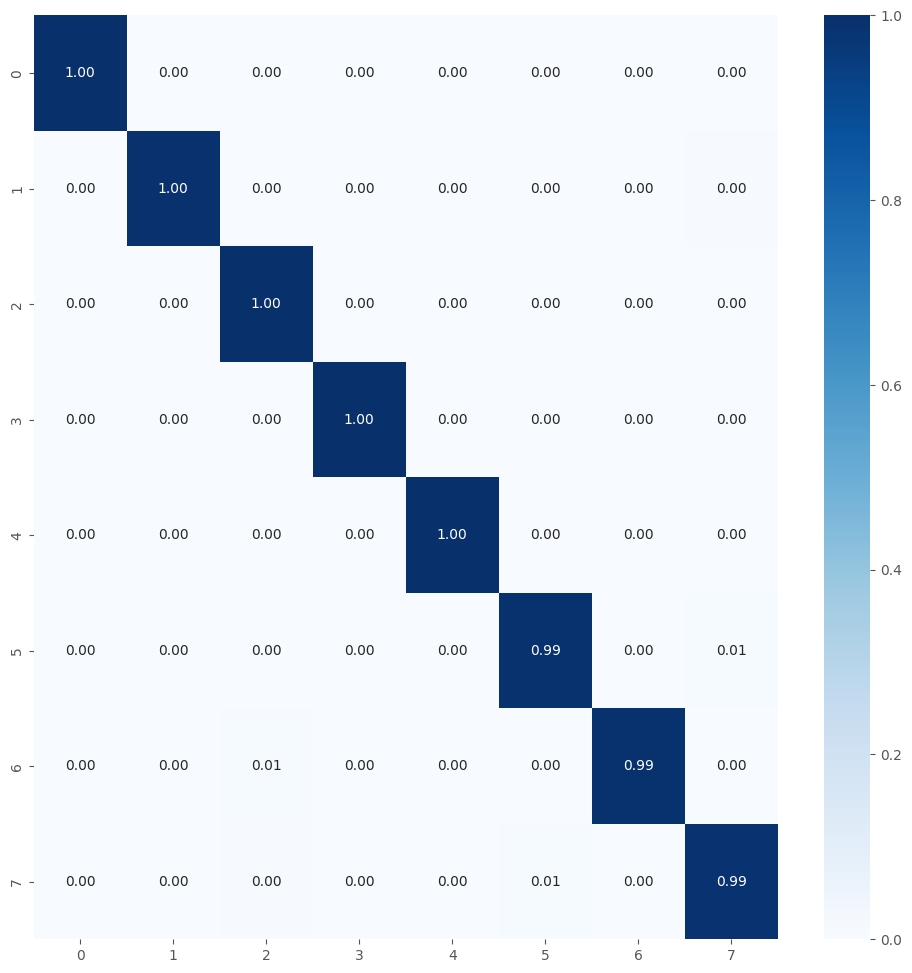


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032
Epoch 1/35
262/262 [==============================] - 56s 164ms/step - loss: 1.3112 - accuracy: 0.9244 - val_loss: 1.6556 - val_accuracy: 0.7003 - lr: 0.0015
Epoch 2/35
262/262 [==============================] - 45s 170ms/step - loss: 0.6402 - accuracy: 0.9734 - val_loss: 3.3246 - val_accuracy: 0.5419 - lr: 0.0015
Epoch 3/35
262/262 [==============================] - 41s 155ms/step - loss: 0.3762 - accuracy: 0.9769 - val_loss: 1.3744 - val_accuracy: 0.6177 - lr: 0.0015
Epoch 4/35
262/262 [==============================] - 42s 160ms/step - loss: 0.2614 - accuracy: 0.9847 - val_loss: 0.6393 - val_accuracy: 0.8248 - lr: 0.0015
Epoch 5/35
262/262 [==============================] - 43s 165ms/step - loss: 0.2109 - accuracy: 0.9879 - val_loss: 0.5033 - val_accuracy: 0.8739 - lr: 0.0015
Epoch 6/35
262/262 [==============================] - 42s 159ms/step - loss: 0.1622 - accuracy

Model and History saved...
263/263 [==============================] - 29s 111ms/step - loss: 0.0794 - accuracy: 0.9921
Train Accuracy: 0.9921428561210632
Train Log Loss: 0.0794176384806633
57/57 [==============================] - 9s 144ms/step - loss: 0.1244 - accuracy: 0.9861
Validation Accuracy: 0.9861111044883728
Validation Log Loss: 0.12441977113485336
57/57 [==============================] - 7s 118ms/step - loss: 0.1270 - accuracy: 0.9806
Test Accuracy: 0.980555534362793
Test Log Loss: 0.12695881724357605
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[214   0   0   5   1   5   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0  20   0 204]]
True labels: 1800
Predicted labels: len(predicted_labels

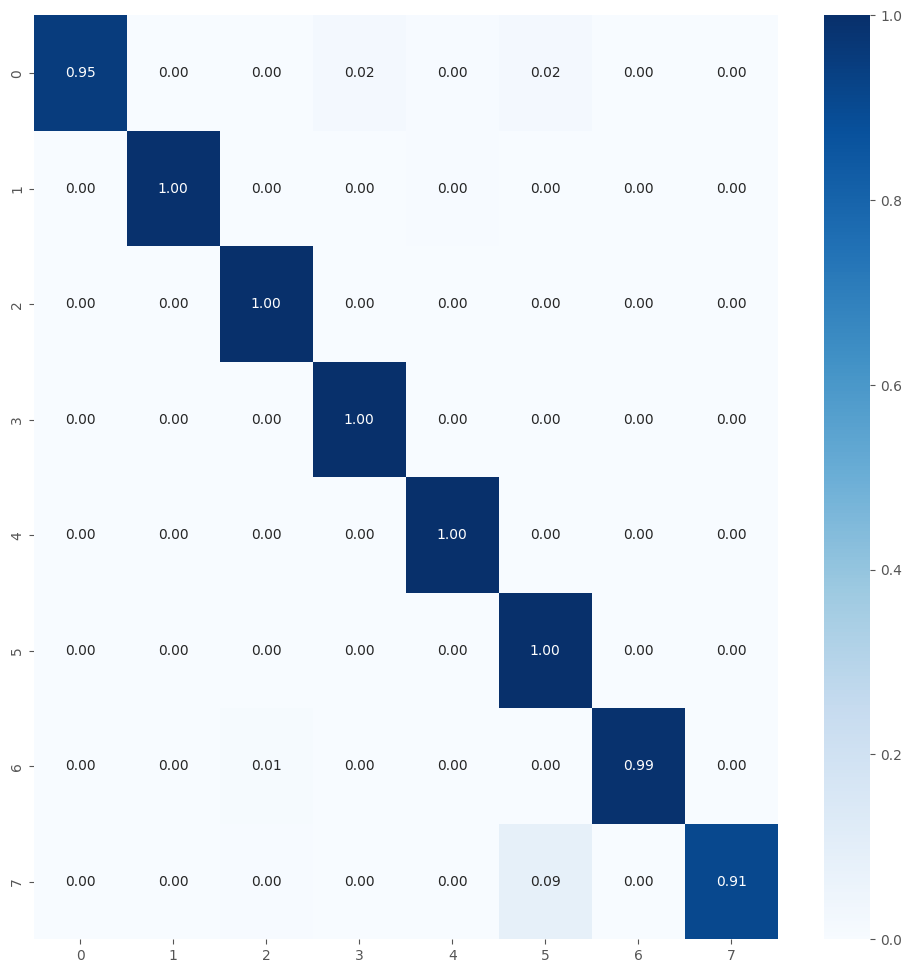

Average training accuracy in 5-fold: 0.998542070388794
Average validation precision in 5-fold: 0.9950892806053162

Test Metrics
test_acc_list: [0.996666669845581, 0.9938889145851135, 0.8594444394111633, 0.995555579662323, 0.980555534362793]
Average Test Accuracy with 5-fold: 0.9652222275733948
test_loss_list: [0.08176350593566895, 0.10496173799037933, 0.5844836235046387, 0.04809952154755592, 0.12695881724357605]
Average Test Log Loss with 5-fold: 0.18925344124436377
Precision List: [0.996681350664413, 0.9939084023844487, 0.9318799726586273, 0.9955774853801169, 0.9820365502676438]
Average Precision List with 5-fold: 0.9800167522710499
Recall List: [0.9966666666666667, 0.9938888888888888, 0.8594444444444445, 0.9955555555555555, 0.9805555555555556]
Average Recall List with 5-fold: 0.9652222222222221
F1 Score List: [0.9966666337443683, 0.9938900714089401, 0.8698369519459102, 0.9955579755018745, 0.9805790826225659]
Average F1 Score List with 5-fold: 0.967306143044732

Metrics List Store

te

In [38]:
%%time

num_classes = 8
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 09:50:20,824] A new study created in memory with name: no-name-ff5a6d2d-b195-4cb7-8b1f-cc8a7dff962f


Familias de malware copiadas
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 4547273
Trainable params: 2378249
Non-trainable params: 2169024


[I 2025-06-06 09:51:25,091] Trial 0 finished with values: [0.9753086566925049, 0.37535560131073] and parameters: {'learning_rate': 0.00045973814128469847, 'dropout_rate1': 0.2936899613245431, 'dropout_rate2': 0.20506280248980127, 'l2_reg': 0.00021041136233533353, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 16, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 11}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 3526345
Trainable params: 1886217
Non-trainable params: 1640128


[I 2025-06-06 09:52:38,257] Trial 1 finished with values: [0.8962963223457336, 0.6955665349960327] and parameters: {'learning_rate': 1.2914701997005993e-05, 'dropout_rate1': 0.550979558496624, 'dropout_rate2': 0.30310148660347896, 'l2_reg': 0.0005553102765968082, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 16, 'epochs': 27, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 13, 'reduce_lr_patience': 11}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 4431433
Trainable params: 2262409
Non-trainable params: 2169024


[I 2025-06-06 09:53:44,968] Trial 2 finished with values: [0.8523457050323486, 2.121880531311035] and parameters: {'learning_rate': 1.0109092391314559e-05, 'dropout_rate1': 0.33649370890302127, 'dropout_rate2': 0.4755925877128827, 'l2_reg': 0.0010458691749940256, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 45, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 20, 'reduce_lr_patience': 8, 'units_dense3': 128, 'dropout_rate3': 0.10291350666613915}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 3511113
Trainable params: 1870985
Non-trainable params: 1640128


[I 2025-06-06 10:10:39,917] Trial 3 finished with values: [0.9979838728904724, 0.06205572932958603] and parameters: {'learning_rate': 1.3610942299387914e-05, 'dropout_rate1': 0.28449015092035473, 'dropout_rate2': 0.25274927833788097, 'l2_reg': 7.989004453692165e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 36, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 9, 'units_dense3': 32, 'dropout_rate3': 0.27097304621982254}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 3822537
Trainable params: 2186505
Non-trainable params: 1636032


[I 2025-06-06 10:11:45,551] Trial 4 finished with values: [0.9456790089607239, 0.13834364712238312] and parameters: {'learning_rate': 0.00019380522530717628, 'dropout_rate1': 0.31794781124228255, 'dropout_rate2': 0.235878500099638, 'l2_reg': 1.3315430596041025e-05, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 16, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 13, 'reduce_lr_patience': 11}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 4350537
Trainable params: 2708873
Non-trainable params: 1641664


[I 2025-06-06 10:12:50,675] Trial 5 finished with values: [0.9644444584846497, 0.19418030977249146] and parameters: {'learning_rate': 0.00010078204503662102, 'dropout_rate1': 0.37030956826848316, 'dropout_rate2': 0.3869983140712431, 'l2_reg': 3.375859134375324e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 29, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 10, 'units_dense3': 32, 'dropout_rate3': 0.2887545632805032}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 4348745
Trainable params: 2712713
Non-trainable params: 1636032


[I 2025-06-06 10:13:55,389] Trial 6 finished with values: [0.9481481313705444, 0.2606896162033081] and parameters: {'learning_rate': 1.5481766222782332e-05, 'dropout_rate1': 0.2198787153481385, 'dropout_rate2': 0.1667472450638865, 'l2_reg': 5.085049203182726e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 26, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 15, 'reduce_lr_patience': 15}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 3789129
Trainable params: 1621129
Non-trainable params: 2168000


[I 2025-06-06 10:42:34,646] Trial 7 finished with values: [0.9960317611694336, 0.04037543013691902] and parameters: {'learning_rate': 0.0002218527073058604, 'dropout_rate1': 0.22629944934368995, 'dropout_rate2': 0.24683944662513602, 'l2_reg': 0.0008609167483397558, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 18, 'reduce_lr_patience': 10}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 3889353
Trainable params: 1721353
Non-trainable params: 2168000


[I 2025-06-06 11:12:38,225] Trial 8 finished with values: [0.9960317611694336, 0.0425107516348362] and parameters: {'learning_rate': 1.2674795178242965e-05, 'dropout_rate1': 0.4161896594980604, 'dropout_rate2': 0.4709790977699043, 'l2_reg': 1.5479519976606378e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 35, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 13, 'reduce_lr_patience': 8}.


Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Total params: 3789129
Trainable params: 1611913
Non-trainable params: 2177216


[I 2025-06-06 11:31:04,906] Trial 9 finished with values: [0.9969757795333862, 2.658402681350708] and parameters: {'learning_rate': 1.7663680384039206e-05, 'dropout_rate1': 0.5393465517304905, 'dropout_rate2': 0.13610586882279915, 'l2_reg': 0.009920267489237446, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 64, 'epochs': 43, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 15, 'reduce_lr_patience': 12}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 3:
    val_accuracy: 0.9980
    val_loss: 0.0621
    Parámetros: {'learning_rate': 1.3610942299387914e-05, 'dropout_rate1': 0.28449015092035473, 'dropout_rate2': 0.25274927833788097, 'l2_reg': 7.989004453692165e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 36, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 9, 'units_dense3': 32, 'dropout_rate3': 0.27097304621982254}
  Trial 7:
    val_accuracy: 0.9960
    val_loss: 0.0404
    Parámetros: {'learning_rate': 0.0002218527073058604, 'dropout_rate1': 0.22629944934368995, 'dropout_rate2': 0.24683944662513602, 'l2_reg': 0.0008609167483397558, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 18, 'reduce_lr_patience': 10}


/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


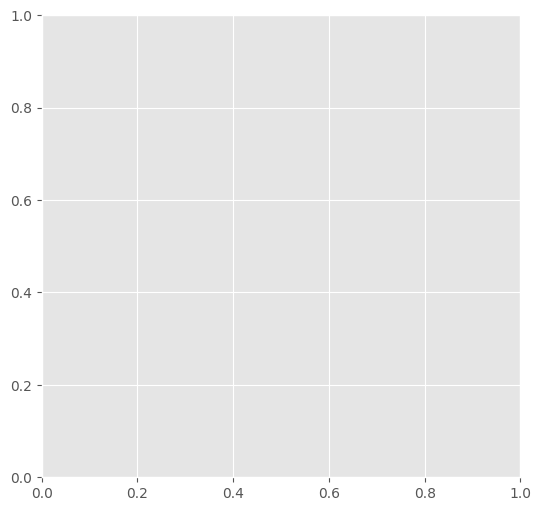

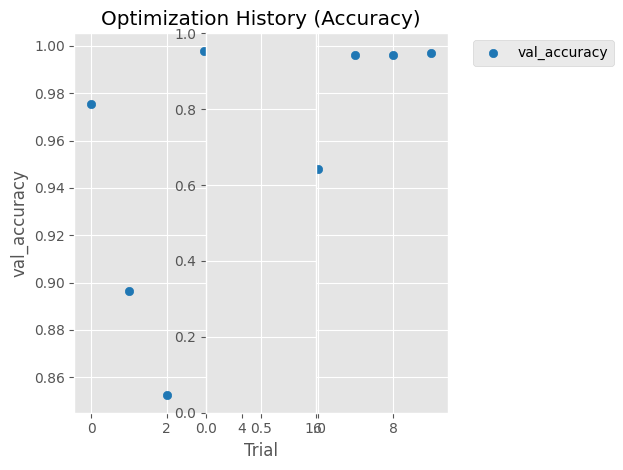

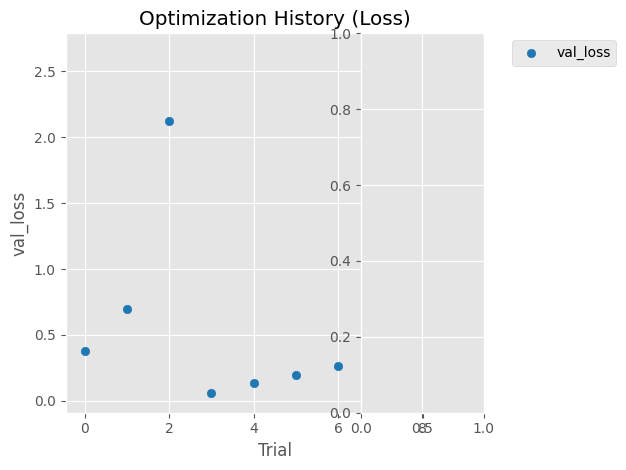

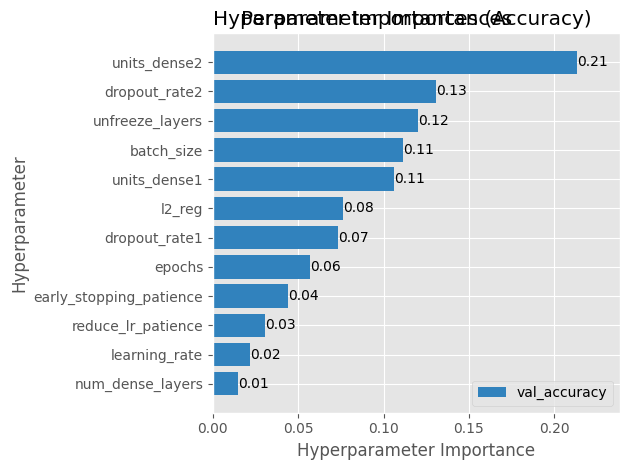

source2: /notebooks/train3/all_malware/9
name_save_model: fusion_MobileNet_tf_optunav29
Found 9450 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Found 2025 images belonging to 9 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3511113
Trainable params: 1870985
Non-trainable params: 1640128
Epoch 1/36
147/147 [==============================] - 40s 181ms/step - loss: 2.1073 - accuracy: 0.3114 - val_loss: 1.5467 - val_accuracy: 0.5444 - lr: 1.3611e-05
Epoch 2/36
147/147 [==============================] - 24s 160ms/step - loss: 1.4003 - accuracy: 0.5173 - val_loss: 0.7778 - val_accuracy: 0.8609 - lr: 1.3611e-05
Epoch 3/36
147/147 [==============================] - 25s 168ms/step - loss: 1.0715 - accuracy: 0.6403 - val_loss: 0.5295 - val_accuracy: 0.8982 - lr: 1.3611e-05
Epoch 4/36
147/147 [============================

Model and History saved...
296/296 [==============================] - 41s 136ms/step - loss: 0.0671 - accuracy: 0.9966
Train Accuracy: 0.9966137409210205
Train Log Loss: 0.06709715723991394
64/64 [==============================] - 9s 132ms/step - loss: 0.0864 - accuracy: 0.9931
Validation Accuracy: 0.9930863976478577
Validation Log Loss: 0.08643676340579987
64/64 [==============================] - 10s 139ms/step - loss: 0.0798 - accuracy: 0.9931
Test Accuracy: 0.9930863976478577
Test Log Loss: 0.07978218048810959
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 223   0   2   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 223   0   2]
 [  0   0   0   2   0   0   0 223   0]
 [  0 

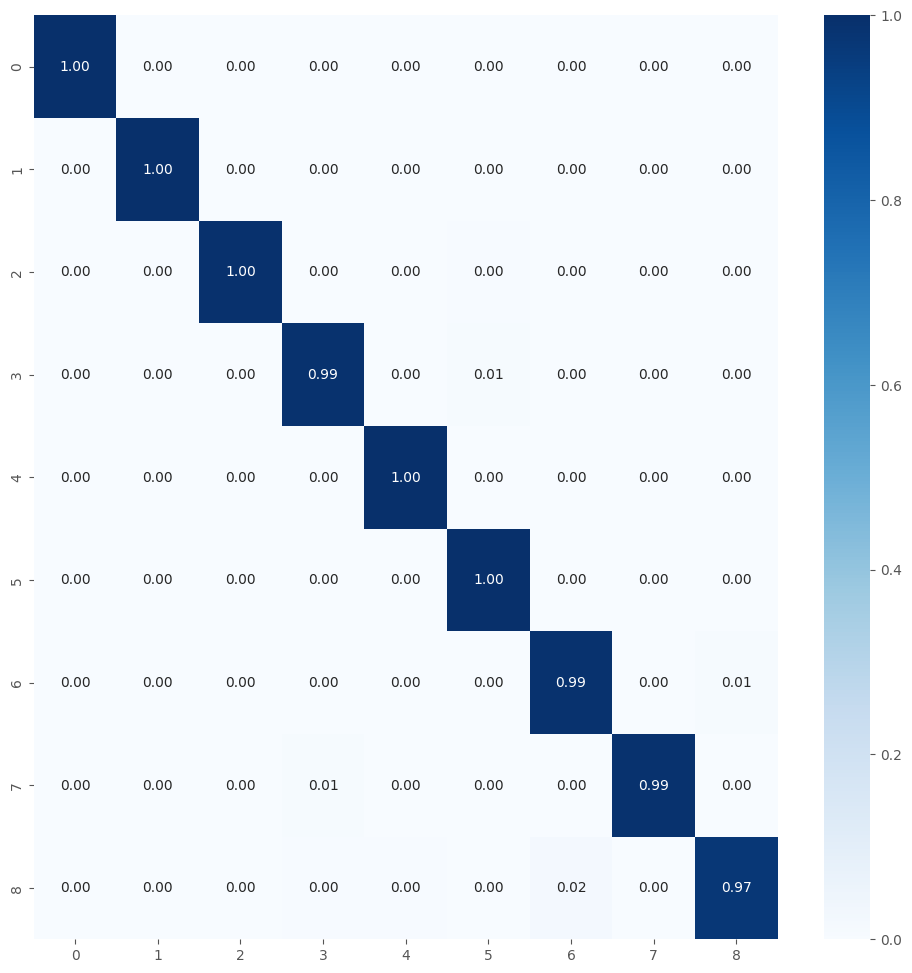


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3511113
Trainable params: 1870985
Non-trainable params: 1640128
Epoch 1/36
147/147 [==============================] - 42s 197ms/step - loss: 2.1796 - accuracy: 0.2559 - val_loss: 1.6405 - val_accuracy: 0.6119 - lr: 1.3611e-05
Epoch 2/36
147/147 [==============================] - 26s 176ms/step - loss: 1.5050 - accuracy: 0.4809 - val_loss: 0.8637 - val_accuracy: 0.8871 - lr: 1.3611e-05
Epoch 3/36
147/147 [==============================] - 25s 173ms/step - loss: 1.1656 - accuracy: 0.6042 - val_loss: 0.5380 - val_accuracy: 0.9173 - lr: 1.3611e-05
Epoch 4/36
147/147 [==============================] - 25s 170ms/step - loss: 1.0200 - accuracy: 0.6726 - val_loss: 0.4266 - val_accuracy: 0.9395 - lr: 1.3611e-05
Epoch 5/36
147/147 [==============================] - 26s 172ms/step - loss: 0.8490 - accuracy: 0.7341 - val_loss: 0.3534 - val_accuracy: 0.9536 - lr: 1.3611e-05
Epoch 6/36
147/147 [==============================] - 25s 170ms/step - los

Model and History saved...
296/296 [==============================] - 40s 135ms/step - loss: 0.0758 - accuracy: 0.9943
Train Accuracy: 0.9942857027053833
Train Log Loss: 0.07581057399511337
64/64 [==============================] - 9s 137ms/step - loss: 0.0969 - accuracy: 0.9906
Validation Accuracy: 0.9906172752380371
Validation Log Loss: 0.09694945067167282
64/64 [==============================] - 10s 132ms/step - loss: 0.0953 - accuracy: 0.9896
Test Accuracy: 0.9896296262741089
Test Log Loss: 0.09526941180229187
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 222   1   2   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  1   0   0   0   0   0 222   0   2]
 [  0   0   0   2   0   0   0 223   0]
 [  1 

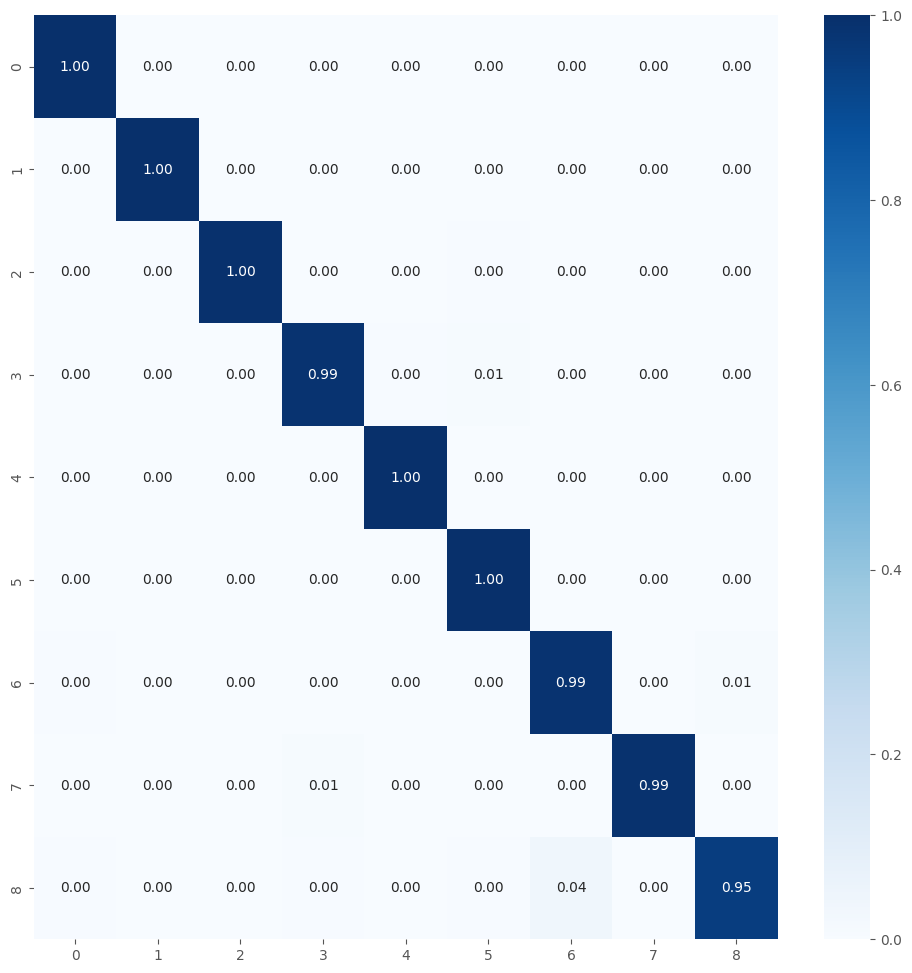


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3511113
Trainable params: 1870985
Non-trainable params: 1640128
Epoch 1/36
147/147 [==============================] - 41s 190ms/step - loss: 2.1079 - accuracy: 0.3155 - val_loss: 1.5663 - val_accuracy: 0.6492 - lr: 1.3611e-05
Epoch 2/36
147/147 [==============================] - 25s 169ms/step - loss: 1.3414 - accuracy: 0.5827 - val_loss: 0.8170 - val_accuracy: 0.8478 - lr: 1.3611e-05
Epoch 3/36
147/147 [==============================] - 25s 170ms/step - loss: 1.0660 - accuracy: 0.6837 - val_loss: 0.5523 - val_accuracy: 0.9224 - lr: 1.3611e-05
Epoch 4/36
147/147 [==============================] - 26s 170ms/step - loss: 0.8964 - accuracy: 0.7394 - val_loss: 0.4438 - val_accuracy: 0.9214 - lr: 1.3611e-05
Epoch 5/36
147/147 [==============================] - 25s 170ms/step - loss: 0.7752 - accuracy: 0.7836 - val_loss: 0.3893 - val_accuracy: 0.9204 - lr: 1.3611e-05
Epoch 6/36
147/147 [==============================] - 26s 173ms/step - los

Model and History saved...
296/296 [==============================] - 36s 122ms/step - loss: 0.0548 - accuracy: 0.9982
Train Accuracy: 0.9982010722160339
Train Log Loss: 0.054831478744745255
64/64 [==============================] - 8s 127ms/step - loss: 0.0715 - accuracy: 0.9951
Validation Accuracy: 0.9950617551803589
Validation Log Loss: 0.0714675784111023
64/64 [==============================] - 9s 135ms/step - loss: 0.0720 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.07198971509933472
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 223   0   2]
 [  0   0   0   2   0   0   0 223   0]
 [  0   

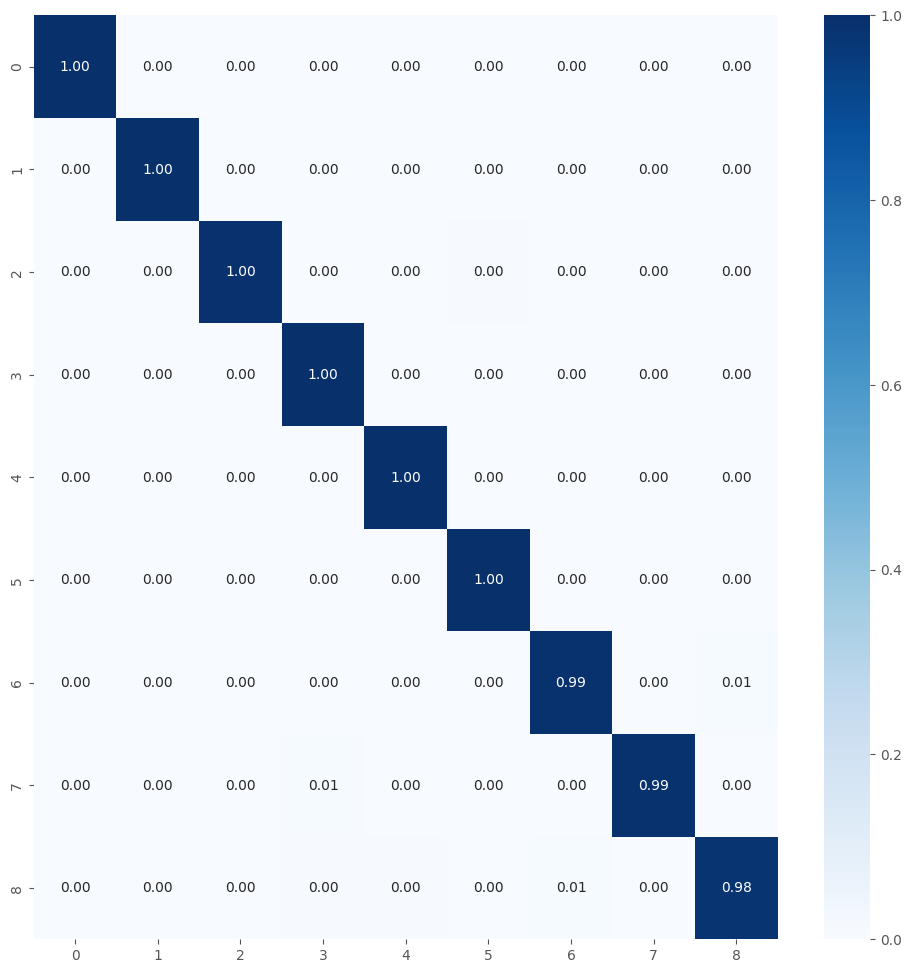


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3511113
Trainable params: 1870985
Non-trainable params: 1640128
Epoch 1/36
147/147 [==============================] - 40s 173ms/step - loss: 1.9703 - accuracy: 0.3178 - val_loss: 1.5587 - val_accuracy: 0.5302 - lr: 1.3611e-05
Epoch 2/36
147/147 [==============================] - 23s 158ms/step - loss: 1.3172 - accuracy: 0.5175 - val_loss: 0.8994 - val_accuracy: 0.7712 - lr: 1.3611e-05
Epoch 3/36
147/147 [==============================] - 24s 163ms/step - loss: 1.0833 - accuracy: 0.6179 - val_loss: 0.6192 - val_accuracy: 0.8579 - lr: 1.3611e-05
Epoch 4/36
147/147 [==============================] - 25s 165ms/step - loss: 0.9244 - accuracy: 0.6875 - val_loss: 0.5191 - val_accuracy: 0.8891 - lr: 1.3611e-05
Epoch 5/36
147/147 [==============================] - 24s 163ms/step - loss: 0.8083 - accuracy: 0.7367 - val_loss: 0.3937 - val_accuracy: 0.9234 - lr: 1.3611e-05
Epoch 6/36
147/147 [==============================] - 24s 164ms/step - los

Model and History saved...
296/296 [==============================] - 39s 129ms/step - loss: 0.0679 - accuracy: 0.9954
Train Accuracy: 0.9954497218132019
Train Log Loss: 0.06790710240602493
64/64 [==============================] - 10s 131ms/step - loss: 0.0844 - accuracy: 0.9926
Validation Accuracy: 0.9925925731658936
Validation Log Loss: 0.08436794579029083
64/64 [==============================] - 8s 124ms/step - loss: 0.0821 - accuracy: 0.9911
Test Accuracy: 0.9911110997200012
Test Log Loss: 0.08206120133399963
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 221   1   3   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 222   0   3]
 [  0   0   0   2   0   0   1 222   0]
 [  1 

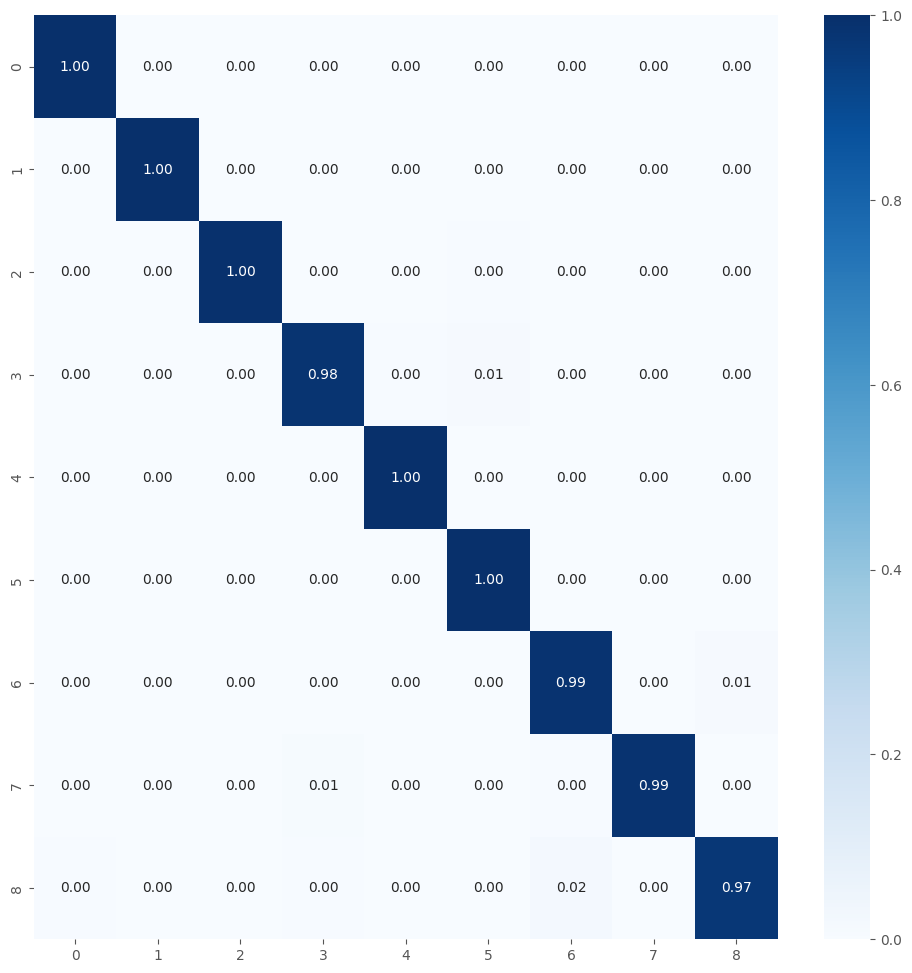


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3511113
Trainable params: 1870985
Non-trainable params: 1640128
Epoch 1/36
147/147 [==============================] - 42s 194ms/step - loss: 1.8684 - accuracy: 0.3584 - val_loss: 1.4996 - val_accuracy: 0.6290 - lr: 1.3611e-05
Epoch 2/36
147/147 [==============================] - 27s 183ms/step - loss: 1.2608 - accuracy: 0.5759 - val_loss: 0.7679 - val_accuracy: 0.8599 - lr: 1.3611e-05
Epoch 3/36
147/147 [==============================] - 18s 124ms/step - loss: 1.0366 - accuracy: 0.6625 - val_loss: 0.5390 - val_accuracy: 0.9153 - lr: 1.3611e-05
Epoch 4/36
147/147 [==============================] - 16s 112ms/step - loss: 0.8917 - accuracy: 0.7305 - val_loss: 0.4478 - val_accuracy: 0.9183 - lr: 1.3611e-05
Epoch 5/36
147/147 [==============================] - 24s 162ms/step - loss: 0.7971 - accuracy: 0.7695 - val_loss: 0.3765 - val_accuracy: 0.9345 - lr: 1.3611e-05
Epoch 6/36
147/147 [==============================] - 24s 159ms/step - los

Model and History saved...
296/296 [==============================] - 40s 134ms/step - loss: 0.0551 - accuracy: 0.9978
Train Accuracy: 0.9977777600288391
Train Log Loss: 0.055104754865169525
64/64 [==============================] - 9s 142ms/step - loss: 0.0731 - accuracy: 0.9951
Validation Accuracy: 0.9950617551803589
Validation Log Loss: 0.07307182997465134
64/64 [==============================] - 10s 138ms/step - loss: 0.0715 - accuracy: 0.9951
Test Accuracy: 0.9950617551803589
Test Log Loss: 0.07152128964662552
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0]
 [  0   0 224   0   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0   0]
 [  0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0 225   0   0   0]
 [  0   0   0   0   0   0 221   0   4]
 [  0   0   0   2   0   0   0 223   0]
 [  1

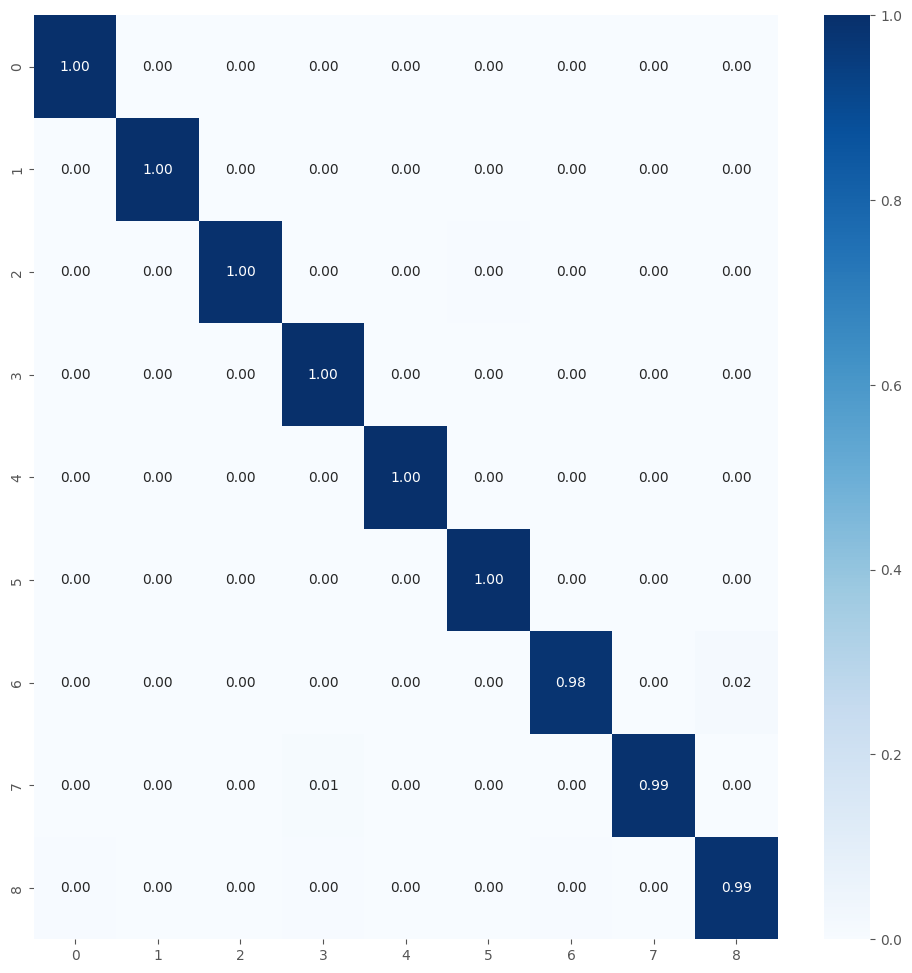

Average training accuracy in 5-fold: 0.9714039206504822
Average validation precision in 5-fold: 0.9963709592819214

Test Metrics
test_acc_list: [0.9930863976478577, 0.9896296262741089, 0.995555579662323, 0.9911110997200012, 0.9950617551803589]
Average Test Accuracy with 5-fold: 0.99288889169693
test_loss_list: [0.07978218048810959, 0.09526941180229187, 0.07198971509933472, 0.08206120133399963, 0.07152128964662552]
Average Test Log Loss with 5-fold: 0.08012475967407226
Precision List: [0.9931246951740663, 0.9897445224186276, 0.9955705609985193, 0.9911555429243949, 0.9950876586880312]
Average Precision List with 5-fold: 0.9929365960407279
Recall List: [0.9930864197530865, 0.9896296296296296, 0.9955555555555556, 0.991111111111111, 0.9950617283950618]
Average Recall List with 5-fold: 0.9928888888888888
F1 Score List: [0.993078333233713, 0.9895987324244224, 0.9955521878227809, 0.9911041090940187, 0.9950605210898446]
Average F1 Score List with 5-fold: 0.9928787767329558

Metrics List Store



In [39]:
%%time

num_classes = 9
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 13:00:09,956] A new study created in memory with name: no-name-05c8383a-5348-4a33-86df-24e22814404a


Familias de malware copiadas
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 3509386
Trainable params: 1343946
Non-trainable params: 2165440


[I 2025-06-06 13:15:03,622] Trial 0 finished with values: [0.9705356955528259, 1.5833287239074707] and parameters: {'learning_rate': 4.465988051520451e-05, 'dropout_rate1': 0.49743020598305737, 'dropout_rate2': 0.3681373667321829, 'l2_reg': 0.0053413963070269846, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 29, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 19, 'reduce_lr_patience': 10}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 3526474
Trainable params: 1361034
Non-trainable params: 2165440


[I 2025-06-06 13:35:37,811] Trial 1 finished with values: [0.9758928418159485, 0.14887134730815887] and parameters: {'learning_rate': 0.0002898926594275869, 'dropout_rate1': 0.4268059914949687, 'dropout_rate2': 0.3397127376181024, 'l2_reg': 0.0021828787576533308, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 41, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 13, 'reduce_lr_patience': 10}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 4418218
Trainable params: 2781162
Non-trainable params: 1637056


2025-06-06 13:36:48.889219: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5317560074501004269
2025-06-06 13:36:48.889300: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 11700268694426258467
2025-06-06 13:36:48.889327: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182
[I 2025-06-06 13:36:49,315] Trial 2 finished with values: [0.20000000298023224, 10.591748237609863] and parameters: {'learning_rate': 0.0036726467083777943, 'dropout_rate1': 0.20711278856725257, 'dropout_rate2': 0.4401586127303204, 'l2_reg': 2.0163412469964098e-05, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 40, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 15, 'reduce_lr_patience': 11, 'units_dense3': 32, 'dropout_rate3': 0.2691431698149337}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 3560650
Trainable params: 1393162
Non-trainable params: 2167488


[I 2025-06-06 13:37:58,173] Trial 3 finished with values: [0.9053333401679993, 0.39414578676223755] and parameters: {'learning_rate': 3.907850750785506e-05, 'dropout_rate1': 0.2507259264627774, 'dropout_rate2': 0.15610869403945365, 'l2_reg': 0.00010097262015482252, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 13, 'reduce_lr_patience': 9}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 4348810
Trainable params: 2711754
Non-trainable params: 1637056


[I 2025-06-06 13:59:38,649] Trial 4 finished with values: [0.9714285731315613, 4.679198741912842] and parameters: {'learning_rate': 1.2533717784008473e-05, 'dropout_rate1': 0.42424072546673197, 'dropout_rate2': 0.42684050291633235, 'l2_reg': 0.005826883385333388, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 11, 'reduce_lr_patience': 10}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 4415050
Trainable params: 2777994
Non-trainable params: 1637056


[I 2025-06-06 14:00:52,366] Trial 5 finished with values: [0.5102221965789795, 2.831329107284546] and parameters: {'learning_rate': 0.0010676625406093468, 'dropout_rate1': 0.3003875452527537, 'dropout_rate2': 0.3893763991347968, 'l2_reg': 4.753230236850967e-05, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 15, 'reduce_lr_patience': 12}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 4547530
Trainable params: 2910474
Non-trainable params: 1637056


[I 2025-06-06 14:02:27,124] Trial 6 finished with values: [0.2924444377422333, 9.602824211120605] and parameters: {'learning_rate': 0.0010903922405616961, 'dropout_rate1': 0.5963090219207978, 'dropout_rate2': 0.3435025981345095, 'l2_reg': 0.00022623383269200403, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 16, 'epochs': 37, 'num_dense_layers': 2, 'unfreeze_layers': 14, 'early_stopping_patience': 12, 'reduce_lr_patience': 8}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 3825834
Trainable params: 2189802
Non-trainable params: 1636032


[I 2025-06-06 14:03:42,698] Trial 7 finished with values: [0.828000009059906, 0.5458606481552124] and parameters: {'learning_rate': 0.0002472499687061828, 'dropout_rate1': 0.5506022775585923, 'dropout_rate2': 0.37102911952228634, 'l2_reg': 1.9161568325422342e-05, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 16, 'epochs': 47, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 10, 'reduce_lr_patience': 15, 'units_dense3': 32, 'dropout_rate3': 0.2213944073530728}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 3921226
Trainable params: 2279562
Non-trainable params: 1641664


[I 2025-06-06 14:21:21,034] Trial 8 finished with values: [0.9410714507102966, 0.2049432098865509] and parameters: {'learning_rate': 0.0012005833604970654, 'dropout_rate1': 0.3102428406416772, 'dropout_rate2': 0.4415237440048708, 'l2_reg': 2.1826876128727836e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 64, 'epochs': 33, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 10, 'reduce_lr_patience': 11, 'units_dense3': 128, 'dropout_rate3': 0.3147654548419672}.


Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Total params: 4348810
Trainable params: 2181834
Non-trainable params: 2166976


[I 2025-06-06 14:35:45,992] Trial 9 finished with values: [0.9696428775787354, 0.22276458144187927] and parameters: {'learning_rate': 0.000123498877050771, 'dropout_rate1': 0.43387303933416543, 'dropout_rate2': 0.3951024482403128, 'l2_reg': 0.00012074775282218494, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 26, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 12, 'reduce_lr_patience': 15}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9759
    val_loss: 0.1489
    Parámetros: {'learning_rate': 0.0002898926594275869, 'dropout_rate1': 0.4268059914949687, 'dropout_rate2': 0.3397127376181024, 'l2_reg': 0.0021828787576533308, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 41, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 13, 'reduce_lr_patience': 10}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


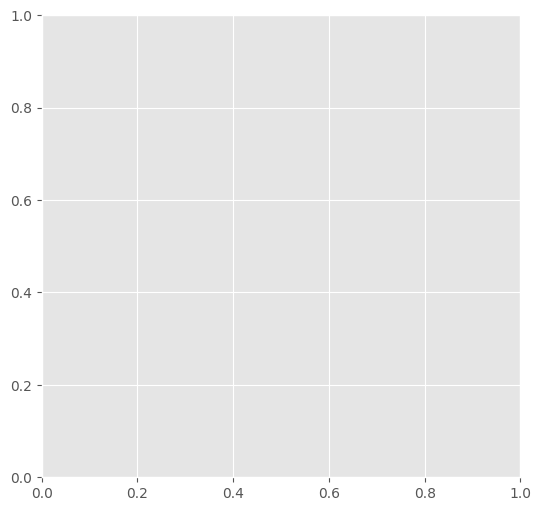

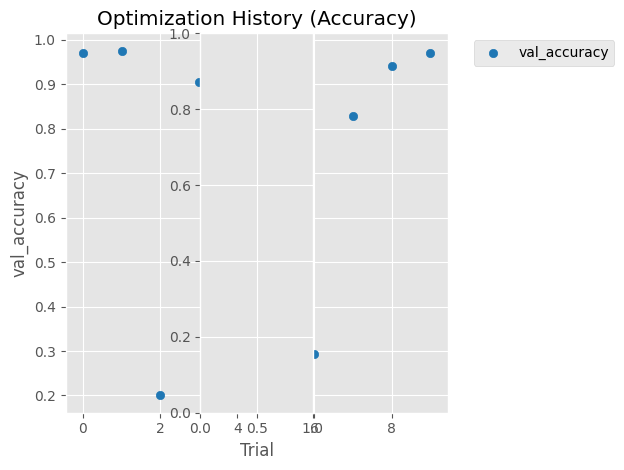

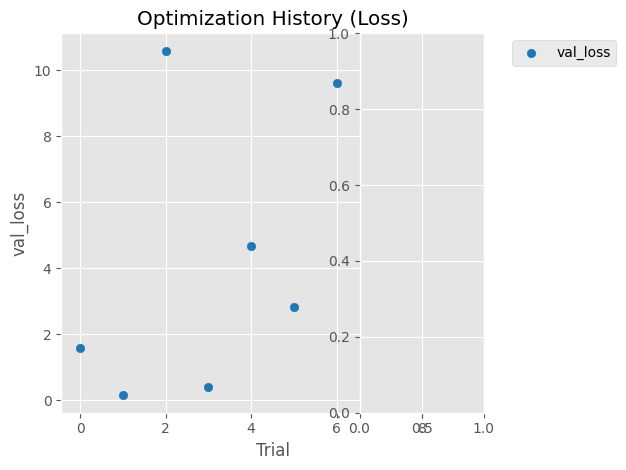

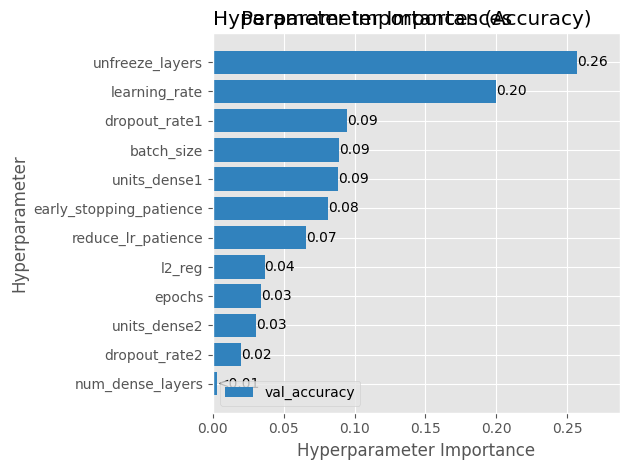

source2: /notebooks/train3/all_malware/10
name_save_model: fusion_MobileNet_tf_optunav210
Found 10500 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Found 2250 images belonging to 10 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3526474
Trainable params: 1361034
Non-trainable params: 2165440
Epoch 1/41
164/164 [==============================] - 57s 242ms/step - loss: 1.8897 - accuracy: 0.7874 - val_loss: 1.6099 - val_accuracy: 0.8482 - lr: 2.8989e-04
Epoch 2/41
164/164 [==============================] - 37s 224ms/step - loss: 1.4562 - accuracy: 0.9019 - val_loss: 1.3059 - val_accuracy: 0.9366 - lr: 2.8989e-04
Epoch 3/41
164/164 [==============================] - 32s 194ms/step - loss: 1.3016 - accuracy: 0.9238 - val_loss: 1.1789 - val_accuracy: 0.9616 - lr: 2.8989e-04
Epoch 4/41
164/164 [============

Model and History saved...
329/329 [==============================] - 44s 130ms/step - loss: 0.0726 - accuracy: 0.9898
Train Accuracy: 0.989809513092041
Train Log Loss: 0.07259206473827362
71/71 [==============================] - 10s 131ms/step - loss: 0.1687 - accuracy: 0.9693
Validation Accuracy: 0.9693333506584167
Validation Log Loss: 0.16866697371006012
71/71 [==============================] - 11s 152ms/step - loss: 0.1649 - accuracy: 0.9680
Test Accuracy: 0.9679999947547913
Test Log Loss: 0.16489605605602264
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0]
 [  0   0   0 224   0   0   0   0   0   1]
 [  0   0   0   0 220   0   0   0   0   5]
 [  0   0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0   0 223   0   0   2]
 [ 

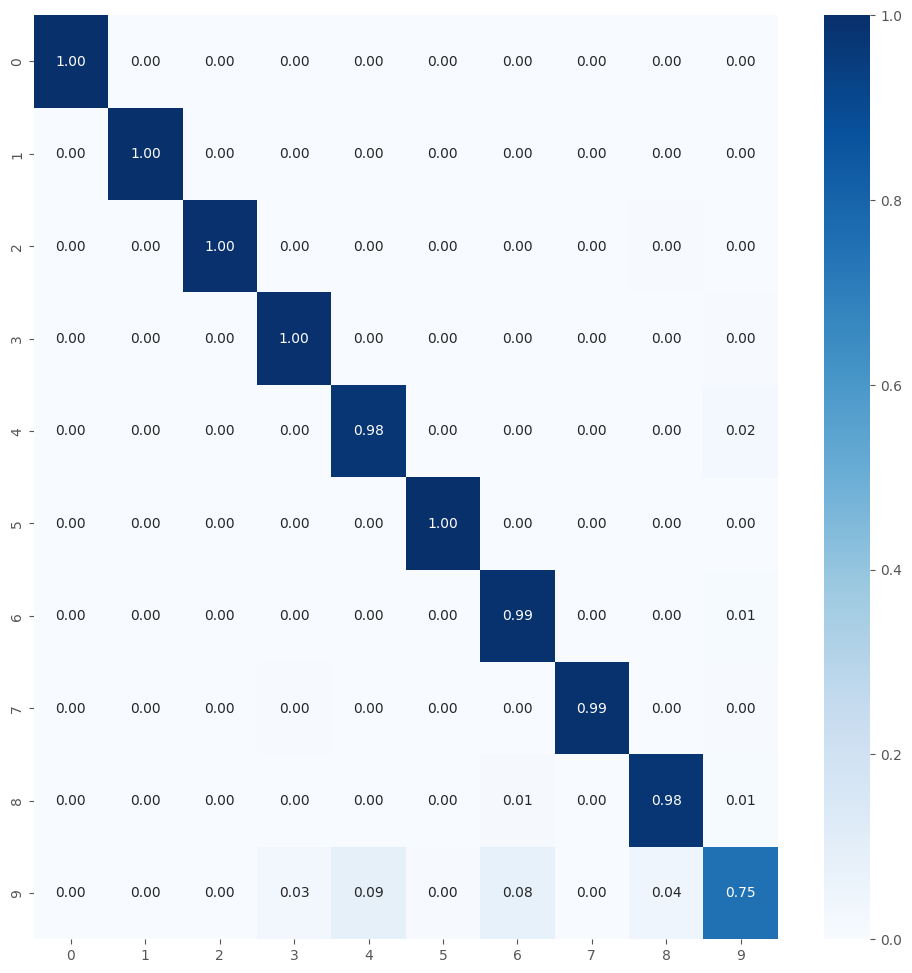


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3526474
Trainable params: 1361034
Non-trainable params: 2165440
Epoch 1/41
164/164 [==============================] - 40s 177ms/step - loss: 1.8872 - accuracy: 0.7994 - val_loss: 1.6495 - val_accuracy: 0.8687 - lr: 2.8989e-04
Epoch 2/41
164/164 [==============================] - 26s 161ms/step - loss: 1.4560 - accuracy: 0.9105 - val_loss: 1.4559 - val_accuracy: 0.8884 - lr: 2.8989e-04
Epoch 3/41
164/164 [==============================] - 26s 160ms/step - loss: 1.3252 - accuracy: 0.9242 - val_loss: 1.2291 - val_accuracy: 0.9500 - lr: 2.8989e-04
Epoch 4/41
164/164 [==============================] - 27s 162ms/step - loss: 1.2059 - accuracy: 0.9404 - val_loss: 1.1253 - val_accuracy: 0.9589 - lr: 2.8989e-04
Epoch 5/41
164/164 [==============================] - 28s 163ms/step - loss: 1.1252 - accuracy: 0.9412 - val_loss: 1.0320 - val_accuracy: 0.9625 - lr: 2.8989e-04
Epoch 6/41
164/164 [==============================] - 27s 166ms/step - los

Model and History saved...
329/329 [==============================] - 43s 127ms/step - loss: 0.5322 - accuracy: 0.9832
Train Accuracy: 0.9832381010055542
Train Log Loss: 0.5322065949440002
71/71 [==============================] - 9s 128ms/step - loss: 0.5789 - accuracy: 0.9671
Validation Accuracy: 0.9671111106872559
Validation Log Loss: 0.5788708925247192
71/71 [==============================] - 10s 126ms/step - loss: 0.5863 - accuracy: 0.9640
Test Accuracy: 0.9639999866485596
Test Log Loss: 0.5863038301467896
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 221   0   1   0   0   0   3]
 [  0   0   0   0 220   0   0   0   0   5]
 [  0   0   0   0   0 224   0   0   0   1]
 [  0   0   0   0   0   0 212   0   6   7]
 [  0 

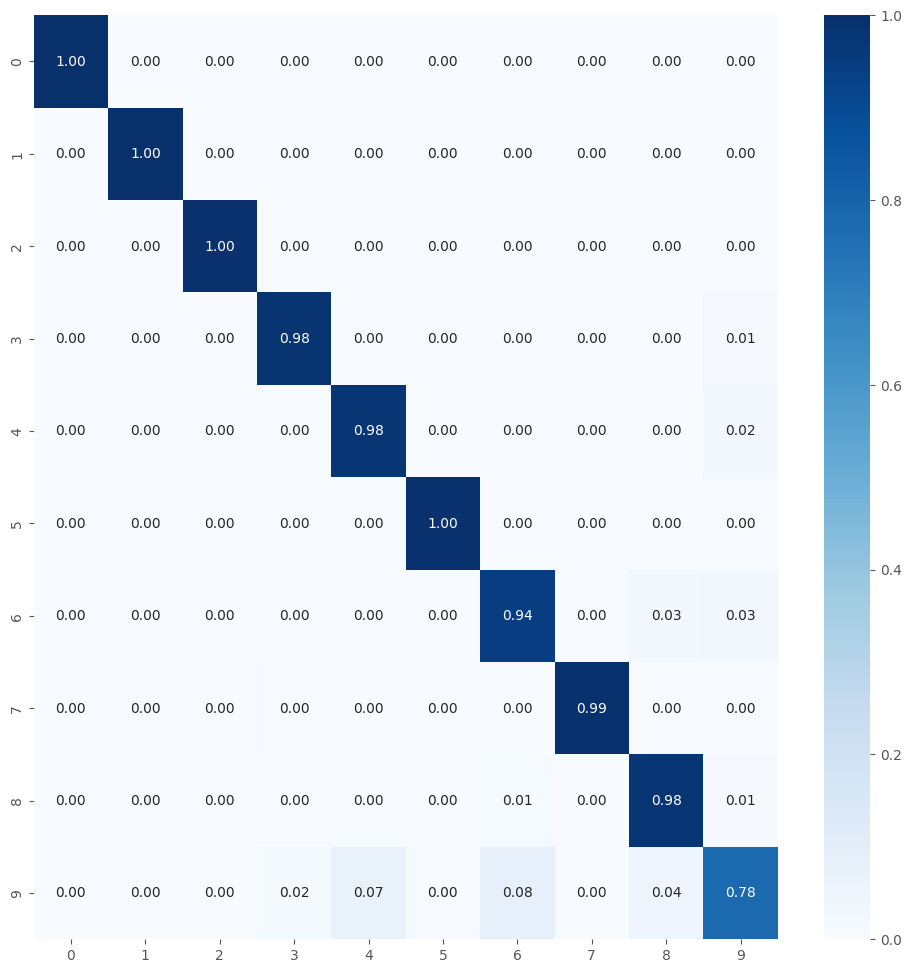


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3526474
Trainable params: 1361034
Non-trainable params: 2165440
Epoch 1/41
164/164 [==============================] - 40s 173ms/step - loss: 1.9159 - accuracy: 0.7776 - val_loss: 1.5426 - val_accuracy: 0.8813 - lr: 2.8989e-04
Epoch 2/41
164/164 [==============================] - 27s 166ms/step - loss: 1.4762 - accuracy: 0.9030 - val_loss: 1.3406 - val_accuracy: 0.9366 - lr: 2.8989e-04
Epoch 3/41
164/164 [==============================] - 27s 164ms/step - loss: 1.3356 - accuracy: 0.9312 - val_loss: 1.2092 - val_accuracy: 0.9625 - lr: 2.8989e-04
Epoch 4/41
164/164 [==============================] - 27s 165ms/step - loss: 1.2325 - accuracy: 0.9307 - val_loss: 1.1294 - val_accuracy: 0.9625 - lr: 2.8989e-04
Epoch 5/41
164/164 [==============================] - 29s 178ms/step - loss: 1.1444 - accuracy: 0.9374 - val_loss: 1.0959 - val_accuracy: 0.9563 - lr: 2.8989e-04
Epoch 6/41
164/164 [==============================] - 27s 164ms/step - los

Model and History saved...
329/329 [==============================] - 42s 127ms/step - loss: 0.0695 - accuracy: 0.9932
Train Accuracy: 0.993238091468811
Train Log Loss: 0.06951391696929932
71/71 [==============================] - 10s 133ms/step - loss: 0.1768 - accuracy: 0.9596
Validation Accuracy: 0.9595555663108826
Validation Log Loss: 0.17676350474357605
71/71 [==============================] - 9s 120ms/step - loss: 0.1708 - accuracy: 0.9627
Test Accuracy: 0.9626666903495789
Test Log Loss: 0.17076171934604645
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[224   0   0   0   0   0   0   0   0   1]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 224   0   0   0   0   0   1]
 [  0   0   0   0 210   0   0   0   0  15]
 [  0   0   0   0   0 222   0   0   0   3]
 [  0   0   0   0   0   0 204   0   1  20]
 [  

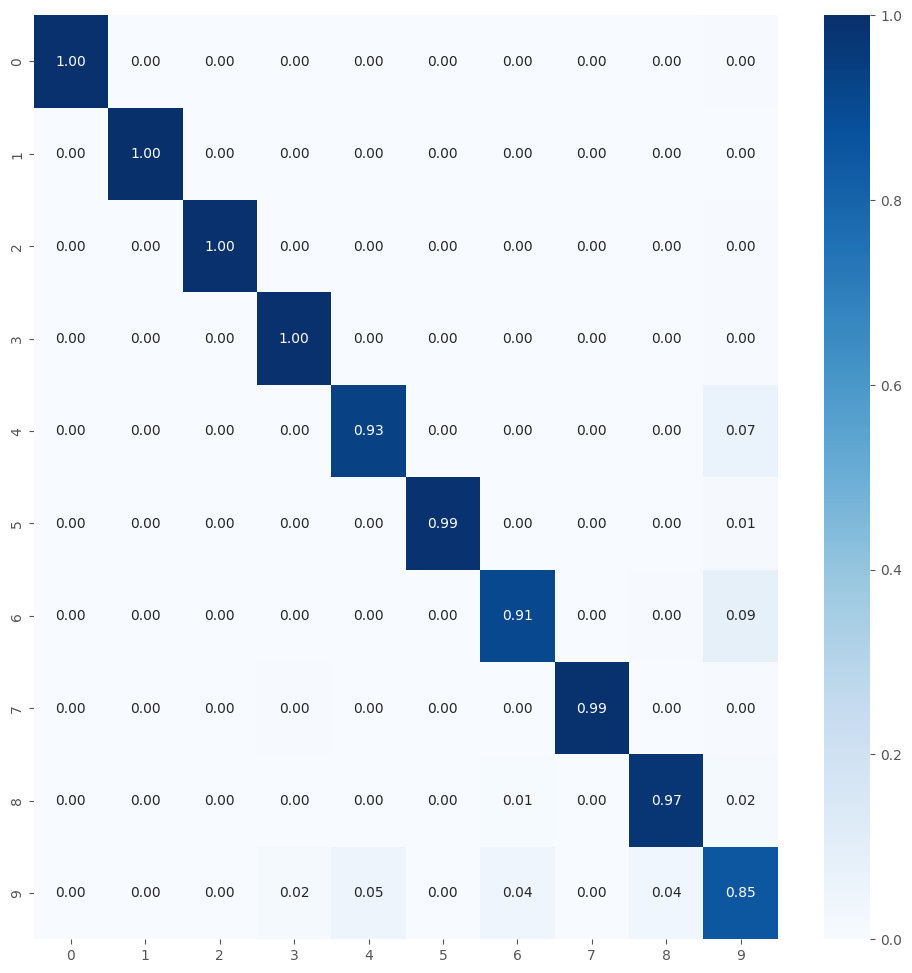


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3526474
Trainable params: 1361034
Non-trainable params: 2165440
Epoch 1/41
164/164 [==============================] - 38s 183ms/step - loss: 1.8857 - accuracy: 0.7992 - val_loss: 1.5686 - val_accuracy: 0.8911 - lr: 2.8989e-04
Epoch 2/41
164/164 [==============================] - 27s 166ms/step - loss: 1.4582 - accuracy: 0.9113 - val_loss: 1.3281 - val_accuracy: 0.9402 - lr: 2.8989e-04
Epoch 3/41
164/164 [==============================] - 28s 170ms/step - loss: 1.3316 - accuracy: 0.9293 - val_loss: 1.1916 - val_accuracy: 0.9518 - lr: 2.8989e-04
Epoch 4/41
164/164 [==============================] - 27s 165ms/step - loss: 1.2088 - accuracy: 0.9375 - val_loss: 1.1235 - val_accuracy: 0.9580 - lr: 2.8989e-04
Epoch 5/41
164/164 [==============================] - 27s 165ms/step - loss: 1.1155 - accuracy: 0.9466 - val_loss: 1.0573 - val_accuracy: 0.9527 - lr: 2.8989e-04
Epoch 6/41
164/164 [==============================] - 28s 170ms/step - los

Model and History saved...
329/329 [==============================] - 45s 134ms/step - loss: 0.1673 - accuracy: 0.9890
Train Accuracy: 0.989047646522522
Train Log Loss: 0.16734859347343445
71/71 [==============================] - 10s 137ms/step - loss: 0.2329 - accuracy: 0.9658
Validation Accuracy: 0.9657777547836304
Validation Log Loss: 0.23285715281963348
71/71 [==============================] - 10s 134ms/step - loss: 0.2365 - accuracy: 0.9680
Test Accuracy: 0.9679999947547913
Test Log Loss: 0.23651853203773499
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 221   0   0   0   0   4]
 [  0   0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0   0 212   0   0  13]
 [ 

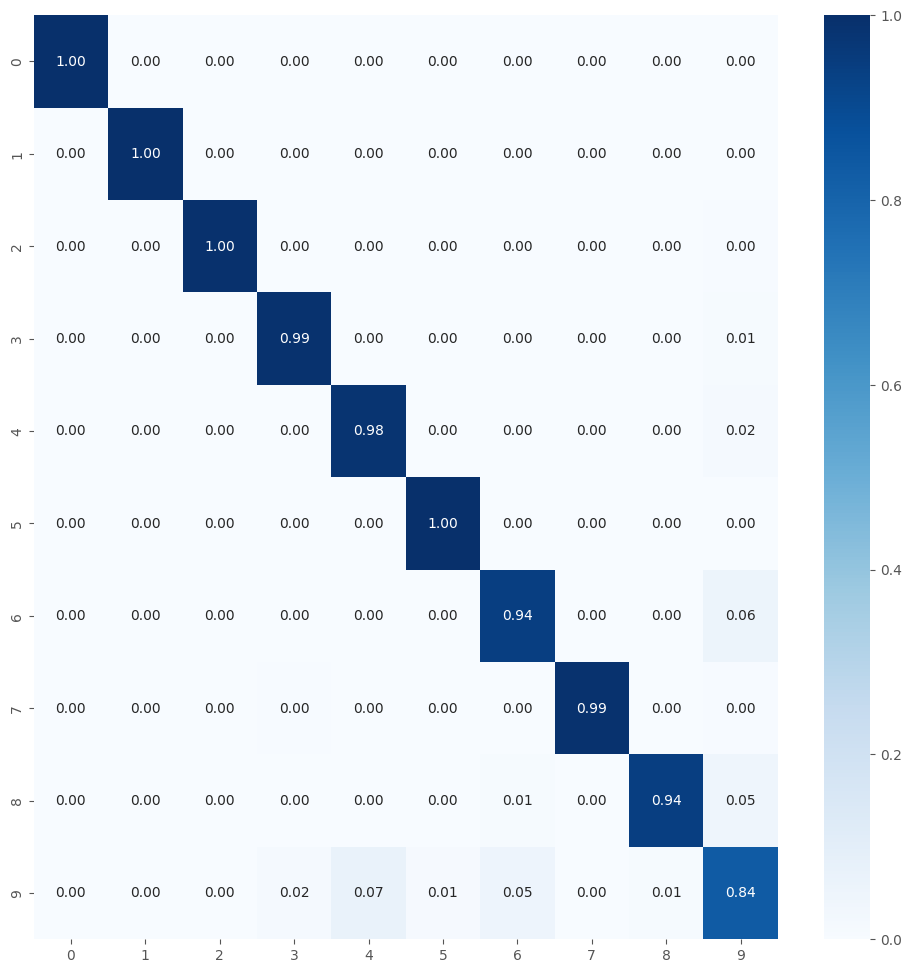


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3526474
Trainable params: 1361034
Non-trainable params: 2165440
Epoch 1/41
164/164 [==============================] - 42s 185ms/step - loss: 1.9090 - accuracy: 0.7929 - val_loss: 1.5231 - val_accuracy: 0.9045 - lr: 2.8989e-04
Epoch 2/41
164/164 [==============================] - 28s 170ms/step - loss: 1.4489 - accuracy: 0.9110 - val_loss: 1.3500 - val_accuracy: 0.9205 - lr: 2.8989e-04
Epoch 3/41
164/164 [==============================] - 28s 172ms/step - loss: 1.3169 - accuracy: 0.9282 - val_loss: 1.2111 - val_accuracy: 0.9527 - lr: 2.8989e-04
Epoch 4/41
164/164 [==============================] - 28s 170ms/step - loss: 1.2213 - accuracy: 0.9351 - val_loss: 1.1831 - val_accuracy: 0.9366 - lr: 2.8989e-04
Epoch 5/41
164/164 [==============================] - 29s 174ms/step - loss: 1.1229 - accuracy: 0.9421 - val_loss: 1.0298 - val_accuracy: 0.9598 - lr: 2.8989e-04
Epoch 6/41
164/164 [==============================] - 26s 158ms/step - los

Model and History saved...
329/329 [==============================] - 45s 137ms/step - loss: 0.1802 - accuracy: 0.9865
Train Accuracy: 0.9864761829376221
Train Log Loss: 0.18015822768211365
71/71 [==============================] - 10s 136ms/step - loss: 0.2549 - accuracy: 0.9707
Validation Accuracy: 0.9706666469573975
Validation Log Loss: 0.2548518180847168
71/71 [==============================] - 10s 135ms/step - loss: 0.2619 - accuracy: 0.9653
Test Accuracy: 0.9653333425521851
Test Log Loss: 0.2618679404258728
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'ganelp': 4, 'mira': 5, 'sfone': 6, 'sillyp2p': 7, 'wabot': 8, 'wacatac': 9}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   2]
 [  0   0   0   0 213   0   0   0   0  12]
 [  0   0   0   0   0 225   0   0   0   0]
 [  0   0   0   0   0   0 216   0   0   9]
 [  

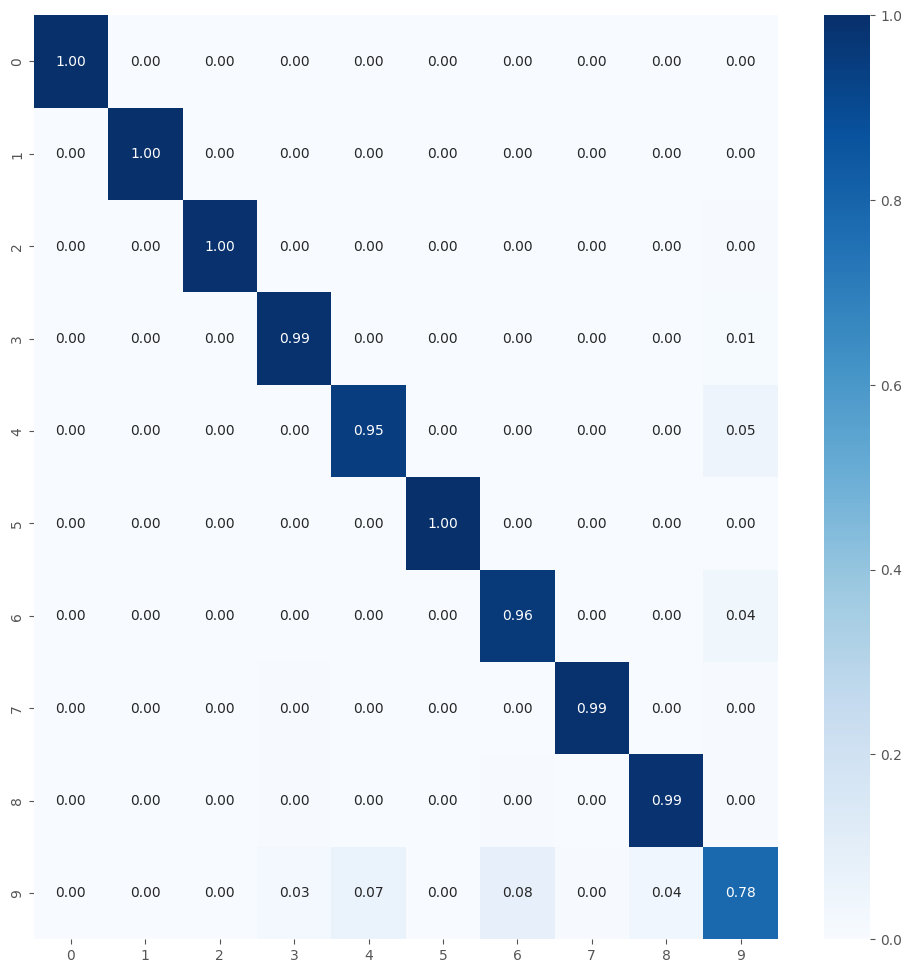

Average training accuracy in 5-fold: 0.9881097435951233
Average validation precision in 5-fold: 0.9753571510314941

Test Metrics
test_acc_list: [0.9679999947547913, 0.9639999866485596, 0.9626666903495789, 0.9679999947547913, 0.9653333425521851]
Average Test Accuracy with 5-fold: 0.9656000018119812
test_loss_list: [0.16489605605602264, 0.5863038301467896, 0.17076171934604645, 0.23651853203773499, 0.2618679404258728]
Average Test Log Loss with 5-fold: 0.2840696156024933
Precision List: [0.9682963396784263, 0.9636161715825919, 0.9634989818040275, 0.9680654489676612, 0.9646872963274824]
Average Precision List with 5-fold: 0.9656328476720379
Recall List: [0.968, 0.9640000000000001, 0.9626666666666666, 0.968, 0.9653333333333333]
Average Recall List with 5-fold: 0.9656
F1 Score List: [0.9668073822975358, 0.9632712824698041, 0.9629648730396315, 0.9678851737314288, 0.9646832263672355]
Average F1 Score List with 5-fold: 0.965122387581127

Metrics List Store

test_acc_list_all = [0.99866666793823

In [40]:
%%time

num_classes = 10
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 16:18:17,329] A new study created in memory with name: no-name-9497bdc3-a7e0-4510-95b4-21cd7490dc34


Familias de malware copiadas
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 4348875
Trainable params: 2706187
Non-trainable params: 1642688


[I 2025-06-06 16:33:19,406] Trial 0 finished with values: [0.8379934430122375, 0.509548544883728] and parameters: {'learning_rate': 0.0025486795643237365, 'dropout_rate1': 0.4024043983880028, 'dropout_rate2': 0.33454981038223575, 'l2_reg': 4.6582398334211965e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 27, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 11, 'reduce_lr_patience': 10}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 4579275
Trainable params: 2942219
Non-trainable params: 1637056


[I 2025-06-06 17:11:24,803] Trial 1 finished with values: [0.951298713684082, 0.2195385843515396] and parameters: {'learning_rate': 0.0005463525762897068, 'dropout_rate1': 0.33931561702469354, 'dropout_rate2': 0.3973295653024518, 'l2_reg': 4.266729053528372e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 20, 'reduce_lr_patience': 8, 'units_dense3': 128, 'dropout_rate3': 0.29947777254192937}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 4547787
Trainable params: 2905099
Non-trainable params: 1642688


[I 2025-06-06 17:12:43,024] Trial 2 finished with values: [0.6868686676025391, 1.837609052658081] and parameters: {'learning_rate': 0.0007145729521618206, 'dropout_rate1': 0.5712423332738628, 'dropout_rate2': 0.47458484386706457, 'l2_reg': 0.0005987413811851411, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 16, 'epochs': 34, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 18, 'reduce_lr_patience': 13}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 4350603
Trainable params: 2713547
Non-trainable params: 1637056


[I 2025-06-06 17:14:08,008] Trial 3 finished with values: [0.4658585786819458, 1.830568552017212] and parameters: {'learning_rate': 0.0007696709315455353, 'dropout_rate1': 0.2241760037188874, 'dropout_rate2': 0.13329925296336553, 'l2_reg': 0.00011584911250774297, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'units_dense3': 32, 'dropout_rate3': 0.10639855952316206}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 3511179
Trainable params: 1345739
Non-trainable params: 2165440


[I 2025-06-06 17:48:34,490] Trial 4 finished with values: [0.9452110528945923, 0.2732113301753998] and parameters: {'learning_rate': 0.0010281473388842907, 'dropout_rate1': 0.2008888234908303, 'dropout_rate2': 0.47451502191592043, 'l2_reg': 0.0019971810214431643, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 32, 'epochs': 36, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'units_dense3': 32, 'dropout_rate3': 0.2943511266664229}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 3825867
Trainable params: 2189835
Non-trainable params: 1636032


[I 2025-06-06 18:03:15,095] Trial 5 finished with values: [0.9473684430122375, 0.5201311707496643] and parameters: {'learning_rate': 0.0002051058105102587, 'dropout_rate1': 0.5313039121239227, 'dropout_rate2': 0.4292658543826954, 'l2_reg': 0.0006104688963777403, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 27, 'num_dense_layers': 3, 'unfreeze_layers': 12, 'early_stopping_patience': 12, 'reduce_lr_patience': 9, 'units_dense3': 32, 'dropout_rate3': 0.1532576830350296}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 4547787
Trainable params: 2905099
Non-trainable params: 1642688


[I 2025-06-06 18:16:12,254] Trial 6 finished with values: [0.9333881735801697, 0.2595018744468689] and parameters: {'learning_rate': 0.00016849440597775002, 'dropout_rate1': 0.3684958308078436, 'dropout_rate2': 0.4237518179244545, 'l2_reg': 4.481454474229011e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 29, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 12, 'reduce_lr_patience': 14}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 3560907
Trainable params: 1926411
Non-trainable params: 1634496


[I 2025-06-06 18:17:31,396] Trial 7 finished with values: [0.776565670967102, 2.936055898666382] and parameters: {'learning_rate': 1.5649125253490517e-05, 'dropout_rate1': 0.5855079289221714, 'dropout_rate2': 0.3296073030090294, 'l2_reg': 0.0033663578368737647, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 38, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 20, 'reduce_lr_patience': 13}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 3509451
Trainable params: 1873931
Non-trainable params: 1635520


[I 2025-06-06 18:19:12,601] Trial 8 finished with values: [0.7696969509124756, 0.5927438735961914] and parameters: {'learning_rate': 0.0004789203742740715, 'dropout_rate1': 0.21260396277746413, 'dropout_rate2': 0.10695076448631236, 'l2_reg': 1.661613689922178e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 16, 'epochs': 38, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 12}.


Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Total params: 3518475
Trainable params: 1878347
Non-trainable params: 1640128


[I 2025-06-06 18:20:42,623] Trial 9 finished with values: [0.5406060814857483, 2.0087075233459473] and parameters: {'learning_rate': 0.0012877820946807055, 'dropout_rate1': 0.2852141788228252, 'dropout_rate2': 0.2872742019701554, 'l2_reg': 0.0008046525277500733, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 16, 'epochs': 40, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 9, 'units_dense3': 128, 'dropout_rate3': 0.24336609139309776}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 1:
    val_accuracy: 0.9513
    val_loss: 0.2195
    Parámetros: {'learning_rate': 0.0005463525762897068, 'dropout_rate1': 0.33931561702469354, 'dropout_rate2': 0.3973295653024518, 'l2_reg': 4.266729053528372e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 20, 'reduce_lr_patience': 8, 'units_dense3': 128, 'dropout_rate3': 0.29947777254192937}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


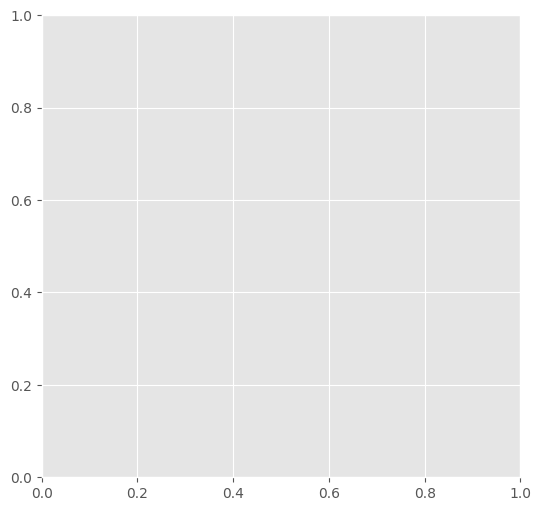

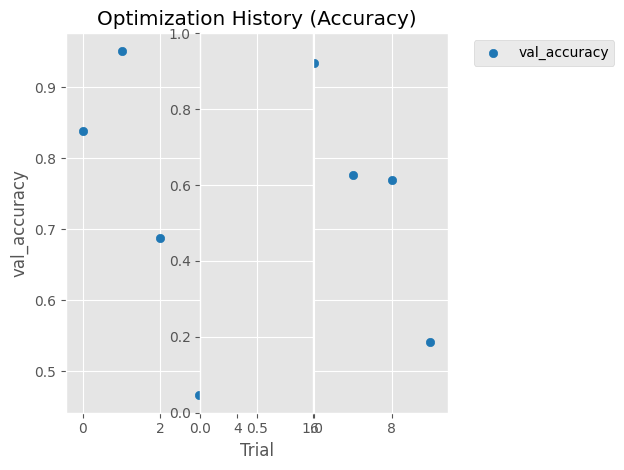

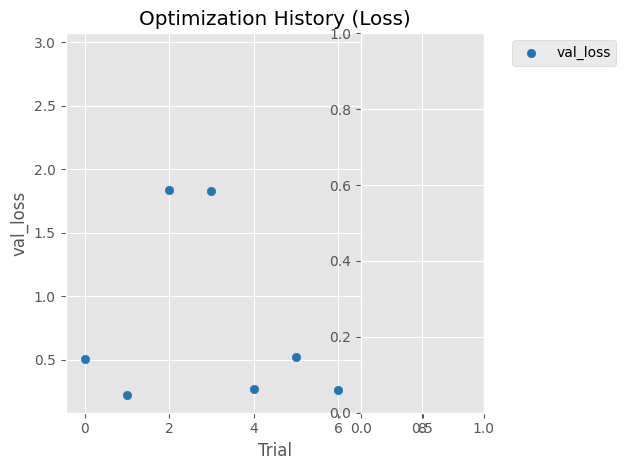

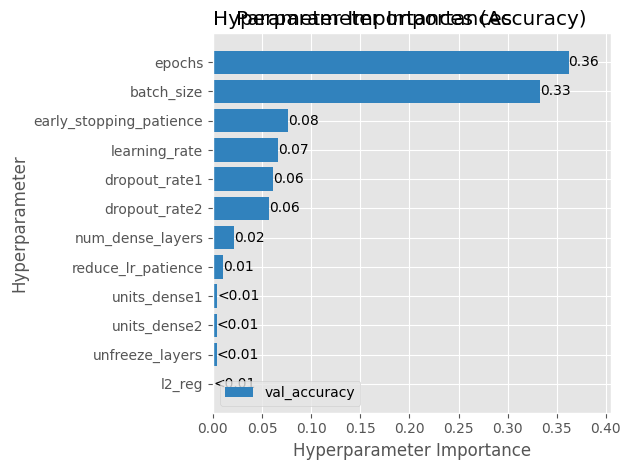

source2: /notebooks/train3/all_malware/11
name_save_model: fusion_MobileNet_tf_optunav211
Found 11550 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Found 2475 images belonging to 11 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod

TRAINING AND EVALUATING FOLD 1/5...

Total params: 4579275
Trainable params: 2942219
Non-trainable params: 1637056
Epoch 1/35
360/360 [==============================] - 87s 198ms/step - loss: 0.6409 - accuracy: 0.8076 - val_loss: 1.0348 - val_accuracy: 0.6619 - lr: 5.4635e-04
Epoch 2/35
360/360 [==============================] - 76s 210ms/step - loss: 0.3867 - accuracy: 0.8857 - val_loss: 3.4490 - val_accuracy: 0.4200 - lr: 5.4635e-04
Epoch 3/35
360/360 [==============================] - 67s 185ms/step - loss: 0.3391 - accuracy: 0.9015 - val_loss: 2.8756 - val_accuracy: 0.3470 - lr: 5.4635e-04
Epoch 4/35
360/360 [===

Model and History saved...
361/361 [==============================] - 56s 154ms/step - loss: 0.0596 - accuracy: 0.9911
Train Accuracy: 0.9910822510719299
Train Log Loss: 0.05963511019945145
78/78 [==============================] - 12s 152ms/step - loss: 0.2991 - accuracy: 0.9406
Validation Accuracy: 0.9406060576438904
Validation Log Loss: 0.29908761382102966
78/78 [==============================] - 11s 141ms/step - loss: 0.2576 - accuracy: 0.9511
Test Accuracy: 0.9511111378669739
Test Log Loss: 0.25755199790000916
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   1   0]
 [  0   0   0 223   0   0   0   1   0   0   1]
 [  0   0   0   0 193  12   0   0   0   0  20]
 [  0   0   0   0   9 213   0   0   0   0   3]
 [  0  

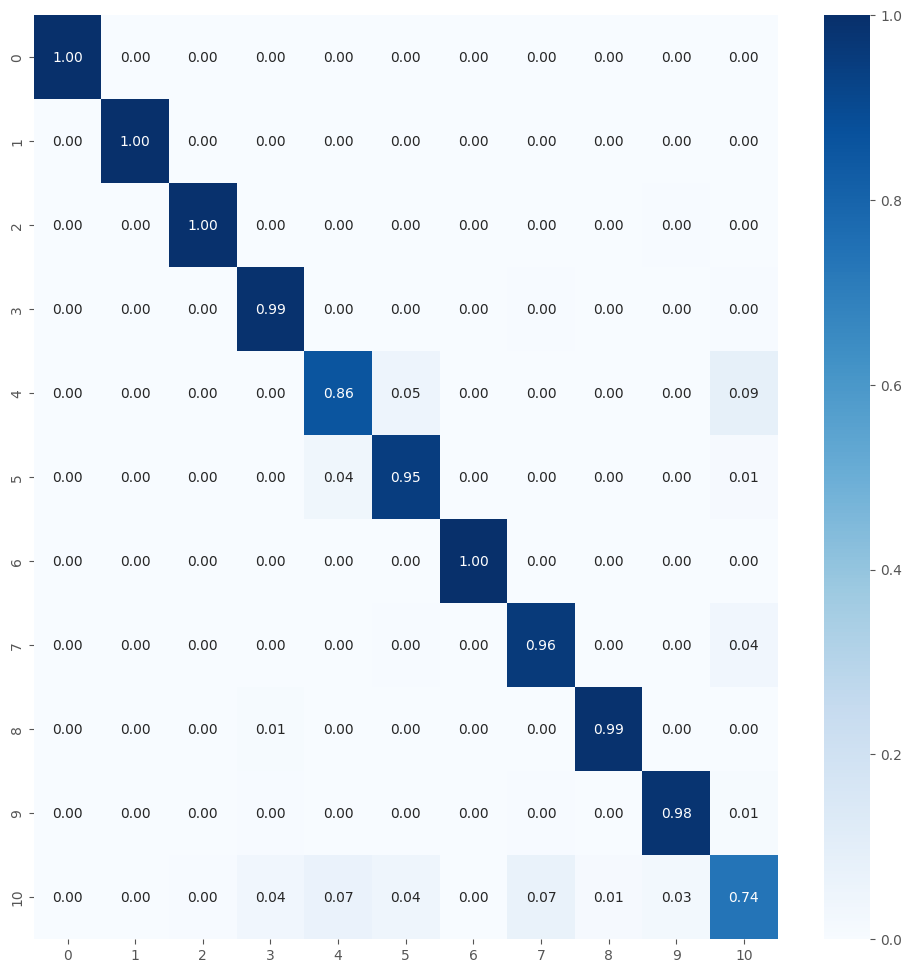


TRAINING AND EVALUATING FOLD 2/5...

Total params: 4579275
Trainable params: 2942219
Non-trainable params: 1637056
Epoch 1/35
360/360 [==============================] - 76s 172ms/step - loss: 0.6482 - accuracy: 0.8055 - val_loss: 0.8548 - val_accuracy: 0.7200 - lr: 5.4635e-04
Epoch 2/35
360/360 [==============================] - 64s 177ms/step - loss: 0.3827 - accuracy: 0.8836 - val_loss: 2.1519 - val_accuracy: 0.5187 - lr: 5.4635e-04
Epoch 3/35
360/360 [==============================] - 70s 195ms/step - loss: 0.3284 - accuracy: 0.8999 - val_loss: 1.2900 - val_accuracy: 0.6226 - lr: 5.4635e-04
Epoch 4/35
360/360 [==============================] - 58s 161ms/step - loss: 0.2967 - accuracy: 0.9107 - val_loss: 2.8236 - val_accuracy: 0.5864 - lr: 5.4635e-04
Epoch 5/35
360/360 [==============================] - 57s 158ms/step - loss: 0.2807 - accuracy: 0.9201 - val_loss: 0.9173 - val_accuracy: 0.7232 - lr: 5.4635e-04
Epoch 6/35
360/360 [==============================] - 60s 166ms/step - los

Model and History saved...
361/361 [==============================] - 48s 130ms/step - loss: 0.0546 - accuracy: 0.9938
Train Accuracy: 0.9937662482261658
Train Log Loss: 0.054564669728279114
78/78 [==============================] - 10s 132ms/step - loss: 0.3360 - accuracy: 0.9451
Validation Accuracy: 0.9450504779815674
Validation Log Loss: 0.33595985174179077
78/78 [==============================] - 11s 136ms/step - loss: 0.3034 - accuracy: 0.9515
Test Accuracy: 0.9515151381492615
Test Log Loss: 0.30339181423187256
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1]
 [  0   0   0 222   1   0   0   0   1   0   1]
 [  0   0   0   0 194  10   0   0   0   0  21]
 [  0   0   0   0  12 207   0   0   0   0   6]
 [  0 

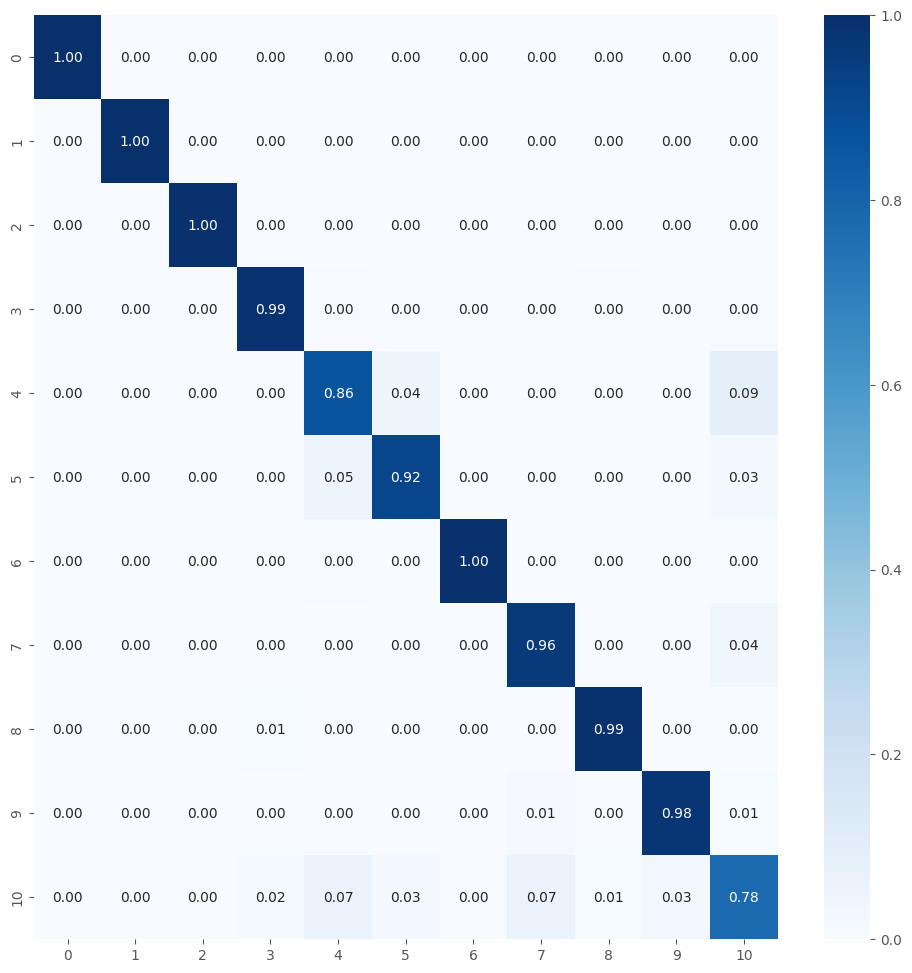


TRAINING AND EVALUATING FOLD 3/5...

Total params: 4579275
Trainable params: 2942219
Non-trainable params: 1637056
Epoch 1/35
360/360 [==============================] - 75s 170ms/step - loss: 0.6439 - accuracy: 0.8074 - val_loss: 1.5013 - val_accuracy: 0.5252 - lr: 5.4635e-04
Epoch 2/35
360/360 [==============================] - 59s 164ms/step - loss: 0.3826 - accuracy: 0.8807 - val_loss: 3.1123 - val_accuracy: 0.3636 - lr: 5.4635e-04
Epoch 3/35
360/360 [==============================] - 59s 164ms/step - loss: 0.3274 - accuracy: 0.9046 - val_loss: 2.1574 - val_accuracy: 0.5629 - lr: 5.4635e-04
Epoch 4/35
360/360 [==============================] - 67s 187ms/step - loss: 0.2936 - accuracy: 0.9149 - val_loss: 0.9888 - val_accuracy: 0.6757 - lr: 5.4635e-04
Epoch 5/35
360/360 [==============================] - 59s 163ms/step - loss: 0.2744 - accuracy: 0.9239 - val_loss: 3.0389 - val_accuracy: 0.2325 - lr: 5.4635e-04
Epoch 6/35
360/360 [==============================] - 57s 158ms/step - los

Model and History saved...
361/361 [==============================] - 49s 135ms/step - loss: 0.0613 - accuracy: 0.9919
Train Accuracy: 0.9918614625930786
Train Log Loss: 0.06127738207578659
78/78 [==============================] - 10s 131ms/step - loss: 0.3371 - accuracy: 0.9374
Validation Accuracy: 0.9373737573623657
Validation Log Loss: 0.3370519280433655
78/78 [==============================] - 11s 135ms/step - loss: 0.2929 - accuracy: 0.9507
Test Accuracy: 0.9507070779800415
Test Log Loss: 0.2928791344165802
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1]
 [  0   0   0 222   2   0   0   0   0   0   1]
 [  0   0   0   0 200   5   0   0   0   0  20]
 [  0   0   0   0  13 208   0   0   0   0   4]
 [  0   0

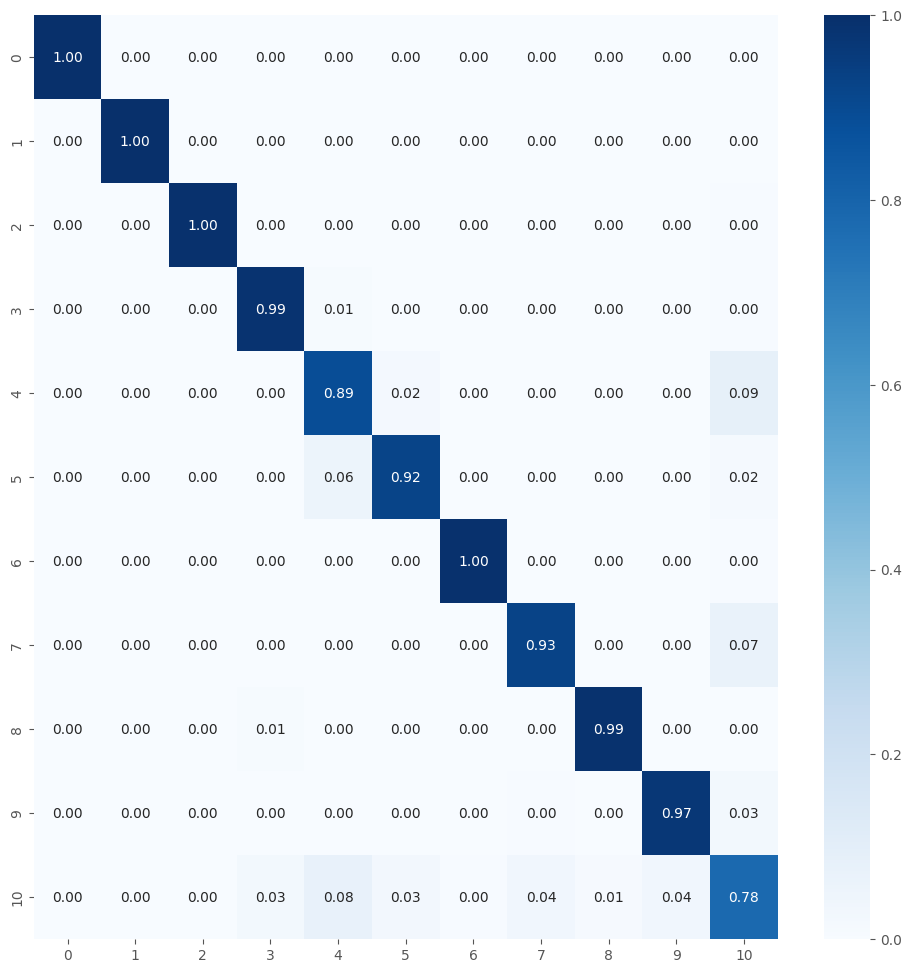


TRAINING AND EVALUATING FOLD 4/5...

Total params: 4579275
Trainable params: 2942219
Non-trainable params: 1637056
Epoch 1/35
360/360 [==============================] - 85s 198ms/step - loss: 0.6310 - accuracy: 0.8097 - val_loss: 1.7840 - val_accuracy: 0.5479 - lr: 5.4635e-04
Epoch 2/35
360/360 [==============================] - 59s 162ms/step - loss: 0.3930 - accuracy: 0.8851 - val_loss: 1.4234 - val_accuracy: 0.5621 - lr: 5.4635e-04
Epoch 3/35
360/360 [==============================] - 59s 164ms/step - loss: 0.3282 - accuracy: 0.9035 - val_loss: 3.8078 - val_accuracy: 0.2845 - lr: 5.4635e-04
Epoch 4/35
360/360 [==============================] - 71s 189ms/step - loss: 0.2935 - accuracy: 0.9153 - val_loss: 2.0526 - val_accuracy: 0.4168 - lr: 5.4635e-04
Epoch 5/35
360/360 [==============================] - 59s 164ms/step - loss: 0.2780 - accuracy: 0.9193 - val_loss: 3.3408 - val_accuracy: 0.3348 - lr: 5.4635e-04
Epoch 6/35
360/360 [==============================] - 59s 164ms/step - los

Model and History saved...
361/361 [==============================] - 51s 139ms/step - loss: 0.0534 - accuracy: 0.9927
Train Accuracy: 0.9927272796630859
Train Log Loss: 0.053405772894620895
78/78 [==============================] - 12s 143ms/step - loss: 0.3469 - accuracy: 0.9459
Validation Accuracy: 0.9458585977554321
Validation Log Loss: 0.3469279706478119
78/78 [==============================] - 11s 139ms/step - loss: 0.3446 - accuracy: 0.9499
Test Accuracy: 0.9498990178108215
Test Log Loss: 0.34455975890159607
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   0   2]
 [  0   0   0   0 197   7   0   0   0   0  21]
 [  0   0   0   0  16 202   0   0   0   0   7]
 [  0  

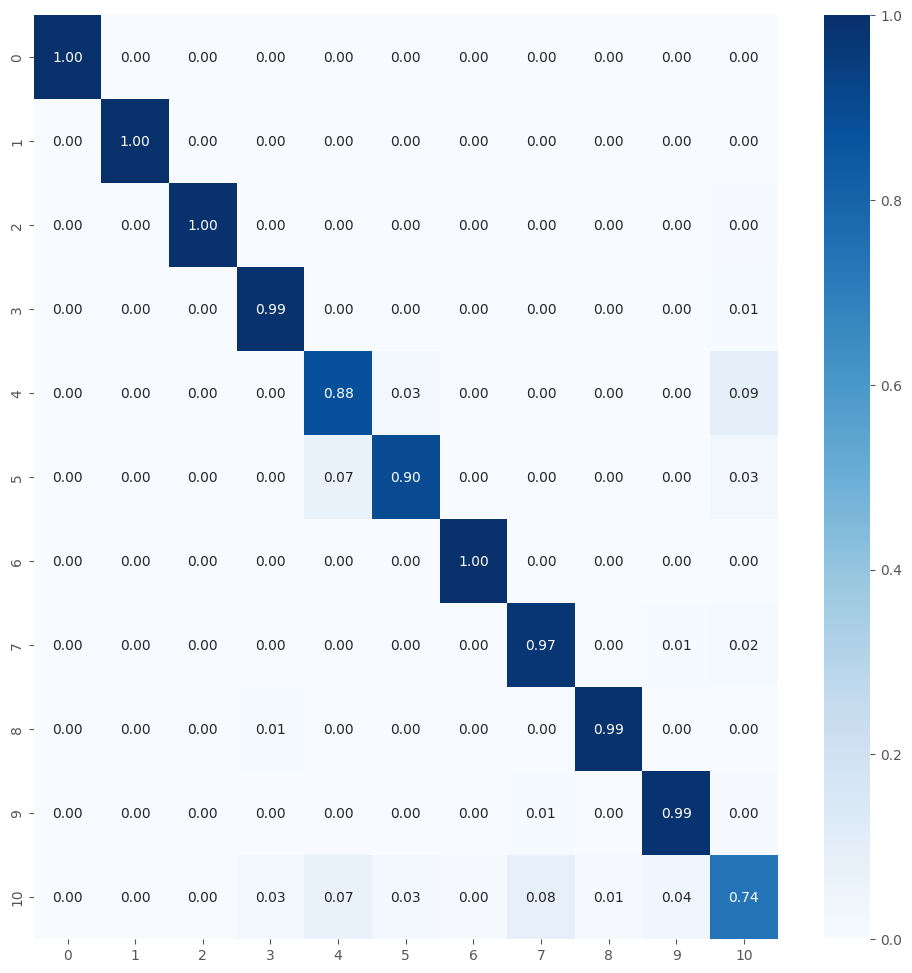


TRAINING AND EVALUATING FOLD 5/5...

Total params: 4579275
Trainable params: 2942219
Non-trainable params: 1637056
Epoch 1/35
360/360 [==============================] - 86s 193ms/step - loss: 0.6536 - accuracy: 0.8089 - val_loss: 0.8682 - val_accuracy: 0.6636 - lr: 5.4635e-04
Epoch 2/35
360/360 [==============================] - 61s 170ms/step - loss: 0.3724 - accuracy: 0.8854 - val_loss: 4.9025 - val_accuracy: 0.2439 - lr: 5.4635e-04
Epoch 3/35
360/360 [==============================] - 61s 169ms/step - loss: 0.3286 - accuracy: 0.9048 - val_loss: 3.1676 - val_accuracy: 0.2273 - lr: 5.4635e-04
Epoch 4/35
360/360 [==============================] - 54s 148ms/step - loss: 0.2938 - accuracy: 0.9137 - val_loss: 0.5693 - val_accuracy: 0.7930 - lr: 5.4635e-04
Epoch 5/35
360/360 [==============================] - 72s 201ms/step - loss: 0.2817 - accuracy: 0.9199 - val_loss: 1.7176 - val_accuracy: 0.5800 - lr: 5.4635e-04
Epoch 6/35
360/360 [==============================] - 69s 191ms/step - los

Model and History saved...
361/361 [==============================] - 50s 137ms/step - loss: 0.0647 - accuracy: 0.9930
Train Accuracy: 0.9929870367050171
Train Log Loss: 0.0646701231598854
78/78 [==============================] - 12s 139ms/step - loss: 0.3147 - accuracy: 0.9442
Validation Accuracy: 0.9442424178123474
Validation Log Loss: 0.3146703839302063
78/78 [==============================] - 17s 210ms/step - loss: 0.3068 - accuracy: 0.9519
Test Accuracy: 0.9519191980361938
Test Log Loss: 0.3067738711833954
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Ramnit': 3, 'dinwod': 4, 'ganelp': 5, 'mira': 6, 'sfone': 7, 'sillyp2p': 8, 'wabot': 9, 'wacatac': 10}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1]
 [  0   0   0 223   0   0   0   0   0   0   2]
 [  0   0   0   0 196  10   0   0   0   0  19]
 [  0   0   0   0  16 205   0   0   0   0   4]
 [  0   0 

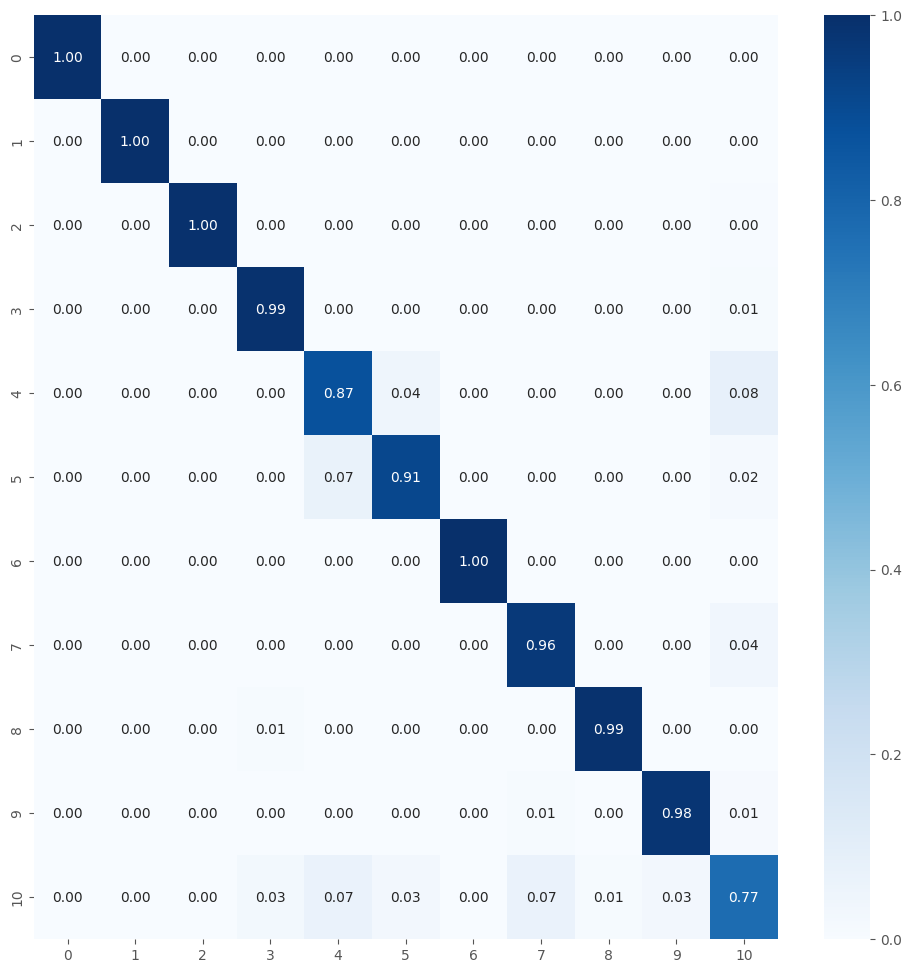

Average training accuracy in 5-fold: 0.9896336317062377
Average validation precision in 5-fold: 0.9456168651580811

Test Metrics
test_acc_list: [0.9511111378669739, 0.9515151381492615, 0.9507070779800415, 0.9498990178108215, 0.9519191980361938]
Average Test Accuracy with 5-fold: 0.9510303139686584
test_loss_list: [0.25755199790000916, 0.30339181423187256, 0.2928791344165802, 0.34455975890159607, 0.3067738711833954]
Average Test Log Loss with 5-fold: 0.3010313153266907
Precision List: [0.9499628304995568, 0.9509422831699382, 0.9508717716172987, 0.948967679338203, 0.951241960909562]
Average Precision List with 5-fold: 0.9503973051069117
Recall List: [0.9511111111111112, 0.9515151515151515, 0.9507070707070707, 0.94989898989899, 0.9519191919191918]
Average Recall List with 5-fold: 0.9510303030303031
F1 Score List: [0.9501452981785886, 0.9511486613453042, 0.9507262053842743, 0.9490517382905064, 0.9514385543960024]
Average F1 Score List with 5-fold: 0.9505020915189352

Metrics List Store

te

In [41]:
%%time

num_classes = 11
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-06 21:48:41,200] A new study created in memory with name: no-name-b7a22c0b-953e-4b18-91dc-1dead9243cc7


Familias de malware copiadas
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 3529708
Trainable params: 1364268
Non-trainable params: 2165440


[I 2025-06-06 22:03:35,020] Trial 0 finished with values: [0.9464285969734192, 0.3269091844558716] and parameters: {'learning_rate': 0.0036314507565065983, 'dropout_rate1': 0.22600599402015198, 'dropout_rate2': 0.3216749889614394, 'l2_reg': 0.0012463450050242122, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 41, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 10, 'reduce_lr_patience': 10, 'units_dense3': 32, 'dropout_rate3': 0.1318777847485464}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 3822924
Trainable params: 2182284
Non-trainable params: 1640640


[I 2025-06-06 22:23:37,704] Trial 1 finished with values: [0.944940447807312, 1.8581657409667969] and parameters: {'learning_rate': 2.6726215065601383e-05, 'dropout_rate1': 0.21418270395452632, 'dropout_rate2': 0.17265159365768967, 'l2_reg': 0.003010313228349515, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 8}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 3526732
Trainable params: 1359244
Non-trainable params: 2167488


[I 2025-06-06 23:16:17,510] Trial 2 finished with values: [0.949032723903656, 0.1953098028898239] and parameters: {'learning_rate': 1.5211566236368712e-05, 'dropout_rate1': 0.34513208977235094, 'dropout_rate2': 0.22771558255824864, 'l2_reg': 7.158167582392095e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 16, 'reduce_lr_patience': 12}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 4350636
Trainable params: 2181612
Non-trainable params: 2169024


[I 2025-06-06 23:37:11,157] Trial 3 finished with values: [0.930059552192688, 4.590137004852295] and parameters: {'learning_rate': 2.0243916690796177e-05, 'dropout_rate1': 0.4763668721438184, 'dropout_rate2': 0.4736129517027874, 'l2_reg': 0.005680294538104046, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 14, 'reduce_lr_patience': 10, 'units_dense3': 32, 'dropout_rate3': 0.22085653454467352}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 4579404
Trainable params: 2410380
Non-trainable params: 2169024


[I 2025-06-06 23:53:21,640] Trial 4 finished with values: [0.9404761791229248, 4.588907241821289] and parameters: {'learning_rate': 2.592655413490351e-05, 'dropout_rate1': 0.47479651208815615, 'dropout_rate2': 0.24745710317061, 'l2_reg': 0.004654993547189297, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 27, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 20, 'reduce_lr_patience': 9, 'units_dense3': 128, 'dropout_rate3': 0.11643116083406767}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 3789324
Trainable params: 2153292
Non-trainable params: 1636032


[I 2025-06-07 00:42:30,648] Trial 5 finished with values: [0.9501488208770752, 0.196397602558136] and parameters: {'learning_rate': 0.00011146235634308148, 'dropout_rate1': 0.40228663374368057, 'dropout_rate2': 0.429290832970167, 'l2_reg': 2.4254300513543068e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 13}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 3895660
Trainable params: 2259628
Non-trainable params: 1636032


[I 2025-06-07 00:44:09,904] Trial 6 finished with values: [0.7548148036003113, 0.7139770984649658] and parameters: {'learning_rate': 0.00023637840452424343, 'dropout_rate1': 0.5610086818814622, 'dropout_rate2': 0.4672467613243233, 'l2_reg': 6.077319166793955e-05, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 46, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 16, 'reduce_lr_patience': 13, 'units_dense3': 32, 'dropout_rate3': 0.16140454756808642}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 4418284
Trainable params: 2775596
Non-trainable params: 1642688


[I 2025-06-07 00:45:43,952] Trial 7 finished with values: [0.31888890266418457, 3.4358224868774414] and parameters: {'learning_rate': 0.007166396130258525, 'dropout_rate1': 0.35352176596910895, 'dropout_rate2': 0.34751029921376553, 'l2_reg': 0.003491315058678663, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 29, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 14, 'reduce_lr_patience': 11, 'units_dense3': 32, 'dropout_rate3': 0.1815638970064066}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 4548044
Trainable params: 2379020
Non-trainable params: 2169024


[I 2025-06-07 01:04:45,972] Trial 8 finished with values: [0.9575892686843872, 0.21976003050804138] and parameters: {'learning_rate': 0.00014002822135967882, 'dropout_rate1': 0.5726478627677762, 'dropout_rate2': 0.28897397549760373, 'l2_reg': 6.551156664493619e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 18, 'reduce_lr_patience': 11}.


Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Total params: 4348940
Trainable params: 2706252
Non-trainable params: 1642688


[I 2025-06-07 01:06:18,124] Trial 9 finished with values: [0.8296296000480652, 2.0473105907440186] and parameters: {'learning_rate': 0.00029289010750545833, 'dropout_rate1': 0.28477319150318386, 'dropout_rate2': 0.4460293543816368, 'l2_reg': 0.0015086929055433136, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 25, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 15, 'reduce_lr_patience': 9}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 2:
    val_accuracy: 0.9490
    val_loss: 0.1953
    Parámetros: {'learning_rate': 1.5211566236368712e-05, 'dropout_rate1': 0.34513208977235094, 'dropout_rate2': 0.22771558255824864, 'l2_reg': 7.158167582392095e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 16, 'reduce_lr_patience': 12}
  Trial 5:
    val_accuracy: 0.9501
    val_loss: 0.1964
    Parámetros: {'learning_rate': 0.00011146235634308148, 'dropout_rate1': 0.40228663374368057, 'dropout_rate2': 0.429290832970167, 'l2_reg': 2.4254300513543068e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 19, 'reduce_lr_patience': 13}
  Trial 8:
    val_accuracy: 0.9576
    val_loss: 0.2198
    Parámetros: {'learning_rate': 0.00014002822135967882, 'dropout_rate1': 0.5726478627677762, 'dropout_rate2

/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


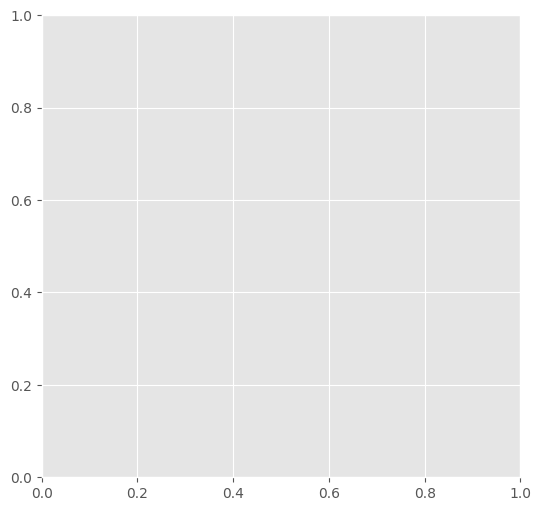

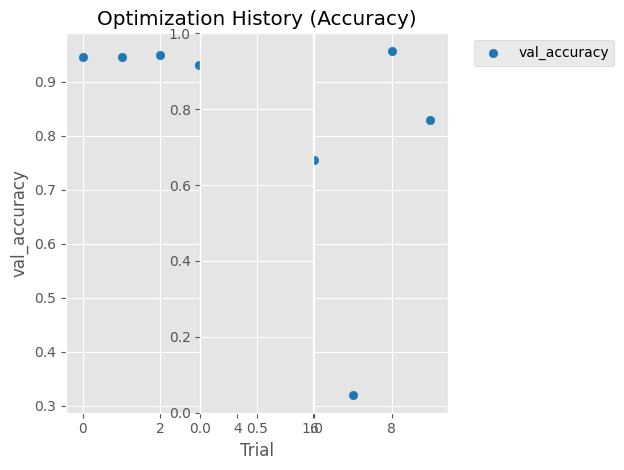

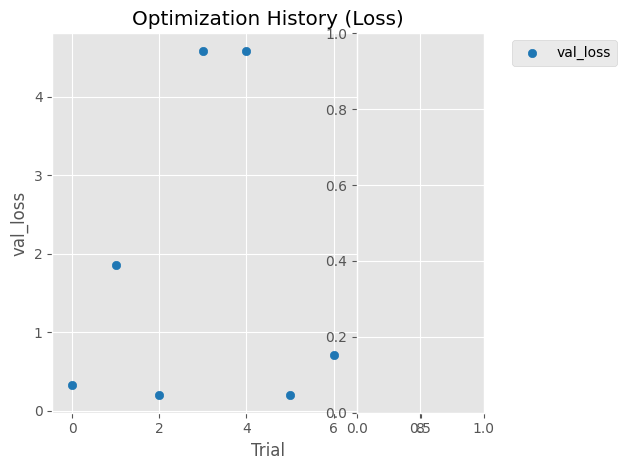

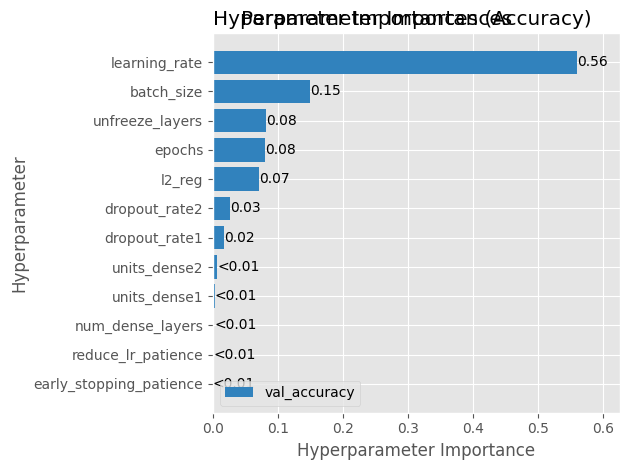

source2: /notebooks/train3/all_malware/12
name_save_model: fusion_MobileNet_tf_optunav212
Found 12600 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Found 2700 images belonging to 12 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3526732
Trainable params: 1359244
Non-trainable params: 2167488
Epoch 1/44
393/393 [==============================] - 88s 190ms/step - loss: 1.6753 - accuracy: 0.5059 - val_loss: 0.7502 - val_accuracy: 0.7872 - lr: 1.5212e-05
Epoch 2/44
393/393 [==============================] - 73s 185ms/step - loss: 0.8341 - accuracy: 0.7511 - val_loss: 0.5322 - val_accuracy: 0.8385 - lr: 1.5212e-05
Epoch 3/44
393/393 [==============================] - 70s 178ms/step - loss: 0.6369 - accuracy: 0.8089 - val_loss: 0.4313 - val_accuracy: 0.8743 - lr: 1.5212e-05
Epoch 4/44
3

Model and History saved...
394/394 [==============================] - 56s 141ms/step - loss: 0.0724 - accuracy: 0.9896
Train Accuracy: 0.9896031618118286
Train Log Loss: 0.07235389947891235
85/85 [==============================] - 12s 136ms/step - loss: 0.1979 - accuracy: 0.9459
Validation Accuracy: 0.9459259510040283
Validation Log Loss: 0.19792887568473816
85/85 [==============================] - 13s 140ms/step - loss: 0.1855 - accuracy: 0.9533
Test Accuracy: 0.95333331823349
Test Log Loss: 0.1855403482913971
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 222   2   0   0   0   1   0   0   0]
 [  0   0   0   0 223   1   0   1   0   0   0   0]
 [  0   0   0   0   0

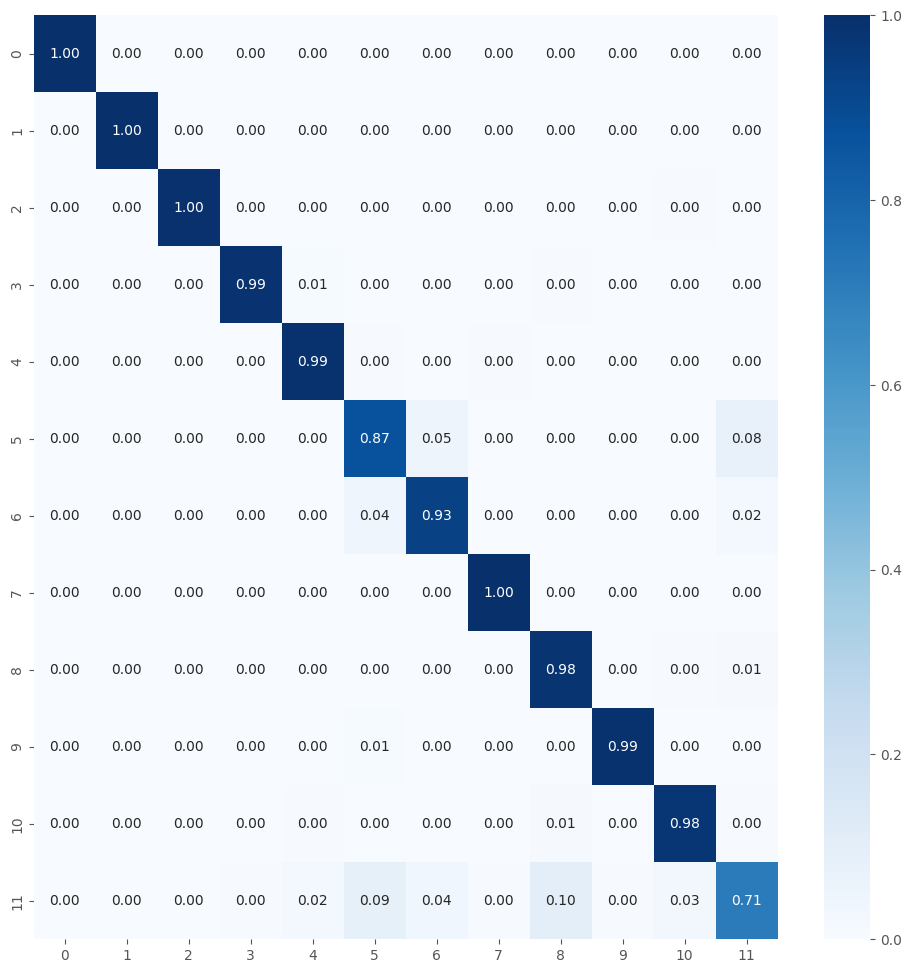


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3526732
Trainable params: 1359244
Non-trainable params: 2167488
Epoch 1/44
393/393 [==============================] - 84s 183ms/step - loss: 1.5553 - accuracy: 0.5241 - val_loss: 0.7372 - val_accuracy: 0.7753 - lr: 1.5212e-05
Epoch 2/44
393/393 [==============================] - 70s 177ms/step - loss: 0.8190 - accuracy: 0.7598 - val_loss: 0.5516 - val_accuracy: 0.8311 - lr: 1.5212e-05
Epoch 3/44
393/393 [==============================] - 69s 176ms/step - loss: 0.6494 - accuracy: 0.8005 - val_loss: 0.4582 - val_accuracy: 0.8597 - lr: 1.5212e-05
Epoch 4/44
393/393 [==============================] - 78s 198ms/step - loss: 0.5431 - accuracy: 0.8368 - val_loss: 0.3979 - val_accuracy: 0.8824 - lr: 1.5212e-05
Epoch 5/44
393/393 [==============================] - 67s 171ms/step - loss: 0.4778 - accuracy: 0.8556 - val_loss: 0.3524 - val_accuracy: 0.8992 - lr: 1.5212e-05
Epoch 6/44
393/393 [==============================] - 66s 168ms/step - los

Model and History saved...
394/394 [==============================] - 53s 133ms/step - loss: 0.0696 - accuracy: 0.9913
Train Accuracy: 0.9913492202758789
Train Log Loss: 0.06964755803346634
85/85 [==============================] - 12s 134ms/step - loss: 0.2089 - accuracy: 0.9467
Validation Accuracy: 0.9466666579246521
Validation Log Loss: 0.20890235900878906
85/85 [==============================] - 11s 132ms/step - loss: 0.1900 - accuracy: 0.9537
Test Accuracy: 0.9537037014961243
Test Log Loss: 0.19002704322338104
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   2   0   0   0   1   0   0   1]
 [  0   0   0   0 222   0   0   0   1   0   0   2]
 [  0   0   0   0 

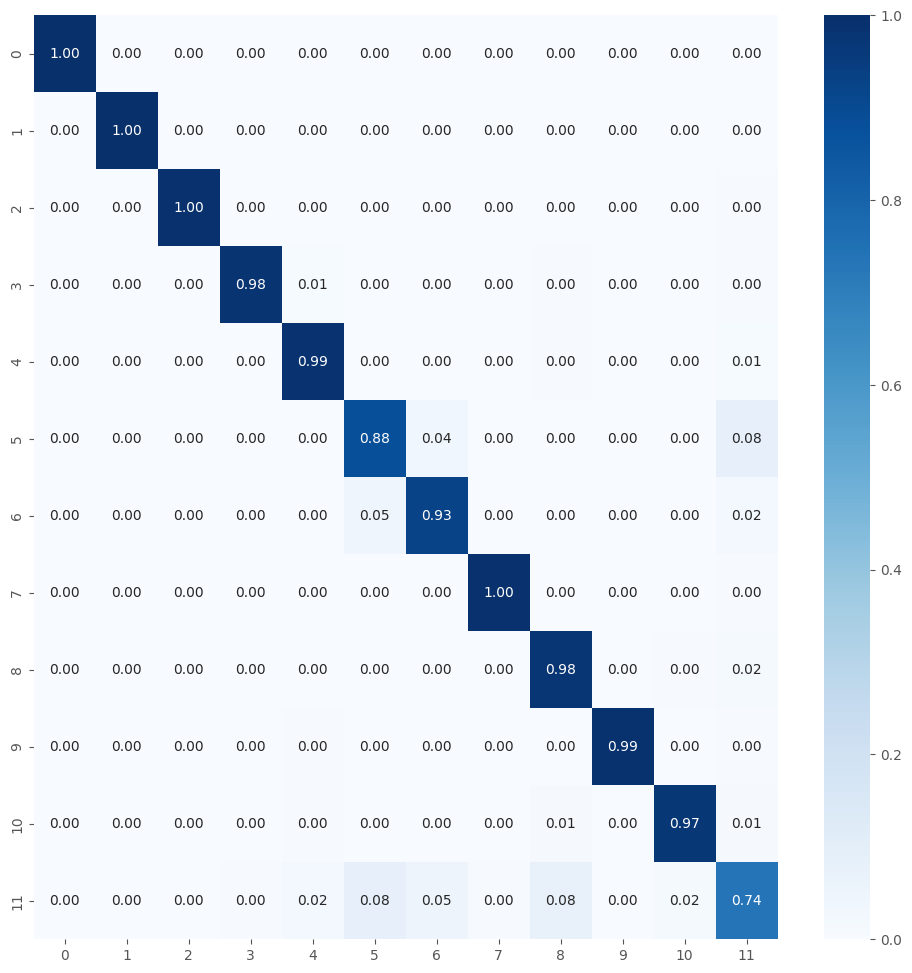


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3526732
Trainable params: 1359244
Non-trainable params: 2167488
Epoch 1/44
393/393 [==============================] - 81s 174ms/step - loss: 1.6602 - accuracy: 0.5154 - val_loss: 0.7688 - val_accuracy: 0.7753 - lr: 1.5212e-05
Epoch 2/44
393/393 [==============================] - 65s 166ms/step - loss: 0.8469 - accuracy: 0.7518 - val_loss: 0.5428 - val_accuracy: 0.8300 - lr: 1.5212e-05
Epoch 3/44
393/393 [==============================] - 64s 164ms/step - loss: 0.6536 - accuracy: 0.8089 - val_loss: 0.4408 - val_accuracy: 0.8698 - lr: 1.5212e-05
Epoch 4/44
393/393 [==============================] - 65s 163ms/step - loss: 0.5490 - accuracy: 0.8355 - val_loss: 0.3792 - val_accuracy: 0.8873 - lr: 1.5212e-05
Epoch 5/44
393/393 [==============================] - 73s 184ms/step - loss: 0.4844 - accuracy: 0.8552 - val_loss: 0.3384 - val_accuracy: 0.8966 - lr: 1.5212e-05
Epoch 6/44
393/393 [==============================] - 64s 164ms/step - los

Model and History saved...
394/394 [==============================] - 50s 127ms/step - loss: 0.0691 - accuracy: 0.9913
Train Accuracy: 0.9913492202758789
Train Log Loss: 0.06912267953157425
85/85 [==============================] - 11s 123ms/step - loss: 0.2118 - accuracy: 0.9459
Validation Accuracy: 0.9459259510040283
Validation Log Loss: 0.2118033617734909
85/85 [==============================] - 12s 126ms/step - loss: 0.1856 - accuracy: 0.9559
Test Accuracy: 0.9559259414672852
Test Log Loss: 0.18560445308685303
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   0   0   1   0   1   1]
 [  0   0   0   0 222   0   0   0   1   0   0   2]
 [  0   0   0   0  

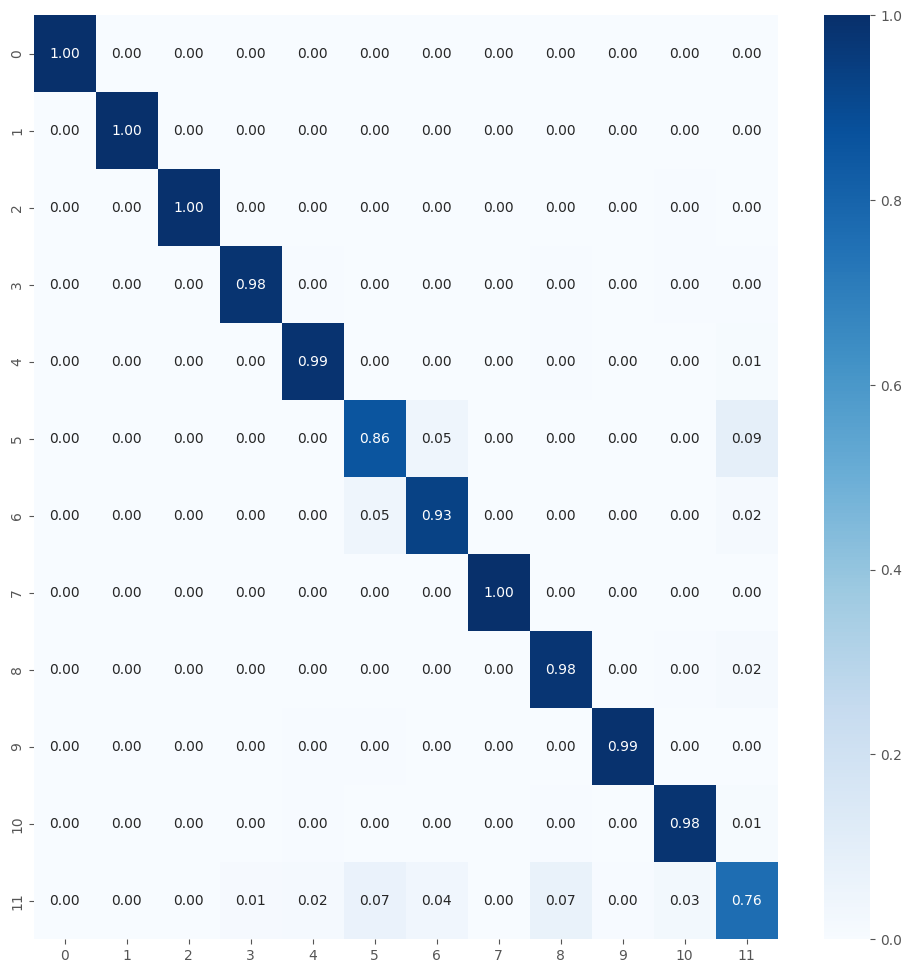


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3526732
Trainable params: 1359244
Non-trainable params: 2167488
Epoch 1/44
393/393 [==============================] - 74s 161ms/step - loss: 1.7316 - accuracy: 0.5057 - val_loss: 0.8299 - val_accuracy: 0.7861 - lr: 1.5212e-05
Epoch 2/44
393/393 [==============================] - 62s 157ms/step - loss: 0.9167 - accuracy: 0.7475 - val_loss: 0.5832 - val_accuracy: 0.8471 - lr: 1.5212e-05
Epoch 3/44
393/393 [==============================] - 62s 156ms/step - loss: 0.7025 - accuracy: 0.8059 - val_loss: 0.4730 - val_accuracy: 0.8676 - lr: 1.5212e-05
Epoch 4/44
393/393 [==============================] - 62s 156ms/step - loss: 0.5763 - accuracy: 0.8342 - val_loss: 0.4054 - val_accuracy: 0.8880 - lr: 1.5212e-05
Epoch 5/44
393/393 [==============================] - 62s 156ms/step - loss: 0.5008 - accuracy: 0.8577 - val_loss: 0.3602 - val_accuracy: 0.9025 - lr: 1.5212e-05
Epoch 6/44
393/393 [==============================] - 63s 158ms/step - los

Model and History saved...
394/394 [==============================] - 69s 175ms/step - loss: 0.0689 - accuracy: 0.9918
Train Accuracy: 0.9918254017829895
Train Log Loss: 0.06894057989120483
85/85 [==============================] - 15s 170ms/step - loss: 0.2118 - accuracy: 0.9444
Validation Accuracy: 0.9444444179534912
Validation Log Loss: 0.21183830499649048
85/85 [==============================] - 15s 173ms/step - loss: 0.1869 - accuracy: 0.9530
Test Accuracy: 0.9529629349708557
Test Log Loss: 0.1868598610162735
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   1   0   0   0   0   2   0]
 [  0   0   0   0 223   0   0   0   0   0   0   2]
 [  0   0   0   0  

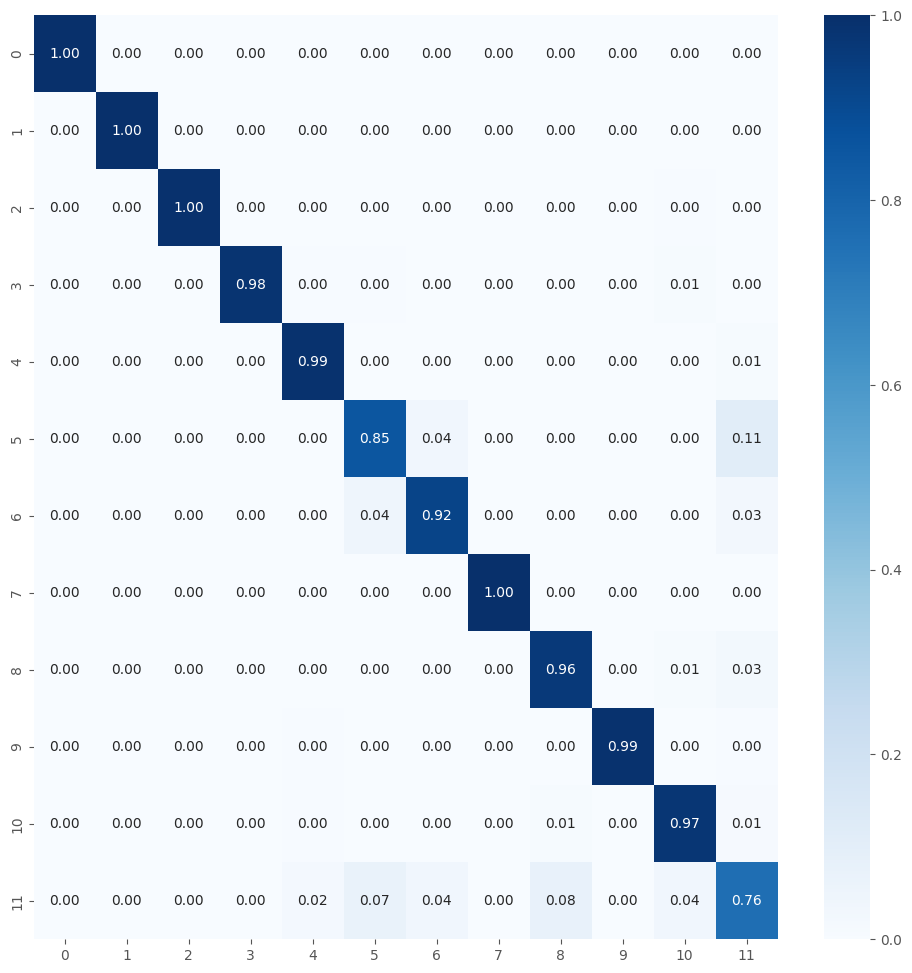


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3526732
Trainable params: 1359244
Non-trainable params: 2167488
Epoch 1/44
393/393 [==============================] - 105s 225ms/step - loss: 1.6894 - accuracy: 0.4970 - val_loss: 0.7583 - val_accuracy: 0.7812 - lr: 1.5212e-05
Epoch 2/44
393/393 [==============================] - 86s 217ms/step - loss: 0.8436 - accuracy: 0.7494 - val_loss: 0.5345 - val_accuracy: 0.8434 - lr: 1.5212e-05
Epoch 3/44
393/393 [==============================] - 67s 169ms/step - loss: 0.6535 - accuracy: 0.7999 - val_loss: 0.4445 - val_accuracy: 0.8642 - lr: 1.5212e-05
Epoch 4/44
393/393 [==============================] - 76s 192ms/step - loss: 0.5514 - accuracy: 0.8327 - val_loss: 0.3830 - val_accuracy: 0.8847 - lr: 1.5212e-05
Epoch 5/44
393/393 [==============================] - 67s 170ms/step - loss: 0.4777 - accuracy: 0.8583 - val_loss: 0.3414 - val_accuracy: 0.9007 - lr: 1.5212e-05
Epoch 6/44
393/393 [==============================] - 66s 168ms/step - lo

Model and History saved...
394/394 [==============================] - 62s 155ms/step - loss: 0.0701 - accuracy: 0.9910
Train Accuracy: 0.9910317659378052
Train Log Loss: 0.07005538046360016
85/85 [==============================] - 13s 153ms/step - loss: 0.2021 - accuracy: 0.9463
Validation Accuracy: 0.9462962746620178
Validation Log Loss: 0.20205897092819214
85/85 [==============================] - 14s 158ms/step - loss: 0.1883 - accuracy: 0.9507
Test Accuracy: 0.9507407546043396
Test Log Loss: 0.1883402168750763
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'dinwod': 5, 'ganelp': 6, 'mira': 7, 'sfone': 8, 'sillyp2p': 9, 'wabot': 10, 'wacatac': 11}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   1   0]
 [  0   0   0 220   1   1   0   0   0   0   2   1]
 [  0   0   0   0 223   0   0   1   0   0   0   1]
 [  0   0   0   0  

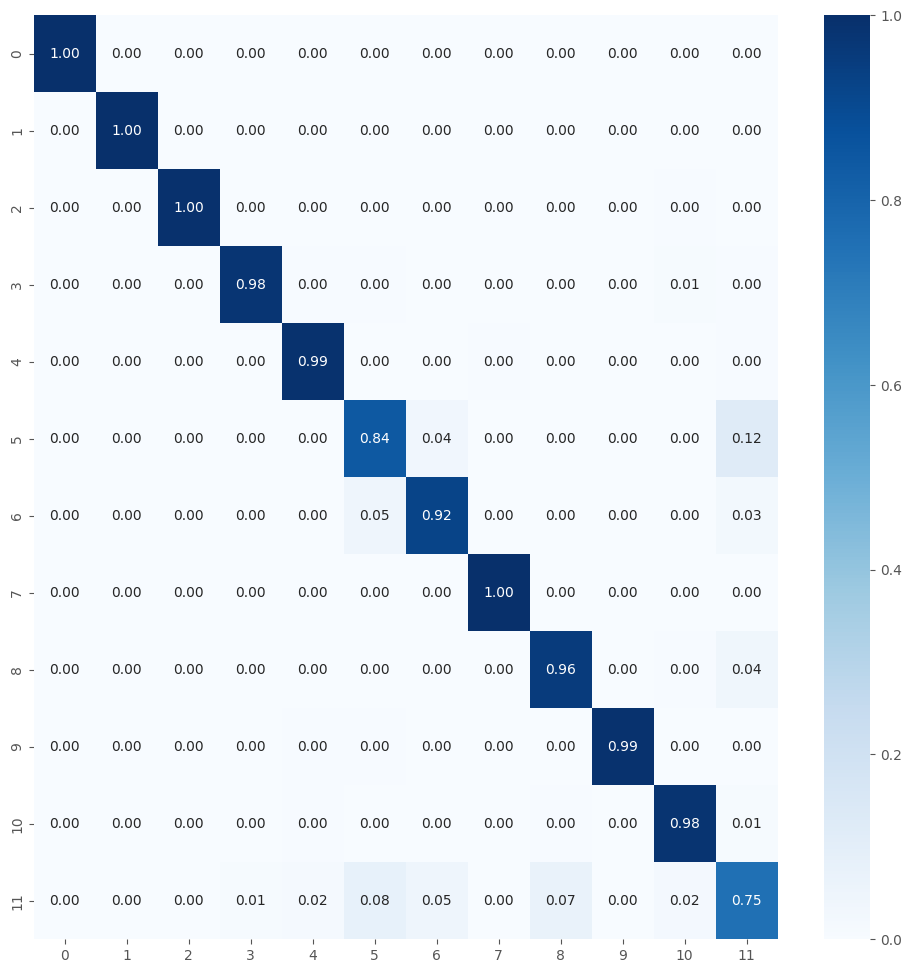

Average training accuracy in 5-fold: 0.9772119641304016
Average validation precision in 5-fold: 0.9470238208770752

Test Metrics
test_acc_list: [0.95333331823349, 0.9537037014961243, 0.9559259414672852, 0.9529629349708557, 0.9507407546043396]
Average Test Accuracy with 5-fold: 0.9533333301544189
test_loss_list: [0.1855403482913971, 0.19002704322338104, 0.18560445308685303, 0.1868598610162735, 0.1883402168750763]
Average Test Log Loss with 5-fold: 0.18727438449859618
Precision List: [0.9526831718855145, 0.9531315162295934, 0.9551834650074946, 0.9524548002150772, 0.9501269173949453]
Average Precision List with 5-fold: 0.952715974146525
Recall List: [0.9533333333333333, 0.9537037037037037, 0.955925925925926, 0.952962962962963, 0.9507407407407409]
Average Recall List with 5-fold: 0.9533333333333334
F1 Score List: [0.9522094722543156, 0.9531115860219597, 0.9553207357807509, 0.9525756016001753, 0.9503525646107183]
Average F1 Score List with 5-fold: 0.952713992053584

Metrics List Store

test

In [42]:
%%time

num_classes = 12
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-07 05:43:13,631] A new study created in memory with name: no-name-9b64d3b1-a499-4df8-b6f4-22a2f4734942


Familias de malware copiadas
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 4349005
Trainable params: 2182029
Non-trainable params: 2166976


2025-06-07 05:45:01.024367: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-07 05:45:01.024453: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 10796977728135408850
2025-06-07 05:45:01.024498: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6223181869973454430
[I 2025-06-07 05:45:01,674] Trial 0 finished with values: [0.8950427174568176, 0.5046873092651367] and parameters: {'learning_rate': 0.001168886613168366, 'dropout_rate1': 0.5299233881242056, 'dropout_rate2': 0.31434600789017364, 'l2_reg': 0.00016270371206504063, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 20, 'reduce_lr_patience': 13}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 3543373
Trainable params: 1375885
Non-trainable params: 2167488


[I 2025-06-07 06:02:26,652] Trial 1 finished with values: [0.9305555820465088, 0.5333949327468872] and parameters: {'learning_rate': 0.009901530550624692, 'dropout_rate1': 0.5545828355453419, 'dropout_rate2': 0.43007401165000403, 'l2_reg': 2.7136215305282e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 64, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 14, 'reduce_lr_patience': 10, 'units_dense3': 128, 'dropout_rate3': 0.17008450719006593}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 4358157
Trainable params: 2189133
Non-trainable params: 2169024


[I 2025-06-07 06:04:08,608] Trial 2 finished with values: [0.8307692408561707, 0.5384877920150757] and parameters: {'learning_rate': 0.0012319140113748652, 'dropout_rate1': 0.2936600741376288, 'dropout_rate2': 0.41127863430414646, 'l2_reg': 3.746866957511193e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 16, 'epochs': 46, 'num_dense_layers': 3, 'unfreeze_layers': 6, 'early_stopping_patience': 19, 'reduce_lr_patience': 15, 'units_dense3': 128, 'dropout_rate3': 0.13526562523184643}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 3561421
Trainable params: 1384717
Non-trainable params: 2176704


[I 2025-06-07 06:05:48,260] Trial 3 finished with values: [0.8988034129142761, 0.2763528823852539] and parameters: {'learning_rate': 0.0012844878845971503, 'dropout_rate1': 0.3772348702209025, 'dropout_rate2': 0.3958839316187357, 'l2_reg': 1.4525760002418272e-05, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 14, 'reduce_lr_patience': 10}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 4415437
Trainable params: 2773773
Non-trainable params: 1641664


[I 2025-06-07 06:23:23,700] Trial 4 finished with values: [0.9347222447395325, 0.7255384922027588] and parameters: {'learning_rate': 0.00015453393007974737, 'dropout_rate1': 0.5302017210554344, 'dropout_rate2': 0.47758617822049, 'l2_reg': 0.0010285792513992477, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 64, 'epochs': 25, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 18, 'reduce_lr_patience': 10}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 3798541
Trainable params: 2156877
Non-trainable params: 1641664


[I 2025-06-07 06:25:06,704] Trial 5 finished with values: [0.7958974242210388, 0.8530960083007812] and parameters: {'learning_rate': 1.284184602997375e-05, 'dropout_rate1': 0.2124639479856855, 'dropout_rate2': 0.2914172319570988, 'l2_reg': 4.413029914556532e-05, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 16, 'epochs': 30, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 10, 'reduce_lr_patience': 10, 'units_dense3': 128, 'dropout_rate3': 0.13360273131568887}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 4579533
Trainable params: 2410509
Non-trainable params: 2169024


[I 2025-06-07 07:17:23,948] Trial 6 finished with values: [0.9543269276618958, 0.25887176394462585] and parameters: {'learning_rate': 0.00010962541887951694, 'dropout_rate1': 0.4256797546696601, 'dropout_rate2': 0.1839805695117777, 'l2_reg': 0.00853576497848697, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 40, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 17, 'reduce_lr_patience': 13, 'units_dense3': 128, 'dropout_rate3': 0.2778576823500502}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 3561421
Trainable params: 1393933
Non-trainable params: 2167488


[I 2025-06-07 07:43:33,937] Trial 7 finished with values: [0.9555555582046509, 0.1442277729511261] and parameters: {'learning_rate': 3.49064047379886e-05, 'dropout_rate1': 0.20148153333377938, 'dropout_rate2': 0.4959230019597529, 'l2_reg': 1.1929528873734192e-05, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 9}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 3890381
Trainable params: 1713165
Non-trainable params: 2177216


[I 2025-06-07 07:45:11,012] Trial 8 finished with values: [0.9148718118667603, 2.2782180309295654] and parameters: {'learning_rate': 0.00044428945621236373, 'dropout_rate1': 0.2648290998523785, 'dropout_rate2': 0.4825257879157606, 'l2_reg': 0.0028843396142543038, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 19, 'reduce_lr_patience': 14}.


Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Total params: 3561421
Trainable params: 1925901
Non-trainable params: 1635520


[I 2025-06-07 07:46:52,747] Trial 9 finished with values: [0.7141880393028259, 1.052024483680725] and parameters: {'learning_rate': 0.0004705163140487304, 'dropout_rate1': 0.22379347614501152, 'dropout_rate2': 0.4716149760765186, 'l2_reg': 0.00042013092530598125, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 43, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 14, 'reduce_lr_patience': 10}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 7:
    val_accuracy: 0.9556
    val_loss: 0.1442
    Parámetros: {'learning_rate': 3.49064047379886e-05, 'dropout_rate1': 0.20148153333377938, 'dropout_rate2': 0.4959230019597529, 'l2_reg': 1.1929528873734192e-05, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 11, 'reduce_lr_patience': 9}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


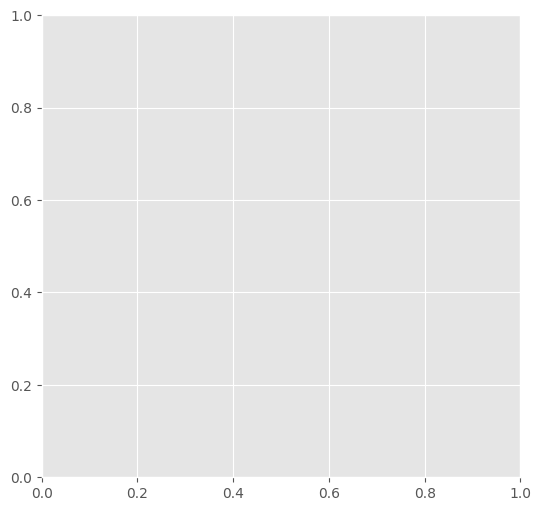

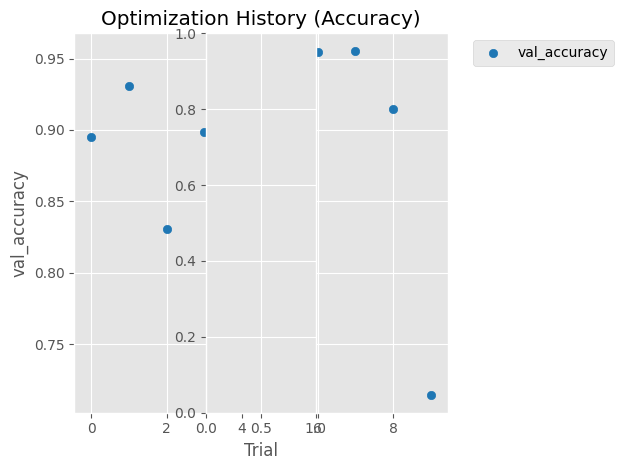

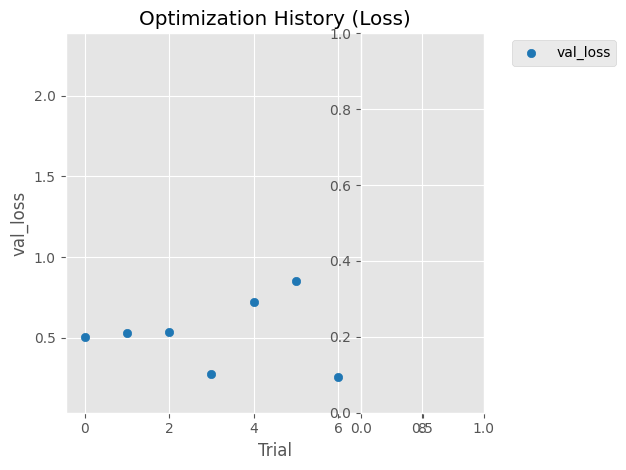

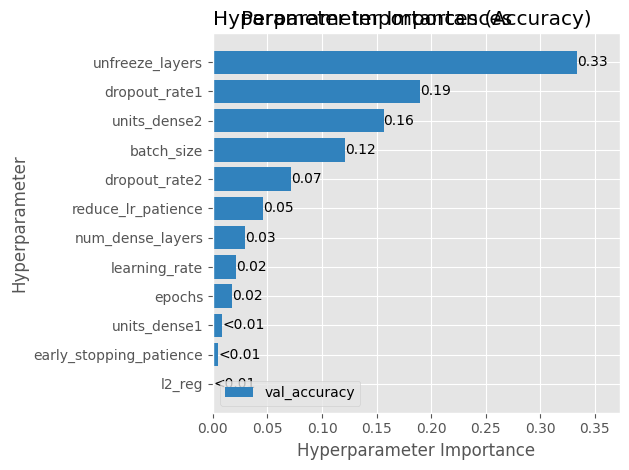

source2: /notebooks/train3/all_malware/13
name_save_model: fusion_MobileNet_tf_optunav213
Found 13650 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Found 2925 images belonging to 13 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3561421
Trainable params: 1393933
Non-trainable params: 2167488
Epoch 1/48
213/213 [==============================] - 55s 200ms/step - loss: 1.6410 - accuracy: 0.5107 - val_loss: 0.8082 - val_accuracy: 0.7806 - lr: 3.4906e-05
Epoch 2/48
213/213 [==============================] - 41s 188ms/step - loss: 0.8325 - accuracy: 0.7491 - val_loss: 0.4712 - val_accuracy: 0.8549 - lr: 3.4906e-05
Epoch 3/48
213/213 [==============================] - 38s 180ms/step - loss: 0.6303 - accuracy: 0.8092 - val_loss: 0.4053 - val_accuracy: 0.8687 - lr: 3.4906e-05
Epo

Model and History saved...
427/427 [==============================] - 64s 149ms/step - loss: 0.0693 - accuracy: 0.9762
Train Accuracy: 0.976190447807312
Train Log Loss: 0.06930061429738998
92/92 [==============================] - 14s 149ms/step - loss: 0.1633 - accuracy: 0.9436
Validation Accuracy: 0.9435897469520569
Validation Log Loss: 0.16326390206813812
92/92 [==============================] - 14s 147ms/step - loss: 0.1525 - accuracy: 0.9508
Test Accuracy: 0.9507692456245422
Test Log Loss: 0.15246815979480743
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   0   0   0   0   1   0   0   1]
 [  0   0   0   0 222   0   0   1   1   

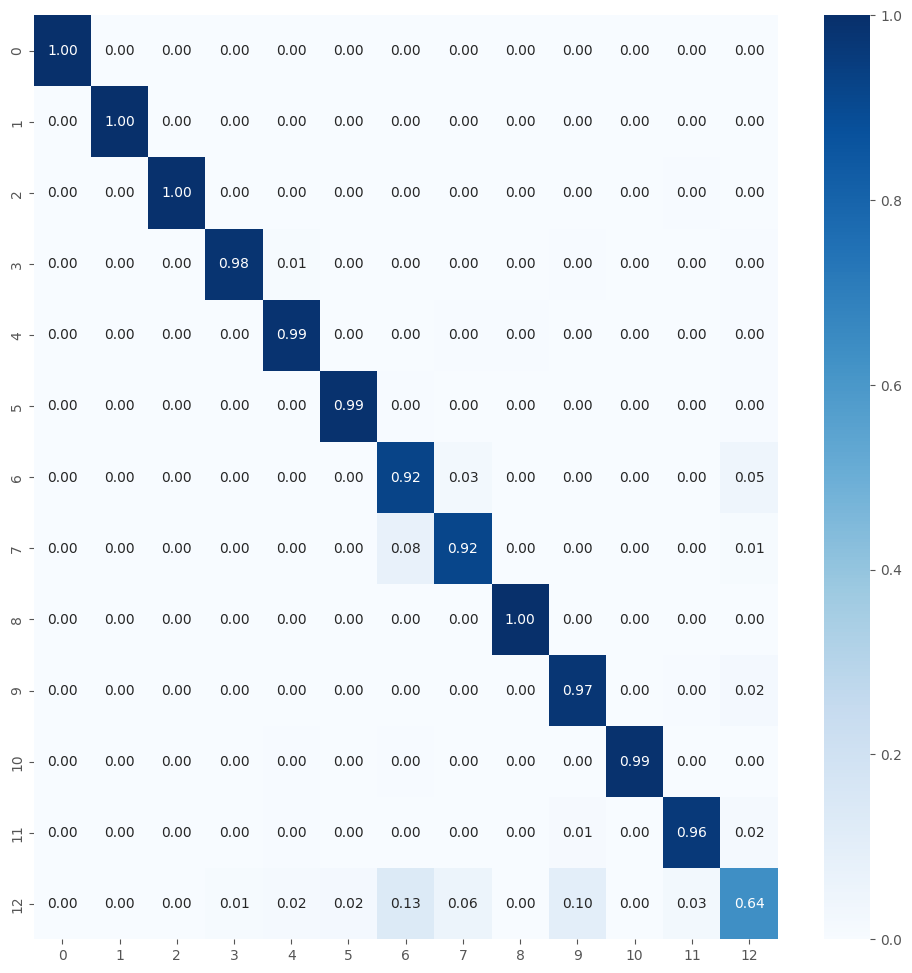


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3561421
Trainable params: 1393933
Non-trainable params: 2167488
Epoch 1/48
213/213 [==============================] - 55s 202ms/step - loss: 1.6079 - accuracy: 0.5279 - val_loss: 0.8703 - val_accuracy: 0.7632 - lr: 3.4906e-05
Epoch 2/48
213/213 [==============================] - 40s 187ms/step - loss: 0.8193 - accuracy: 0.7510 - val_loss: 0.4781 - val_accuracy: 0.8625 - lr: 3.4906e-05
Epoch 3/48
213/213 [==============================] - 41s 189ms/step - loss: 0.6116 - accuracy: 0.8107 - val_loss: 0.3937 - val_accuracy: 0.8771 - lr: 3.4906e-05
Epoch 4/48
213/213 [==============================] - 40s 185ms/step - loss: 0.4988 - accuracy: 0.8446 - val_loss: 0.3346 - val_accuracy: 0.8931 - lr: 3.4906e-05
Epoch 5/48
213/213 [==============================] - 39s 184ms/step - loss: 0.4398 - accuracy: 0.8611 - val_loss: 0.3032 - val_accuracy: 0.8993 - lr: 3.4906e-05
Epoch 6/48
213/213 [==============================] - 41s 192ms/step - los

Model and History saved...
427/427 [==============================] - 60s 139ms/step - loss: 0.0761 - accuracy: 0.9748
Train Accuracy: 0.9747985601425171
Train Log Loss: 0.07605001330375671
92/92 [==============================] - 14s 139ms/step - loss: 0.1703 - accuracy: 0.9443
Validation Accuracy: 0.9442735314369202
Validation Log Loss: 0.17029927670955658
92/92 [==============================] - 14s 146ms/step - loss: 0.1579 - accuracy: 0.9484
Test Accuracy: 0.9483760595321655
Test Log Loss: 0.15789379179477692
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 220   2   0   0   0   0   2   0   0   1]
 [  0   0   0   0 223   0   0   0   0  

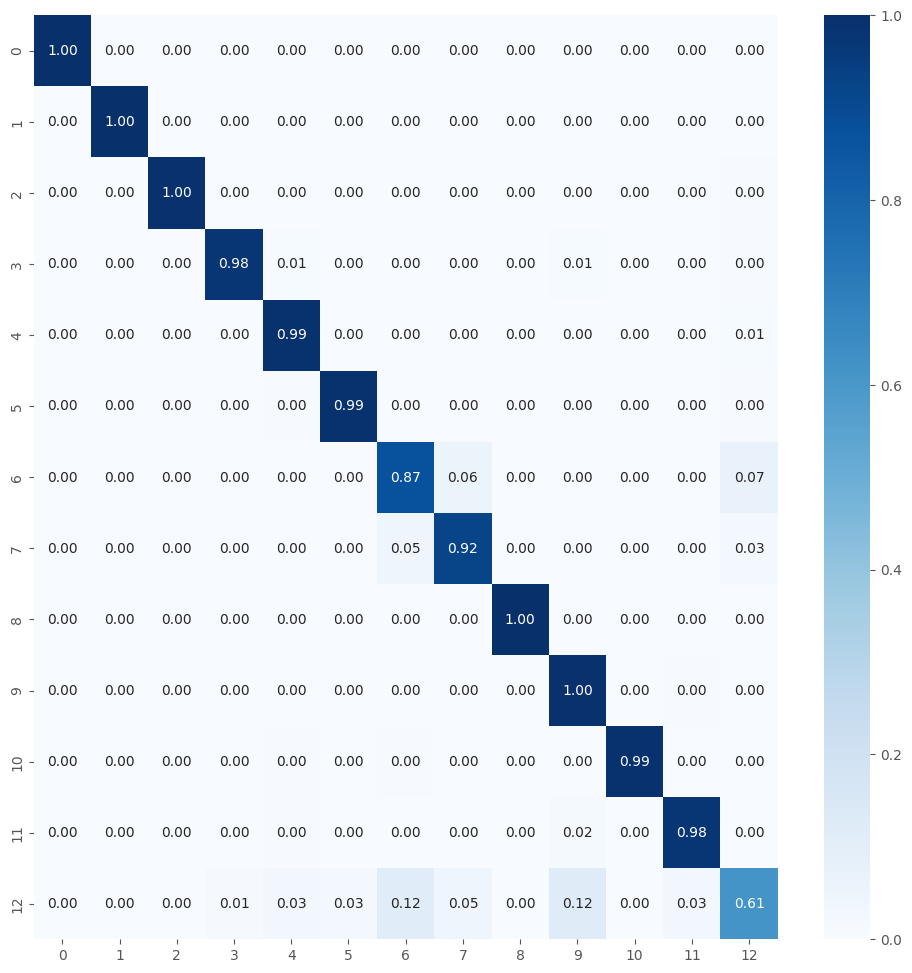


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3561421
Trainable params: 1393933
Non-trainable params: 2167488
Epoch 1/48
213/213 [==============================] - 50s 183ms/step - loss: 1.7186 - accuracy: 0.4840 - val_loss: 0.8140 - val_accuracy: 0.7785 - lr: 3.4906e-05
Epoch 2/48
213/213 [==============================] - 38s 176ms/step - loss: 0.8243 - accuracy: 0.7533 - val_loss: 0.4829 - val_accuracy: 0.8549 - lr: 3.4906e-05
Epoch 3/48
213/213 [==============================] - 37s 171ms/step - loss: 0.6436 - accuracy: 0.8036 - val_loss: 0.4106 - val_accuracy: 0.8660 - lr: 3.4906e-05
Epoch 4/48
213/213 [==============================] - 37s 171ms/step - loss: 0.5339 - accuracy: 0.8291 - val_loss: 0.3140 - val_accuracy: 0.9049 - lr: 3.4906e-05
Epoch 5/48
213/213 [==============================] - 37s 171ms/step - loss: 0.4606 - accuracy: 0.8539 - val_loss: 0.3186 - val_accuracy: 0.9021 - lr: 3.4906e-05
Epoch 6/48
213/213 [==============================] - 37s 175ms/step - los

Model and History saved...
427/427 [==============================] - 56s 131ms/step - loss: 0.0442 - accuracy: 0.9864
Train Accuracy: 0.9864468574523926
Train Log Loss: 0.04417072981595993
92/92 [==============================] - 12s 130ms/step - loss: 0.1592 - accuracy: 0.9480
Validation Accuracy: 0.9480341672897339
Validation Log Loss: 0.1591845005750656
92/92 [==============================] - 13s 132ms/step - loss: 0.1409 - accuracy: 0.9549
Test Accuracy: 0.9548717737197876
Test Log Loss: 0.14086847007274628
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   0   1   0   0   0   0   0   1]
 [  0   0   0   0 222   0   0   0   0   

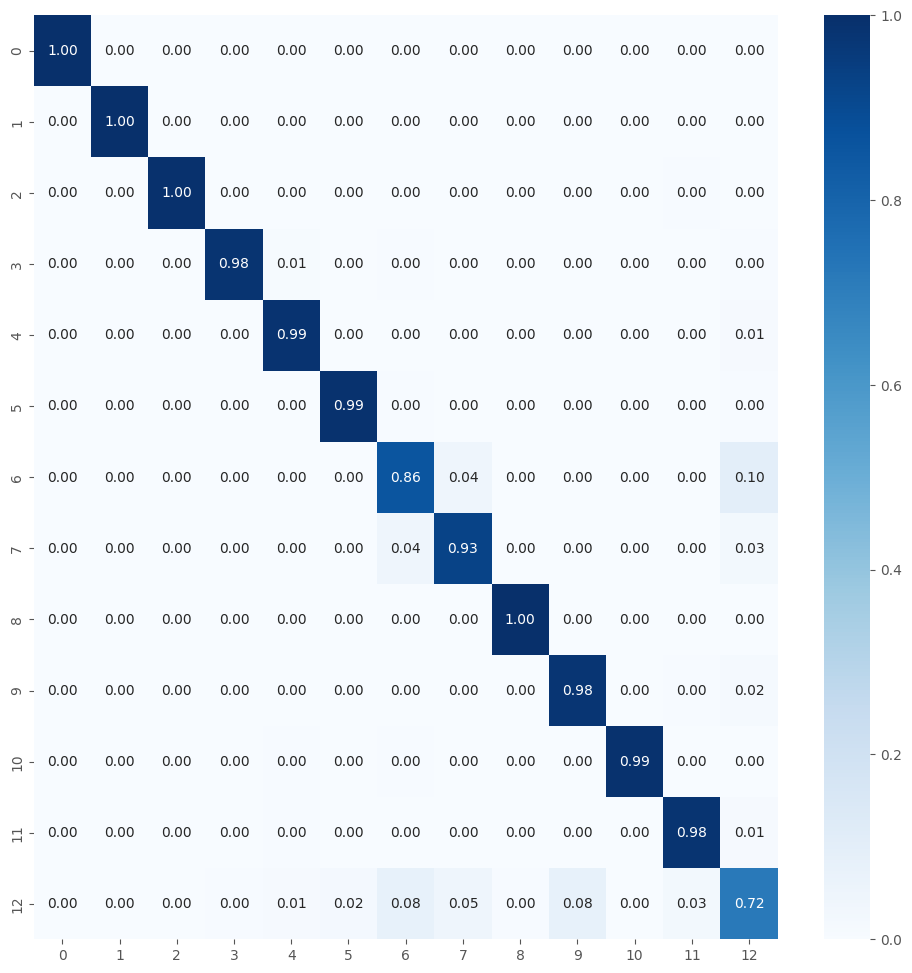


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3561421
Trainable params: 1393933
Non-trainable params: 2167488
Epoch 1/48
213/213 [==============================] - 48s 175ms/step - loss: 1.6978 - accuracy: 0.5009 - val_loss: 0.8877 - val_accuracy: 0.7618 - lr: 3.4906e-05
Epoch 2/48
213/213 [==============================] - 35s 163ms/step - loss: 0.8515 - accuracy: 0.7481 - val_loss: 0.5107 - val_accuracy: 0.8361 - lr: 3.4906e-05
Epoch 3/48
213/213 [==============================] - 35s 166ms/step - loss: 0.6608 - accuracy: 0.8005 - val_loss: 0.4113 - val_accuracy: 0.8653 - lr: 3.4906e-05
Epoch 4/48
213/213 [==============================] - 35s 164ms/step - loss: 0.5294 - accuracy: 0.8357 - val_loss: 0.3418 - val_accuracy: 0.8868 - lr: 3.4906e-05
Epoch 5/48
213/213 [==============================] - 35s 165ms/step - loss: 0.4782 - accuracy: 0.8477 - val_loss: 0.3248 - val_accuracy: 0.8924 - lr: 3.4906e-05
Epoch 6/48
213/213 [==============================] - 36s 168ms/step - los

Model and History saved...
427/427 [==============================] - 61s 140ms/step - loss: 0.0411 - accuracy: 0.9895
Train Accuracy: 0.9894505739212036
Train Log Loss: 0.041134681552648544
92/92 [==============================] - 14s 136ms/step - loss: 0.1591 - accuracy: 0.9504
Validation Accuracy: 0.9504273533821106
Validation Log Loss: 0.1590518057346344
92/92 [==============================] - 13s 135ms/step - loss: 0.1526 - accuracy: 0.9562
Test Accuracy: 0.9562393426895142
Test Log Loss: 0.15256445109844208
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   0   0   0   0   1   0   0   1]
 [  0   0   0   0 222   0   0   1   0  

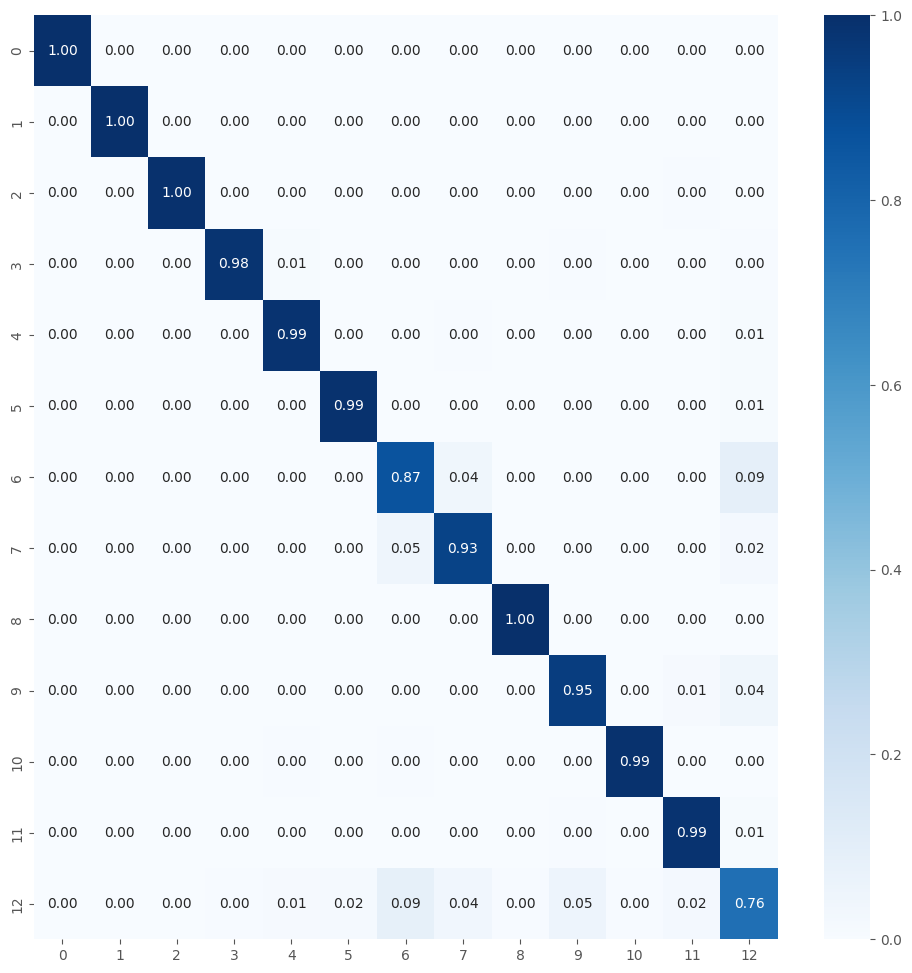


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3561421
Trainable params: 1393933
Non-trainable params: 2167488
Epoch 1/48
213/213 [==============================] - 51s 187ms/step - loss: 1.6587 - accuracy: 0.5151 - val_loss: 0.8822 - val_accuracy: 0.7792 - lr: 3.4906e-05
Epoch 2/48
213/213 [==============================] - 36s 168ms/step - loss: 0.8487 - accuracy: 0.7534 - val_loss: 0.5097 - val_accuracy: 0.8451 - lr: 3.4906e-05
Epoch 3/48
213/213 [==============================] - 37s 172ms/step - loss: 0.6312 - accuracy: 0.8104 - val_loss: 0.4133 - val_accuracy: 0.8687 - lr: 3.4906e-05
Epoch 4/48
213/213 [==============================] - 35s 165ms/step - loss: 0.5332 - accuracy: 0.8350 - val_loss: 0.3595 - val_accuracy: 0.8868 - lr: 3.4906e-05
Epoch 5/48
213/213 [==============================] - 36s 168ms/step - loss: 0.4505 - accuracy: 0.8615 - val_loss: 0.3032 - val_accuracy: 0.9042 - lr: 3.4906e-05
Epoch 6/48
213/213 [==============================] - 37s 170ms/step - los

Model and History saved...
427/427 [==============================] - 57s 134ms/step - loss: 0.0682 - accuracy: 0.9774
Train Accuracy: 0.9774358868598938
Train Log Loss: 0.06822392344474792
92/92 [==============================] - 13s 136ms/step - loss: 0.1647 - accuracy: 0.9460
Validation Accuracy: 0.9459829330444336
Validation Log Loss: 0.1647333949804306
92/92 [==============================] - 12s 133ms/step - loss: 0.1483 - accuracy: 0.9497
Test Accuracy: 0.9497435688972473
Test Log Loss: 0.14833509922027588
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'wabot': 11, 'wacatac': 12}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   2   0   0   0   0   1   0   0   1]
 [  0   0   0   0 221   0   0   1   1   

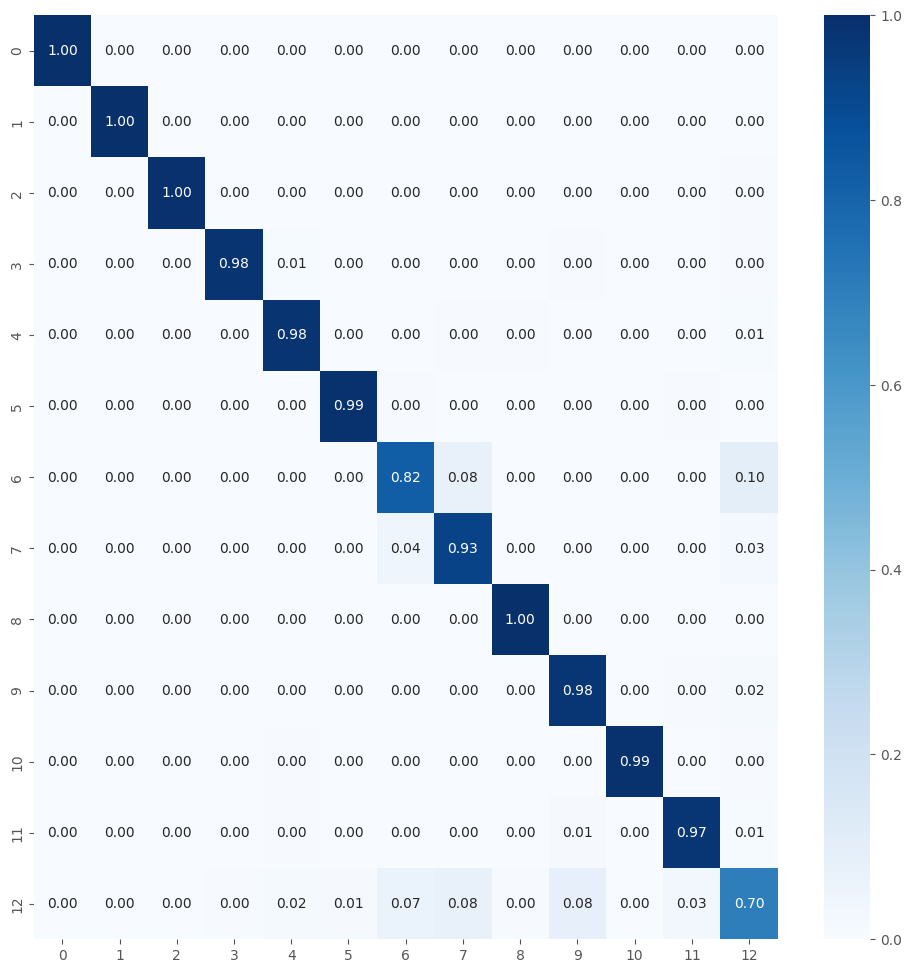

Average training accuracy in 5-fold: 0.9742634773254395
Average validation precision in 5-fold: 0.9543055534362793

Test Metrics
test_acc_list: [0.9507692456245422, 0.9483760595321655, 0.9548717737197876, 0.9562393426895142, 0.9497435688972473]
Average Test Accuracy with 5-fold: 0.9519999980926513
test_loss_list: [0.15246815979480743, 0.15789379179477692, 0.14086847007274628, 0.15256445109844208, 0.14833509922027588]
Average Test Log Loss with 5-fold: 0.1504259943962097
Precision List: [0.9507884304577907, 0.947408630123198, 0.9538685730551488, 0.9556659172055859, 0.948897432688497]
Average Precision List with 5-fold: 0.9513257967060442
Recall List: [0.9507692307692307, 0.9483760683760684, 0.9548717948717951, 0.9562393162393162, 0.9497435897435896]
Average Recall List with 5-fold: 0.952
F1 Score List: [0.949135444097839, 0.9461665964460579, 0.954113120562709, 0.9558731687359295, 0.948781924056679]
Average F1 Score List with 5-fold: 0.950814050779843

Metrics List Store

test_acc_list_a

In [43]:
%%time

num_classes = 13
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-07 10:16:20,642] A new study created in memory with name: no-name-6be90a7a-f7f3-4b1d-bfca-3d9c4bd980d4


Familias de malware copiadas
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 4548558
Trainable params: 2379534
Non-trainable params: 2169024


[I 2025-06-07 10:56:51,055] Trial 0 finished with values: [0.9250637888908386, 0.3197934031486511] and parameters: {'learning_rate': 0.0015362236840555713, 'dropout_rate1': 0.42890365380410334, 'dropout_rate2': 0.4017972263287204, 'l2_reg': 0.0006717790158198704, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 32, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 16, 'reduce_lr_patience': 10}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3526990
Trainable params: 1886862
Non-trainable params: 1640128


[I 2025-06-07 11:33:18,764] Trial 1 finished with values: [0.9139030575752258, 0.2744646668434143] and parameters: {'learning_rate': 0.0038624740259143205, 'dropout_rate1': 0.4203016988375087, 'dropout_rate2': 0.37585160669059503, 'l2_reg': 1.7250582499638004e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 29, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 14, 'reduce_lr_patience': 9}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 4548558
Trainable params: 2912526
Non-trainable params: 1636032


[I 2025-06-07 12:15:04,483] Trial 2 finished with values: [0.9129464030265808, 0.32773178815841675] and parameters: {'learning_rate': 7.867909526711468e-05, 'dropout_rate1': 0.41747727542885266, 'dropout_rate2': 0.10663902966809286, 'l2_reg': 0.003280786834155444, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 34, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 12, 'reduce_lr_patience': 15}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3509646
Trainable params: 1875150
Non-trainable params: 1634496


[I 2025-06-07 12:33:39,600] Trial 3 finished with values: [0.8577806353569031, 0.3977583646774292] and parameters: {'learning_rate': 0.0031633620055673685, 'dropout_rate1': 0.34447226774923567, 'dropout_rate2': 0.454269955344487, 'l2_reg': 2.6257381480459485e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 39, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 10, 'reduce_lr_patience': 13}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3513806
Trainable params: 1873678
Non-trainable params: 1640128


[I 2025-06-07 13:13:38,485] Trial 4 finished with values: [0.8845663070678711, 0.3479495048522949] and parameters: {'learning_rate': 0.0020427813491360755, 'dropout_rate1': 0.2828605303508505, 'dropout_rate2': 0.1170524254574425, 'l2_reg': 4.167138200058379e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 32, 'epochs': 30, 'num_dense_layers': 3, 'unfreeze_layers': 11, 'early_stopping_patience': 11, 'reduce_lr_patience': 13, 'units_dense3': 64, 'dropout_rate3': 0.3318755071321506}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3592782
Trainable params: 1958286
Non-trainable params: 1634496


[I 2025-06-07 14:01:06,063] Trial 5 finished with values: [0.9100765585899353, 0.283292293548584] and parameters: {'learning_rate': 0.0045050105566678275, 'dropout_rate1': 0.5670937241497352, 'dropout_rate2': 0.2426119348362179, 'l2_reg': 0.000541636499029594, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 32, 'epochs': 36, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 16, 'reduce_lr_patience': 9, 'units_dense3': 128, 'dropout_rate3': 0.2396353751131633}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3904398
Trainable params: 2262734
Non-trainable params: 1641664


[I 2025-06-07 14:40:05,198] Trial 6 finished with values: [0.8925382494926453, 0.46358513832092285] and parameters: {'learning_rate': 0.00034638318947596234, 'dropout_rate1': 0.43714336303102874, 'dropout_rate2': 0.26669601972309326, 'l2_reg': 0.0006338459253472704, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 27, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 19, 'reduce_lr_patience': 10, 'units_dense3': 64, 'dropout_rate3': 0.21841802146083206}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3890638
Trainable params: 2249998
Non-trainable params: 1640640


[I 2025-06-07 15:23:10,888] Trial 7 finished with values: [0.9094387888908386, 0.2863723635673523] and parameters: {'learning_rate': 0.00595014638758014, 'dropout_rate1': 0.557503593266534, 'dropout_rate2': 0.1781921583419771, 'l2_reg': 0.0034590480898963705, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 32, 'epochs': 34, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 20, 'reduce_lr_patience': 8}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3561678
Trainable params: 1394190
Non-trainable params: 2167488


[I 2025-06-07 15:45:20,577] Trial 8 finished with values: [0.9221938848495483, 0.2680620551109314] and parameters: {'learning_rate': 0.0025977801408062747, 'dropout_rate1': 0.21411916804888065, 'dropout_rate2': 0.286924925985663, 'l2_reg': 0.00045548998008497515, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 12, 'reduce_lr_patience': 9}.


Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Total params: 3823182
Trainable params: 1655182
Non-trainable params: 2168000


[I 2025-06-07 16:17:52,315] Trial 9 finished with values: [0.9202806353569031, 1.0581676959991455] and parameters: {'learning_rate': 4.54365962402975e-05, 'dropout_rate1': 0.5239469441096443, 'dropout_rate2': 0.38063637493565217, 'l2_reg': 0.004388871017954272, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 48, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 17, 'reduce_lr_patience': 12}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 0:
    val_accuracy: 0.9251
    val_loss: 0.3198
    Parámetros: {'learning_rate': 0.0015362236840555713, 'dropout_rate1': 0.42890365380410334, 'dropout_rate2': 0.4017972263287204, 'l2_reg': 0.0006717790158198704, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 32, 'epochs': 32, 'num_dense_layers': 2, 'unfreeze_layers': 6, 'early_stopping_patience': 16, 'reduce_lr_patience': 10}
  Trial 8:
    val_accuracy: 0.9222
    val_loss: 0.2681
    Parámetros: {'learning_rate': 0.0025977801408062747, 'dropout_rate1': 0.21411916804888065, 'dropout_rate2': 0.286924925985663, 'l2_reg': 0.00045548998008497515, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 7, 'early_stopping_patience': 12, 'reduce_lr_patience': 9}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


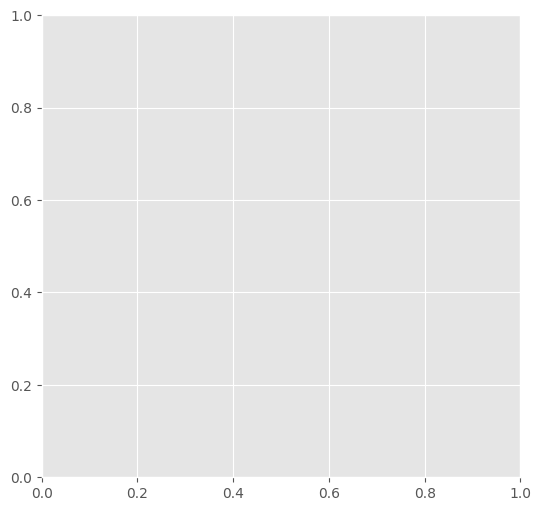

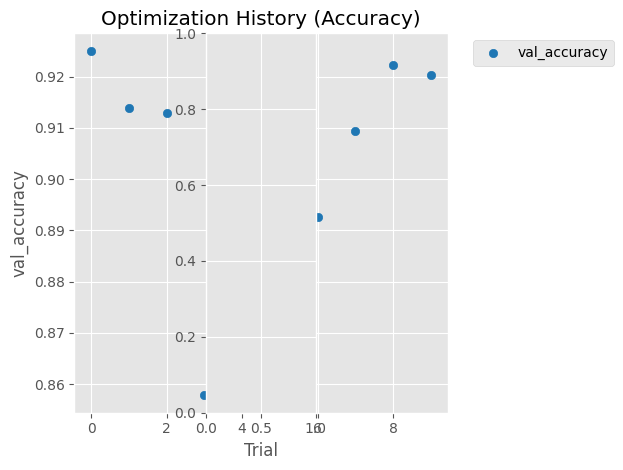

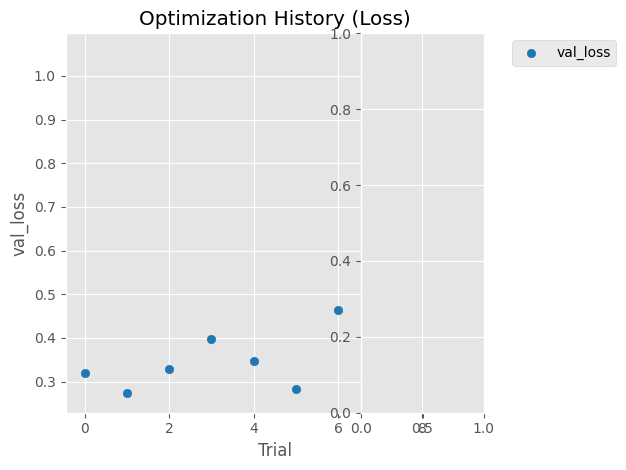

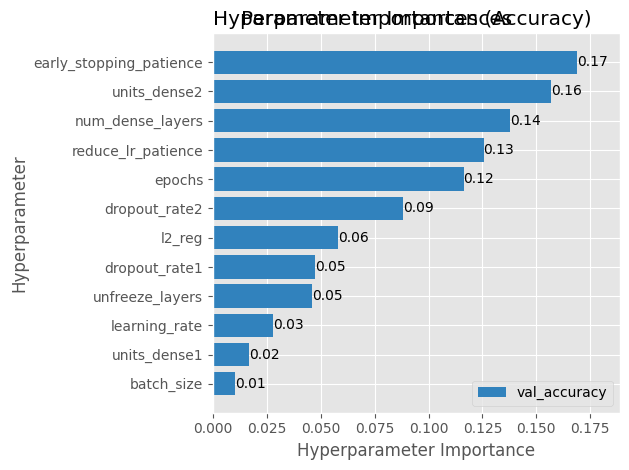

source2: /notebooks/train3/all_malware/14
name_save_model: fusion_MobileNet_tf_optunav214
Found 14700 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Found 3150 images belonging to 14 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
- small

TRAINING AND EVALUATING FOLD 1/5...

Total params: 4548558
Trainable params: 2379534
Non-trainable params: 2169024
Epoch 1/32
459/459 [==============================] - 84s 157ms/step - loss: 1.5016 - accuracy: 0.7912 - val_loss: 1.2543 - val_accuracy: 0.8033 - lr: 0.0015
Epoch 2/32
459/459 [==============================] - 71s 155ms/step - loss: 0.8918 - accuracy: 0.8579 - val_loss: 0.7769 - val_accuracy: 0.8760 - lr: 0.0015
Epoch 3/32
459/459 [==============================] - 73s 156ms/step - loss: 0.6548 - accuracy: 0.8771 - val_loss: 0.5609 - val_accuracy: 0.8935 - lr: 0.0015
Epoch 4

Model and History saved...
460/460 [==============================] - 67s 146ms/step - loss: 0.0989 - accuracy: 0.9639
Train Accuracy: 0.9638775587081909
Train Log Loss: 0.09889553487300873
99/99 [==============================] - 16s 148ms/step - loss: 0.3274 - accuracy: 0.9165
Validation Accuracy: 0.9165079593658447
Validation Log Loss: 0.3273856043815613
99/99 [==============================] - 19s 185ms/step - loss: 0.3052 - accuracy: 0.9232
Test Accuracy: 0.9231746196746826
Test Log Loss: 0.3052438199520111
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   2   0   0   0   0   1   0   0   0   1]
 [  0   0   

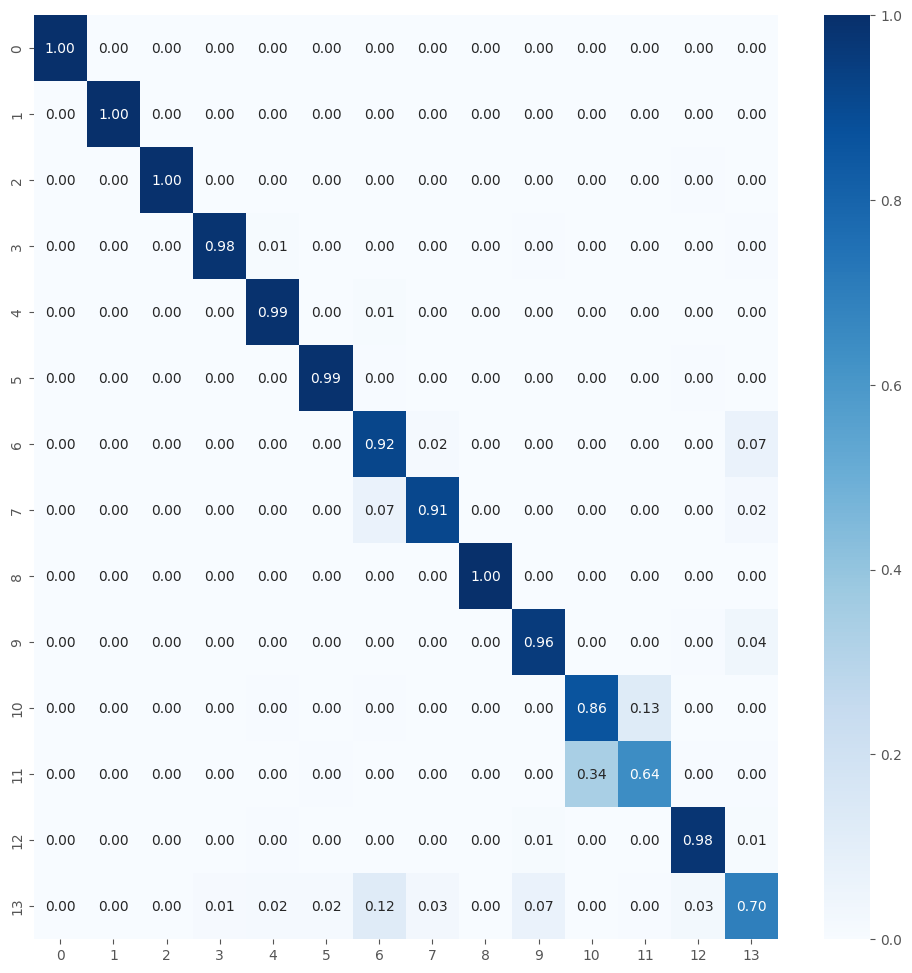


TRAINING AND EVALUATING FOLD 2/5...

Total params: 4548558
Trainable params: 2379534
Non-trainable params: 2169024
Epoch 1/32
459/459 [==============================] - 100s 187ms/step - loss: 1.4877 - accuracy: 0.7901 - val_loss: 1.2107 - val_accuracy: 0.7997 - lr: 0.0015
Epoch 2/32
459/459 [==============================] - 82s 178ms/step - loss: 0.9148 - accuracy: 0.8532 - val_loss: 0.8534 - val_accuracy: 0.8466 - lr: 0.0015
Epoch 3/32
459/459 [==============================] - 82s 178ms/step - loss: 0.6629 - accuracy: 0.8724 - val_loss: 0.5963 - val_accuracy: 0.8884 - lr: 0.0015
Epoch 4/32
459/459 [==============================] - 82s 177ms/step - loss: 0.5242 - accuracy: 0.8840 - val_loss: 0.6211 - val_accuracy: 0.8664 - lr: 0.0015
Epoch 5/32
459/459 [==============================] - 83s 178ms/step - loss: 0.4835 - accuracy: 0.8926 - val_loss: 0.5297 - val_accuracy: 0.8772 - lr: 0.0015
Epoch 6/32
459/459 [==============================] - 82s 178ms/step - loss: 0.4620 - accurac

Model and History saved...
460/460 [==============================] - 75s 161ms/step - loss: 0.3560 - accuracy: 0.9059
Train Accuracy: 0.905850350856781
Train Log Loss: 0.3559613525867462
99/99 [==============================] - 17s 167ms/step - loss: 0.5933 - accuracy: 0.8689
Validation Accuracy: 0.8688889145851135
Validation Log Loss: 0.5932894945144653
99/99 [==============================] - 16s 156ms/step - loss: 0.5866 - accuracy: 0.8686
Test Accuracy: 0.868571400642395
Test Log Loss: 0.5865771174430847
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0   0   0   0   0]
 [  0   0   0 221   2   0   0   0   0   1   0   1   0   0]
 [  0   0   0  

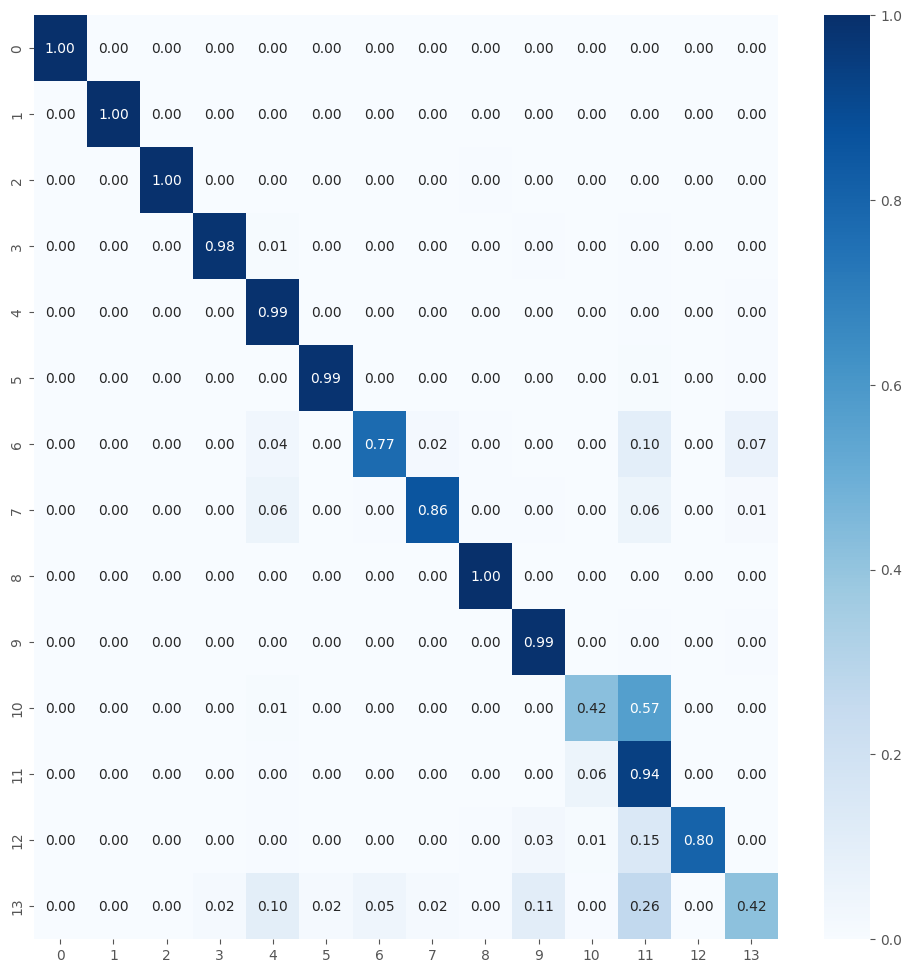


TRAINING AND EVALUATING FOLD 3/5...

Total params: 4548558
Trainable params: 2379534
Non-trainable params: 2169024
Epoch 1/32
459/459 [==============================] - 108s 203ms/step - loss: 1.4769 - accuracy: 0.7925 - val_loss: 1.1833 - val_accuracy: 0.8096 - lr: 0.0015
Epoch 2/32
459/459 [==============================] - 89s 193ms/step - loss: 0.8938 - accuracy: 0.8556 - val_loss: 0.7630 - val_accuracy: 0.8584 - lr: 0.0015
Epoch 3/32
459/459 [==============================] - 86s 186ms/step - loss: 0.6539 - accuracy: 0.8707 - val_loss: 0.6301 - val_accuracy: 0.8721 - lr: 0.0015
Epoch 4/32
459/459 [==============================] - 92s 198ms/step - loss: 0.5123 - accuracy: 0.8860 - val_loss: 0.7314 - val_accuracy: 0.8335 - lr: 0.0015
Epoch 5/32
459/459 [==============================] - 88s 191ms/step - loss: 0.4764 - accuracy: 0.8891 - val_loss: 0.5261 - val_accuracy: 0.8613 - lr: 0.0015
Epoch 6/32
459/459 [==============================] - 87s 188ms/step - loss: 0.4914 - accurac

Model and History saved...
460/460 [==============================] - 63s 137ms/step - loss: 0.1355 - accuracy: 0.9641
Train Accuracy: 0.9640816450119019
Train Log Loss: 0.1354769468307495
99/99 [==============================] - 14s 132ms/step - loss: 0.3696 - accuracy: 0.9171
Validation Accuracy: 0.9171428680419922
Validation Log Loss: 0.3696243464946747
99/99 [==============================] - 14s 141ms/step - loss: 0.3440 - accuracy: 0.9213
Test Accuracy: 0.9212698340415955
Test Log Loss: 0.3439925014972687
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 221   1   0   1   0   0   0   0   0   1   1]
 [  0   0   0

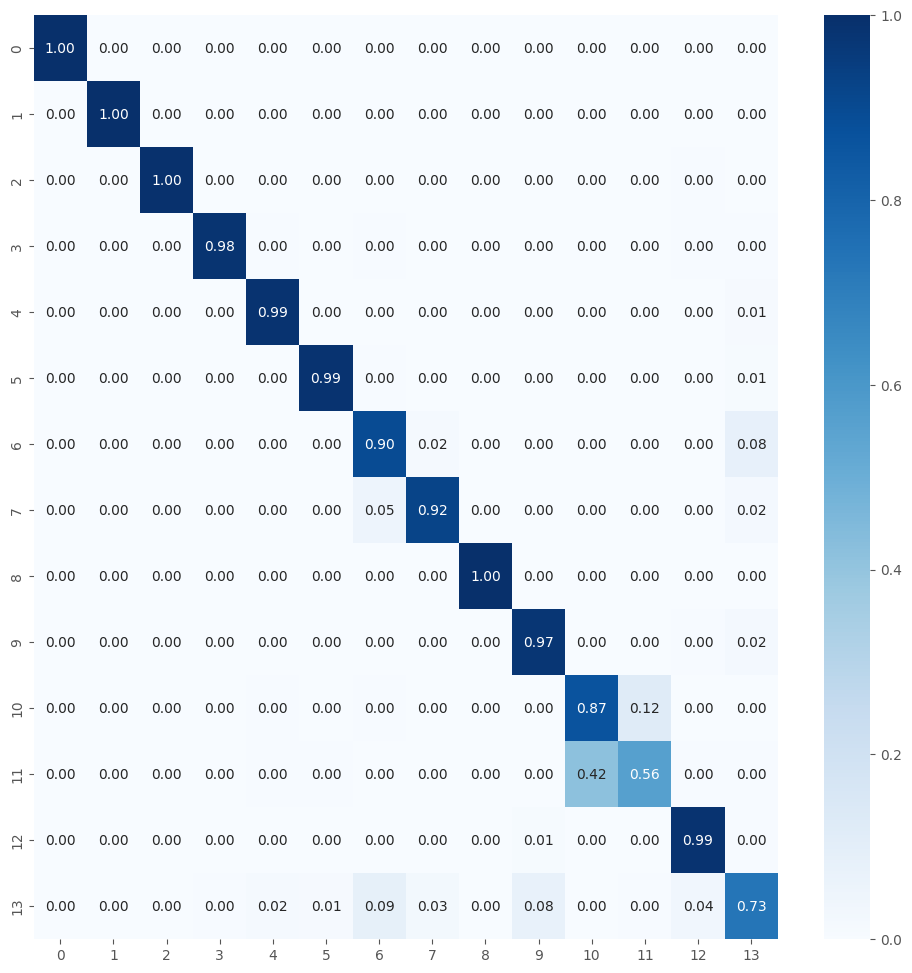


TRAINING AND EVALUATING FOLD 4/5...

Total params: 4548558
Trainable params: 2379534
Non-trainable params: 2169024
Epoch 1/32
459/459 [==============================] - 85s 164ms/step - loss: 1.5013 - accuracy: 0.7877 - val_loss: 1.1299 - val_accuracy: 0.8358 - lr: 0.0015
Epoch 2/32
459/459 [==============================] - 79s 171ms/step - loss: 0.8889 - accuracy: 0.8607 - val_loss: 2.1126 - val_accuracy: 0.7883 - lr: 0.0015
Epoch 3/32
459/459 [==============================] - 74s 161ms/step - loss: 0.6769 - accuracy: 0.8711 - val_loss: 0.9532 - val_accuracy: 0.8099 - lr: 0.0015
Epoch 4/32
459/459 [==============================] - 70s 152ms/step - loss: 0.5630 - accuracy: 0.8811 - val_loss: 0.5872 - val_accuracy: 0.8584 - lr: 0.0015
Epoch 5/32
459/459 [==============================] - 71s 154ms/step - loss: 0.4827 - accuracy: 0.8917 - val_loss: 0.5531 - val_accuracy: 0.8737 - lr: 0.0015
Epoch 6/32
459/459 [==============================] - 71s 155ms/step - loss: 0.4677 - accuracy

Model and History saved...
460/460 [==============================] - 64s 137ms/step - loss: 0.2047 - accuracy: 0.9627
Train Accuracy: 0.9626530408859253
Train Log Loss: 0.20468725264072418
99/99 [==============================] - 13s 124ms/step - loss: 0.4434 - accuracy: 0.9140
Validation Accuracy: 0.9139682650566101
Validation Log Loss: 0.4433704614639282
99/99 [==============================] - 14s 138ms/step - loss: 0.3905 - accuracy: 0.9232
Test Accuracy: 0.9231746196746826
Test Log Loss: 0.39053502678871155
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 218   1   0   0   0   0   1   0   0   4   1]
 [  0   0  

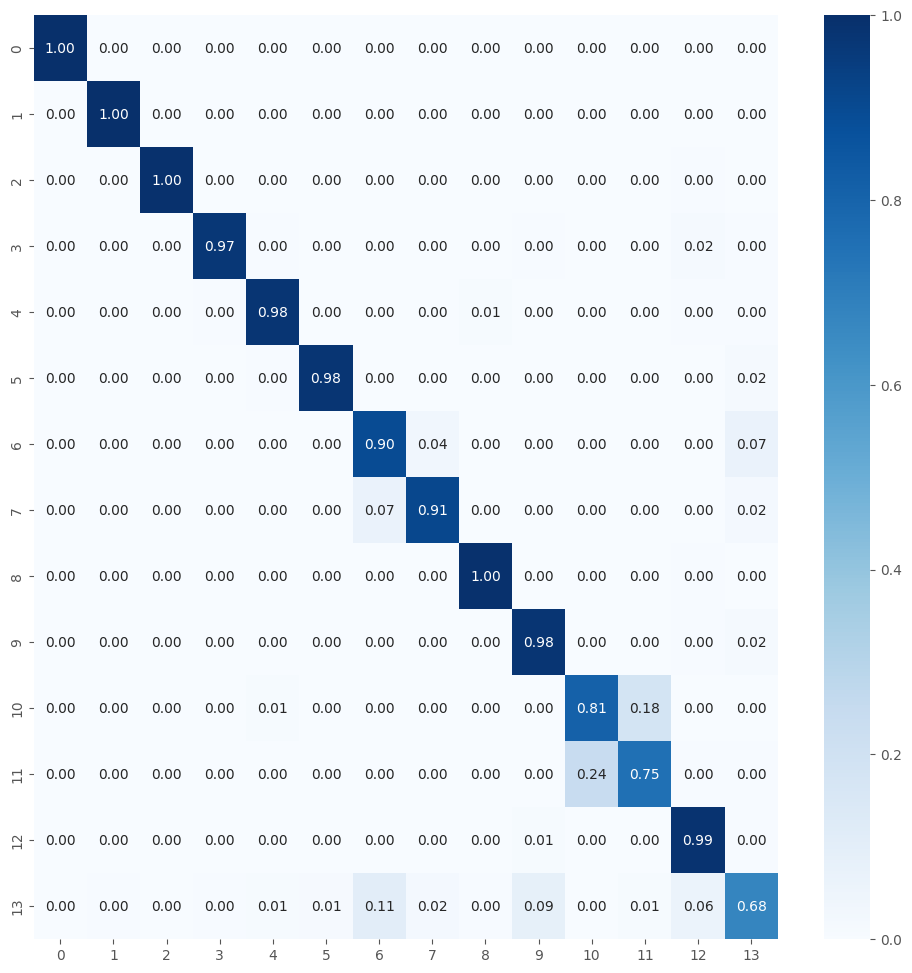


TRAINING AND EVALUATING FOLD 5/5...

Total params: 4548558
Trainable params: 2379534
Non-trainable params: 2169024
Epoch 1/32
459/459 [==============================] - 95s 183ms/step - loss: 1.4858 - accuracy: 0.7925 - val_loss: 1.5443 - val_accuracy: 0.7360 - lr: 0.0015
Epoch 2/32
459/459 [==============================] - 73s 158ms/step - loss: 0.9030 - accuracy: 0.8555 - val_loss: 0.9110 - val_accuracy: 0.8195 - lr: 0.0015
Epoch 3/32
459/459 [==============================] - 74s 159ms/step - loss: 0.6634 - accuracy: 0.8713 - val_loss: 0.9077 - val_accuracy: 0.7602 - lr: 0.0015
Epoch 4/32
459/459 [==============================] - 83s 178ms/step - loss: 0.5604 - accuracy: 0.8844 - val_loss: 0.8407 - val_accuracy: 0.8198 - lr: 0.0015
Epoch 5/32
459/459 [==============================] - 73s 158ms/step - loss: 0.4886 - accuracy: 0.8896 - val_loss: 0.6694 - val_accuracy: 0.8380 - lr: 0.0015
Epoch 6/32
459/459 [==============================] - 73s 160ms/step - loss: 0.4441 - accuracy

Model and History saved...
460/460 [==============================] - 61s 133ms/step - loss: 0.1061 - accuracy: 0.9680
Train Accuracy: 0.9680272340774536
Train Log Loss: 0.1060776561498642
99/99 [==============================] - 12s 124ms/step - loss: 0.3257 - accuracy: 0.9206
Validation Accuracy: 0.920634925365448
Validation Log Loss: 0.3256640136241913
99/99 [==============================] - 13s 127ms/step - loss: 0.2970 - accuracy: 0.9279
Test Accuracy: 0.9279364943504333
Test Log Loss: 0.2969946265220642
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'wabot': 12, 'wacatac': 13}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   1   0]
 [  0   0   0 222   1   0   2   0   0   0   0   0   0   0]
 [  0   0   0 

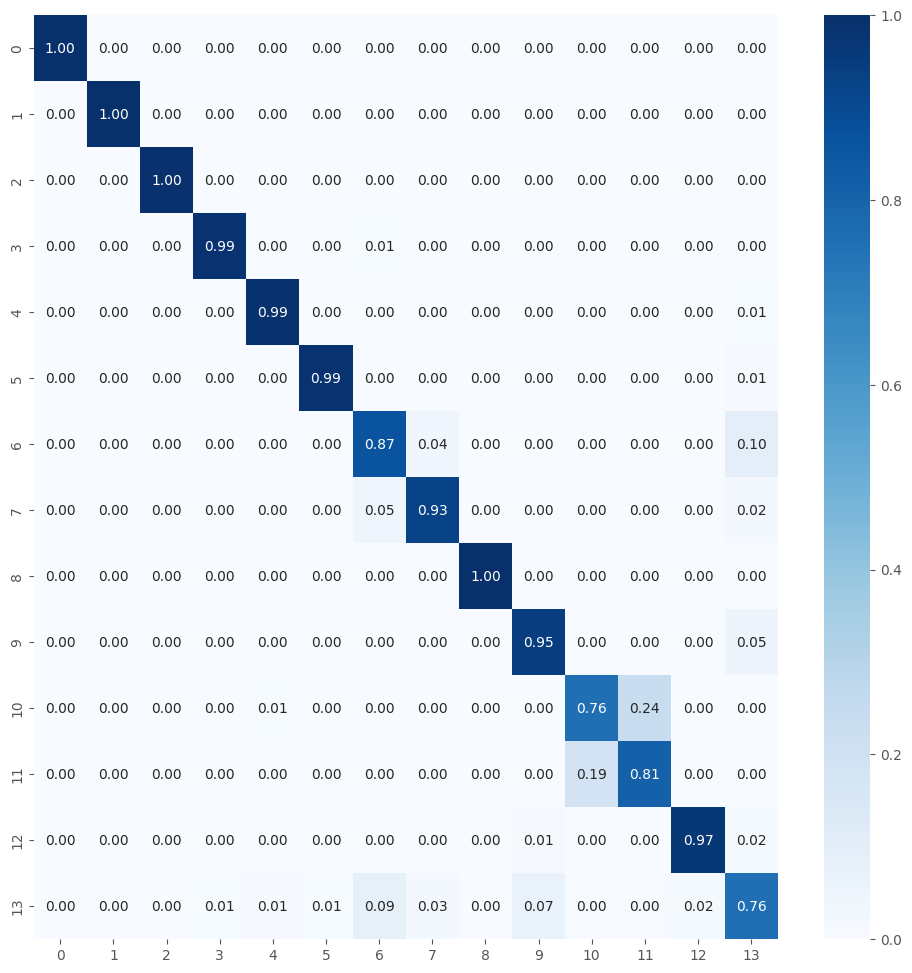

Average training accuracy in 5-fold: 0.957253897190094
Average validation precision in 5-fold: 0.9209821462631226

Test Metrics
test_acc_list: [0.9231746196746826, 0.868571400642395, 0.9212698340415955, 0.9231746196746826, 0.9279364943504333]
Average Test Accuracy with 5-fold: 0.9128253936767579
test_loss_list: [0.3052438199520111, 0.5865771174430847, 0.3439925014972687, 0.39053502678871155, 0.2969946265220642]
Average Test Log Loss with 5-fold: 0.38466861844062805
Precision List: [0.9245265359794752, 0.9030633667272058, 0.9234456112842123, 0.9226945402733808, 0.9277733610351007]
Average Precision List with 5-fold: 0.9203006830598749
Recall List: [0.9231746031746032, 0.8685714285714285, 0.9212698412698411, 0.9231746031746032, 0.9279365079365081]
Average Recall List with 5-fold: 0.9128253968253969
F1 Score List: [0.9218723094911238, 0.8673831176347564, 0.9195807341844252, 0.9219904189659868, 0.9277402759673222]
Average F1 Score List with 5-fold: 0.9117133712487229

Metrics List Store

t

In [44]:
%%time

num_classes = 14
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-07 20:21:32,372] A new study created in memory with name: no-name-5196d45a-b70a-415b-93cd-c8f5c516c01c


Familias de malware copiadas
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 3509711
Trainable params: 1344271
Non-trainable params: 2165440


[I 2025-06-07 20:43:36,993] Trial 0 finished with values: [0.918870210647583, 0.9361527562141418] and parameters: {'learning_rate': 3.8719641498308365e-05, 'dropout_rate1': 0.3451217378763345, 'dropout_rate2': 0.2151972206294604, 'l2_reg': 0.002111673634866403, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 31, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 12, 'reduce_lr_patience': 14}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 4548815
Trainable params: 2912783
Non-trainable params: 1636032


[I 2025-06-07 20:59:25,927] Trial 1 finished with values: [0.8671875, 0.6165814995765686] and parameters: {'learning_rate': 0.0075421608399982515, 'dropout_rate1': 0.4899419366694503, 'dropout_rate2': 0.47334927032715435, 'l2_reg': 7.964691985826332e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 32, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 11, 'reduce_lr_patience': 14}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 4415695
Trainable params: 2248719
Non-trainable params: 2166976


[I 2025-06-07 21:26:30,496] Trial 2 finished with values: [0.9200721383094788, 0.5061997175216675] and parameters: {'learning_rate': 7.023651313272144e-05, 'dropout_rate1': 0.5657853074998063, 'dropout_rate2': 0.34170551760996926, 'l2_reg': 0.000281315209132254, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 64, 'epochs': 35, 'num_dense_layers': 2, 'unfreeze_layers': 8, 'early_stopping_patience': 11, 'reduce_lr_patience': 9}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 3527119
Trainable params: 1891599
Non-trainable params: 1635520


[I 2025-06-07 22:26:24,061] Trial 3 finished with values: [0.9252976179122925, 0.29537731409072876] and parameters: {'learning_rate': 0.001196330308567699, 'dropout_rate1': 0.5415314521848034, 'dropout_rate2': 0.26234668398393557, 'l2_reg': 2.576042132872239e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 15, 'reduce_lr_patience': 10}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 3789519
Trainable params: 2154511
Non-trainable params: 1635008


[I 2025-06-07 22:27:56,482] Trial 4 finished with values: [0.7863703966140747, 4.92937707901001] and parameters: {'learning_rate': 1.0971601402109687e-05, 'dropout_rate1': 0.20010799236044163, 'dropout_rate2': 0.15075957379074323, 'l2_reg': 0.005378192373979939, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 16, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 19, 'reduce_lr_patience': 13}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 3561935
Trainable params: 1926415
Non-trainable params: 1635520


2025-06-07 22:29:12.956076: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-07 22:29:12.956150: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182


[I 2025-06-07 22:29:28,340] Trial 5 finished with values: [0.7039999961853027, 0.8676851987838745] and parameters: {'learning_rate': 0.00030419828476176635, 'dropout_rate1': 0.30983899172088375, 'dropout_rate2': 0.49091620413876225, 'l2_reg': 0.000160148806719977, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 39, 'num_dense_layers': 2, 'unfreeze_layers': 12, 'early_stopping_patience': 16, 'reduce_lr_patience': 10}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 4349135
Trainable params: 2706447
Non-trainable params: 1642688


[I 2025-06-07 23:01:30,125] Trial 6 finished with values: [0.9158653616905212, 0.2595595717430115] and parameters: {'learning_rate': 0.0025485700890511263, 'dropout_rate1': 0.30879719662948363, 'dropout_rate2': 0.47019462784003474, 'l2_reg': 2.8902364086587046e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 8}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 3823311
Trainable params: 2181647
Non-trainable params: 1641664


[I 2025-06-07 23:03:03,340] Trial 7 finished with values: [0.2405925989151001, 3.8968610763549805] and parameters: {'learning_rate': 0.0014087202910430395, 'dropout_rate1': 0.3778090605964798, 'dropout_rate2': 0.16700879449600642, 'l2_reg': 0.00012835057269808267, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 16, 'epochs': 27, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 10, 'reduce_lr_patience': 15}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 4579791
Trainable params: 2410767
Non-trainable params: 2169024


[I 2025-06-07 23:36:03,916] Trial 8 finished with values: [0.9284855723381042, 0.3579064607620239] and parameters: {'learning_rate': 0.00024279088772312819, 'dropout_rate1': 0.3177445734970944, 'dropout_rate2': 0.1783864922794366, 'l2_reg': 0.00017330207565855986, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 12, 'reduce_lr_patience': 10, 'units_dense3': 128, 'dropout_rate3': 0.11026128300450708}.


Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Total params: 4349135
Trainable params: 2712079
Non-trainable params: 1637056


[I 2025-06-08 00:08:27,385] Trial 9 finished with values: [0.9260817170143127, 0.33895424008369446] and parameters: {'learning_rate': 0.00015325938082991105, 'dropout_rate1': 0.21888155268228493, 'dropout_rate2': 0.17049170852836992, 'l2_reg': 0.0004805007396451582, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 44, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 10, 'reduce_lr_patience': 9}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_

Mejores trials para cada objetivo:
  Trial 3:
    val_accuracy: 0.9253
    val_loss: 0.2954
    Parámetros: {'learning_rate': 0.001196330308567699, 'dropout_rate1': 0.5415314521848034, 'dropout_rate2': 0.26234668398393557, 'l2_reg': 2.576042132872239e-05, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 32, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 15, 'reduce_lr_patience': 10}
  Trial 6:
    val_accuracy: 0.9159
    val_loss: 0.2596
    Parámetros: {'learning_rate': 0.0025485700890511263, 'dropout_rate1': 0.30879719662948363, 'dropout_rate2': 0.47019462784003474, 'l2_reg': 2.8902364086587046e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 42, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 18, 'reduce_lr_patience': 8}
  Trial 8:
    val_accuracy: 0.9285
    val_loss: 0.3579
    Parámetros: {'learning_rate': 0.00024279088772312819, 'dropout_rate1': 0.3177445734970944, 'dropout_rate2'

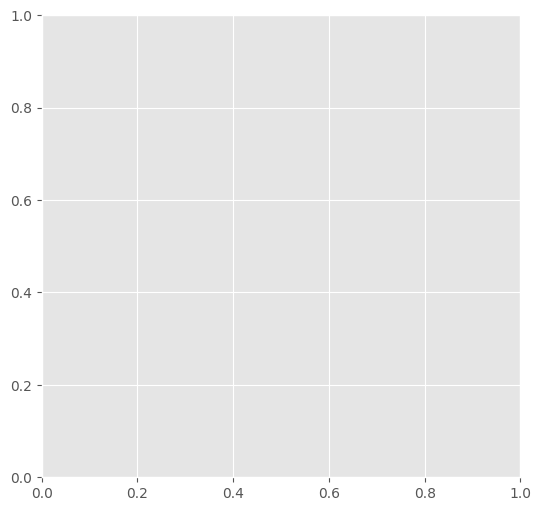

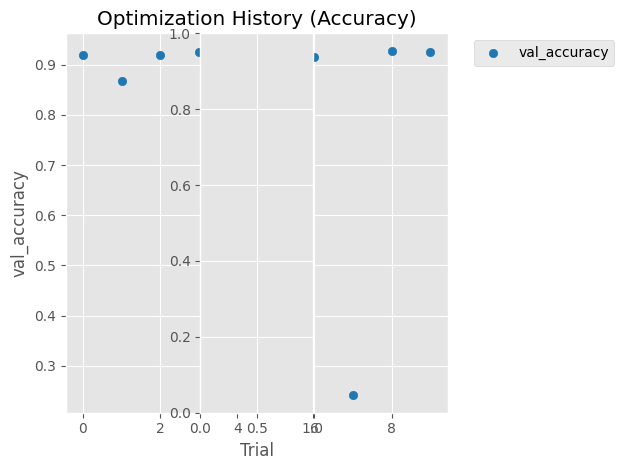

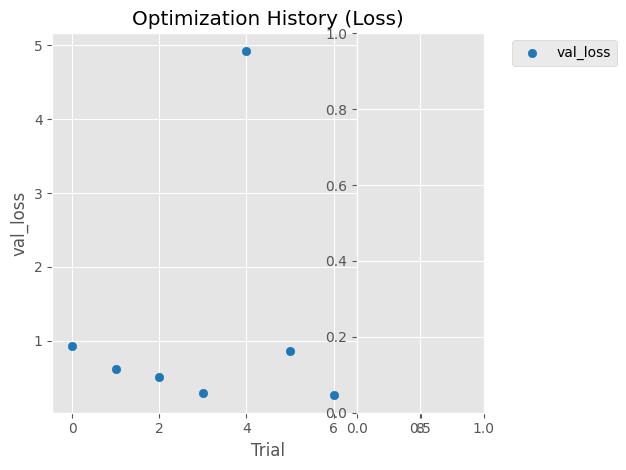

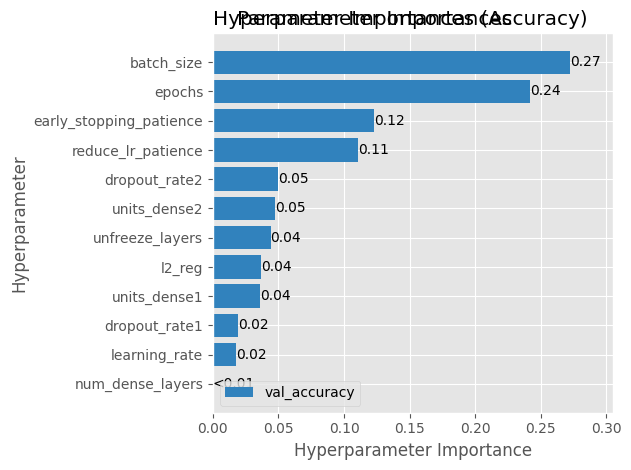

source2: /notebooks/train3/all_malware/15
name_save_model: fusion_MobileNet_tf_optunav215
Found 15750 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Found 3375 images belonging to 15 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp
- Allaple.L
- wacatac
- dinwod
- Lollipop
- berbew
- small
- upatre

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3527119
Trainable params: 1891599
Non-trainable params: 1635520
Epoch 1/42
492/492 [==============================] - 98s 174ms/step - loss: 0.6704 - accuracy: 0.7687 - val_loss: 1.5077 - val_accuracy: 0.5551 - lr: 0.0012
Epoch 2/42
492/492 [==============================] - 79s 160ms/step - loss: 0.4153 - accuracy: 0.8377 - val_loss: 1.0871 - val_accuracy: 0.6104 - lr: 0.0012
Epoch 3/42
492/492 [==============================] - 79s 160ms/step - loss: 0.3498 - accuracy: 0.8592 - val_loss: 3.4299 - val_accuracy: 0.2295 - lr: 0.001

Model and History saved...
493/493 [==============================] - 66s 131ms/step - loss: 0.5274 - accuracy: 0.8744
Train Accuracy: 0.8744127154350281
Train Log Loss: 0.527359664440155
106/106 [==============================] - 15s 141ms/step - loss: 0.7564 - accuracy: 0.8409
Validation Accuracy: 0.8408889174461365
Validation Log Loss: 0.7563533782958984
106/106 [==============================] - 18s 167ms/step - loss: 0.8040 - accuracy: 0.8415
Test Accuracy: 0.8414815068244934
Test Log Loss: 0.8039888739585876
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   0   0   1]
 [  0   0   1 222   2   0   0   0   0   0  

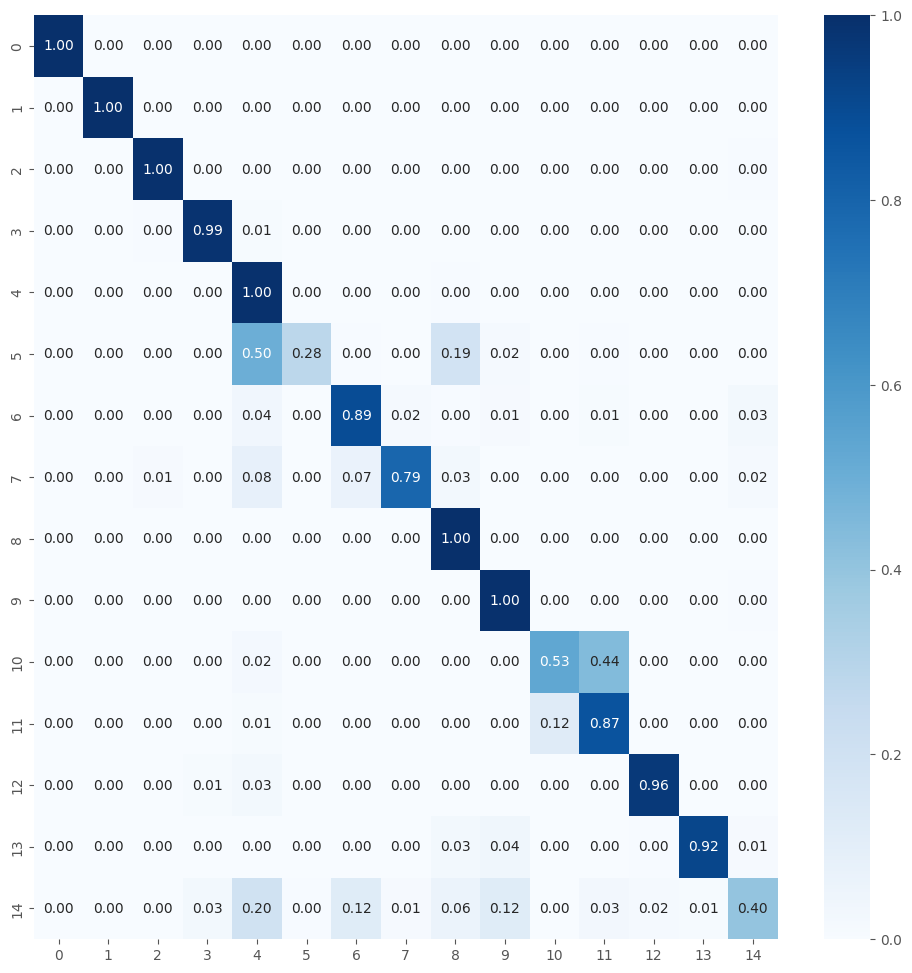


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3527119
Trainable params: 1891599
Non-trainable params: 1635520
Epoch 1/42
492/492 [==============================] - 94s 167ms/step - loss: 0.6697 - accuracy: 0.7703 - val_loss: 1.2217 - val_accuracy: 0.5899 - lr: 0.0012
Epoch 2/42
492/492 [==============================] - 86s 175ms/step - loss: 0.4106 - accuracy: 0.8381 - val_loss: 1.4079 - val_accuracy: 0.5226 - lr: 0.0012
Epoch 3/42
492/492 [==============================] - 79s 160ms/step - loss: 0.3498 - accuracy: 0.8593 - val_loss: 1.4256 - val_accuracy: 0.6274 - lr: 0.0012
Epoch 4/42
492/492 [==============================] - 88s 177ms/step - loss: 0.3087 - accuracy: 0.8740 - val_loss: 1.2346 - val_accuracy: 0.5509 - lr: 0.0012
Epoch 5/42
492/492 [==============================] - 86s 175ms/step - loss: 0.2873 - accuracy: 0.8802 - val_loss: 2.7702 - val_accuracy: 0.2976 - lr: 0.0012
Epoch 6/42
492/492 [==============================] - 76s 154ms/step - loss: 0.2701 - accuracy

Model and History saved...
493/493 [==============================] - 64s 130ms/step - loss: 0.0812 - accuracy: 0.9695
Train Accuracy: 0.9694603085517883
Train Log Loss: 0.0812254473567009
106/106 [==============================] - 14s 127ms/step - loss: 0.3929 - accuracy: 0.9209
Validation Accuracy: 0.9208889007568359
Validation Log Loss: 0.39291900396347046
106/106 [==============================] - 14s 134ms/step - loss: 0.3665 - accuracy: 0.9274
Test Accuracy: 0.9274073839187622
Test Log Loss: 0.36645105481147766
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   1   0   0   0   0   

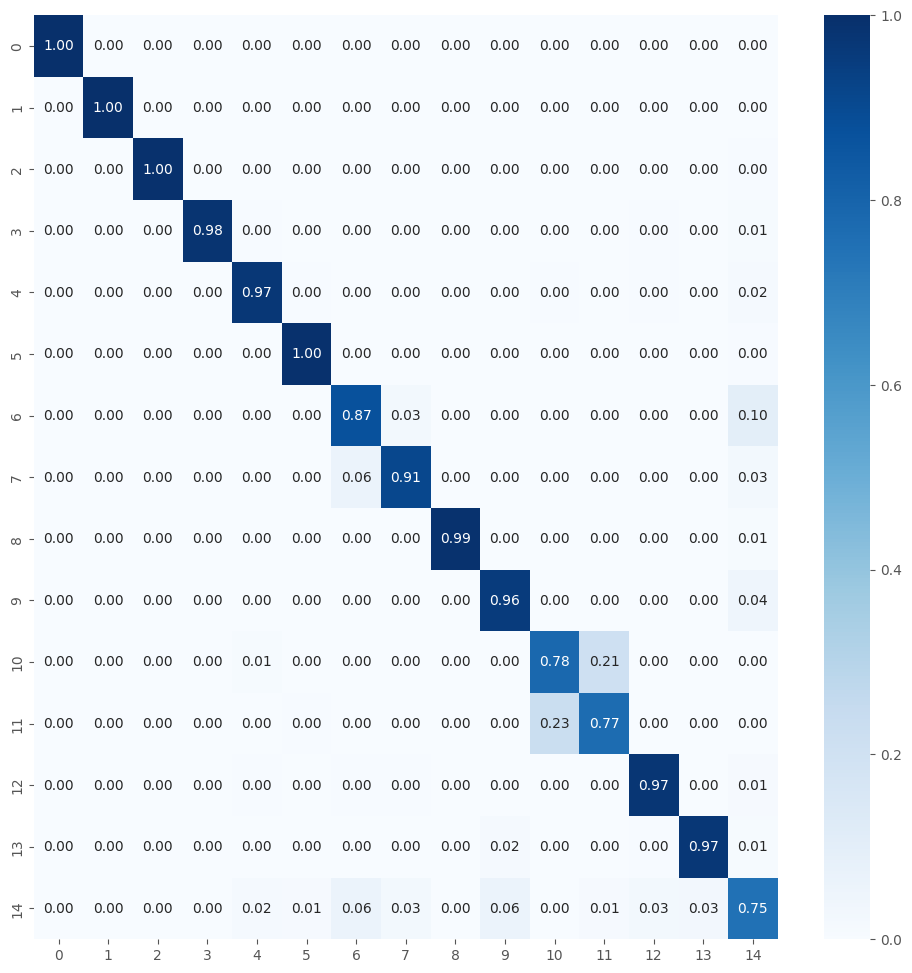


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3527119
Trainable params: 1891599
Non-trainable params: 1635520
Epoch 1/42
492/492 [==============================] - 104s 186ms/step - loss: 0.6786 - accuracy: 0.7719 - val_loss: 3.2748 - val_accuracy: 0.2557 - lr: 0.0012
Epoch 2/42
492/492 [==============================] - 85s 171ms/step - loss: 0.4018 - accuracy: 0.8437 - val_loss: 1.5295 - val_accuracy: 0.5524 - lr: 0.0012
Epoch 3/42
492/492 [==============================] - 78s 157ms/step - loss: 0.3426 - accuracy: 0.8668 - val_loss: 7.4742 - val_accuracy: 0.0717 - lr: 0.0012
Epoch 4/42
492/492 [==============================] - 78s 158ms/step - loss: 0.3071 - accuracy: 0.8745 - val_loss: 2.6605 - val_accuracy: 0.3851 - lr: 0.0012
Epoch 5/42
492/492 [==============================] - 77s 156ms/step - loss: 0.2977 - accuracy: 0.8777 - val_loss: 1.0028 - val_accuracy: 0.6280 - lr: 0.0012
Epoch 6/42
492/492 [==============================] - 83s 166ms/step - loss: 0.2696 - accurac

Model and History saved...
493/493 [==============================] - 63s 127ms/step - loss: 0.0807 - accuracy: 0.9659
Train Accuracy: 0.9659047722816467
Train Log Loss: 0.08072671294212341
106/106 [==============================] - 16s 136ms/step - loss: 0.3624 - accuracy: 0.9167
Validation Accuracy: 0.9167407155036926
Validation Log Loss: 0.36240851879119873
106/106 [==============================] - 16s 139ms/step - loss: 0.3202 - accuracy: 0.9247
Test Accuracy: 0.924740731716156
Test Log Loss: 0.3202471435070038
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   1   0   0   0   0   0

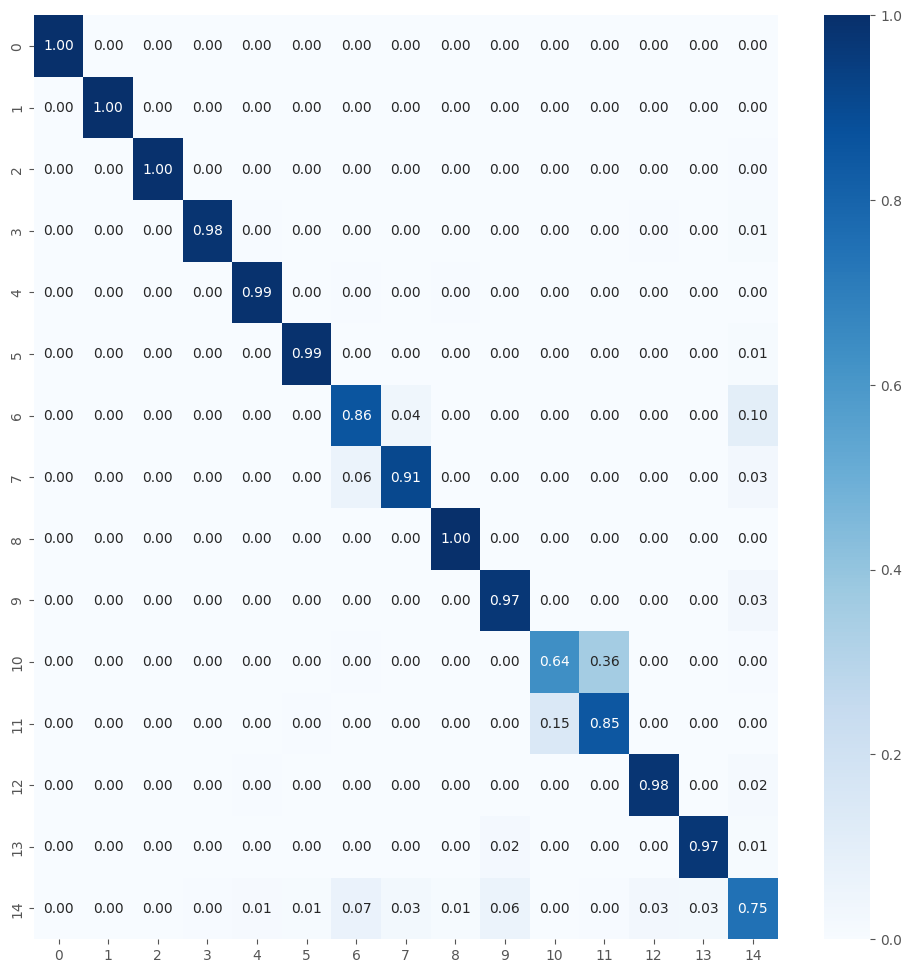


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3527119
Trainable params: 1891599
Non-trainable params: 1635520
Epoch 1/42
492/492 [==============================] - 93s 165ms/step - loss: 0.6627 - accuracy: 0.7737 - val_loss: 1.1586 - val_accuracy: 0.6131 - lr: 0.0012
Epoch 2/42
492/492 [==============================] - 82s 167ms/step - loss: 0.4005 - accuracy: 0.8474 - val_loss: 1.7418 - val_accuracy: 0.4515 - lr: 0.0012
Epoch 3/42
492/492 [==============================] - 85s 172ms/step - loss: 0.3495 - accuracy: 0.8583 - val_loss: 1.2014 - val_accuracy: 0.6351 - lr: 0.0012
Epoch 4/42
492/492 [==============================] - 86s 175ms/step - loss: 0.3183 - accuracy: 0.8715 - val_loss: 1.8698 - val_accuracy: 0.4229 - lr: 0.0012
Epoch 5/42
492/492 [==============================] - 84s 171ms/step - loss: 0.2894 - accuracy: 0.8824 - val_loss: 0.8988 - val_accuracy: 0.6938 - lr: 0.0012
Epoch 6/42
492/492 [==============================] - 82s 167ms/step - loss: 0.2706 - accuracy

Model and History saved...
493/493 [==============================] - 63s 128ms/step - loss: 0.1904 - accuracy: 0.9353
Train Accuracy: 0.9353016018867493
Train Log Loss: 0.19040563702583313
106/106 [==============================] - 15s 133ms/step - loss: 0.4527 - accuracy: 0.8889
Validation Accuracy: 0.8888888955116272
Validation Log Loss: 0.4526997208595276
106/106 [==============================] - 15s 133ms/step - loss: 0.4170 - accuracy: 0.8981
Test Accuracy: 0.8980740904808044
Test Log Loss: 0.41699206829071045
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   0   0   0   0   0   0   1]
 [  0   0   0 221   0   0   1   0   0   

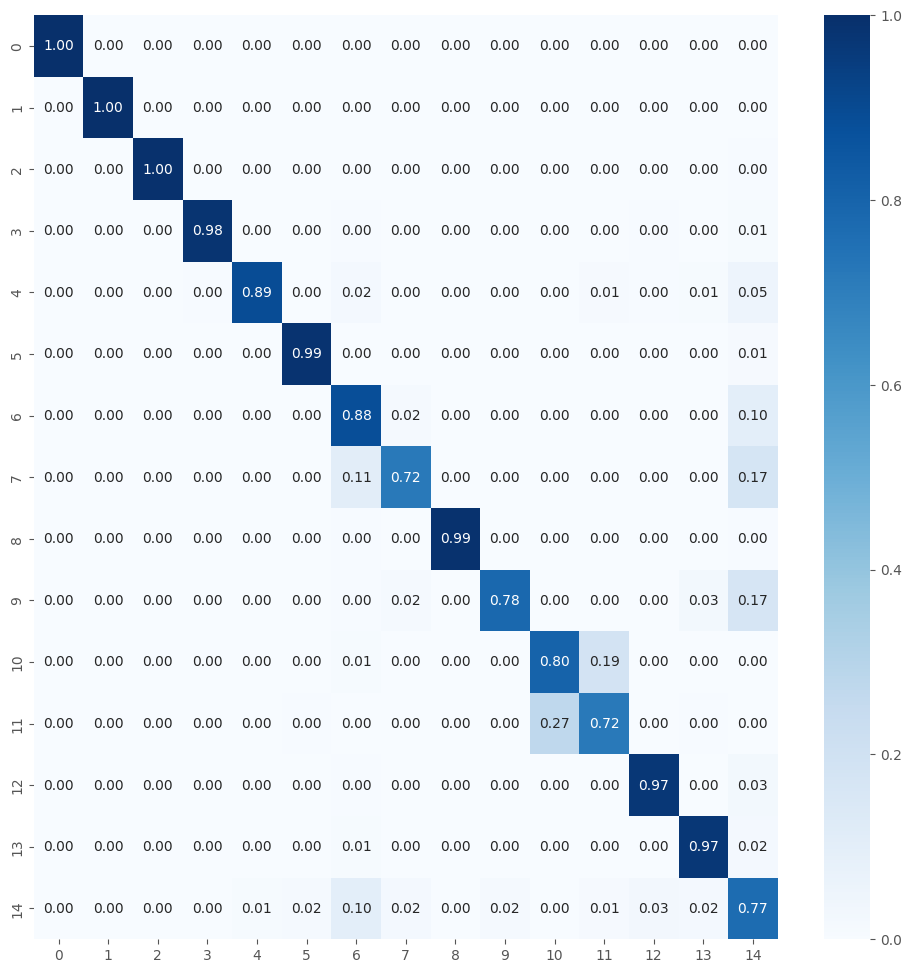


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3527119
Trainable params: 1891599
Non-trainable params: 1635520
Epoch 1/42
492/492 [==============================] - 94s 168ms/step - loss: 0.6602 - accuracy: 0.7722 - val_loss: 1.8486 - val_accuracy: 0.3723 - lr: 0.0012
Epoch 2/42
492/492 [==============================] - 71s 143ms/step - loss: 0.4019 - accuracy: 0.8443 - val_loss: 1.7160 - val_accuracy: 0.5673 - lr: 0.0012
Epoch 3/42
492/492 [==============================] - 78s 158ms/step - loss: 0.3409 - accuracy: 0.8626 - val_loss: 2.3101 - val_accuracy: 0.4205 - lr: 0.0012
Epoch 4/42
492/492 [==============================] - 81s 165ms/step - loss: 0.3208 - accuracy: 0.8685 - val_loss: 1.1021 - val_accuracy: 0.6929 - lr: 0.0012
Epoch 5/42
492/492 [==============================] - 89s 180ms/step - loss: 0.2901 - accuracy: 0.8835 - val_loss: 0.7587 - val_accuracy: 0.6833 - lr: 0.0012
Epoch 6/42
492/492 [==============================] - 78s 157ms/step - loss: 0.2620 - accuracy

Model and History saved...
493/493 [==============================] - 66s 133ms/step - loss: 0.0792 - accuracy: 0.9687
Train Accuracy: 0.9686984419822693
Train Log Loss: 0.079159677028656
106/106 [==============================] - 14s 128ms/step - loss: 0.3404 - accuracy: 0.9230
Validation Accuracy: 0.9229629635810852
Validation Log Loss: 0.3403646647930145
106/106 [==============================] - 16s 135ms/step - loss: 0.3443 - accuracy: 0.9277
Test Accuracy: 0.9277036786079407
Test Log Loss: 0.3442721962928772
Test labels: {'Allaple.A': 0, 'Allaple.L': 1, 'Kelihos_ver3': 2, 'Lollipop': 3, 'Ramnit': 4, 'berbew': 5, 'dinwod': 6, 'ganelp': 7, 'mira': 8, 'sfone': 9, 'sillyp2p': 10, 'small': 11, 'upatre': 12, 'wabot': 13, 'wacatac': 14}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0 225   0   0   0   0   0   0   0   0   0   0   0   0   0]
 [  0   0 224   0   0   0   0   0   1   0   0   0   0   0   0]
 [  0   0   0 221   1   0   0   0   0   1  

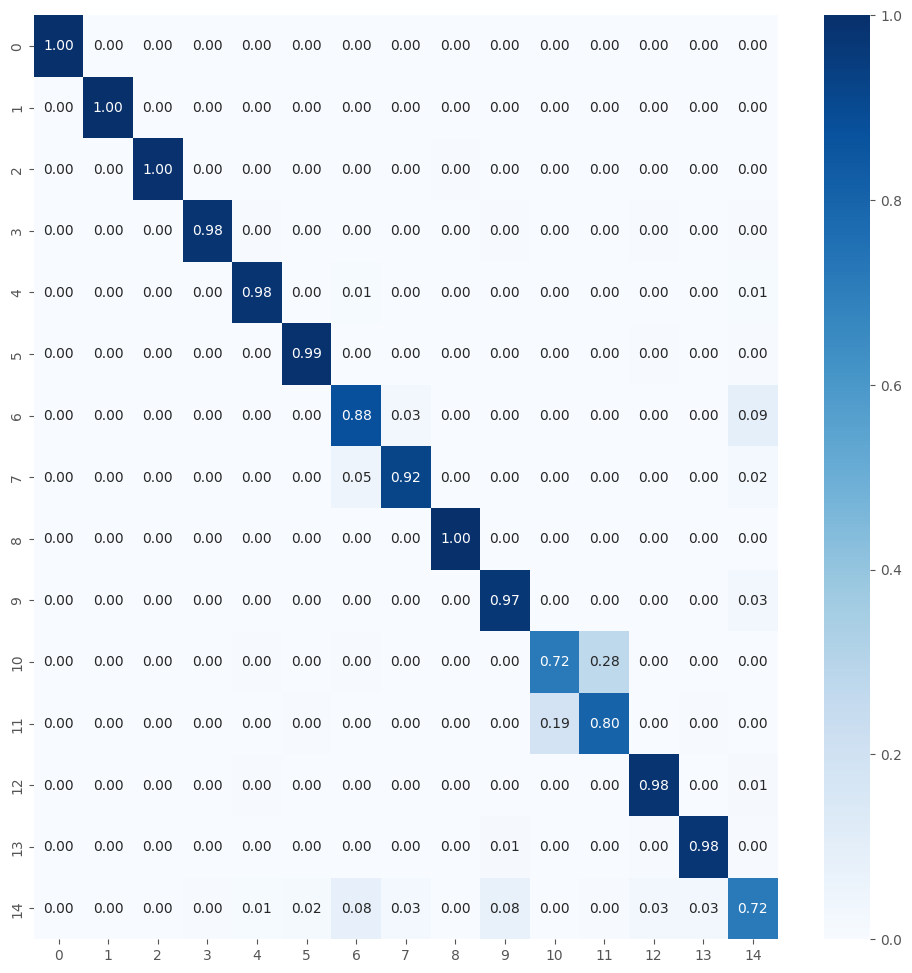

Average training accuracy in 5-fold: 0.9588624596595764
Average validation precision in 5-fold: 0.9147023677825927

Test Metrics
test_acc_list: [0.8414815068244934, 0.9274073839187622, 0.924740731716156, 0.8980740904808044, 0.9277036786079407]
Average Test Accuracy with 5-fold: 0.9038814783096314
test_loss_list: [0.8039888739585876, 0.36645105481147766, 0.3202471435070038, 0.41699206829071045, 0.3442721962928772]
Average Test Log Loss with 5-fold: 0.45039026737213134
Precision List: [0.8748849151031497, 0.9273919408559961, 0.9258069768580697, 0.9087096315429782, 0.9271133253553061]
Average Precision List with 5-fold: 0.9127813579430999
Recall List: [0.8414814814814815, 0.9274074074074073, 0.9247407407407408, 0.8977777777777778, 0.9277037037037038]
Average Recall List with 5-fold: 0.9038222222222222
F1 Score List: [0.8296982943432273, 0.9273443880423906, 0.924007633138934, 0.9001342021856559, 0.9269518558983081]
Average F1 Score List with 5-fold: 0.9016272747217032

Metrics List Store



In [45]:
%%time

num_classes = 15
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, 
    precision_list_all, recall_list_all, f1_score_list_all)

In [46]:
print(f"test_acc_list_all = {test_acc_list_all}")
print(f"test_loss_list_all = {test_loss_list_all}")
print(f"precision_list_all = {precision_list_all}")
print(f"recall_list_all = {recall_list_all}")
print(f"f1_score_list_all = {f1_score_list_all}")

test_acc_list_all = [0.9986666679382324, 0.9997037053108215, 0.9995555520057678, 1.0, 0.9975555419921875, 0.9932444453239441, 0.9924444437026978, 0.9930158853530884, 0.9652222275733948, 0.99288889169693, 0.9656000018119812, 0.9510303139686584, 0.9533333301544189, 0.9519999980926513, 0.9128253936767579, 0.9038814783096314]
test_loss_list_all = [1.019002091884613, 0.5523107767105102, 0.36616288125514984, 2.109271466732025, 0.26639568582177164, 0.05584298893809318, 0.10026702284812927, 0.2997454941272736, 0.18925344124436377, 0.08012475967407226, 0.2840696156024933, 0.3010313153266907, 0.18727438449859618, 0.1504259943962097, 0.38466861844062805, 0.45039026737213134]
precision_list_all = [0.9986686156763589, 0.9997050147492625, 0.9995575221238937, 1.0, 0.9975721933007347, 0.9933000841200172, 0.9925045134013925, 0.9930853633362023, 0.9800167522710499, 0.9929365960407279, 0.9656328476720379, 0.9503973051069117, 0.952715974146525, 0.9513257967060442, 0.9203006830598749, 0.9127813579430999]
r

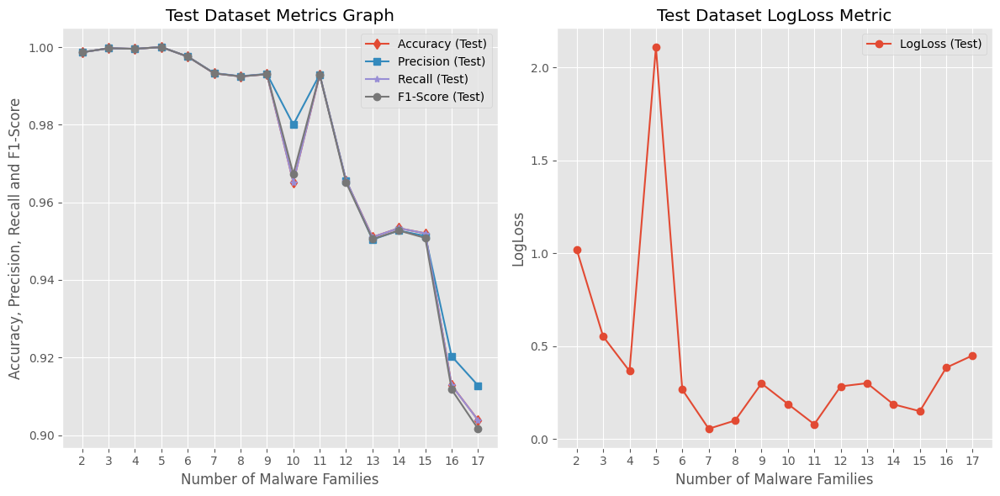

In [47]:
import matplotlib.pyplot as plt

# Datos históricos
strategies = [str(i) for i in range(2, len(test_acc_list_all) + 2)]

# Crear gráfico para Test Accuracy y Test LogLoss en una fila con dos columnas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


# Gráfico para Test Accuracy, Precision, Recall and F1-Score
axes[0].plot(strategies, test_acc_list_all, marker='d', label='Accuracy (Test)')
axes[0].plot(strategies, precision_list_all, marker='s', label='Precision (Test)')
axes[0].plot(strategies, recall_list_all, marker='*', label='Recall (Test)')
axes[0].plot(strategies, f1_score_list_all, marker='o', label='F1-Score (Test)')
axes[0].set_title('Test Dataset Metrics Graph')
axes[0].set_xlabel('Number of Malware Families')
axes[0].set_ylabel('Accuracy, Precision, Recall and F1-Score')
axes[0].legend()
axes[0].grid(True)

# Gráfico para Test LogLoss
axes[1].plot(strategies, test_loss_list_all, marker='o', label='LogLoss (Test)')
axes[1].set_title('Test Dataset LogLoss Metric')
axes[1].set_xlabel('Number of Malware Families')
axes[1].set_ylabel('LogLoss')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()


[I 2025-06-08 05:33:21,066] A new study created in memory with name: no-name-5de811af-4e63-446f-bb2f-41f4dd2aed1b


Familias de malware copiadas
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3889096
Trainable params: 2248456
Non-trainable params: 1640640


2025-06-08 05:34:12.220674: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-08 05:34:12.220741: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 7702031697237098182


2025-06-08 05:34:21.896572: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 4868888155308689690
2025-06-08 05:34:21.896664: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 6223181869973454430
[I 2025-06-08 05:34:22,247] Trial 0 finished with values: [0.2938888967037201, 5.363170146942139] and parameters: {'learning_rate': 0.0029096712810706697, 'dropout_rate1': 0.4940866827358728, 'dropout_rate2': 0.21711821839004652, 'l2_reg': 0.00010002858049069922, 'units_dense1': 512, 'units_dense2': 256, 'batch_size': 16, 'epochs': 46, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 17, 'reduce_lr_patience': 9}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4547016
Trainable params: 2368776
Non-trainable params: 2178240


[I 2025-06-08 05:35:23,301] Trial 1 finished with values: [0.9483333230018616, 0.2331515997648239] and parameters: {'learning_rate': 0.00011040152628232167, 'dropout_rate1': 0.35750540245757234, 'dropout_rate2': 0.22678080878204632, 'l2_reg': 6.815983074323245e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 16, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 5, 'early_stopping_patience': 17, 'reduce_lr_patience': 9}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4431304
Trainable params: 2788616
Non-trainable params: 1642688


[I 2025-06-08 05:36:24,857] Trial 2 finished with values: [0.6738888621330261, 1.4223203659057617] and parameters: {'learning_rate': 0.0005035187367537867, 'dropout_rate1': 0.4167722665482869, 'dropout_rate2': 0.12710843774848116, 'l2_reg': 0.0003082623144992666, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 32, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 12, 'reduce_lr_patience': 11, 'units_dense3': 128, 'dropout_rate3': 0.23975024141258672}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3542728
Trainable params: 1901576
Non-trainable params: 1641152


[I 2025-06-08 05:37:47,066] Trial 3 finished with values: [0.25111111998558044, 7.814260482788086] and parameters: {'learning_rate': 0.007560149510961115, 'dropout_rate1': 0.28618260270448553, 'dropout_rate2': 0.4009622721236358, 'l2_reg': 0.008859439745348488, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 16, 'epochs': 25, 'num_dense_layers': 3, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 11, 'units_dense3': 128, 'dropout_rate3': 0.14605440039868686}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4348680
Trainable params: 2705992
Non-trainable params: 1642688


[I 2025-06-08 05:51:15,441] Trial 4 finished with values: [0.9977678656578064, 0.06066872924566269] and parameters: {'learning_rate': 0.00220385807208046, 'dropout_rate1': 0.4455183873028796, 'dropout_rate2': 0.25915455624948613, 'l2_reg': 0.0003976287073614687, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 11}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3825768
Trainable params: 2189736
Non-trainable params: 1636032


[I 2025-06-08 06:06:18,368] Trial 5 finished with values: [0.9944196343421936, 2.157301664352417] and parameters: {'learning_rate': 1.1982518724885963e-05, 'dropout_rate1': 0.3661021168638249, 'dropout_rate2': 0.1408001133389084, 'l2_reg': 0.0025236379454117446, 'units_dense1': 512, 'units_dense2': 128, 'batch_size': 64, 'epochs': 31, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 20, 'reduce_lr_patience': 8, 'units_dense3': 32, 'dropout_rate3': 0.22750270279823462}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3790888
Trainable params: 1622888
Non-trainable params: 2168000


[I 2025-06-08 06:22:07,308] Trial 6 finished with values: [0.9977678656578064, 0.13993169367313385] and parameters: {'learning_rate': 0.00023568719722780098, 'dropout_rate1': 0.43630590747669673, 'dropout_rate2': 0.10650992277660826, 'l2_reg': 0.001847857204148269, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 64, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 18, 'reduce_lr_patience': 11, 'units_dense3': 32, 'dropout_rate3': 0.18536804452047845}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3513416
Trainable params: 1877896
Non-trainable params: 1635520


2025-06-08 06:23:03.217113: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5317560074501004269
2025-06-08 06:23:03.217208: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 11700268694426258467
[I 2025-06-08 06:23:03,524] Trial 7 finished with values: [0.4744444489479065, 5.907735824584961] and parameters: {'learning_rate': 0.005754323912207144, 'dropout_rate1': 0.5167514155520551, 'dropout_rate2': 0.40278633876702497, 'l2_reg': 0.000287156011884295, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 16, 'epochs': 46, 'num_dense_layers': 3, 'unfreeze_layers': 14, 'early_stopping_patience': 18, 'reduce_lr_patience': 10, 'units_dense3': 64, 'dropout_rate3': 0.15721337872462995}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3509256
Trainable params: 1873736
Non-trainable params: 1635520


[I 2025-06-08 06:23:43,064] Trial 8 finished with values: [0.8594444394111633, 0.4342537820339203] and parameters: {'learning_rate': 0.00044394909902151073, 'dropout_rate1': 0.5679826189420163, 'dropout_rate2': 0.3262272031876575, 'l2_reg': 1.4018944900428074e-05, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 16, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 16, 'reduce_lr_patience': 12}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4547016
Trainable params: 2905352
Non-trainable params: 1641664


[I 2025-06-08 06:37:46,379] Trial 9 finished with values: [0.9910714030265808, 0.0694601982831955] and parameters: {'learning_rate': 0.001589946079933893, 'dropout_rate1': 0.2522733713826808, 'dropout_rate2': 0.3489819467940193, 'l2_reg': 1.694907829358022e-05, 'units_dense1': 1024, 'units_dense2': 256, 'batch_size': 64, 'epochs': 28, 'num_dense_layers': 2, 'unfreeze_layers': 11, 'early_stopping_patience': 16, 'reduce_lr_patience': 9}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 4:
    val_accuracy: 0.9978
    val_loss: 0.0607
    Parámetros: {'learning_rate': 0.00220385807208046, 'dropout_rate1': 0.4455183873028796, 'dropout_rate2': 0.25915455624948613, 'l2_reg': 0.0003976287073614687, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 64, 'epochs': 30, 'num_dense_layers': 2, 'unfreeze_layers': 9, 'early_stopping_patience': 17, 'reduce_lr_patience': 11}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


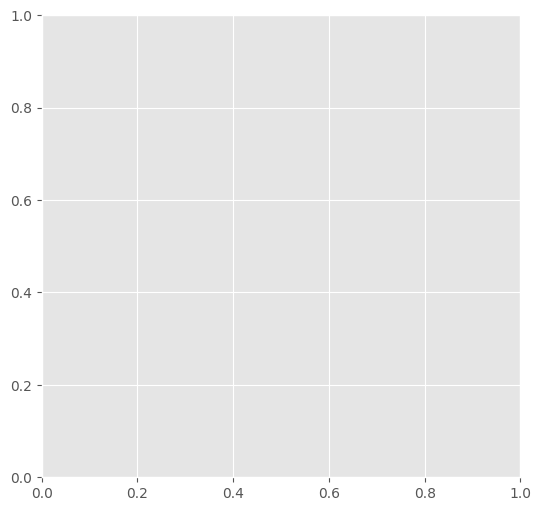

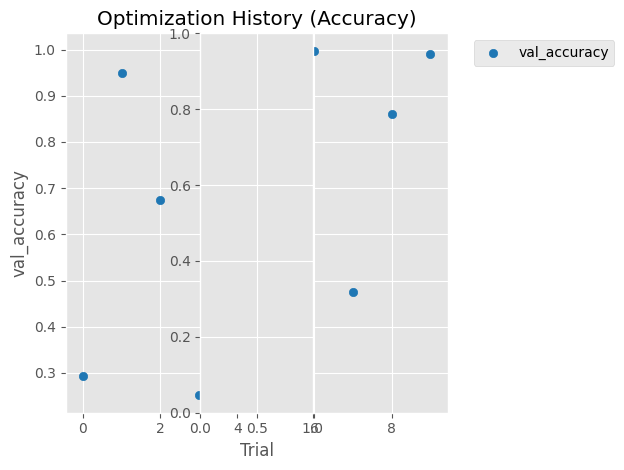

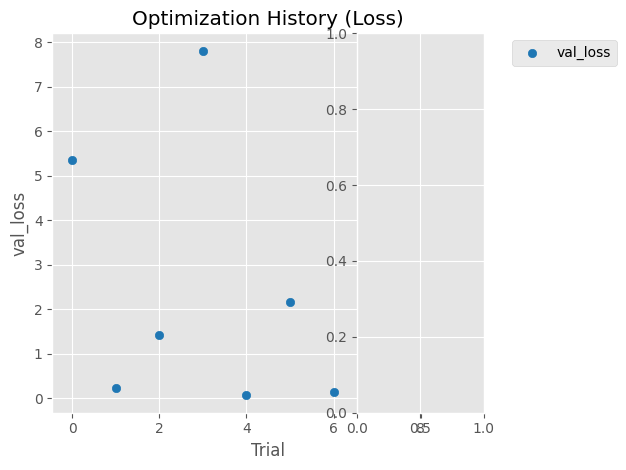

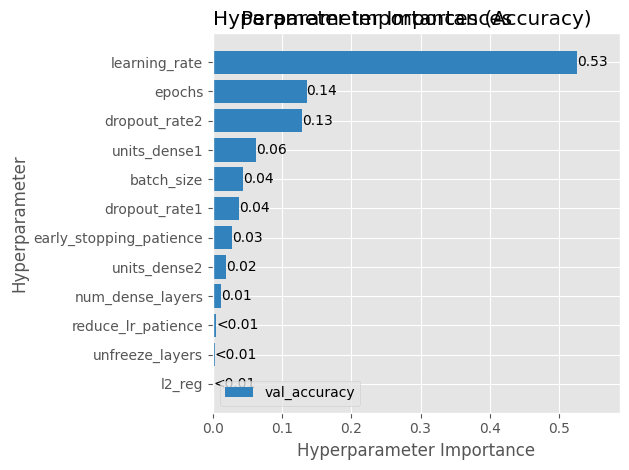

source2: /notebooks/train3/all_malware/8
name_save_model: fusion_MobileNet_tf_optunav28
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp

TRAINING AND EVALUATING FOLD 1/5...

Total params: 4348680
Trainable params: 2705992
Non-trainable params: 1642688
Epoch 1/30
131/131 [==============================] - 36s 185ms/step - loss: 0.7925 - accuracy: 0.9129 - val_loss: 12.5781 - val_accuracy: 0.2958 - lr: 0.0022
Epoch 2/30
131/131 [==============================] - 23s 170ms/step - loss: 0.5638 - accuracy: 0.9616 - val_loss: 3.0012 - val_accuracy: 0.6016 - lr: 0.0022
Epoch 3/30
131/131 [==============================] - 24s 178ms/step - loss: 0.4652 - accuracy: 0.9640 - val_loss: 1.6384 - val_accuracy: 0.6953 - lr: 0.0022
Epoch 4/30
131/131 [==============================] - 24s 179ms/step - 

Model and History saved...
263/263 [==============================] - 37s 135ms/step - loss: 1.4519 - accuracy: 0.7014
Train Accuracy: 0.7014285922050476
Train Log Loss: 1.4518587589263916
57/57 [==============================] - 8s 138ms/step - loss: 1.5312 - accuracy: 0.6850
Validation Accuracy: 0.6850000023841858
Validation Log Loss: 1.5311837196350098
57/57 [==============================] - 8s 134ms/step - loss: 1.5062 - accuracy: 0.6972
Test Accuracy: 0.6972222328186035
Test Log Loss: 1.5062497854232788
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[190   0   0   0   0  35   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   1 137   0  87   0   0]
 [  0   0   5   0 187  33   0   0]
 [  0   0   0   0   0 225   0   0]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0 156   0  68]]
True labels: 1800
Predicted labels: len(predicted_labels)

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


57/57 [==============================] - 9s 127ms/step


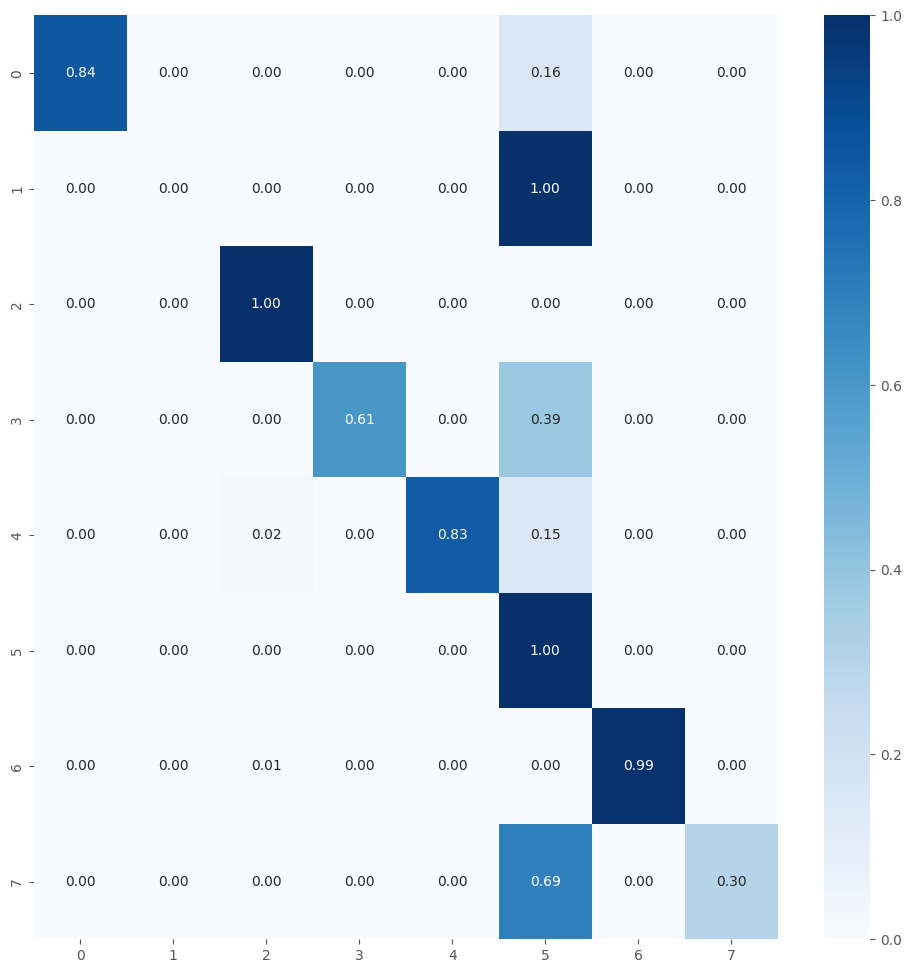

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



TRAINING AND EVALUATING FOLD 2/5...

Total params: 4348680
Trainable params: 2705992
Non-trainable params: 1642688
Epoch 1/30
131/131 [==============================] - 37s 199ms/step - loss: 0.8075 - accuracy: 0.9062 - val_loss: 4.4305 - val_accuracy: 0.4431 - lr: 0.0022
Epoch 2/30
131/131 [==============================] - 23s 174ms/step - loss: 0.5619 - accuracy: 0.9563 - val_loss: 7.2298 - val_accuracy: 0.3192 - lr: 0.0022
Epoch 3/30
131/131 [==============================] - 21s 160ms/step - loss: 0.4732 - accuracy: 0.9677 - val_loss: 1.4452 - val_accuracy: 0.7366 - lr: 0.0022
Epoch 4/30
131/131 [==============================] - 22s 164ms/step - loss: 0.3842 - accuracy: 0.9740 - val_loss: 2.4657 - val_accuracy: 0.5469 - lr: 0.0022
Epoch 5/30
131/131 [==============================] - 22s 169ms/step - loss: 0.3127 - accuracy: 0.9781 - val_loss: 2.2312 - val_accuracy: 0.6842 - lr: 0.0022
Epoch 6/30
131/131 [==============================] - 24s 177ms/step - loss: 0.2533 - accuracy

Model and History saved...
263/263 [==============================] - 33s 125ms/step - loss: 0.0435 - accuracy: 0.9992
Train Accuracy: 0.9991666674613953
Train Log Loss: 0.04354529827833176
57/57 [==============================] - 8s 129ms/step - loss: 0.0871 - accuracy: 0.9933
Validation Accuracy: 0.9933333396911621
Validation Log Loss: 0.08705862611532211
57/57 [==============================] - 9s 128ms/step - loss: 0.0735 - accuracy: 0.9939
Test Accuracy: 0.9938889145851135
Test Log Loss: 0.07353696972131729
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   5   0 219]]
True labels: 1800
Predicted labels: len(predicted_labe

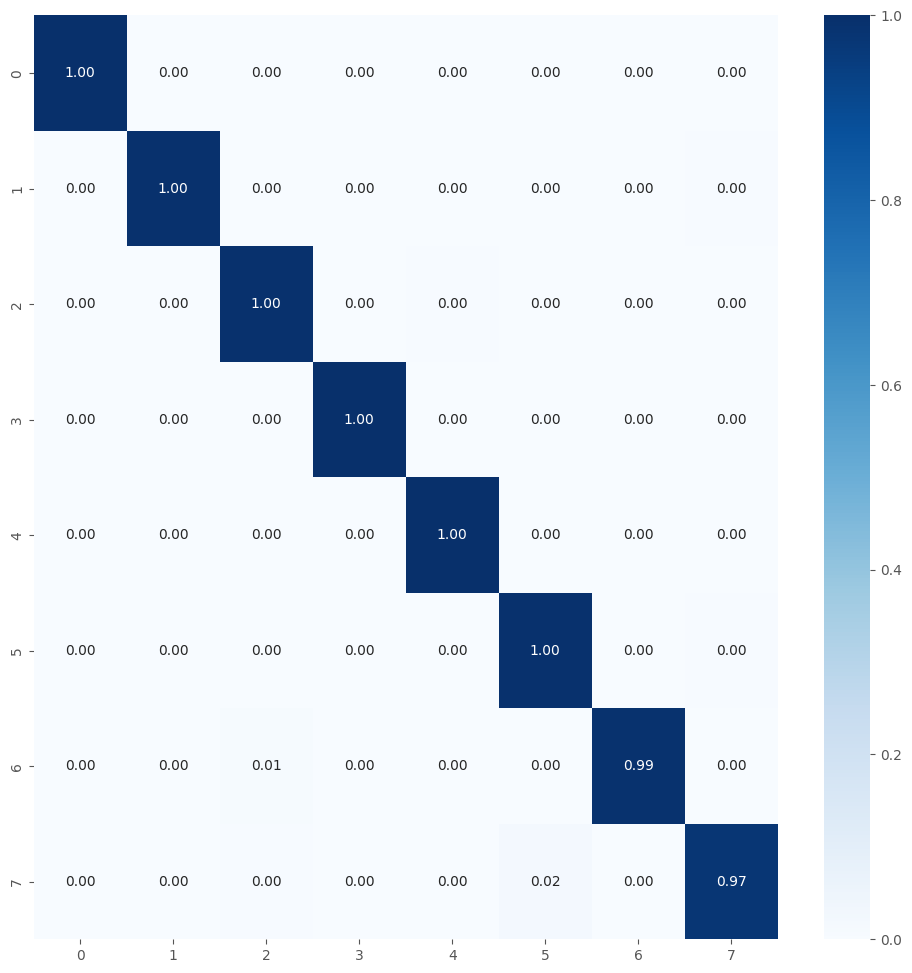


TRAINING AND EVALUATING FOLD 3/5...

Total params: 4348680
Trainable params: 2705992
Non-trainable params: 1642688
Epoch 1/30
131/131 [==============================] - 37s 197ms/step - loss: 0.8214 - accuracy: 0.9027 - val_loss: 15.3063 - val_accuracy: 0.2567 - lr: 0.0022
Epoch 2/30
131/131 [==============================] - 24s 183ms/step - loss: 0.5641 - accuracy: 0.9634 - val_loss: 2.9701 - val_accuracy: 0.5368 - lr: 0.0022
Epoch 3/30
131/131 [==============================] - 28s 211ms/step - loss: 0.4347 - accuracy: 0.9721 - val_loss: 5.0798 - val_accuracy: 0.4096 - lr: 0.0022
Epoch 4/30
131/131 [==============================] - 25s 190ms/step - loss: 0.3693 - accuracy: 0.9729 - val_loss: 9.1631 - val_accuracy: 0.1663 - lr: 0.0022
Epoch 5/30
131/131 [==============================] - 22s 168ms/step - loss: 0.3292 - accuracy: 0.9745 - val_loss: 7.1763 - val_accuracy: 0.3527 - lr: 0.0022
Epoch 6/30
131/131 [==============================] - 24s 176ms/step - loss: 0.2738 - accurac

Model and History saved...
263/263 [==============================] - 36s 135ms/step - loss: 0.1555 - accuracy: 0.9589
Train Accuracy: 0.9589285850524902
Train Log Loss: 0.15545602142810822
57/57 [==============================] - 8s 133ms/step - loss: 0.1909 - accuracy: 0.9511
Validation Accuracy: 0.9511111378669739
Validation Log Loss: 0.1908653974533081
57/57 [==============================] - 8s 137ms/step - loss: 0.1817 - accuracy: 0.9544
Test Accuracy: 0.9544444680213928
Test Log Loss: 0.18167437613010406
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 200   0   0  25]
 [  0   0   0   0   0 171   0  54]
 [  0   0   2   0   0   0 223   0]
 [  0   0   0   0   0   0   0 225]]
True labels: 1800
Predicted labels: len(predicted_label

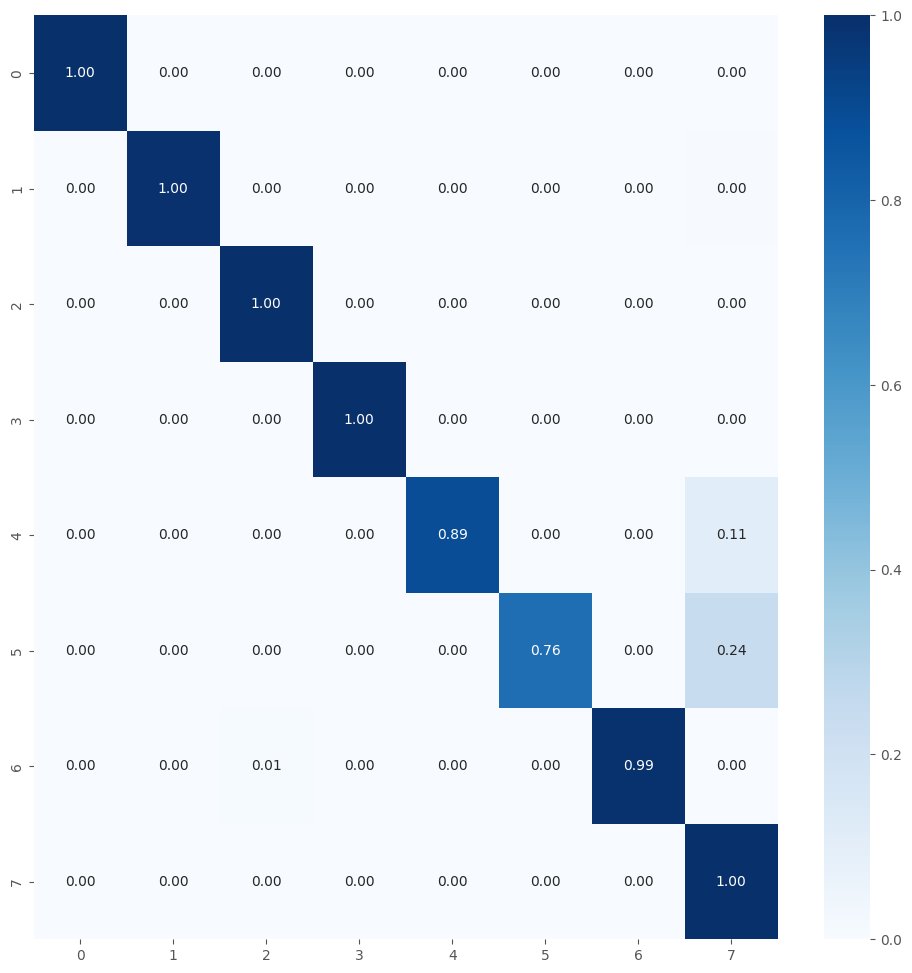


TRAINING AND EVALUATING FOLD 4/5...

Total params: 4348680
Trainable params: 2705992
Non-trainable params: 1642688
Epoch 1/30
131/131 [==============================] - 37s 189ms/step - loss: 0.8103 - accuracy: 0.8948 - val_loss: 7.7327 - val_accuracy: 0.4888 - lr: 0.0022
Epoch 2/30
131/131 [==============================] - 21s 162ms/step - loss: 0.5657 - accuracy: 0.9600 - val_loss: 3.0088 - val_accuracy: 0.5513 - lr: 0.0022
Epoch 3/30
131/131 [==============================] - 21s 163ms/step - loss: 0.4308 - accuracy: 0.9761 - val_loss: 4.0733 - val_accuracy: 0.5301 - lr: 0.0022
Epoch 4/30
131/131 [==============================] - 23s 172ms/step - loss: 0.3393 - accuracy: 0.9804 - val_loss: 3.0286 - val_accuracy: 0.5837 - lr: 0.0022
Epoch 5/30
131/131 [==============================] - 24s 179ms/step - loss: 0.3292 - accuracy: 0.9728 - val_loss: 6.1946 - val_accuracy: 0.4967 - lr: 0.0022
Epoch 6/30
131/131 [==============================] - 24s 174ms/step - loss: 0.2766 - accuracy

Model and History saved...
263/263 [==============================] - 35s 131ms/step - loss: 0.0767 - accuracy: 0.9974
Train Accuracy: 0.9973809719085693
Train Log Loss: 0.07674194127321243
57/57 [==============================] - 8s 132ms/step - loss: 0.1037 - accuracy: 0.9950
Validation Accuracy: 0.9950000047683716
Validation Log Loss: 0.10373097658157349
57/57 [==============================] - 8s 134ms/step - loss: 0.0909 - accuracy: 0.9950
Test Accuracy: 0.9950000047683716
Test Log Loss: 0.09093368798494339
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   1   0 224   0   0   0]
 [  0   0   0   0   0 221   0   4]
 [  0   0   2   0   0   0 223   0]
 [  0   0   0   0   0   1   0 224]]
True labels: 1800
Predicted labels: len(predicted_labe

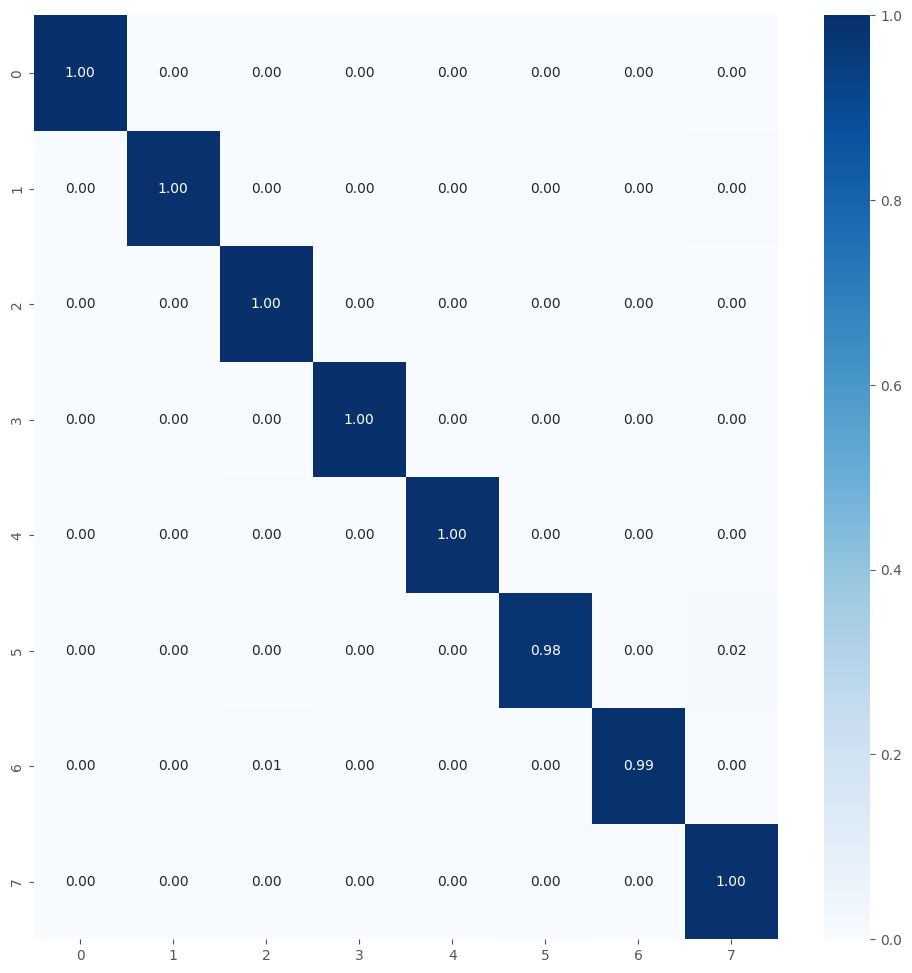


TRAINING AND EVALUATING FOLD 5/5...

Total params: 4348680
Trainable params: 2705992
Non-trainable params: 1642688
Epoch 1/30
131/131 [==============================] - 39s 200ms/step - loss: 0.7871 - accuracy: 0.9074 - val_loss: 5.0845 - val_accuracy: 0.4699 - lr: 0.0022
Epoch 2/30
131/131 [==============================] - 22s 165ms/step - loss: 0.5429 - accuracy: 0.9640 - val_loss: 2.9141 - val_accuracy: 0.6362 - lr: 0.0022
Epoch 3/30
131/131 [==============================] - 23s 171ms/step - loss: 0.4417 - accuracy: 0.9711 - val_loss: 2.2673 - val_accuracy: 0.5670 - lr: 0.0022
Epoch 4/30
131/131 [==============================] - 23s 172ms/step - loss: 0.3389 - accuracy: 0.9792 - val_loss: 4.7480 - val_accuracy: 0.3359 - lr: 0.0022
Epoch 5/30
131/131 [==============================] - 22s 170ms/step - loss: 0.3030 - accuracy: 0.9754 - val_loss: 2.4442 - val_accuracy: 0.3516 - lr: 0.0022
Epoch 6/30
131/131 [==============================] - 23s 173ms/step - loss: 0.2459 - accuracy

Model and History saved...
263/263 [==============================] - 37s 138ms/step - loss: 0.0359 - accuracy: 0.9994
Train Accuracy: 0.999404788017273
Train Log Loss: 0.035934511572122574
57/57 [==============================] - 8s 136ms/step - loss: 0.0688 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.06877969205379486
57/57 [==============================] - 8s 138ms/step - loss: 0.0591 - accuracy: 0.9961
Test Accuracy: 0.9961110949516296
Test Log Loss: 0.05912451446056366
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 224   0   0   1]
 [  0   0   0   0   0 223   0   2]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   0   0 224]]
True labels: 1800
Predicted labels: len(predicted_label

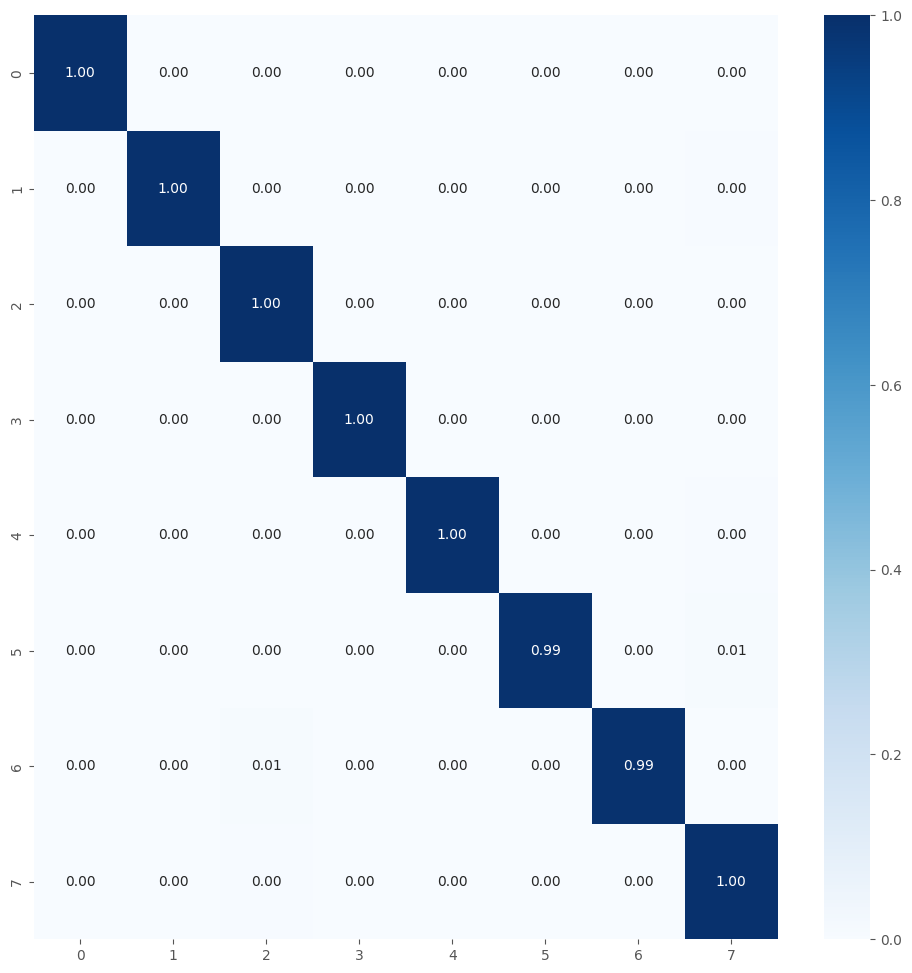

Average training accuracy in 5-fold: 0.9972768783569336
Average validation precision in 5-fold: 0.9883928418159484

Test Metrics
test_acc_list: [0.6972222328186035, 0.9938889145851135, 0.9544444680213928, 0.9950000047683716, 0.9961110949516296]
Average Test Accuracy with 5-fold: 0.9273333430290223
test_loss_list: [1.5062497854232788, 0.07353696972131729, 0.18167437613010406, 0.09093368798494339, 0.05912451446056366]
Average Test Log Loss with 5-fold: 0.38230386674404143
Precision List: [0.7821502577580107, 0.9939344409146342, 0.9661117931681953, 0.9950629424529103, 0.9961622807017544]
Average Precision List with 5-fold: 0.9466843429991011
Recall List: [0.6972222222222222, 0.9938888888888888, 0.9544444444444444, 0.9950000000000001, 0.9961111111111112]
Average Recall List with 5-fold: 0.9273333333333333
F1 Score List: [0.6846021080310565, 0.9938860764511731, 0.9553441502538289, 0.9950071641734444, 0.9961196301796136]
Average F1 Score List with 5-fold: 0.9249918258178234

Metrics List Sto

In [48]:
%%time

num_classes = 8
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

[I 2025-06-08 12:36:39,395] A new study created in memory with name: no-name-c7564a07-9f65-4972-8f1c-adf363fda870


Familias de malware copiadas
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4350504
Trainable params: 2714472
Non-trainable params: 1636032


[I 2025-06-08 12:49:38,441] Trial 0 finished with values: [0.9916294813156128, 0.1880081593990326] and parameters: {'learning_rate': 0.005568251562085885, 'dropout_rate1': 0.5223137871664378, 'dropout_rate2': 0.47389601147667304, 'l2_reg': 4.7224742455477856e-05, 'units_dense1': 1024, 'units_dense2': 64, 'batch_size': 32, 'epochs': 47, 'num_dense_layers': 3, 'unfreeze_layers': 15, 'early_stopping_patience': 11, 'reduce_lr_patience': 12, 'units_dense3': 32, 'dropout_rate3': 0.1404058325260526}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3560136
Trainable params: 1918984
Non-trainable params: 1641152


[I 2025-06-08 13:27:19,667] Trial 1 finished with values: [0.9949776530265808, 0.052176762372255325] and parameters: {'learning_rate': 0.003204570640318713, 'dropout_rate1': 0.20625683602546618, 'dropout_rate2': 0.16907428302408306, 'l2_reg': 0.0003921642973131885, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 32, 'epochs': 46, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 14, 'reduce_lr_patience': 11}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3560136
Trainable params: 1925640
Non-trainable params: 1634496


[I 2025-06-08 13:47:47,873] Trial 2 finished with values: [0.9921875, 0.058367226272821426] and parameters: {'learning_rate': 0.0008233418431883353, 'dropout_rate1': 0.368607774087063, 'dropout_rate2': 0.10328280889453323, 'l2_reg': 0.008645646549249661, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 64, 'epochs': 46, 'num_dense_layers': 2, 'unfreeze_layers': 15, 'early_stopping_patience': 12, 'reduce_lr_patience': 15}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 4422536
Trainable params: 2779848
Non-trainable params: 1642688


2025-06-08 13:48:51.927939: I tensorflow/core/framework/local_rendezvous.cc:421] Local rendezvous recv item cancelled. Key hash: 5317560074501004269
[I 2025-06-08 13:48:52,332] Trial 3 finished with values: [0.8622221946716309, 1.2162948846817017] and parameters: {'learning_rate': 0.000391828969321712, 'dropout_rate1': 0.5950524064761786, 'dropout_rate2': 0.49933346920682753, 'l2_reg': 0.0006529324366851405, 'units_dense1': 1024, 'units_dense2': 128, 'batch_size': 16, 'epochs': 49, 'num_dense_layers': 3, 'unfreeze_layers': 10, 'early_stopping_patience': 10, 'reduce_lr_patience': 10, 'units_dense3': 64, 'dropout_rate3': 0.2795650567682759}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3790888
Trainable params: 1622888
Non-trainable params: 2168000


[I 2025-06-08 14:11:45,671] Trial 4 finished with values: [0.99609375, 0.10883266478776932] and parameters: {'learning_rate': 0.00078873070884889, 'dropout_rate1': 0.5926999031388172, 'dropout_rate2': 0.45443808854054224, 'l2_reg': 0.0017910024356842685, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 32, 'num_dense_layers': 3, 'unfreeze_layers': 7, 'early_stopping_patience': 10, 'reduce_lr_patience': 15, 'units_dense3': 32, 'dropout_rate3': 0.20743646086870102}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3542728
Trainable params: 1907208
Non-trainable params: 1635520


[I 2025-06-08 14:12:45,145] Trial 5 finished with values: [0.6188889145851135, 2.9351532459259033] and parameters: {'learning_rate': 0.001977178024766122, 'dropout_rate1': 0.48260609744914457, 'dropout_rate2': 0.22160709252362537, 'l2_reg': 0.0004489863166828639, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 16, 'epochs': 43, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 12, 'reduce_lr_patience': 12, 'units_dense3': 128, 'dropout_rate3': 0.3069512264506765}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3526216
Trainable params: 1890696
Non-trainable params: 1635520


[I 2025-06-08 14:13:42,188] Trial 6 finished with values: [0.8550000190734863, 0.8846195936203003] and parameters: {'learning_rate': 1.1116242324781712e-05, 'dropout_rate1': 0.5816368037396511, 'dropout_rate2': 0.3214064397795221, 'l2_reg': 0.0006050518753666129, 'units_dense1': 256, 'units_dense2': 128, 'batch_size': 16, 'epochs': 45, 'num_dense_layers': 2, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 10}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3789064
Trainable params: 2147400
Non-trainable params: 1641664


[I 2025-06-08 14:58:08,856] Trial 7 finished with values: [0.9955357313156128, 0.03305889293551445] and parameters: {'learning_rate': 6.679371180468034e-05, 'dropout_rate1': 0.29578098866619096, 'dropout_rate2': 0.19108276102181287, 'l2_reg': 0.0022917073633657256, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 50, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 14}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3511080
Trainable params: 1345640
Non-trainable params: 2165440


[I 2025-06-08 15:19:27,893] Trial 8 finished with values: [0.9966517686843872, 0.07202353328466415] and parameters: {'learning_rate': 0.003797265094060421, 'dropout_rate1': 0.21585739969602924, 'dropout_rate2': 0.4534052651677988, 'l2_reg': 0.00037818130065878525, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 44, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'units_dense3': 32, 'dropout_rate3': 0.39049972201657546}.


Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Total params: 3575048
Trainable params: 1939528
Non-trainable params: 1635520


[I 2025-06-08 15:20:34,176] Trial 9 finished with values: [0.9388889074325562, 0.34877288341522217] and parameters: {'learning_rate': 5.493384619233671e-05, 'dropout_rate1': 0.5429266673429836, 'dropout_rate2': 0.3759020330476013, 'l2_reg': 0.00011343152009975758, 'units_dense1': 256, 'units_dense2': 256, 'batch_size': 16, 'epochs': 35, 'num_dense_layers': 3, 'unfreeze_layers': 13, 'early_stopping_patience': 19, 'reduce_lr_patience': 10, 'units_dense3': 64, 'dropout_rate3': 0.11369913803097224}.
/tmp/ipykernel_64/3689596632.py:94: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(


Mejores trials para cada objetivo:
  Trial 7:
    val_accuracy: 0.9955
    val_loss: 0.0331
    Parámetros: {'learning_rate': 6.679371180468034e-05, 'dropout_rate1': 0.29578098866619096, 'dropout_rate2': 0.19108276102181287, 'l2_reg': 0.0022917073633657256, 'units_dense1': 512, 'units_dense2': 64, 'batch_size': 32, 'epochs': 50, 'num_dense_layers': 2, 'unfreeze_layers': 10, 'early_stopping_patience': 13, 'reduce_lr_patience': 14}
  Trial 8:
    val_accuracy: 0.9967
    val_loss: 0.0720
    Parámetros: {'learning_rate': 0.003797265094060421, 'dropout_rate1': 0.21585739969602924, 'dropout_rate2': 0.4534052651677988, 'l2_reg': 0.00037818130065878525, 'units_dense1': 256, 'units_dense2': 64, 'batch_size': 64, 'epochs': 44, 'num_dense_layers': 3, 'unfreeze_layers': 8, 'early_stopping_patience': 18, 'reduce_lr_patience': 8, 'units_dense3': 32, 'dropout_rate3': 0.39049972201657546}


/tmp/ipykernel_64/3689596632.py:104: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(
/tmp/ipykernel_64/3689596632.py:116: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(


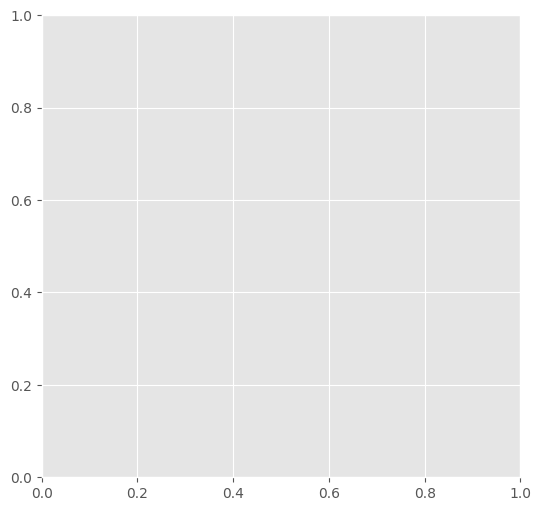

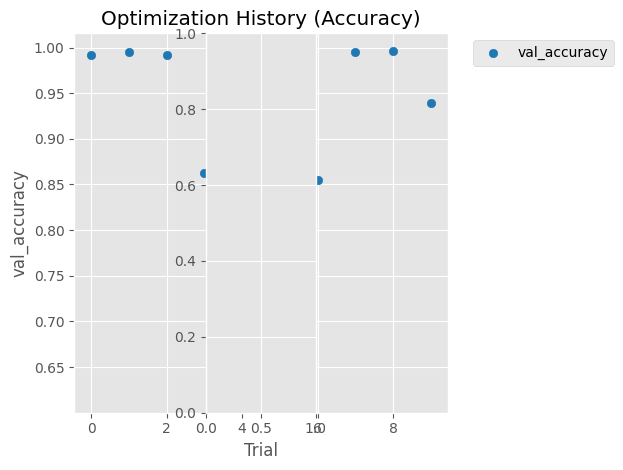

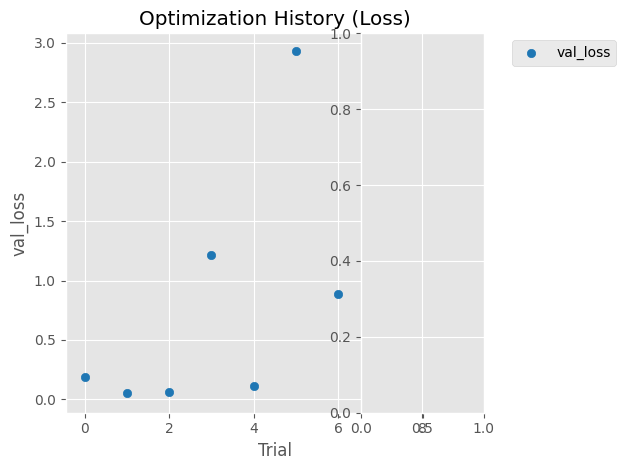

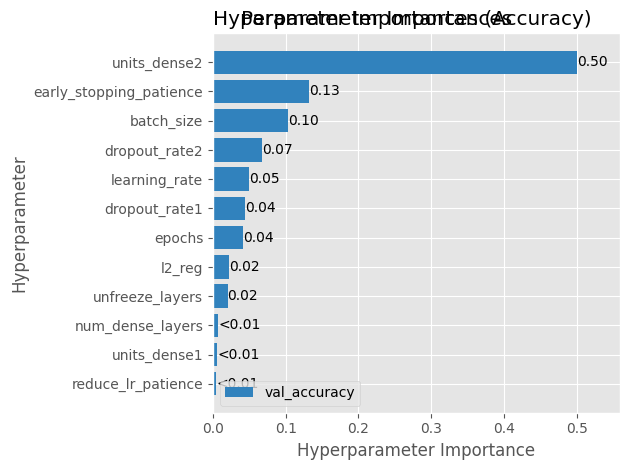

source2: /notebooks/train3/all_malware/8
name_save_model: fusion_MobileNet_tf_optunav28
Found 8400 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Found 1800 images belonging to 8 classes.
Lista de clases de malware a ser analizadas:
- sfone
- sillyp2p
- Allaple.A
- Ramnit
- wabot
- mira
- Kelihos_ver3
- ganelp

TRAINING AND EVALUATING FOLD 1/5...

Total params: 3789064
Trainable params: 2147400
Non-trainable params: 1641664
Epoch 1/50
262/262 [==============================] - 61s 185ms/step - loss: 2.1295 - accuracy: 0.8996 - val_loss: 1.8783 - val_accuracy: 0.9688 - lr: 6.6794e-05
Epoch 2/50
262/262 [==============================] - 47s 176ms/step - loss: 1.8139 - accuracy: 0.9802 - val_loss: 1.8225 - val_accuracy: 0.9520 - lr: 6.6794e-05
Epoch 3/50
262/262 [==============================] - 46s 174ms/step - loss: 1.7051 - accuracy: 0.9906 - val_loss: 1.6621 - val_accuracy: 0.9933 - lr: 6.6794e-05
Epoch 4/50
262/262 [==============================] - 43s 16

Model and History saved...
263/263 [==============================] - 33s 126ms/step - loss: 0.5830 - accuracy: 0.9996
Train Accuracy: 0.9996428489685059
Train Log Loss: 0.5829674005508423
57/57 [==============================] - 10s 143ms/step - loss: 0.6001 - accuracy: 0.9967
Validation Accuracy: 0.996666669845581
Validation Log Loss: 0.6000576615333557
57/57 [==============================] - 8s 140ms/step - loss: 0.6061 - accuracy: 0.9928
Test Accuracy: 0.9927777647972107
Test Log Loss: 0.606146514415741
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 224   0   0   1   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 220   0   5]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   3   0 221]]
True labels: 1800
Predicted labels: len(predicted_labels)


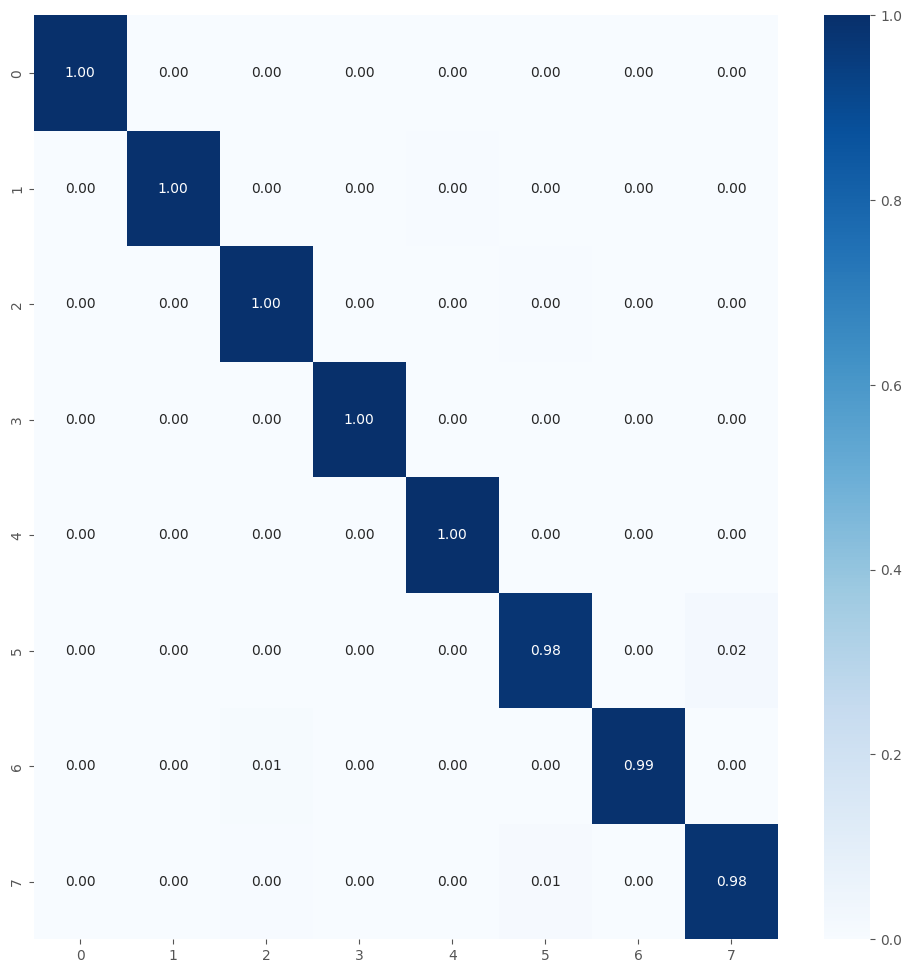


TRAINING AND EVALUATING FOLD 2/5...

Total params: 3789064
Trainable params: 2147400
Non-trainable params: 1641664
Epoch 1/50
262/262 [==============================] - 59s 182ms/step - loss: 2.1234 - accuracy: 0.8972 - val_loss: 1.8652 - val_accuracy: 0.9844 - lr: 6.6794e-05
Epoch 2/50
262/262 [==============================] - 46s 173ms/step - loss: 1.8252 - accuracy: 0.9787 - val_loss: 1.7805 - val_accuracy: 0.9827 - lr: 6.6794e-05
Epoch 3/50
262/262 [==============================] - 45s 172ms/step - loss: 1.7197 - accuracy: 0.9897 - val_loss: 1.6740 - val_accuracy: 0.9927 - lr: 6.6794e-05
Epoch 4/50
262/262 [==============================] - 42s 162ms/step - loss: 1.6215 - accuracy: 0.9929 - val_loss: 1.5908 - val_accuracy: 0.9900 - lr: 6.6794e-05
Epoch 5/50
262/262 [==============================] - 43s 162ms/step - loss: 1.5216 - accuracy: 0.9965 - val_loss: 1.4994 - val_accuracy: 0.9894 - lr: 6.6794e-05
Epoch 6/50
262/262 [==============================] - 48s 179ms/step - los

Model and History saved...
263/263 [==============================] - 35s 132ms/step - loss: 1.2506 - accuracy: 0.9989
Train Accuracy: 0.9989285469055176
Train Log Loss: 1.2505742311477661
57/57 [==============================] - 8s 144ms/step - loss: 1.2709 - accuracy: 0.9961
Validation Accuracy: 0.9961110949516296
Validation Log Loss: 1.2709181308746338
57/57 [==============================] - 9s 154ms/step - loss: 1.2633 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 1.2632877826690674
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 222   0   3]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   1   0 223]]
True labels: 1800
Predicted labels: len(predicted_labels)


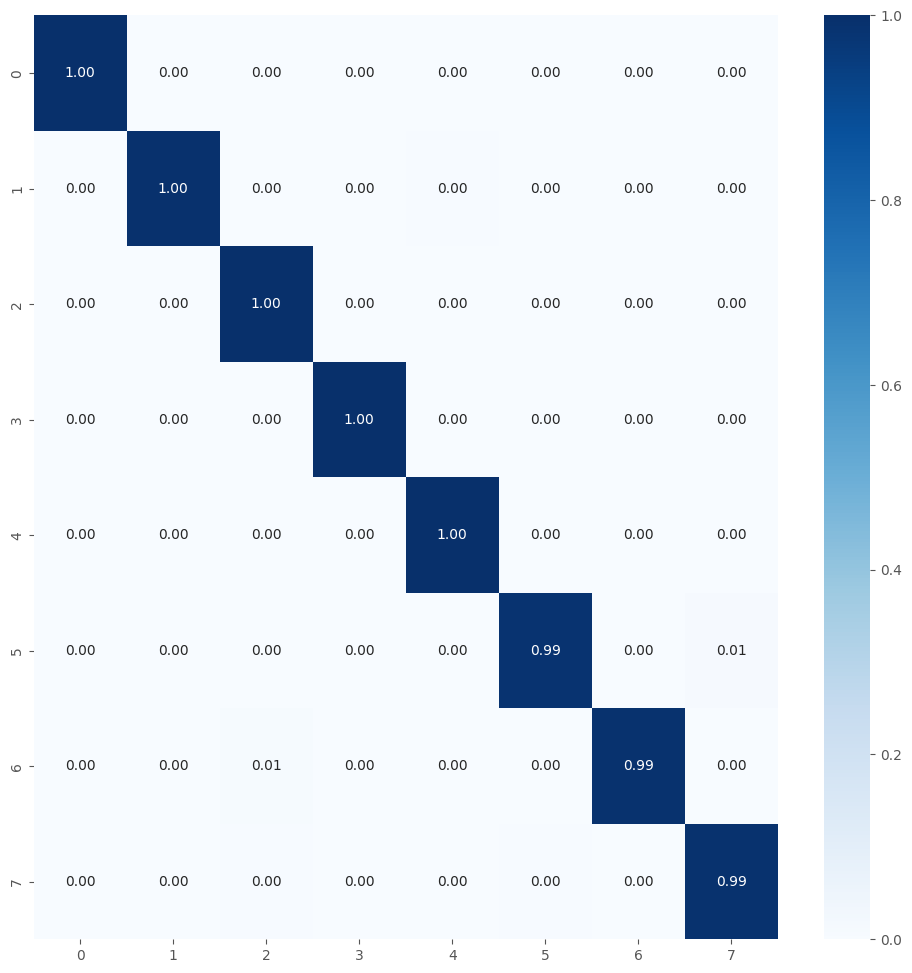


TRAINING AND EVALUATING FOLD 3/5...

Total params: 3789064
Trainable params: 2147400
Non-trainable params: 1641664
Epoch 1/50
262/262 [==============================] - 63s 190ms/step - loss: 2.1120 - accuracy: 0.9019 - val_loss: 1.8905 - val_accuracy: 0.9632 - lr: 6.6794e-05
Epoch 2/50
262/262 [==============================] - 48s 183ms/step - loss: 1.8106 - accuracy: 0.9821 - val_loss: 1.7457 - val_accuracy: 0.9905 - lr: 6.6794e-05
Epoch 3/50
262/262 [==============================] - 45s 171ms/step - loss: 1.7022 - accuracy: 0.9913 - val_loss: 1.7638 - val_accuracy: 0.9581 - lr: 6.6794e-05
Epoch 4/50
262/262 [==============================] - 46s 175ms/step - loss: 1.5998 - accuracy: 0.9941 - val_loss: 1.5480 - val_accuracy: 0.9939 - lr: 6.6794e-05
Epoch 5/50
262/262 [==============================] - 48s 184ms/step - loss: 1.4908 - accuracy: 0.9968 - val_loss: 1.4455 - val_accuracy: 0.9927 - lr: 6.6794e-05
Epoch 6/50
262/262 [==============================] - 45s 169ms/step - los

Model and History saved...
263/263 [==============================] - 37s 139ms/step - loss: 1.5292 - accuracy: 0.9995
Train Accuracy: 0.9995238184928894
Train Log Loss: 1.5292272567749023
57/57 [==============================] - 9s 143ms/step - loss: 1.5479 - accuracy: 0.9939
Validation Accuracy: 0.9938889145851135
Validation Log Loss: 1.5478575229644775
57/57 [==============================] - 8s 135ms/step - loss: 1.5492 - accuracy: 0.9939
Test Accuracy: 0.9938889145851135
Test Log Loss: 1.5491846799850464
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 224   0   1   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   5   0 219]]
True labels: 1800
Predicted labels: len(predicted_labels)

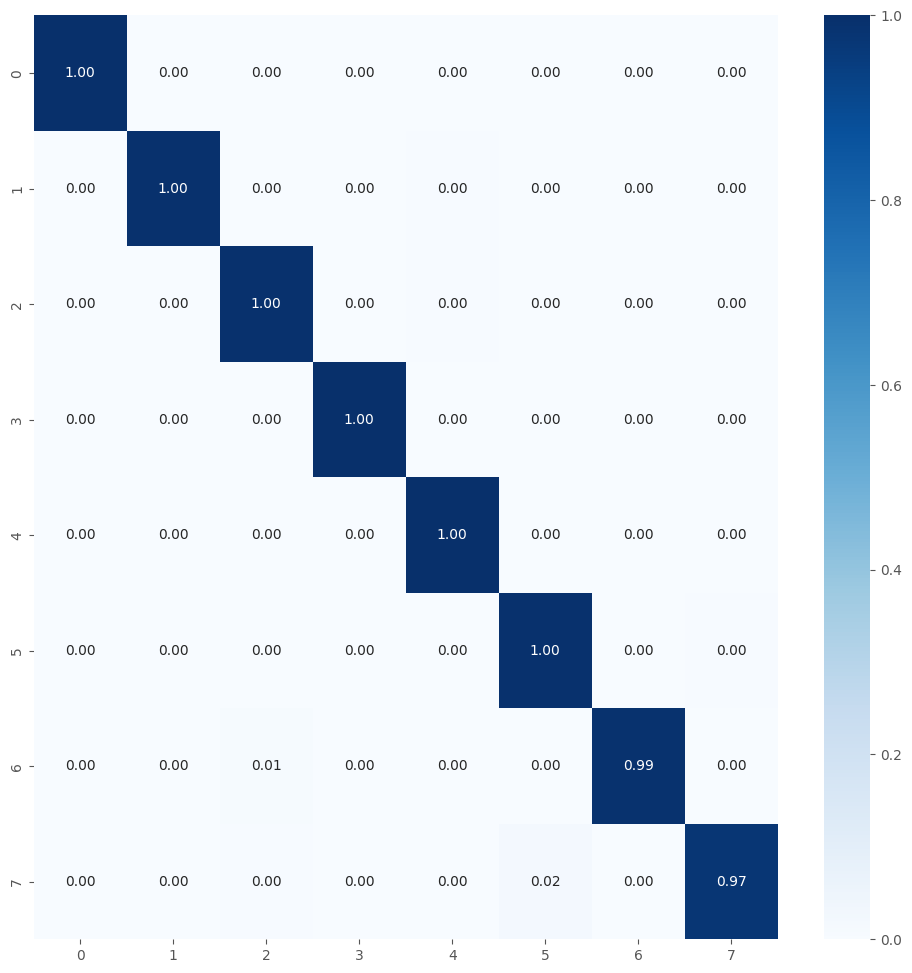


TRAINING AND EVALUATING FOLD 4/5...

Total params: 3789064
Trainable params: 2147400
Non-trainable params: 1641664
Epoch 1/50
262/262 [==============================] - 60s 181ms/step - loss: 2.1619 - accuracy: 0.8893 - val_loss: 2.1395 - val_accuracy: 0.8906 - lr: 6.6794e-05
Epoch 2/50
262/262 [==============================] - 47s 176ms/step - loss: 1.8253 - accuracy: 0.9808 - val_loss: 1.7666 - val_accuracy: 0.9855 - lr: 6.6794e-05
Epoch 3/50
262/262 [==============================] - 45s 173ms/step - loss: 1.7220 - accuracy: 0.9888 - val_loss: 1.7586 - val_accuracy: 0.9587 - lr: 6.6794e-05
Epoch 4/50
262/262 [==============================] - 51s 195ms/step - loss: 1.6242 - accuracy: 0.9922 - val_loss: 1.5842 - val_accuracy: 0.9905 - lr: 6.6794e-05
Epoch 5/50
262/262 [==============================] - 48s 183ms/step - loss: 1.5248 - accuracy: 0.9947 - val_loss: 1.4815 - val_accuracy: 0.9933 - lr: 6.6794e-05
Epoch 6/50
262/262 [==============================] - 45s 172ms/step - los

Model and History saved...
263/263 [==============================] - 23s 88ms/step - loss: 0.3565 - accuracy: 0.9989
Train Accuracy: 0.9989285469055176
Train Log Loss: 0.3565007448196411
57/57 [==============================] - 5s 86ms/step - loss: 0.3760 - accuracy: 0.9956
Validation Accuracy: 0.995555579662323
Validation Log Loss: 0.37601181864738464
57/57 [==============================] - 5s 87ms/step - loss: 0.3804 - accuracy: 0.9928
Test Accuracy: 0.9927777647972107
Test Log Loss: 0.3804468810558319
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   1   0   0   0]
 [  0   0 219   0   6   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   2   0 222]]
True labels: 1800
Predicted labels: len(predicted_labels)

C

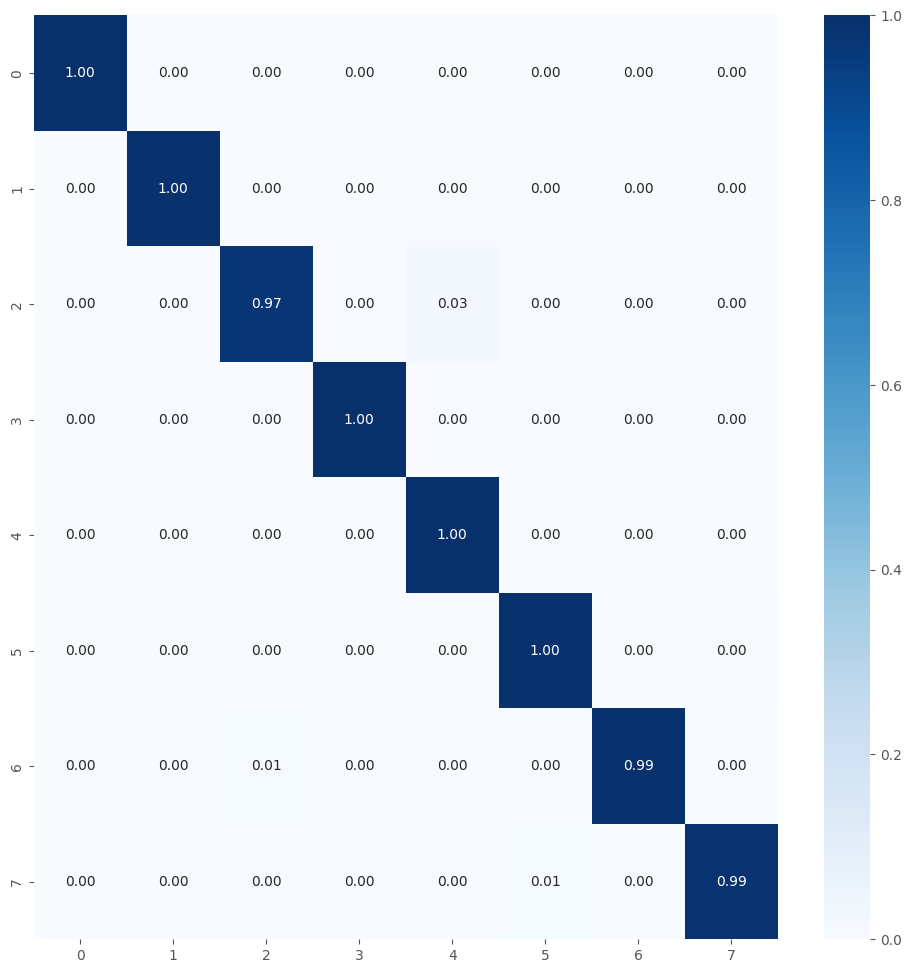


TRAINING AND EVALUATING FOLD 5/5...

Total params: 3789064
Trainable params: 2147400
Non-trainable params: 1641664
Epoch 1/50
262/262 [==============================] - 38s 116ms/step - loss: 2.1310 - accuracy: 0.8977 - val_loss: 1.8973 - val_accuracy: 0.9581 - lr: 6.6794e-05
Epoch 2/50
262/262 [==============================] - 29s 109ms/step - loss: 1.8209 - accuracy: 0.9800 - val_loss: 1.7498 - val_accuracy: 0.9911 - lr: 6.6794e-05
Epoch 3/50
262/262 [==============================] - 28s 106ms/step - loss: 1.7183 - accuracy: 0.9879 - val_loss: 1.6606 - val_accuracy: 0.9944 - lr: 6.6794e-05
Epoch 4/50
262/262 [==============================] - 36s 138ms/step - loss: 1.6167 - accuracy: 0.9933 - val_loss: 1.5703 - val_accuracy: 0.9939 - lr: 6.6794e-05
Epoch 5/50
262/262 [==============================] - 28s 106ms/step - loss: 1.5155 - accuracy: 0.9953 - val_loss: 1.4729 - val_accuracy: 0.9933 - lr: 6.6794e-05
Epoch 6/50
262/262 [==============================] - 29s 110ms/step - los

Model and History saved...
263/263 [==============================] - 41s 152ms/step - loss: 0.0772 - accuracy: 1.0000
Train Accuracy: 1.0
Train Log Loss: 0.0771791860461235
57/57 [==============================] - 9s 146ms/step - loss: 0.0988 - accuracy: 0.9961
Validation Accuracy: 0.9961110949516296
Validation Log Loss: 0.09876049309968948
57/57 [==============================] - 9s 143ms/step - loss: 0.0958 - accuracy: 0.9956
Test Accuracy: 0.995555579662323
Test Log Loss: 0.0957789197564125
Test labels: {'Allaple.A': 0, 'Kelihos_ver3': 1, 'Ramnit': 2, 'ganelp': 3, 'mira': 4, 'sfone': 5, 'sillyp2p': 6, 'wabot': 7}

Matriz de Confusión:
[[225   0   0   0   0   0   0   0]
 [  0 224   0   0   0   0   0   1]
 [  0   0 225   0   0   0   0   0]
 [  0   0   0 225   0   0   0   0]
 [  0   0   0   0 225   0   0   0]
 [  0   0   0   0   0 224   0   1]
 [  0   0   2   0   0   0 223   0]
 [  0   0   1   0   0   3   0 221]]
True labels: 1800
Predicted labels: len(predicted_labels)

Classificatio

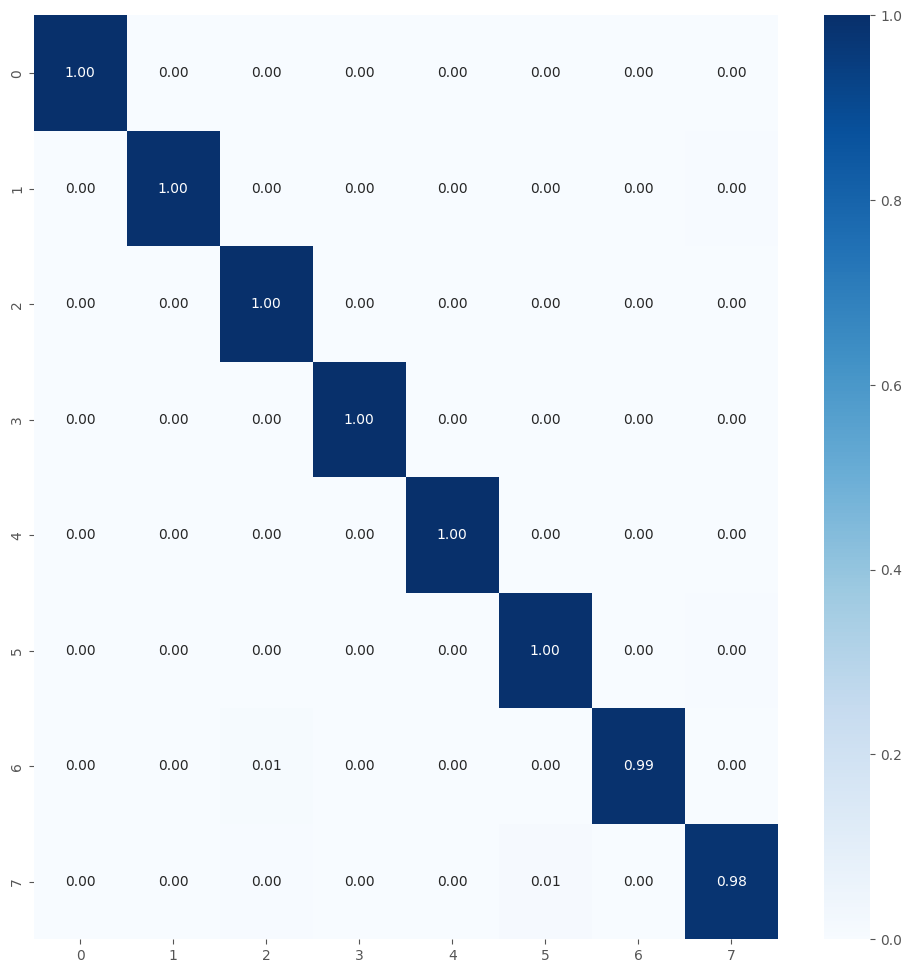

Average training accuracy in 5-fold: 0.9997131824493408
Average validation precision in 5-fold: 0.9956473231315612

Test Metrics
test_acc_list: [0.9927777647972107, 0.995555579662323, 0.9938889145851135, 0.9927777647972107, 0.995555579662323]
Average Test Accuracy with 5-fold: 0.9941111207008362
test_loss_list: [0.606146514415741, 1.2632877826690674, 1.5491846799850464, 0.3804468810558319, 0.0957789197564125]
Average Test Log Loss with 5-fold: 0.7789689555764199
Precision List: [0.9927972906932061, 0.9955823356607718, 0.9939492565751391, 0.9928725262798155, 0.9955822045458562]
Average Precision List with 5-fold: 0.9941567227509578
Recall List: [0.9927777777777778, 0.9955555555555556, 0.9938888888888888, 0.9927777777777778, 0.9955555555555555]
Average Recall List with 5-fold: 0.9941111111111111
F1 Score List: [0.9927801866049155, 0.9955567106759146, 0.9938860013001043, 0.9927845714780343, 0.9955554514465297]
Average F1 Score List with 5-fold: 0.9941125843010996

Metrics List Store

test

In [49]:
%%time

num_classes = 8
test_acc_list_all, test_loss_list_all, precision_list_all, recall_list_all, f1_score_list_all = exp(
    num_classes, nombre_modelo, source, save_model, test_acc_list_all, test_loss_list_all, precision_list_all, 
    recall_list_all, f1_score_list_all)

In [51]:
test_acc_list_all = [0.9995555520057678, 1.0, 0.9975555419921875, 0.9932444453239441, 0.9924444437026978, 0.9930158853530884, 0.9941111207008362, 0.99288889169693, 0.9656000018119812, 0.9510303139686584, 0.9533333301544189, 0.9519999980926513, 0.9128253936767579, 0.9038814783096314]
test_loss_list_all = [0.36616288125514984, 2.109271466732025, 0.26639568582177164, 0.05584298893809318, 0.10026702284812927, 0.2997454941272736, 0.7789689555764199, 0.08012475967407226, 0.2840696156024933, 0.3010313153266907, 0.18727438449859618, 0.1504259943962097, 0.38466861844062805, 0.45039026737213134]
precision_list_all = [0.9995575221238937, 1.0, 0.9975721933007347, 0.9933000841200172, 0.9925045134013925, 0.9930853633362023, 0.9941567227509578, 0.9929365960407279, 0.9656328476720379, 0.9503973051069117, 0.952715974146525, 0.9513257967060442, 0.9203006830598749, 0.9127813579430999]
recall_list_all = [0.9995555555555555, 1.0, 0.9975555555555555, 0.9932444444444444, 0.9924444444444445, 0.993015873015873, 0.9941111111111111, 0.9928888888888888, 0.9656, 0.9510303030303031, 0.9533333333333334, 0.952, 0.9128253968253969, 0.9038222222222222]
f1_score_list_all = [0.9995555533607574, 1.0, 0.9975555171460664, 0.9932413064730694, 0.9924397173565158, 0.9930141267030477, 0.9941125843010996, 0.9928787767329558, 0.965122387581127, 0.9505020915189352, 0.952713992053584, 0.950814050779843, 0.9117133712487229, 0.9016272747217032]

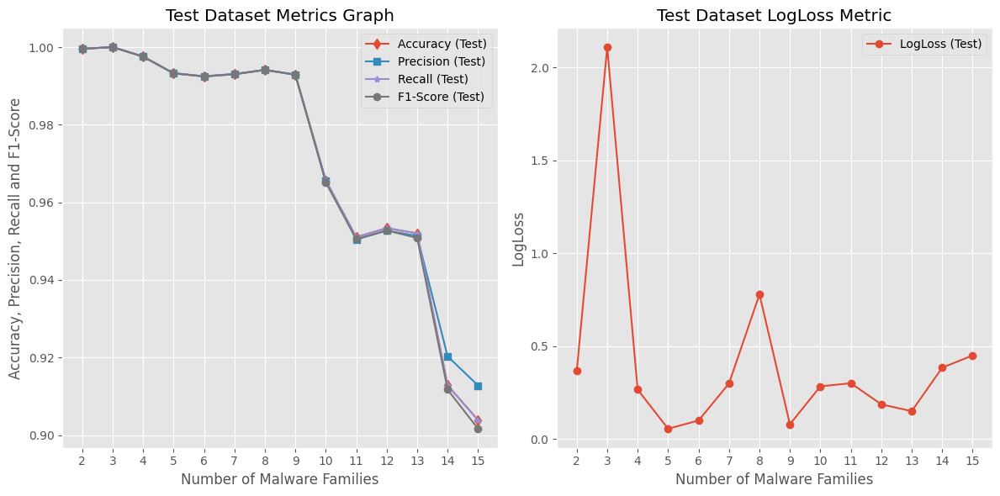

In [52]:
import matplotlib.pyplot as plt

# Datos históricos
strategies = [str(i) for i in range(2, len(test_acc_list_all) + 2)]

# Crear gráfico para Test Accuracy y Test LogLoss en una fila con dos columnas
fig, axes = plt.subplots(1, 2, figsize=(12, 6))


# Gráfico para Test Accuracy, Precision, Recall and F1-Score
axes[0].plot(strategies, test_acc_list_all, marker='d', label='Accuracy (Test)')
axes[0].plot(strategies, precision_list_all, marker='s', label='Precision (Test)')
axes[0].plot(strategies, recall_list_all, marker='*', label='Recall (Test)')
axes[0].plot(strategies, f1_score_list_all, marker='o', label='F1-Score (Test)')
axes[0].set_title('Test Dataset Metrics Graph')
axes[0].set_xlabel('Number of Malware Families')
axes[0].set_ylabel('Accuracy, Precision, Recall and F1-Score')
axes[0].legend()
axes[0].grid(True)

# Gráfico para Test LogLoss
axes[1].plot(strategies, test_loss_list_all, marker='o', label='LogLoss (Test)')
axes[1].set_title('Test Dataset LogLoss Metric')
axes[1].set_xlabel('Number of Malware Families')
axes[1].set_ylabel('LogLoss')
axes[1].legend()
axes[1].grid(True)

plt.tight_layout()
plt.show()
